<a href="https://colab.research.google.com/github/AndreiAf02/Transfer_Learning_Fine_Tuning_Update/blob/main/Simulation_Fine_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Simulated Data - Fine-tuning Transfer Learning

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from time import perf_counter



from sklearn.preprocessing import StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
# !pip install pytorch-tabnet

# from pytorch_tabnet.tab_model import TabNetClassifier
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


from sklearn.datasets import make_classification
import random

from imblearn.datasets import make_imbalance


In [28]:
dataset_size = 50000
nfeatures = 20
ninformative = 20

k = 5


X, y = make_classification(n_samples=dataset_size, n_features=nfeatures, n_informative=ninformative,
                           n_redundant=nfeatures-ninformative, n_classes=2, random_state=42)

X, y = make_imbalance(X, y, sampling_strategy={0: int(dataset_size/2), 1:int(dataset_size/(2*k))},
                              random_state=42)

X = X.astype(int)

# X[:,:int(ninformative/2)] = X[:,:int(ninformative/2)].astype(int)

X = pd.DataFrame(X)
y = pd.DataFrame(y)

y

## Creating binary features:
X.iloc[:,0]= (X.iloc[:,0] >= -1.5).astype(int)
X.iloc[:,1]= (X.iloc[:,1] >= -1.).astype(int)
X.iloc[:,2:5]= (X.iloc[:,2:5] >= 0).astype(int)


## Creating categorical features:
bins1 = [-15, -5, 5, 15]
labels1 = [0, 1, 2]
X.iloc[:, 5] = (pd.cut(X.iloc[:, 5], bins=bins1, labels=labels1, right=False).astype(int)).astype('category')
for i in range(2):
  X.iloc[:, i+6] = (pd.cut(X.iloc[:, i+6], bins=bins1, labels=labels1, right=False).astype(int) +int(10-2*i)).astype('category')

## Second group of categorical features:
bins2 = [-15, -3, 0, 3, 15]
labels2 = [0, 1, 2, 3]
for i in range(2):
  X.iloc[:, i+8] = (pd.cut(X.iloc[:, i+8], bins=bins2, labels=labels2, right=False).astype(int) +int(5+i)).astype('category')


data_total = X
data_total['Y'] = y
data_total = data_total.dropna().reset_index(drop=True)
data_total





##  -------------------- Creating source label y2 using related information and noise from y: ------------------------

weighting = [0.9, 0.1]

length1 = len(data_total[data_total['Y']==0])
length2 = len(data_total[data_total['Y']==1])

## Creating random noise around y to create similar information for y2:
random.seed(42)
range1 = random.choices([0, 1], weights = weighting, k=length1)
range2 = random.choices([0, -1], weights = weighting, k=length2)
range_total = range1+range2

## Converting the original y-feature to source label y2, and creating new y-feature with noise
data_total['Y2'] = data_total['Y']
data_total['Y'] = data_total['Y'] + range_total

data_total


<ipython-input-28-fdc592739d5b>:32: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0        1
1        1
2        1
3        1
4        0
        ..
29995    1
29996    1
29997    1
29998    1
29999    1
Name: 5, Length: 30000, dtype: category
Categories (3, int64): [0, 1, 2]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.iloc[:, 5] = (pd.cut(X.iloc[:, 5], bins=bins1, labels=labels1, right=False).astype(int)).astype('category')
<ipython-input-28-fdc592739d5b>:34: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0        11
1        11
2        11
3        11
4        11
         ..
29995    11
29996    11
29997    11
29998    11
29999    11
Name: 6, Length: 30000, dtype: category
Categories (3, int64): [10, 11, 12]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,Y,Y2
0,1,1,1,0,1,1,11,9,7,8,...,2,-1,-2,-3,1,1,0,2,0,0
1,1,1,1,1,0,1,11,9,7,7,...,1,-1,0,0,-1,2,2,0,0,0
2,0,1,1,0,1,1,11,9,7,8,...,-1,0,0,0,0,-1,-2,0,0,0
3,1,1,1,1,1,1,11,9,7,8,...,2,2,4,1,0,-3,-3,2,0,0
4,0,1,1,1,0,0,11,9,7,6,...,4,-4,-1,-1,-3,2,4,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,1,1,1,0,1,1,11,9,8,8,...,0,3,0,4,3,3,-4,5,1,1
29996,0,1,1,1,0,1,11,9,7,8,...,-3,1,-4,0,0,3,0,-2,1,1
29997,1,1,0,1,1,1,11,9,7,7,...,6,-2,2,2,-2,3,-3,-1,1,1
29998,1,0,1,1,0,1,11,9,7,8,...,1,-2,-2,0,3,1,0,-3,1,1


In [29]:
data_total['Y'].value_counts()

,count
Y,
0,23016
1,6984


In [30]:
data_total['Y2'].value_counts()

,count
Y2,
0,25000
1,5000


In [31]:
X = data_total.iloc[:, :-2]
y = data_total.iloc[:,-2]
y2 = data_total.iloc[:,-1]
y

,Y
0,0
1,0
2,0
3,0
4,0
...,...
29995,1
29996,1
29997,1
29998,1


In [32]:
y.corr(y2)

np.float64(0.7075148912774188)

In [19]:
y.value_counts()

,count
Y,
0,21014
1,8986


In [20]:
y2.value_counts()

,count
Y2,
0,25000
1,5000


In [21]:
X.iloc[:,0].value_counts()

,count
0,
1,23310
0,6690


In [22]:
## Scaling the predictive data

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_scaled = pd.DataFrame(X_scaled)

In [23]:
data2 = pd.concat([X_scaled, y, y2], axis=1)
data2

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,Y,Y2
0,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.583333,0.476190,0.409091,0.380952,0.50,0.523810,0.541667,0.545455,0,0
1,1.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,...,0.541667,0.476190,0.500000,0.523810,0.40,0.571429,0.625000,0.454545,0,0
2,0.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.458333,0.523810,0.500000,0.523810,0.45,0.428571,0.458333,0.454545,0,0
3,1.0,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,...,0.583333,0.619048,0.681818,0.571429,0.45,0.333333,0.416667,0.545455,0,0
4,0.0,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.666667,0.000000,...,0.666667,0.333333,0.454545,0.476190,0.30,0.571429,0.708333,0.590909,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,1.0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,1.000000,0.666667,...,0.500000,0.666667,0.500000,0.714286,0.60,0.619048,0.375000,0.681818,1,1
29996,0.0,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,...,0.375000,0.571429,0.318182,0.523810,0.45,0.619048,0.541667,0.363636,1,1
29997,1.0,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,...,0.750000,0.428571,0.590909,0.619048,0.35,0.619048,0.416667,0.409091,1,1
29998,1.0,0.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,...,0.541667,0.428571,0.409091,0.523810,0.60,0.523810,0.541667,0.318182,1,1


In [24]:
y.value_counts()

,count
Y,
0,21014
1,8986


In [13]:
y2.value_counts()

,count
Y2,
1,23310
0,6690


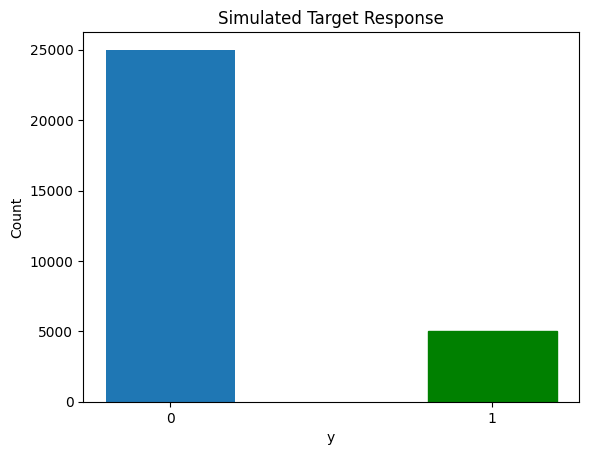

In [14]:
barlist = plt.bar([str(0),str(1)], y.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y")
plt.ylabel("Count")
plt.title("Simulated Target Response")
plt.show()

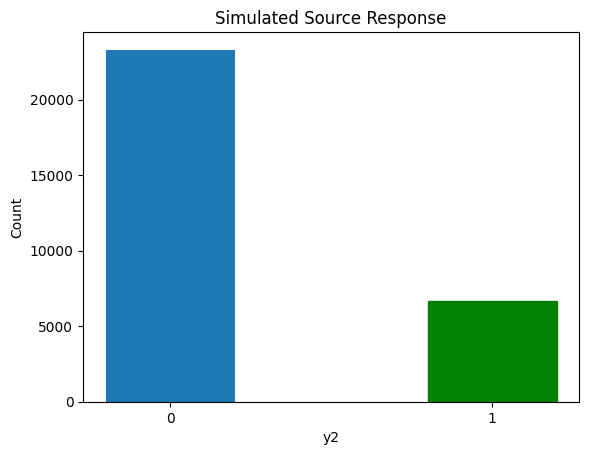

In [15]:
barlist = plt.bar([str(0),str(1)], y2.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y2")
plt.ylabel("Count")
plt.title("Simulated Source Response")
plt.show()

# Splitting for Source and Target Domains:


# Full Dataset:


In [16]:
data2.iloc[:,0].value_counts()

,count
0,
1.0,19827
0.0,10173


In [17]:
data_S = data2[data2[0] >= 0.5].reset_index(drop=True)  ## Source domain and classification - Men
data_S_X = data_S.iloc[:,:-2]
data_S_y = data_S.iloc[:, -1]

data_S_full = pd.concat([data_S_X, data_S_y], axis=1)

data_T = data2[data2[0] < 0.5].reset_index(drop=True) ## Target domain and classification - Women

data_T_X = data_T.iloc[:,:-2]
data_T_y = data_T.iloc[:, -2]    ## Response variable of interest in Default

data_T_full = pd.concat([data_T_X, data_T_y], axis=1)

In [18]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,Y2
0,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,0.500000,0.50,0.583333,0.476190,0.409091,0.380952,0.50,0.523810,0.541667,0.545455,1
1,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,0.545455,0.45,0.541667,0.476190,0.500000,0.523810,0.40,0.571429,0.625000,0.454545,1
2,1.0,1.0,0.0,1.0,0.5,0.5,0.5,0.666667,0.666667,0.545455,0.35,0.458333,0.523810,0.500000,0.523810,0.45,0.428571,0.458333,0.454545,0
3,1.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.666667,0.454545,0.55,0.583333,0.619048,0.681818,0.571429,0.45,0.333333,0.416667,0.545455,1
4,1.0,1.0,1.0,0.0,0.0,0.5,0.5,0.666667,0.000000,0.500000,0.15,0.666667,0.333333,0.454545,0.476190,0.30,0.571429,0.708333,0.590909,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19822,1.0,1.0,0.0,0.0,0.5,0.5,0.5,0.666667,0.333333,0.363636,0.50,0.500000,0.476190,0.500000,0.523810,0.50,0.619048,0.541667,0.500000,1
19823,1.0,1.0,0.0,1.0,0.5,0.5,0.5,1.000000,0.666667,0.454545,0.55,0.500000,0.666667,0.500000,0.714286,0.60,0.619048,0.375000,0.681818,1
19824,1.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.666667,0.363636,0.55,0.375000,0.571429,0.318182,0.523810,0.45,0.619048,0.541667,0.363636,0
19825,1.0,0.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,0.454545,0.50,0.750000,0.428571,0.590909,0.619048,0.35,0.619048,0.416667,0.409091,1


In [19]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,Y
0,0.0,0.0,1.0,0.0,0.5,0.5,0.5,0.666667,1.000000,0.500000,0.35,0.500000,0.428571,0.454545,0.476190,0.40,0.380952,0.583333,0.454545,0
1,0.0,1.0,1.0,1.0,0.5,0.5,0.5,0.333333,1.000000,0.500000,0.55,0.750000,0.761905,0.409091,0.380952,0.45,0.476190,0.291667,0.454545,0
2,0.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,1.000000,0.590909,0.55,0.666667,0.476190,0.590909,0.380952,0.50,0.238095,0.541667,0.272727,0
3,0.0,0.0,0.0,1.0,0.5,0.5,0.5,0.000000,0.333333,0.454545,0.35,0.541667,0.523810,0.454545,0.571429,0.45,0.476190,0.500000,0.500000,0
4,0.0,1.0,1.0,0.0,0.5,0.5,0.5,1.000000,0.333333,0.590909,0.40,0.500000,0.380952,0.500000,0.523810,0.45,0.619048,0.625000,0.409091,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10168,0.0,1.0,1.0,0.0,0.5,0.5,0.5,0.666667,0.333333,0.454545,0.50,0.583333,0.761905,0.409091,0.523810,0.60,0.523810,0.500000,0.454545,1
10169,0.0,1.0,0.0,0.0,1.0,0.5,1.0,0.333333,0.666667,0.318182,0.50,0.541667,0.523810,0.500000,0.523810,0.55,0.666667,0.541667,0.409091,1
10170,0.0,1.0,1.0,1.0,0.5,0.5,0.5,0.666667,0.333333,0.409091,0.65,0.666667,0.523810,0.500000,0.714286,0.40,0.380952,0.416667,0.454545,1
10171,0.0,1.0,1.0,1.0,0.5,0.5,0.5,0.333333,0.666667,0.500000,0.70,0.625000,0.380952,0.409091,0.571429,0.45,0.523810,0.541667,0.318182,1


## Source domain and task labels:

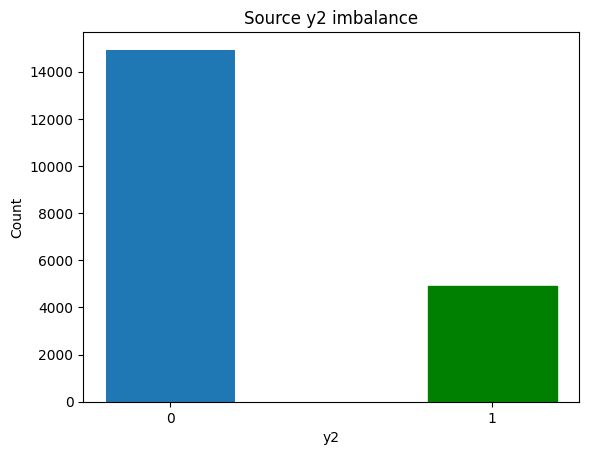

In [20]:
barlist_S = plt.bar([str(0),str(1)], data_S_y.value_counts(), width = 0.4)
barlist_S[1].set_color('g')

plt.xlabel("y2")
plt.ylabel("Count")
plt.title("Source y2 imbalance")
plt.show()

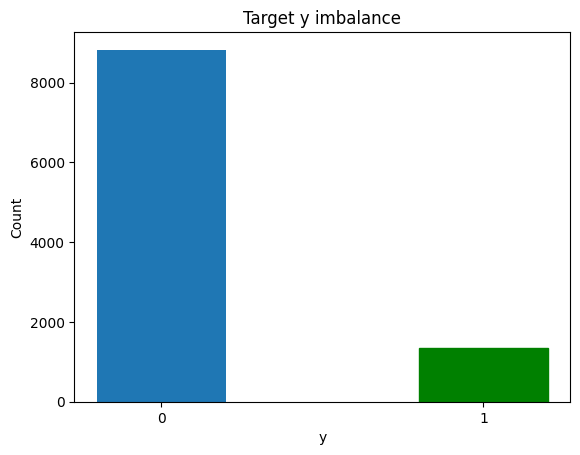

In [21]:
barlist_T = plt.bar([str(0),str(1)], data_T_y.value_counts(), width = 0.4)
barlist_T[1].set_color('g')

plt.xlabel("y")
plt.ylabel("Count")
plt.title("Target y imbalance")
plt.show()

## Updated Code (Modified from Shreya's code):

In [22]:
def create_dnn_model(input_shape):
  model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
    ])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

  model.summary()
  print(len(model.layers))

  return model

# def create_dnn_model(input_shape):
#   model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
#         layers.Dense(32, activation='relu'),
#         layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
#     ])

#   model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

#   return model



def train_and_evaluate(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    model.save('model.h5')
    model.save_weights('model_wt.weights.h5')

    return model


In [23]:
def train_and_evaluate_nosave(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])

    print(fpr)
    print(fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    return fpr, fnr


In [24]:
def fine_tuning(X_train, X_test, y_train, y_test, llim, ulim):
    new_model = create_dnn_model(X_S_train.shape[1])
    # new_model = tf.keras.models.load_model('model.h5')
    new_model.load_weights('model_wt.weights.h5')

    for layer in new_model.layers[llim:ulim]:
        layer.trainable = False
    for layer in new_model.layers[-1:]:
        layer.trainable = False

    for layer in new_model.layers:
        if layer.trainable == True:
          print("Trainable")
        else:
          print("Not Trainable")

    fpr, fnr = train_and_evaluate_nosave(new_model, X_train, X_test, y_train, y_test, "Target")
    return fpr, fnr

In [25]:
def Transductive_TL(model, X_test, y_test, domain):

    time_start = perf_counter()

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    # print('Confusion matrix:', conf_matrix)
    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    tnr = 1-fpr

    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])
    tpr = 1 - fnr
    print('FPR', fpr, 'TPR:', tpr, 'FNR:', fnr, 'TNR:', tnr)
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")
    print('False Negative Rate:', fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

# Over/undersampling functions:

## Undersampling functions:

In [26]:
import random

def SRS_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=False)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :-1]
    y_SRS = data_SRS_RUS.iloc[:, -1]

    return X_SRS, y_SRS


def SRSwR_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=True)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :-1]
    y_SRS = data_SRS_RUS.iloc[:, -1]

    return X_SRS, y_SRS


def systematic_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.randint(1, int(k))
    print(start)
    Row = []
    for i in range(undersample_size):
      row = start+int(k*i)-1
      Row.append(row)
    print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :-1]
    y_Sy = data_Sy_RUS.iloc[:, -1]

    return X_Sy, y_Sy



def multi_systematic_undersampler(data, data_column, m):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.sample(range(1, int(k*m)), m)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/m)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :-1]
    y_Sy = data_Sy_RUS.iloc[:, -1]

    return X_Sy, y_Sy

## Oversampling functions:

In [29]:
def SRSwR_oversampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_min_ros = data_minority.sample(n=oversample_size - undersample_size, replace=True)
    data_SRS_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_SRS = data_SRS_ROS.iloc[:, :-1]
    y_SRS = data_SRS_ROS.iloc[:, -1]

    return X_SRS, y_SRS

# data_S_min_ros = data_S_minority.sample(n=oversample_size - undersample_size, replace=True)


def systematic_resampler(data, data_column, k):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    Nsamples = k*(oversample_size-undersample_size)/undersample_size
    print('Nsamples=', Nsamples)

    np.random.seed(123)
    start = np.random.choice(int(k), int(Nsamples), replace=True)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/k)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    data_min_ros = pd.DataFrame()
    data_min_ros = data_minority.iloc[Row]

    data_Sy_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_Sy = data_Sy_ROS.iloc[:, :-1]
    y_Sy = data_Sy_ROS.iloc[:, -1]

    return X_Sy, y_Sy



In [28]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(data_S_X, data_S_y, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)

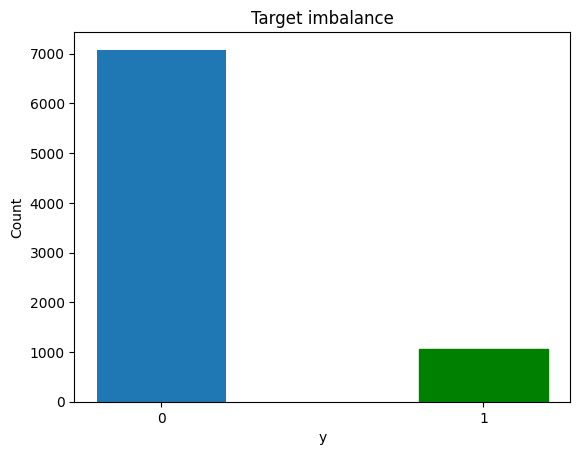

In [30]:
barlist = plt.bar([str(0),str(1)], y_T_train.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("y")
plt.ylabel("Count")
plt.title("Target imbalance")
plt.show()

In [31]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (15861, 19)
y_S_train: (15861,)
X_S_test: (3966, 19)
y_S_test: (3966,)


# Original (Imbalanced) dataset:

## Standard Machine Learning:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - AUC: 0.5779 - loss: 0.4199 - val_AUC: 0.8306 - val_loss: 0.2945
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8766 - loss: 0.2412 - val_AUC: 0.8763 - val_loss: 0.2528
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9158 - loss: 0.1933 - val_AUC: 0.8920 - val_loss: 0.2489
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9263 - loss: 0.1929 - val_AUC: 0.8916 - val_loss: 0.2344
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9310 - loss: 0.1816 - val_AUC: 0.9018 - val_loss: 0.2435
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9342 - loss: 0.1788 - val_AUC: 0.9096 - val_loss: 0.2228
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9348 - loss: 0.1755 - val_AUC: 0.9119 - val_loss: 0.2339
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9393 - loss: 0.1696 - val_AUC: 0.9137 - val_loss: 0.2234
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

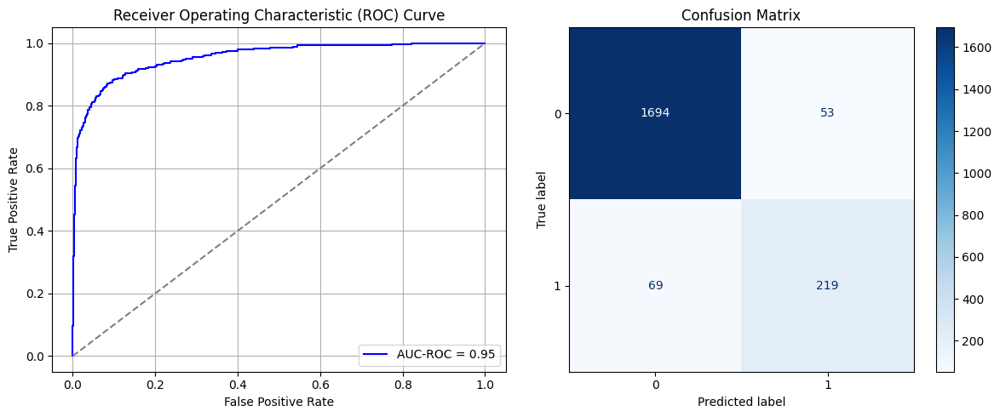

Best threshold based on F1-score: 0.6353867053985596
Time elapsed (performance): 19.22606800899996


<Sequential name=sequential, built=True>

In [32]:
model_source = create_dnn_model(X_S_train.shape[1])
train_and_evaluate(model_source, X_T_train, X_T_test, y_T_train, y_T_test, "Target")

## With Transfer Learning:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - AUC: 0.5483 - loss: 0.5716 - val_AUC: 0.6499 - val_loss: 0.5353
Epoch 2/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - AUC: 0.6585 - loss: 0.5264 - val_AUC: 0.7025 - val_loss: 0.5279
Epoch 3/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6789 - loss: 0.5126 - val_AUC: 0.7291 - val_loss: 0.4921
Epoch 4/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7238 - loss: 0.4948 - val_AUC: 0.7435 - val_loss: 0.4904
Epoch 5/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7331 - loss: 0.4911 - val_AUC: 0.7532 - val_loss: 0.5345
Epoch 6/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7666 - loss: 0.4690 - val_AUC: 0.7721 - val_loss: 0.4706
Epoch 7/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7819 - loss: 0.4625 - val_AUC: 0.7894 - val_loss: 0.4533
Epoch 8/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7969 - loss: 0.4488 - val_AUC: 0.7860 - val_loss: 0.4907
Epoch 9/10
397/397 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step -

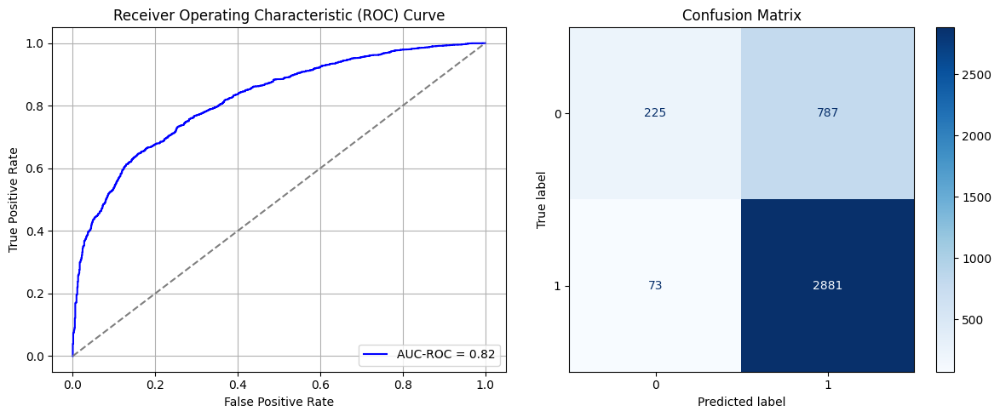

Best threshold based on F1-score: 0.5946298837661743
Time elapsed (performance): 27.157384056999945


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - AUC: 0.5224 - loss: 1.4349 - val_AUC: 0.5035 - val_loss: 0.4081
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.5329 - loss: 0.3966 - val_AUC: 0.5102 - val_loss: 0.4058
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5296 - loss: 0.3912 - val_AUC: 0.5283 - val_loss: 0.4035
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5589 - loss: 0.3856 - val_AUC: 0.5430 - val_loss: 0.4004
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5502 - loss: 0.3887 - val_AUC: 0.5455 - val_loss: 0.4011
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5672 - loss: 0.3888 - val_AUC: 0.5655 - val_loss: 0.3976
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5893 - loss: 0.3694 - val_AUC: 0.5908 - val_loss: 0.3937
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6030 - loss: 0.3724 - val_AUC: 0.6095 - val_loss: 0.3913
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - A

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.5226 - loss: 1.4089 - val_AUC: 0.5005 - val_loss: 0.4078
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5364 - loss: 0.3881 - val_AUC: 0.5034 - val_loss: 0.4078
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5383 - loss: 0.3756 - val_AUC: 0.5215 - val_loss: 0.4048
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5320 - loss: 0.3873 - val_AUC: 0.5446 - val_loss: 0.4004
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5525 - loss: 0.3904 - val_AUC: 0.5561 - val_loss: 0.3984
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5705 - loss: 0.3763 - val_AUC: 0.5748 - val_loss: 0.3956
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5995 - loss: 0.3850 - val_AUC: 0.5802 - val_loss: 0.3969
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6119 - loss: 0.3714 - val_AUC: 0.6173 - val_loss: 0.3908
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.6301 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.5260 - loss: 1.4620 - val_AUC: 0.4926 - val_loss: 0.4093
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.5276 - loss: 0.3841 - val_AUC: 0.5118 - val_loss: 0.4056
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5195 - loss: 0.3881 - val_AUC: 0.5303 - val_loss: 0.4029
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5782 - loss: 0.3870 - val_AUC: 0.5367 - val_loss: 0.4012
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5829 - loss: 0.3753 - val_AUC: 0.5689 - val_loss: 0.3969
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6008 - loss: 0.3793 - val_AUC: 0.5797 - val_loss: 0.3958
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6116 - loss: 0.3758 - val_AUC: 0.6155 - val_loss: 0.3911
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6257 - loss: 0.3784 - val_AUC: 0.6342 - val_loss: 0.3883
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6556 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.5407 - loss: 1.4045 - val_AUC: 0.4934 - val_loss: 0.4089
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5227 - loss: 0.3907 - val_AUC: 0.5087 - val_loss: 0.4069
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5346 - loss: 0.3774 - val_AUC: 0.5343 - val_loss: 0.4029
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.5379 - loss: 0.3837 - val_AUC: 0.5436 - val_loss: 0.4004
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5557 - loss: 0.3741 - val_AUC: 0.5598 - val_loss: 0.3982
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5508 - loss: 0.3864 - val_AUC: 0.5683 - val_loss: 0.3981
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5860 - loss: 0.3698 - val_AUC: 0.5901 - val_loss: 0.3938
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5934 - loss: 0.3695 - val_AUC: 0.6119 - val_loss: 0.3908
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6178 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - AUC: 0.5115 - loss: 1.4812 - val_AUC: 0.5028 - val_loss: 0.4078
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5188 - loss: 0.3922 - val_AUC: 0.5178 - val_loss: 0.4048
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5350 - loss: 0.3857 - val_AUC: 0.5316 - val_loss: 0.4021
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5559 - loss: 0.3958 - val_AUC: 0.5411 - val_loss: 0.4004
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5635 - loss: 0.3928 - val_AUC: 0.5665 - val_loss: 0.3966
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5827 - loss: 0.3838 - val_AUC: 0.5593 - val_loss: 0.4050
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6096 - loss: 0.3862 - val_AUC: 0.6078 - val_loss: 0.3913
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6114 - loss: 0.3797 - val_AUC: 0.6317 - val_loss: 0.3884
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6462 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - AUC: 0.5296 - loss: 1.4563 - val_AUC: 0.4946 - val_loss: 0.4083
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5389 - loss: 0.3895 - val_AUC: 0.5114 - val_loss: 0.4055
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5396 - loss: 0.3907 - val_AUC: 0.5214 - val_loss: 0.4034
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5422 - loss: 0.3976 - val_AUC: 0.5327 - val_loss: 0.4016
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5148 - loss: 0.3926 - val_AUC: 0.5574 - val_loss: 0.3986
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5791 - loss: 0.3678 - val_AUC: 0.5870 - val_loss: 0.3975
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5826 - loss: 0.3896 - val_AUC: 0.5959 - val_loss: 0.3933
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6371 - loss: 0.3738 - val_AUC: 0.6143 - val_loss: 0.3904
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6358 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.5420 - loss: 1.4186 - val_AUC: 0.4924 - val_loss: 0.4083
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.4987 - loss: 0.3842 - val_AUC: 0.5175 - val_loss: 0.4049
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5305 - loss: 0.4008 - val_AUC: 0.5208 - val_loss: 0.4049
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5429 - loss: 0.3862 - val_AUC: 0.5461 - val_loss: 0.4000
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.5530 - loss: 0.3744 - val_AUC: 0.5633 - val_loss: 0.3970
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5860 - loss: 0.3844 - val_AUC: 0.5892 - val_loss: 0.3942
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6152 - loss: 0.3793 - val_AUC: 0.5864 - val_loss: 0.4022
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6078 - loss: 0.3834 - val_AUC: 0.6317 - val_loss: 0.3896
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6493 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.5096 - loss: 1.4806 - val_AUC: 0.5020 - val_loss: 0.4080
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5062 - loss: 0.3905 - val_AUC: 0.5194 - val_loss: 0.4056
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5478 - loss: 0.3723 - val_AUC: 0.5232 - val_loss: 0.4044
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5505 - loss: 0.4015 - val_AUC: 0.5357 - val_loss: 0.4017
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5551 - loss: 0.3624 - val_AUC: 0.5537 - val_loss: 0.3989
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5760 - loss: 0.3762 - val_AUC: 0.5513 - val_loss: 0.4012
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5871 - loss: 0.3883 - val_AUC: 0.5784 - val_loss: 0.3954
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6056 - loss: 0.3574 - val_AUC: 0.5890 - val_loss: 0.3941
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6019 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.5507 - loss: 1.4244 - val_AUC: 0.4880 - val_loss: 0.4119
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5124 - loss: 0.3894 - val_AUC: 0.5093 - val_loss: 0.4060
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5228 - loss: 0.3808 - val_AUC: 0.5307 - val_loss: 0.4022
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5378 - loss: 0.3931 - val_AUC: 0.5582 - val_loss: 0.3985
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5882 - loss: 0.3839 - val_AUC: 0.5783 - val_loss: 0.3955
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6286 - loss: 0.3639 - val_AUC: 0.6130 - val_loss: 0.3933
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6088 - loss: 0.3675 - val_AUC: 0.6288 - val_loss: 0.3894
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6348 - loss: 0.3843 - val_AUC: 0.6306 - val_loss: 0.3920
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6649 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.5547 - loss: 1.4264 - val_AUC: 0.4963 - val_loss: 0.4089
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5215 - loss: 0.3831 - val_AUC: 0.5125 - val_loss: 0.4055
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5152 - loss: 0.3849 - val_AUC: 0.5297 - val_loss: 0.4030
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5702 - loss: 0.3814 - val_AUC: 0.5281 - val_loss: 0.4037
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5609 - loss: 0.3822 - val_AUC: 0.5429 - val_loss: 0.4009
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5751 - loss: 0.3832 - val_AUC: 0.5622 - val_loss: 0.3986
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5925 - loss: 0.3719 - val_AUC: 0.5948 - val_loss: 0.3966
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6118 - loss: 0.3785 - val_AUC: 0.5967 - val_loss: 0.3954
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6418 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.5307 - loss: 1.4440 - val_AUC: 0.4924 - val_loss: 0.4094
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.5324 - loss: 0.3981 - val_AUC: 0.5207 - val_loss: 0.4051
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.5727 - loss: 0.3822 - val_AUC: 0.5477 - val_loss: 0.4006
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5826 - loss: 0.3936 - val_AUC: 0.5477 - val_loss: 0.4015
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5650 - loss: 0.3979 - val_AUC: 0.5789 - val_loss: 0.3969
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5950 - loss: 0.3790 - val_AUC: 0.6107 - val_loss: 0.3918
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6341 - loss: 0.3735 - val_AUC: 0.6117 - val_loss: 0.3923
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6509 - loss: 0.3745 - val_AUC: 0.6304 - val_loss: 0.3918
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6577 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.5340 - loss: 1.4090 - val_AUC: 0.4913 - val_loss: 0.4086
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.4932 - loss: 0.3963 - val_AUC: 0.5096 - val_loss: 0.4060
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5265 - loss: 0.3746 - val_AUC: 0.5274 - val_loss: 0.4030
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5585 - loss: 0.3676 - val_AUC: 0.5459 - val_loss: 0.4003
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5806 - loss: 0.3763 - val_AUC: 0.5560 - val_loss: 0.3985
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5544 - loss: 0.3933 - val_AUC: 0.5850 - val_loss: 0.3954
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5770 - loss: 0.3766 - val_AUC: 0.6074 - val_loss: 0.3932
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6114 - loss: 0.3785 - val_AUC: 0.6287 - val_loss: 0.3897
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6350 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.5302 - loss: 1.4469 - val_AUC: 0.4959 - val_loss: 0.4080
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5143 - loss: 0.3941 - val_AUC: 0.5176 - val_loss: 0.4048
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5369 - loss: 0.3870 - val_AUC: 0.5221 - val_loss: 0.4042
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5412 - loss: 0.3854 - val_AUC: 0.5420 - val_loss: 0.4004
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5632 - loss: 0.3887 - val_AUC: 0.5525 - val_loss: 0.3991
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5767 - loss: 0.3855 - val_AUC: 0.5602 - val_loss: 0.3982
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5742 - loss: 0.3991 - val_AUC: 0.5902 - val_loss: 0.3956
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6227 - loss: 0.3619 - val_AUC: 0.6197 - val_loss: 0.3905
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6081 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - AUC: 0.5468 - loss: 1.3787 - val_AUC: 0.4893 - val_loss: 0.4097
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5007 - loss: 0.3862 - val_AUC: 0.5261 - val_loss: 0.4038
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5614 - loss: 0.3791 - val_AUC: 0.5417 - val_loss: 0.4008
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5542 - loss: 0.3811 - val_AUC: 0.5557 - val_loss: 0.3984
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5691 - loss: 0.3707 - val_AUC: 0.5893 - val_loss: 0.3943
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6101 - loss: 0.3673 - val_AUC: 0.6093 - val_loss: 0.3916
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6404 - loss: 0.3610 - val_AUC: 0.6332 - val_loss: 0.3888
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6572 - loss: 0.3738 - val_AUC: 0.6460 - val_loss: 0.3859
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6631 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.5123 - loss: 1.4641 - val_AUC: 0.4950 - val_loss: 0.4088
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5375 - loss: 0.3898 - val_AUC: 0.5114 - val_loss: 0.4058
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5124 - loss: 0.3780 - val_AUC: 0.5244 - val_loss: 0.4033
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5529 - loss: 0.3874 - val_AUC: 0.5309 - val_loss: 0.4014
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5674 - loss: 0.3714 - val_AUC: 0.5505 - val_loss: 0.3994
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5789 - loss: 0.3831 - val_AUC: 0.5563 - val_loss: 0.3988
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5788 - loss: 0.3800 - val_AUC: 0.5749 - val_loss: 0.3970
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6143 - loss: 0.3780 - val_AUC: 0.5878 - val_loss: 0.3965
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6359 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - AUC: 0.5410 - loss: 1.4011 - val_AUC: 0.4941 - val_loss: 0.4087
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.4922 - loss: 0.3806 - val_AUC: 0.5137 - val_loss: 0.4051
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5330 - loss: 0.3910 - val_AUC: 0.5285 - val_loss: 0.4027
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5566 - loss: 0.3970 - val_AUC: 0.5353 - val_loss: 0.4021
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5469 - loss: 0.3769 - val_AUC: 0.5544 - val_loss: 0.3982
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5785 - loss: 0.3784 - val_AUC: 0.5659 - val_loss: 0.3978
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6011 - loss: 0.3862 - val_AUC: 0.6047 - val_loss: 0.3922
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6313 - loss: 0.3768 - val_AUC: 0.6282 - val_loss: 0.3896
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6483 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - AUC: 0.5274 - loss: 1.4601 - val_AUC: 0.4992 - val_loss: 0.4081
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5061 - loss: 0.3889 - val_AUC: 0.5176 - val_loss: 0.4053
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5150 - loss: 0.3834 - val_AUC: 0.5283 - val_loss: 0.4029
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5657 - loss: 0.3951 - val_AUC: 0.5408 - val_loss: 0.4006
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5548 - loss: 0.3831 - val_AUC: 0.5573 - val_loss: 0.3984
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5658 - loss: 0.3926 - val_AUC: 0.5700 - val_loss: 0.3972
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5957 - loss: 0.3833 - val_AUC: 0.5876 - val_loss: 0.3942
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5780 - loss: 0.3766 - val_AUC: 0.6067 - val_loss: 0.3923
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - A

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.5211 - loss: 1.4214 - val_AUC: 0.4973 - val_loss: 0.4077
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5401 - loss: 0.3897 - val_AUC: 0.5210 - val_loss: 0.4037
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5350 - loss: 0.3859 - val_AUC: 0.5473 - val_loss: 0.4012
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5525 - loss: 0.3831 - val_AUC: 0.5603 - val_loss: 0.3980
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5804 - loss: 0.3883 - val_AUC: 0.5810 - val_loss: 0.3957
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6092 - loss: 0.3710 - val_AUC: 0.6087 - val_loss: 0.3917
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6084 - loss: 0.3750 - val_AUC: 0.6240 - val_loss: 0.3895
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6275 - loss: 0.3787 - val_AUC: 0.6452 - val_loss: 0.3859
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6635 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - AUC: 0.5225 - loss: 1.4437 - val_AUC: 0.4929 - val_loss: 0.4086
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5095 - loss: 0.3972 - val_AUC: 0.5107 - val_loss: 0.4067
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.5399 - loss: 0.3815 - val_AUC: 0.5259 - val_loss: 0.4031
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.5339 - loss: 0.3754 - val_AUC: 0.5407 - val_loss: 0.4006
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5546 - loss: 0.3719 - val_AUC: 0.5544 - val_loss: 0.3983
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5712 - loss: 0.3804 - val_AUC: 0.5577 - val_loss: 0.3994
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5636 - loss: 0.3823 - val_AUC: 0.5817 - val_loss: 0.3974
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6152 - loss: 0.3791 - val_AUC: 0.6089 - val_loss: 0.3916
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6310 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/keras/src

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,617 (29.75 KB)

 Trainable params: 7,617 (29.75 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


204/204 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - AUC: 0.5330 - loss: 1.4461 - val_AUC: 0.4976 - val_loss: 0.4082
Epoch 2/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.5274 - loss: 0.4031 - val_AUC: 0.5091 - val_loss: 0.4063
Epoch 3/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5452 - loss: 0.4022 - val_AUC: 0.5259 - val_loss: 0.4035
Epoch 4/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5424 - loss: 0.3856 - val_AUC: 0.5412 - val_loss: 0.4009
Epoch 5/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5592 - loss: 0.3853 - val_AUC: 0.5545 - val_loss: 0.3986
Epoch 6/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5664 - loss: 0.3857 - val_AUC: 0.5614 - val_loss: 0.3983
Epoch 7/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5762 - loss: 0.3848 - val_AUC: 0.5788 - val_loss: 0.3965
Epoch 8/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.5958 - loss: 0.3757 - val_AUC: 0.6061 - val_loss: 0.3928
Epoch 9/10
204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6208 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [33]:
times_train = 1
times_fine_tune = 20


FPR = []
FNR = []

for i in range(times_train):
  model_source = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train, X_T_test, y_T_train, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

In [34]:
print('Mean:', ParamFit['FNR'].mean())
print('Var:', ParamFit['FNR'].var())

Mean: 1.0
Var: 0.0


In [ ]:
print(ParamFit)
ParamFit.to_csv('Fine_Tuning_Imbalanced.csv')

         FPR       FNR
0   0.009670  0.866667
1   0.000000  0.982609
2   0.004656  0.927536
3   0.000000  0.976812
4   0.001433  0.924638
..       ...       ...
95  0.003582  0.915942
96  0.011819  0.855072
97  0.010745  0.849275
98  0.004656  0.901449
99  0.003940  0.901449

[100 rows x 2 columns]


In [ ]:
ParamFit['FNR'].mean()

np.float64(0.8940869565217392)

# Random Undersampling (RUS) to balance Dataset:

## SRS Sample without Replacement:

In [ ]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,10,11,Y2
0,0.301370,0.000,0.044131,0.000000,0.000000,0.0,0.00,0.0,0.021740,0.0,0.397959,0.0,1
1,0.452055,0.125,0.048052,0.666667,0.071429,0.2,0.00,0.0,0.000000,0.0,0.122449,0.0,1
2,0.287671,0.250,0.137581,0.166667,0.142857,0.0,0.00,0.0,0.000000,0.0,0.397959,0.0,0
3,0.493151,0.250,0.150486,0.666667,0.142857,0.2,0.25,0.0,0.000000,0.0,0.397959,0.0,0
4,0.479452,0.125,0.133519,0.666667,0.071429,0.2,0.00,0.0,0.000000,0.0,0.448980,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
31932,0.424658,0.500,0.227956,0.166667,0.285714,0.0,0.00,0.0,0.000000,0.0,0.397959,0.0,1
31933,0.219178,0.250,0.157583,0.000000,0.214286,0.6,0.00,0.0,0.000000,0.0,0.397959,0.0,1
31934,0.287671,0.250,0.245379,0.666667,0.214286,0.2,0.00,0.0,0.000000,0.0,0.500000,0.0,1
31935,0.369863,0.250,0.048444,0.166667,0.000000,0.6,0.50,0.0,0.054551,0.0,0.397959,0.0,1


In [ ]:
X_S_SRS, y_S_SRS = SRS_undersampler(data_S_full, data_S_full['Y2'])
# print(y_S_SRS)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

T_train['Y'].value_counts()

X_T_train_SRS, y_T_train_SRS = SRS_undersampler(T_train, T_train.iloc[:,-1])
print(y_T_train_SRS)

8393
23544
1391
11156
13225    0
12868    0
8838     0
15268    0
2830     0
        ..
2163     1
6921     1
9893     1
2897     1
14116    1
Name: Y, Length: 2782, dtype: int64


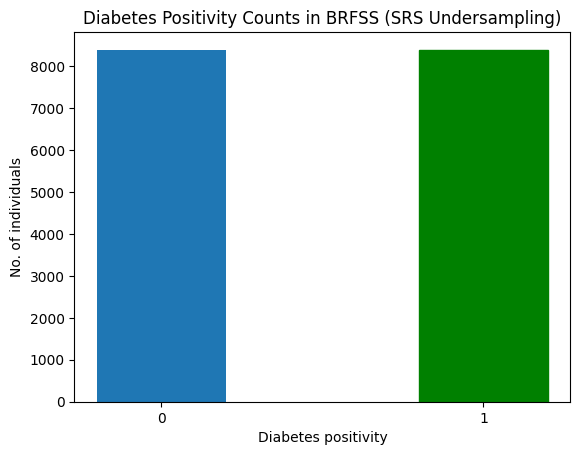

In [ ]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRS Undersampling)")
plt.show()

In [ ]:
data_T_y.value_counts()

,count
Y,
0,13948
1,1736


In [ ]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (13428, 12)
y_S_train: (13428,)
X_S_test: (3358, 12)
y_S_test: (3358,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7172 - loss: 0.6236 - val_AUC: 0.7799 - val_loss: 0.5569
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7592 - loss: 0.5780 - val_AUC: 0.8113 - val_loss: 0.5449
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7865 - loss: 0.5603 - val_AUC: 0.8191 - val_loss: 0.5283
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7965 - loss: 0.5496 - val_AUC: 0.8176 - val_loss: 0.5330
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8009 - loss: 0.5442 - val_AUC: 0.8248 - val_loss: 0.5196
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8052 - loss: 0.5377 - val_AUC: 0.8197 - val_loss: 0.5251
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8155 - loss: 0.5263 - val_AUC: 0.8268 - val_loss: 0.5156
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8142 - loss: 0.5256 - val_AUC: 0.8296 - val_loss: 0.5082
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

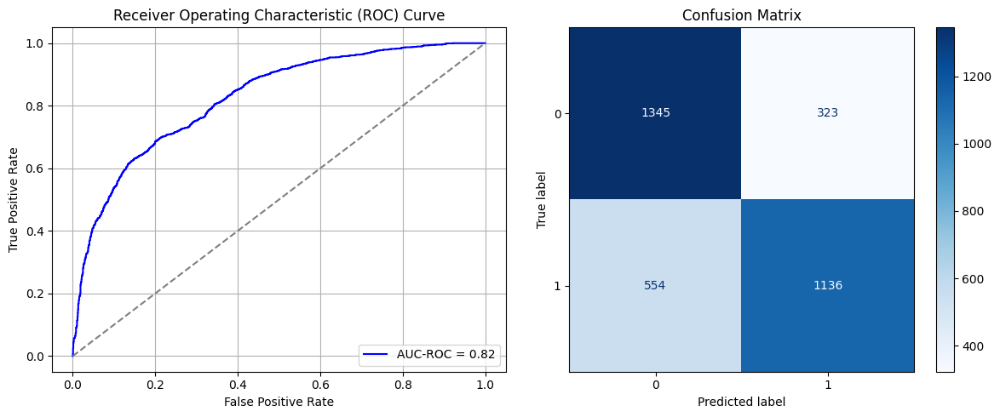

Best threshold based on F1-score: 0.29385635256767273
Time elapsed (performance): 15.729665068000031


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_742 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_743 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_744 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_745 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_746 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_747 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_748 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.6497 - loss: 0.6501 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6419 - loss: 0.6293 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6715 - loss: 0.6129 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6792 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6943 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6925 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8311
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7129 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7120 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_749 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_750 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_751 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_752 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_753 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_754 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_755 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6342 - loss: 0.6603 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6452 - loss: 0.6289 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6687 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6704 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6880 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.7931
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6874 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9499
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6873 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7076 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6216 - loss: 0.6684 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6195 - loss: 0.6410 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6706 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.8447
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6755 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6807 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6859 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7037 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.7802
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7164 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6513 - loss: 0.6457 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6244 - loss: 0.6391 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6517 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.9451
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6859 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6567 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6948 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.7873
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7024 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7085 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6246 - loss: 0.6672 - val_AUC: 0.0000e+00 - val_loss: 0.9530
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6331 - loss: 0.6406 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6354 - loss: 0.6305 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6681 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6751 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.8477
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6583 - loss: 0.6096 - val_AUC: 0.0000e+00 - val_loss: 0.8060
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6872 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7024 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6154 - loss: 0.6725 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6532 - loss: 0.6326 - val_AUC: 0.0000e+00 - val_loss: 0.9368
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6473 - loss: 0.6173 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6823 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6887 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6759 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6955 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6963 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6446 - loss: 0.6595 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6465 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6629 - loss: 0.6201 - val_AUC: 0.0000e+00 - val_loss: 0.9226
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6515 - loss: 0.6301 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6660 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 0.7858
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6626 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6908 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7154 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.9379
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_113"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_791 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_792 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_793 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_794 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_795 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_796 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_797 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6491 - loss: 0.6467 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6385 - loss: 0.6315 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6440 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.9008
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6695 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6811 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9373
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6806 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7051 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7145 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_114"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_798 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_799 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_800 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_801 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_802 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_803 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_804 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6134 - loss: 0.6836 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6330 - loss: 0.6304 - val_AUC: 0.0000e+00 - val_loss: 0.9335
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6711 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.8871
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6777 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6863 - loss: 0.6049 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6832 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6952 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.7353
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6971 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.7327
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_115"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_805 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_806 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_807 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_808 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_809 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_810 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_811 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6432 - loss: 0.6531 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6350 - loss: 0.6348 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6460 - loss: 0.6347 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6750 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6721 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.9373
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7009 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.9318
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6899 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6953 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_116"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_812 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_813 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_814 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_815 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_816 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_817 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_818 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6524 - loss: 0.6523 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6553 - loss: 0.6221 - val_AUC: 0.0000e+00 - val_loss: 0.8098
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6492 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6663 - loss: 0.6145 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6734 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6824 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6832 - loss: 0.6072 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6844 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_117"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_819 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_820 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_821 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_822 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_823 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_824 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_825 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6460 - loss: 0.6525 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6350 - loss: 0.6302 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6672 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6618 - loss: 0.6174 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6848 - loss: 0.6100 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6772 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6791 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.7900
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6889 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.7826
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_118"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_826 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_827 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_828 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_829 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_830 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_831 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_832 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6409 - loss: 0.6525 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6414 - loss: 0.6347 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6569 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6521 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6700 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.9663
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6843 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 0.7779
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6866 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7000 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_119"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_833 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_834 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_835 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_836 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_837 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_838 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_839 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6332 - loss: 0.6559 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6189 - loss: 0.6339 - val_AUC: 0.0000e+00 - val_loss: 0.7876
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6376 - loss: 0.6313 - val_AUC: 0.0000e+00 - val_loss: 0.7993
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6798 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6695 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.8342
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6958 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.7877
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6837 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6840 - loss: 0.6137 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_120"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_840 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_841 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_842 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_843 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_844 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_845 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_846 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6493 - loss: 0.6477 - val_AUC: 0.0000e+00 - val_loss: 0.9279
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6570 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6394 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6640 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6729 - loss: 0.6074 - val_AUC: 0.0000e+00 - val_loss: 0.8073
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6870 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.9150
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6831 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.8065
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7029 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_847 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_848 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_849 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_850 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_851 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_852 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_853 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6499 - loss: 0.6545 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6411 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6594 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6776 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6638 - loss: 0.6163 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6639 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6748 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6931 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_854 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_855 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_856 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_857 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_858 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_859 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_860 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6285 - loss: 0.6581 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6467 - loss: 0.6199 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6496 - loss: 0.6223 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6512 - loss: 0.6357 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6754 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6949 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.7212
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7027 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9405
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7247 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_861 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_862 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_863 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_864 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_865 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_866 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_867 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6421 - loss: 0.6597 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6665 - loss: 0.6100 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6497 - loss: 0.6245 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6763 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6844 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6742 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7151 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6912 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.7493
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_868 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_869 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_870 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_871 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_872 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_873 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_874 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6257 - loss: 0.6673 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6681 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6488 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6526 - loss: 0.6116 - val_AUC: 0.0000e+00 - val_loss: 0.7839
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6674 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6902 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9136
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7008 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6642 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.7850
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_875 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_876 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_877 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_878 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_879 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_880 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_881 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6381 - loss: 0.6636 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6363 - loss: 0.6257 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6575 - loss: 0.6181 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6535 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.8350
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6621 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6704 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6750 - loss: 0.6162 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6829 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_882 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_883 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_884 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_885 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_886 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_887 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_888 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6869 - loss: 0.6402 - val_AUC: 0.7823 - val_loss: 0.5613
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7607 - loss: 0.5771 - val_AUC: 0.7969 - val_loss: 0.5469
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7851 - loss: 0.5567 - val_AUC: 0.8083 - val_loss: 0.5465
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7913 - loss: 0.5544 - val_AUC: 0.8139 - val_loss: 0.5399
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7991 - loss: 0.5471 - val_AUC: 0.8148 - val_loss: 0.5335
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8082 - loss: 0.5366 - val_AUC: 0.8217 - val_loss: 0.5228
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8095 - loss: 0.5337 - val_AUC: 0.8258 - val_loss: 0.5234
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8096 - loss: 0.5322 - val_AUC: 0.8216 - val_loss: 0.5199
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

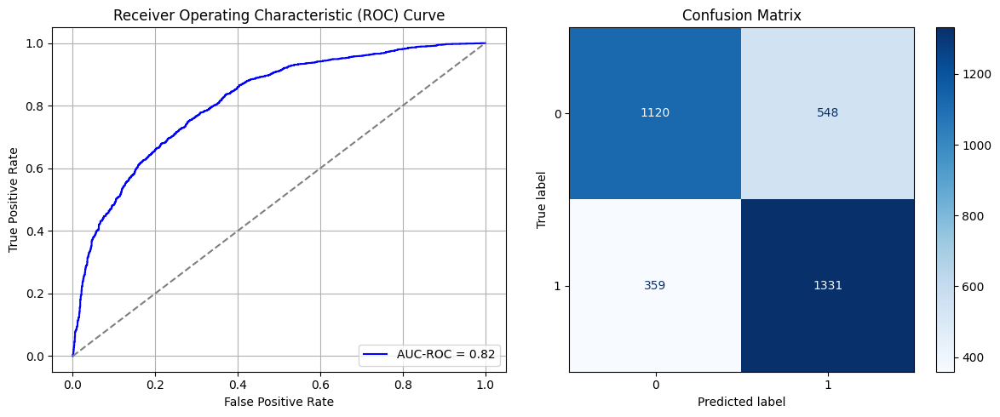

Best threshold based on F1-score: 0.41932958364486694
Time elapsed (performance): 15.658284665000792


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_889 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_890 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_891 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_892 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_893 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_894 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_895 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6943 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7314 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7436 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7668 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.6721
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7818 - loss: 0.5358 - val_AUC: 0.0000e+00 - val_loss: 0.9370
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7758 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.7318
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7891 - loss: 0.5266 - val_AUC: 0.0000e+00 - val_loss: 0.7102
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7886 - loss: 0.5245 - val_AUC: 0.0000e+00 - val_loss: 0.6919
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_896 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_897 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_898 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_899 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_900 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_901 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_902 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6995 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7237 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7326 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7504 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7550 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.6934
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7753 - loss: 0.5346 - val_AUC: 0.0000e+00 - val_loss: 0.6902
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7708 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.7651
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7728 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.6947
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_903 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_904 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_905 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_906 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_907 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_908 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_909 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7130 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7267 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7717
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7311 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7589 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.7446
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7722 - loss: 0.5312 - val_AUC: 0.0000e+00 - val_loss: 0.7429
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7691 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.7631
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7679 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7825 - loss: 0.5309 - val_AUC: 0.0000e+00 - val_loss: 0.6861
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_910 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_911 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_912 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_913 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_914 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_915 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_916 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6923 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.8180
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7253 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7495 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.7744
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7578 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7534 - loss: 0.5449 - val_AUC: 0.0000e+00 - val_loss: 0.7455
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7732 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.6905
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7894 - loss: 0.5277 - val_AUC: 0.0000e+00 - val_loss: 0.7751
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7723 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7889
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_917 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_918 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_919 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_920 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_921 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_922 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_923 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6837 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7397 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7462
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7421 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.7659
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7688 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.7295
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7695 - loss: 0.5410 - val_AUC: 0.0000e+00 - val_loss: 0.7700
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7789 - loss: 0.5329 - val_AUC: 0.0000e+00 - val_loss: 0.7178
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7895 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.7459
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7959 - loss: 0.5151 - val_AUC: 0.0000e+00 - val_loss: 0.7248
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_924 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_925 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_926 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_927 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_928 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_929 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_930 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7006 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.7661
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7133 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8234
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7507 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.7842
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7719 - loss: 0.5454 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7718 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7679 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.7191
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7819 - loss: 0.5288 - val_AUC: 0.0000e+00 - val_loss: 0.7310
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7813 - loss: 0.5310 - val_AUC: 0.0000e+00 - val_loss: 0.7198
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_931 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_932 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_933 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_934 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_935 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_936 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_937 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6748 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7102 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8428
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7279 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7966
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7405 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.7724
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7636 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.7677
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7711 - loss: 0.5365 - val_AUC: 0.0000e+00 - val_loss: 0.6741
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7836 - loss: 0.5343 - val_AUC: 0.0000e+00 - val_loss: 0.7181
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7899 - loss: 0.5263 - val_AUC: 0.0000e+00 - val_loss: 0.7777
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_938 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_939 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_940 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_941 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_942 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_943 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_944 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6976 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7241 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7493 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7627 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.7423
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7730 - loss: 0.5397 - val_AUC: 0.0000e+00 - val_loss: 0.6837
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7748 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.7572
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7903 - loss: 0.5210 - val_AUC: 0.0000e+00 - val_loss: 0.7552
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7952 - loss: 0.5188 - val_AUC: 0.0000e+00 - val_loss: 0.7475
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_945 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_946 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_947 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_948 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_949 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_950 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_951 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6932 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.7154
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7295 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7806
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7383 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.7770
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7591 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.7681
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7753 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.7793
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7589 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.7611
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7551 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.7594
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7864 - loss: 0.5158 - val_AUC: 0.0000e+00 - val_loss: 0.6630
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_952 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_953 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_954 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_955 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_956 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_957 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_958 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6605 - loss: 0.6293 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7143 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7404 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8378
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7510 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.7288
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7680 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7802 - loss: 0.5243 - val_AUC: 0.0000e+00 - val_loss: 0.7043
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7857 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7822 - loss: 0.5284 - val_AUC: 0.0000e+00 - val_loss: 0.6374
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_959 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_960 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_961 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_962 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_963 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_964 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_965 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7037 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.7937
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7587 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.7635
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7698 - loss: 0.5356 - val_AUC: 0.0000e+00 - val_loss: 0.7336
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7693 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.6629
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7589 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.7470
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7715 - loss: 0.5386 - val_AUC: 0.0000e+00 - val_loss: 0.7517
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7840 - loss: 0.5279 - val_AUC: 0.0000e+00 - val_loss: 0.7517
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_966 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_967 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_968 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_969 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_970 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_971 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_972 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7011 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7183 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7333 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.7934
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7603 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7761
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7690 - loss: 0.5380 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7953 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.7401
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7837 - loss: 0.5332 - val_AUC: 0.0000e+00 - val_loss: 0.7582
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7902 - loss: 0.5210 - val_AUC: 0.0000e+00 - val_loss: 0.6204
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_973 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_974 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_975 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_976 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_977 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_978 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_979 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7140 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.7997
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7263 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8170
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.7559
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7524 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7772 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.7480
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7669 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.8081
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7826 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.7237
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7796 - loss: 0.5329 - val_AUC: 0.0000e+00 - val_loss: 0.6906
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_980 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_981 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_982 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_983 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_984 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_985 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_986 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7013 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7196 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7456
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7425 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.7393
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7540 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.6983
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7784 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.7228
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7712 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7464
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7822 - loss: 0.5373 - val_AUC: 0.0000e+00 - val_loss: 0.6917
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7845 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_987 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_988 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_989 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_990 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_991 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_992 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_993 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6822 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7221 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.7745
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7301 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7005
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7465 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.6903
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7665 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.7689
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7750 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.7137
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7904 - loss: 0.5187 - val_AUC: 0.0000e+00 - val_loss: 0.6906
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7832 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.7444
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_994 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_995 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_996 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_999 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6956 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7229 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7464 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.7095
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7599 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.8085
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7801 - loss: 0.5380 - val_AUC: 0.0000e+00 - val_loss: 0.7043
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7646 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7837 - loss: 0.5215 - val_AUC: 0.0000e+00 - val_loss: 0.6810
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7866 - loss: 0.5269 - val_AUC: 0.0000e+00 - val_loss: 0.7407
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1001 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1002 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7063 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.7867
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7119 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7424 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7535 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.7485
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7666 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.7133
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7643 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.7898
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7889 - loss: 0.5234 - val_AUC: 0.0000e+00 - val_loss: 0.6981
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7951 - loss: 0.5168 - val_AUC: 0.0000e+00 - val_loss: 0.7155
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1014 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6772 - loss: 0.6249 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7281 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7454 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7499 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7752 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.7521
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7653 - loss: 0.5487 - val_AUC: 0.0000e+00 - val_loss: 0.6982
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7770 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7695 - loss: 0.5369 - val_AUC: 0.0000e+00 - val_loss: 0.6248
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1015 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6955 - loss: 0.6098 - val_AUC: 0.0000e+00 - val_loss: 0.7920
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7263 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7374 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.7392
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7659 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7786 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.8655
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7560 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.7780
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7837 - loss: 0.5260 - val_AUC: 0.0000e+00 - val_loss: 0.6147
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7815 - loss: 0.5270 - val_AUC: 0.0000e+00 - val_loss: 0.6768
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1022 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1023 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6969 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.7716
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7130 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7288 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.7463
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7624 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7684 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7730 - loss: 0.5419 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7704 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.7713
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7634 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1035 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7167 - loss: 0.6328 - val_AUC: 0.7752 - val_loss: 0.5590
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7552 - loss: 0.5786 - val_AUC: 0.7941 - val_loss: 0.5513
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7777 - loss: 0.5681 - val_AUC: 0.8105 - val_loss: 0.5349
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7810 - loss: 0.5651 - val_AUC: 0.8226 - val_loss: 0.5220
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7922 - loss: 0.5538 - val_AUC: 0.8257 - val_loss: 0.5260
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8069 - loss: 0.5364 - val_AUC: 0.8263 - val_loss: 0.5145
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8013 - loss: 0.5417 - val_AUC: 0.8125 - val_loss: 0.5348
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8130 - loss: 0.5266 - val_AUC: 0.8308 - val_loss: 0.5061
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

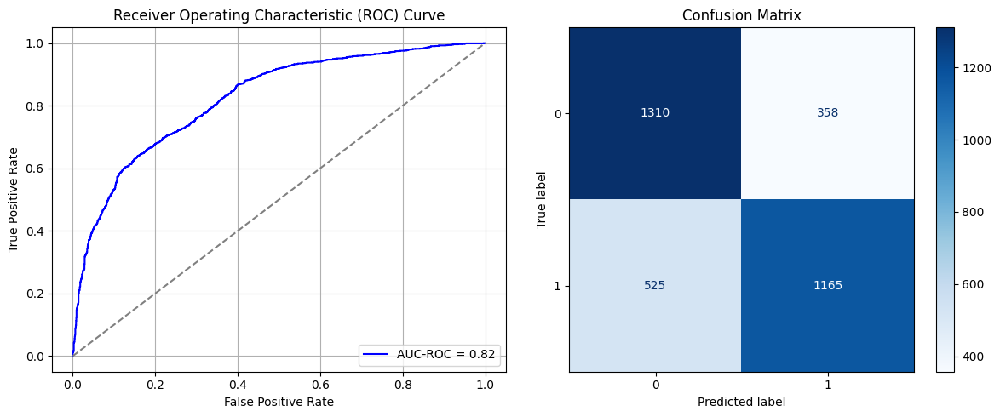

Best threshold based on F1-score: 0.32633522152900696
Time elapsed (performance): 17.366137823999452


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1036 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6889 - loss: 0.6330 - val_AUC: 0.0000e+00 - val_loss: 0.6917
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7381 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.5643
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7656 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7941 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.6614
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8107 - loss: 0.5122 - val_AUC: 0.0000e+00 - val_loss: 0.6990
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8040 - loss: 0.5157 - val_AUC: 0.0000e+00 - val_loss: 0.5774
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8136 - loss: 0.5037 - val_AUC: 0.0000e+00 - val_loss: 0.6960
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8142 - loss: 0.5059 - val_AUC: 0.0000e+00 - val_loss: 0.5930
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1043 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1044 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6718 - loss: 0.6436 - val_AUC: 0.0000e+00 - val_loss: 0.8073
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7237 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.7000
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7643 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.7918
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7750 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7175
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8078 - loss: 0.5157 - val_AUC: 0.0000e+00 - val_loss: 0.5990
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8135 - loss: 0.5090 - val_AUC: 0.0000e+00 - val_loss: 0.7220
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8324 - loss: 0.4879 - val_AUC: 0.0000e+00 - val_loss: 0.6835
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8077 - loss: 0.5071 - val_AUC: 0.0000e+00 - val_loss: 0.6700
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1056 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6748 - loss: 0.6430 - val_AUC: 0.0000e+00 - val_loss: 0.7705
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7214 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.6713
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7733 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.6564
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7964 - loss: 0.5329 - val_AUC: 0.0000e+00 - val_loss: 0.7104
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7993 - loss: 0.5234 - val_AUC: 0.0000e+00 - val_loss: 0.6945
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8146 - loss: 0.5028 - val_AUC: 0.0000e+00 - val_loss: 0.6588
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8038 - loss: 0.5110 - val_AUC: 0.0000e+00 - val_loss: 0.6121
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8217 - loss: 0.4955 - val_AUC: 0.0000e+00 - val_loss: 0.6730
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1057 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6777 - loss: 0.6436 - val_AUC: 0.0000e+00 - val_loss: 0.7740
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7179 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.7990
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7671 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.7329
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7790 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.6100
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8044 - loss: 0.5232 - val_AUC: 0.0000e+00 - val_loss: 0.6929
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8254 - loss: 0.4930 - val_AUC: 0.0000e+00 - val_loss: 0.6619
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8058 - loss: 0.5124 - val_AUC: 0.0000e+00 - val_loss: 0.7322
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8132 - loss: 0.5090 - val_AUC: 0.0000e+00 - val_loss: 0.6302
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1064 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1065 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7013 - loss: 0.6218 - val_AUC: 0.0000e+00 - val_loss: 0.7821
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7469 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.6894
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7690 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7928 - loss: 0.5276 - val_AUC: 0.0000e+00 - val_loss: 0.7632
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8000 - loss: 0.5192 - val_AUC: 0.0000e+00 - val_loss: 0.5982
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8228 - loss: 0.4995 - val_AUC: 0.0000e+00 - val_loss: 0.7453
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8128 - loss: 0.5024 - val_AUC: 0.0000e+00 - val_loss: 0.6211
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8164 - loss: 0.4992 - val_AUC: 0.0000e+00 - val_loss: 0.6688
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1077 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6719 - loss: 0.6444 - val_AUC: 0.0000e+00 - val_loss: 0.7263
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7277 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.6238
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7675 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7142
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8051 - loss: 0.5134 - val_AUC: 0.0000e+00 - val_loss: 0.6136
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8186 - loss: 0.5073 - val_AUC: 0.0000e+00 - val_loss: 0.7199
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8020 - loss: 0.5087 - val_AUC: 0.0000e+00 - val_loss: 0.6415
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8005 - loss: 0.5131 - val_AUC: 0.0000e+00 - val_loss: 0.6747
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8220 - loss: 0.4926 - val_AUC: 0.0000e+00 - val_loss: 0.6818
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1078 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6719 - loss: 0.6423 - val_AUC: 0.0000e+00 - val_loss: 0.7590
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7290 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.7379
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7737 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.6384
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7832 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.7367
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7830 - loss: 0.5281 - val_AUC: 0.0000e+00 - val_loss: 0.6803
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8044 - loss: 0.5149 - val_AUC: 0.0000e+00 - val_loss: 0.6819
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8247 - loss: 0.4950 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8294 - loss: 0.4872 - val_AUC: 0.0000e+00 - val_loss: 0.6434
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1085 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1086 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6790 - loss: 0.6421 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7073 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.6535
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7590 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.6847
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7943 - loss: 0.5260 - val_AUC: 0.0000e+00 - val_loss: 0.6567
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8082 - loss: 0.5175 - val_AUC: 0.0000e+00 - val_loss: 0.6793
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8046 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.7044
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8181 - loss: 0.4978 - val_AUC: 0.0000e+00 - val_loss: 0.6805
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8084 - loss: 0.5168 - val_AUC: 0.0000e+00 - val_loss: 0.6519
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1098 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - AUC: 0.6913 - loss: 0.6335 - val_AUC: 0.0000e+00 - val_loss: 0.7642
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7280 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.7192
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7625 - loss: 0.5547 - val_AUC: 0.0000e+00 - val_loss: 0.7050
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7921 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.7062
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8093 - loss: 0.5116 - val_AUC: 0.0000e+00 - val_loss: 0.6671
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7995 - loss: 0.5179 - val_AUC: 0.0000e+00 - val_loss: 0.7107
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8189 - loss: 0.4996 - val_AUC: 0.0000e+00 - val_loss: 0.6326
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8318 - loss: 0.4879 - val_AUC: 0.0000e+00 - val_loss: 0.6816
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1099 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1105 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6912 - loss: 0.6315 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7448 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.7151
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7705 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.6604
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7831 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.6642
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8082 - loss: 0.5127 - val_AUC: 0.0000e+00 - val_loss: 0.5450
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7967 - loss: 0.5211 - val_AUC: 0.0000e+00 - val_loss: 0.6731
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8138 - loss: 0.5001 - val_AUC: 0.0000e+00 - val_loss: 0.6206
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8183 - loss: 0.5046 - val_AUC: 0.0000e+00 - val_loss: 0.6760
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1106 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1107 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6728 - loss: 0.6404 - val_AUC: 0.0000e+00 - val_loss: 0.7837
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7443 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.6464
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7487 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.7142
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7911 - loss: 0.5359 - val_AUC: 0.0000e+00 - val_loss: 0.6922
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8076 - loss: 0.5176 - val_AUC: 0.0000e+00 - val_loss: 0.6333
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8069 - loss: 0.5166 - val_AUC: 0.0000e+00 - val_loss: 0.6611
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8157 - loss: 0.4977 - val_AUC: 0.0000e+00 - val_loss: 0.6810
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8214 - loss: 0.4984 - val_AUC: 0.0000e+00 - val_loss: 0.5999
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1119 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6893 - loss: 0.6220 - val_AUC: 0.0000e+00 - val_loss: 0.6837
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7201 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.7614
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7576 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.6083
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7911 - loss: 0.5318 - val_AUC: 0.0000e+00 - val_loss: 0.6846
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8097 - loss: 0.5126 - val_AUC: 0.0000e+00 - val_loss: 0.6292
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8198 - loss: 0.4996 - val_AUC: 0.0000e+00 - val_loss: 0.6499
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8264 - loss: 0.4934 - val_AUC: 0.0000e+00 - val_loss: 0.6794
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8230 - loss: 0.4931 - val_AUC: 0.0000e+00 - val_loss: 0.6530
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1120 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1122 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6976 - loss: 0.6343 - val_AUC: 0.0000e+00 - val_loss: 0.7429
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7359 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.6819
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7675 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.5869
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7880 - loss: 0.5414 - val_AUC: 0.0000e+00 - val_loss: 0.7118
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7867 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.5791
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7869 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.6669
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8190 - loss: 0.5031 - val_AUC: 0.0000e+00 - val_loss: 0.7349
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8183 - loss: 0.5016 - val_AUC: 0.0000e+00 - val_loss: 0.6745
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1127 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1128 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6948 - loss: 0.6305 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7179 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.7495
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7707 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.7264
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7902 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.6877
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8015 - loss: 0.5176 - val_AUC: 0.0000e+00 - val_loss: 0.6363
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8071 - loss: 0.5069 - val_AUC: 0.0000e+00 - val_loss: 0.5509
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8149 - loss: 0.5059 - val_AUC: 0.0000e+00 - val_loss: 0.6928
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8123 - loss: 0.5044 - val_AUC: 0.0000e+00 - val_loss: 0.7309
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1140 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6589 - loss: 0.6603 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7261 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7645 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7881 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.6517
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8032 - loss: 0.5226 - val_AUC: 0.0000e+00 - val_loss: 0.7600
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8051 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.5743
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8321 - loss: 0.4897 - val_AUC: 0.0000e+00 - val_loss: 0.6398
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8126 - loss: 0.5039 - val_AUC: 0.0000e+00 - val_loss: 0.6702
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1141 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1143 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6808 - loss: 0.6447 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7278 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.7973
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7724 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.7510
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7877 - loss: 0.5376 - val_AUC: 0.0000e+00 - val_loss: 0.7318
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7996 - loss: 0.5183 - val_AUC: 0.0000e+00 - val_loss: 0.6776
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8146 - loss: 0.5046 - val_AUC: 0.0000e+00 - val_loss: 0.7377
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8138 - loss: 0.5091 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8124 - loss: 0.5052 - val_AUC: 0.0000e+00 - val_loss: 0.6316
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1148 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1149 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6681 - loss: 0.6436 - val_AUC: 0.0000e+00 - val_loss: 0.7443
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7239 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.7487
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7711 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7897 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.6199
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8034 - loss: 0.5181 - val_AUC: 0.0000e+00 - val_loss: 0.6277
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8019 - loss: 0.5212 - val_AUC: 0.0000e+00 - val_loss: 0.6336
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8147 - loss: 0.5041 - val_AUC: 0.0000e+00 - val_loss: 0.6371
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8198 - loss: 0.4955 - val_AUC: 0.0000e+00 - val_loss: 0.6655
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1161 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6632 - loss: 0.6510 - val_AUC: 0.0000e+00 - val_loss: 0.8149
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7130 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.7459
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7647 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.7160
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7914 - loss: 0.5309 - val_AUC: 0.0000e+00 - val_loss: 0.7686
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7870 - loss: 0.5247 - val_AUC: 0.0000e+00 - val_loss: 0.6391
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8082 - loss: 0.5114 - val_AUC: 0.0000e+00 - val_loss: 0.6598
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8131 - loss: 0.5077 - val_AUC: 0.0000e+00 - val_loss: 0.6149
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8286 - loss: 0.4914 - val_AUC: 0.0000e+00 - val_loss: 0.6684
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1162 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1164 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6834 - loss: 0.6345 - val_AUC: 0.0000e+00 - val_loss: 0.6964
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7320 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.7343
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7695 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.6486
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7838 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.7243
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7987 - loss: 0.5191 - val_AUC: 0.0000e+00 - val_loss: 0.6601
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8055 - loss: 0.5093 - val_AUC: 0.0000e+00 - val_loss: 0.6482
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8010 - loss: 0.5201 - val_AUC: 0.0000e+00 - val_loss: 0.6791
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8248 - loss: 0.4872 - val_AUC: 0.0000e+00 - val_loss: 0.5939
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1169 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1170 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6881 - loss: 0.6320 - val_AUC: 0.0000e+00 - val_loss: 0.7841
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.6680
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7668 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.7172
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7907 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.6766
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8031 - loss: 0.5230 - val_AUC: 0.0000e+00 - val_loss: 0.6878
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8095 - loss: 0.5082 - val_AUC: 0.0000e+00 - val_loss: 0.7411
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8143 - loss: 0.5007 - val_AUC: 0.0000e+00 - val_loss: 0.5164
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8078 - loss: 0.5098 - val_AUC: 0.0000e+00 - val_loss: 0.5404
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1182 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7112 - loss: 0.6330 - val_AUC: 0.7775 - val_loss: 0.5637
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7622 - loss: 0.5759 - val_AUC: 0.8059 - val_loss: 0.5445
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7769 - loss: 0.5674 - val_AUC: 0.7868 - val_loss: 0.5777
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7845 - loss: 0.5617 - val_AUC: 0.8271 - val_loss: 0.5184
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7998 - loss: 0.5448 - val_AUC: 0.8228 - val_loss: 0.5257
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8045 - loss: 0.5371 - val_AUC: 0.8260 - val_loss: 0.5154
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8191 - loss: 0.5204 - val_AUC: 0.8297 - val_loss: 0.5098
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.8235 - loss: 0.5152 - val_AUC: 0.8308 - val_loss: 0.5115
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

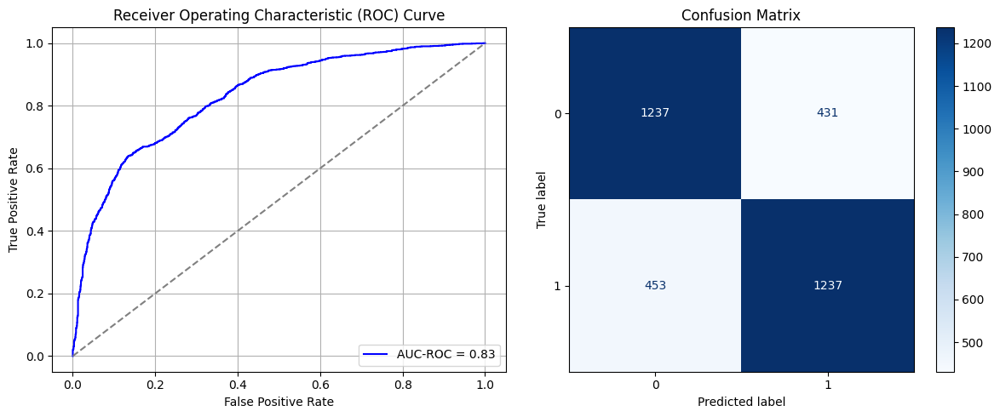

Best threshold based on F1-score: 0.3902978003025055
Time elapsed (performance): 18.979065829999854


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1183 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1185 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7396 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.7768
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7095
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7569 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7548 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.7394
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7528 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7442 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.6430
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7573 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.6636
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7647 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1190 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1191 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7188 - loss: 0.6435 - val_AUC: 0.0000e+00 - val_loss: 0.7622
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7354 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.7254
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7355 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7160
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7359 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7606 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7634 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.6933
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7660 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.7300
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7720 - loss: 0.5372 - val_AUC: 0.0000e+00 - val_loss: 0.6938
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1203 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7380 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7564 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.7538
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7436 - loss: 0.5564 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7536 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.7327
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7641 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7186
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7522 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.7451
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7629 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.6972
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7709 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.7288
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1204 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1206 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7370 - loss: 0.6281 - val_AUC: 0.0000e+00 - val_loss: 0.7432
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7353 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7205
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7474 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7722
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7480 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.7148
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7479 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.7188
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7638 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.7773
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7704 - loss: 0.5425 - val_AUC: 0.0000e+00 - val_loss: 0.6965
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7744 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1211 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1212 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7339 - loss: 0.6373 - val_AUC: 0.0000e+00 - val_loss: 0.7879
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7738 - loss: 0.5338 - val_AUC: 0.0000e+00 - val_loss: 0.7766
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7486 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.7772
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7655 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.7900
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7353 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.9095
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7640 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.7940
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7745 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.7154
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1218 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1219 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7500 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7339 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8019
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7673 - loss: 0.5425 - val_AUC: 0.0000e+00 - val_loss: 0.7140
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7526 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.7621
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7594 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7777 - loss: 0.5346 - val_AUC: 0.0000e+00 - val_loss: 0.7146
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7612 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.7480
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7637 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.7092
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1225 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1227 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1231 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7265 - loss: 0.6226 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7452 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.7923
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7623 - loss: 0.5397 - val_AUC: 0.0000e+00 - val_loss: 0.7004
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7588 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7618 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.7018
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7613 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7601
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7648 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.7457
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7443 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.7391
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1232 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7379 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.7745
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7432 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7551 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.7606
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7550 - loss: 0.5520 - val_AUC: 0.0000e+00 - val_loss: 0.6512
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7597 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.7100
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7747 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.7274
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7819 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.8007
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7579 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.7607
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7395 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.7753
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7407 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.7502
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7442 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7488 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7592 - loss: 0.5503 - val_AUC: 0.0000e+00 - val_loss: 0.7742
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7471 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7614 - loss: 0.5511 - val_AUC: 0.0000e+00 - val_loss: 0.8060
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1246 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1247 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7335 - loss: 0.6214 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7486 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7439 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.7053
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7607 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7863
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7679 - loss: 0.5418 - val_AUC: 0.0000e+00 - val_loss: 0.7101
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7767 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.7578
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7632 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7442
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7741 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.6472
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1253 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1255 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1259 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7195 - loss: 0.6430 - val_AUC: 0.0000e+00 - val_loss: 0.7646
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7348 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7748
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7499 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.7392
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7735 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7445 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7643 - loss: 0.5463 - val_AUC: 0.0000e+00 - val_loss: 0.7856
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7618 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.6832
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7714 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1260 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7322 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.7270
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.7083
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7587 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.7474
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7346 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7613 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7777 - loss: 0.5373 - val_AUC: 0.0000e+00 - val_loss: 0.6630
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7566 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.7690
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7578 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7210 - loss: 0.6348 - val_AUC: 0.0000e+00 - val_loss: 0.7751
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7528 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.7836
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7471 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7554 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.7677
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7410 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.7358
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7477 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.7612
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7550 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.7176
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7702 - loss: 0.5393 - val_AUC: 0.0000e+00 - val_loss: 0.7079
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1274 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1275 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7160 - loss: 0.6452 - val_AUC: 0.0000e+00 - val_loss: 0.7315
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7517 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.7465
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7433 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7494 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.7414
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7519 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.7920
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7570 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.7226
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7528 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.7817
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7662 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.7153
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1281 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1283 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1287 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7414 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.7201
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7256 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7106
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7518 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7394 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7256
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7651 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.7662
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7639 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7629 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.7648
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7663 - loss: 0.5463 - val_AUC: 0.0000e+00 - val_loss: 0.7469
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1288 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7247 - loss: 0.6385 - val_AUC: 0.0000e+00 - val_loss: 0.7083
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7515 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7578 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.7845
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7644 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.6839
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7479 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.7507
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7581 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.6792
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7545 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.6945
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7711 - loss: 0.5412 - val_AUC: 0.0000e+00 - val_loss: 0.7312
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7432 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 0.7611
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7338 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.7342
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7501 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.7942
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7343 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.7792
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7643 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7656 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.7247
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7544 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.7955
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7575 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.6965
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1302 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1303 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7316 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.7401
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7257 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7338 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7594 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.8069
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7417 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7664 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.7540
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7654 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.7189
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7542 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.7017
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1309 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1311 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1315 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - AUC: 0.7458 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 0.8205
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7448 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.7980
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7498 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.7185
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7526 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.6714
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7637 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.6487
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7607 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.7474
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7747 - loss: 0.5220 - val_AUC: 0.0000e+00 - val_loss: 0.5323
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7727 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.7024
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1316 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7391 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.6839
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7442 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.7897
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7258 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.7691
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7665 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7639 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7490 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.7870
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7531 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7863 - loss: 0.5260 - val_AUC: 0.0000e+00 - val_loss: 0.7557
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6960 - loss: 0.6317 - val_AUC: 0.7863 - val_loss: 0.5750
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7760 - loss: 0.5676 - val_AUC: 0.8148 - val_loss: 0.5379
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7943 - loss: 0.5530 - val_AUC: 0.8241 - val_loss: 0.5228
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.8003 - loss: 0.5437 - val_AUC: 0.8200 - val_loss: 0.5306
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8079 - loss: 0.5351 - val_AUC: 0.8271 - val_loss: 0.5133
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8107 - loss: 0.5312 - val_AUC: 0.8240 - val_loss: 0.5179
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8078 - loss: 0.5345 - val_AUC: 0.8314 - val_loss: 0.5078
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8163 - loss: 0.5237 - val_AUC: 0.8275 - val_loss: 0.5134
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

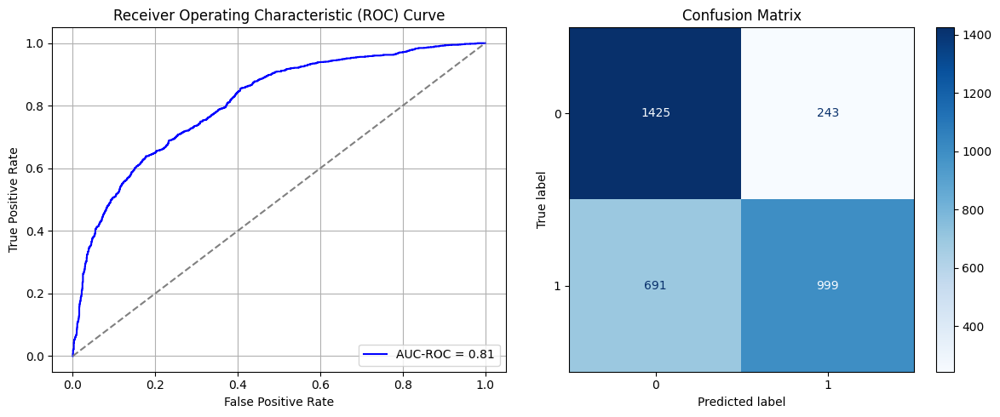

Best threshold based on F1-score: 0.19422268867492676
Time elapsed (performance): 20.249576428000182


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1330 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1331 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7730 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.6938
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7903 - loss: 0.5229 - val_AUC: 0.0000e+00 - val_loss: 0.7108
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7853 - loss: 0.5222 - val_AUC: 0.0000e+00 - val_loss: 0.6849
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8018 - loss: 0.5120 - val_AUC: 0.0000e+00 - val_loss: 0.7567
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8016 - loss: 0.5120 - val_AUC: 0.0000e+00 - val_loss: 0.6887
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7978 - loss: 0.5160 - val_AUC: 0.0000e+00 - val_loss: 0.7347
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8191 - loss: 0.4925 - val_AUC: 0.0000e+00 - val_loss: 0.6142
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8164 - loss: 0.4975 - val_AUC: 0.0000e+00 - val_loss: 0.7725
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1337 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1339 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1343 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7665 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.7070
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7758 - loss: 0.5388 - val_AUC: 0.0000e+00 - val_loss: 0.7601
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7908 - loss: 0.5222 - val_AUC: 0.0000e+00 - val_loss: 0.7390
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7812 - loss: 0.5321 - val_AUC: 0.0000e+00 - val_loss: 0.7467
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8002 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.7323
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8092 - loss: 0.5103 - val_AUC: 0.0000e+00 - val_loss: 0.7075
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7923 - loss: 0.5131 - val_AUC: 0.0000e+00 - val_loss: 0.5874
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8236 - loss: 0.4927 - val_AUC: 0.0000e+00 - val_loss: 0.6869
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1344 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7688 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.7117
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7848 - loss: 0.5304 - val_AUC: 0.0000e+00 - val_loss: 0.6757
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7838 - loss: 0.5279 - val_AUC: 0.0000e+00 - val_loss: 0.6871
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8017 - loss: 0.5131 - val_AUC: 0.0000e+00 - val_loss: 0.6952
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7985 - loss: 0.5162 - val_AUC: 0.0000e+00 - val_loss: 0.6754
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7977 - loss: 0.5183 - val_AUC: 0.0000e+00 - val_loss: 0.6948
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8018 - loss: 0.5096 - val_AUC: 0.0000e+00 - val_loss: 0.6622
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8186 - loss: 0.4890 - val_AUC: 0.0000e+00 - val_loss: 0.6449
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7692 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.6821
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7882 - loss: 0.5309 - val_AUC: 0.0000e+00 - val_loss: 0.6933
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7927 - loss: 0.5222 - val_AUC: 0.0000e+00 - val_loss: 0.7270
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7992 - loss: 0.5136 - val_AUC: 0.0000e+00 - val_loss: 0.6892
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7983 - loss: 0.5107 - val_AUC: 0.0000e+00 - val_loss: 0.6860
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8075 - loss: 0.4996 - val_AUC: 0.0000e+00 - val_loss: 0.6683
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8054 - loss: 0.5025 - val_AUC: 0.0000e+00 - val_loss: 0.6088
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8066 - loss: 0.4993 - val_AUC: 0.0000e+00 - val_loss: 0.7158
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1358 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1359 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1360 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1364 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7711 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.6662
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7859 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.7294
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7851 - loss: 0.5321 - val_AUC: 0.0000e+00 - val_loss: 0.6973
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8071 - loss: 0.5130 - val_AUC: 0.0000e+00 - val_loss: 0.7528
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8116 - loss: 0.5061 - val_AUC: 0.0000e+00 - val_loss: 0.6997
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8077 - loss: 0.5013 - val_AUC: 0.0000e+00 - val_loss: 0.6831
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7955 - loss: 0.5238 - val_AUC: 0.0000e+00 - val_loss: 0.7144
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8049 - loss: 0.5121 - val_AUC: 0.0000e+00 - val_loss: 0.6565
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1365 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1366 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1367 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1371 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7858 - loss: 0.5362 - val_AUC: 0.0000e+00 - val_loss: 0.7482
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7838 - loss: 0.5294 - val_AUC: 0.0000e+00 - val_loss: 0.6819
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7767 - loss: 0.5335 - val_AUC: 0.0000e+00 - val_loss: 0.6279
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7952 - loss: 0.5260 - val_AUC: 0.0000e+00 - val_loss: 0.7009
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7990 - loss: 0.5192 - val_AUC: 0.0000e+00 - val_loss: 0.6755
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7917 - loss: 0.5163 - val_AUC: 0.0000e+00 - val_loss: 0.6623
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8198 - loss: 0.4970 - val_AUC: 0.0000e+00 - val_loss: 0.7081
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8113 - loss: 0.5066 - val_AUC: 0.0000e+00 - val_loss: 0.7249
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1372 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1373 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1374 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1378 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7600 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.6679
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7840 - loss: 0.5308 - val_AUC: 0.0000e+00 - val_loss: 0.7333
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7941 - loss: 0.5226 - val_AUC: 0.0000e+00 - val_loss: 0.7502
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7910 - loss: 0.5193 - val_AUC: 0.0000e+00 - val_loss: 0.6502
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8010 - loss: 0.5062 - val_AUC: 0.0000e+00 - val_loss: 0.6710
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8069 - loss: 0.5067 - val_AUC: 0.0000e+00 - val_loss: 0.6725
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8071 - loss: 0.5064 - val_AUC: 0.0000e+00 - val_loss: 0.6764
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7968 - loss: 0.5139 - val_AUC: 0.0000e+00 - val_loss: 0.6064
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1379 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1380 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1381 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1385 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7782 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.7212
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7683 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.7854
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7776 - loss: 0.5337 - val_AUC: 0.0000e+00 - val_loss: 0.7812
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7932 - loss: 0.5234 - val_AUC: 0.0000e+00 - val_loss: 0.7281
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8044 - loss: 0.5051 - val_AUC: 0.0000e+00 - val_loss: 0.6390
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8059 - loss: 0.5106 - val_AUC: 0.0000e+00 - val_loss: 0.6926
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8079 - loss: 0.5079 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8117 - loss: 0.5034 - val_AUC: 0.0000e+00 - val_loss: 0.7320
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1386 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1387 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1388 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1392 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7747 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.7503
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7867 - loss: 0.5311 - val_AUC: 0.0000e+00 - val_loss: 0.6959
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7712 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.6819
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.8044 - loss: 0.5046 - val_AUC: 0.0000e+00 - val_loss: 0.6506
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7952 - loss: 0.5155 - val_AUC: 0.0000e+00 - val_loss: 0.7500
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8048 - loss: 0.5073 - val_AUC: 0.0000e+00 - val_loss: 0.7267
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7785 - loss: 0.5351 - val_AUC: 0.0000e+00 - val_loss: 0.6995
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8096 - loss: 0.5034 - val_AUC: 0.0000e+00 - val_loss: 0.6453
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1393 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1394 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1395 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1399 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7543 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.6609
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7881 - loss: 0.5213 - val_AUC: 0.0000e+00 - val_loss: 0.7471
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7856 - loss: 0.5309 - val_AUC: 0.0000e+00 - val_loss: 0.6698
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8078 - loss: 0.5071 - val_AUC: 0.0000e+00 - val_loss: 0.6269
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8017 - loss: 0.5158 - val_AUC: 0.0000e+00 - val_loss: 0.7471
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8108 - loss: 0.5068 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8171 - loss: 0.5008 - val_AUC: 0.0000e+00 - val_loss: 0.7412
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8137 - loss: 0.5039 - val_AUC: 0.0000e+00 - val_loss: 0.7424
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1400 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1401 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1402 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1406 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7729 - loss: 0.5511 - val_AUC: 0.0000e+00 - val_loss: 0.7427
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7773 - loss: 0.5364 - val_AUC: 0.0000e+00 - val_loss: 0.6730
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7904 - loss: 0.5246 - val_AUC: 0.0000e+00 - val_loss: 0.7507
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7888 - loss: 0.5315 - val_AUC: 0.0000e+00 - val_loss: 0.6762
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7934 - loss: 0.5232 - val_AUC: 0.0000e+00 - val_loss: 0.6386
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8066 - loss: 0.5075 - val_AUC: 0.0000e+00 - val_loss: 0.6939
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8002 - loss: 0.5102 - val_AUC: 0.0000e+00 - val_loss: 0.6979
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8065 - loss: 0.5110 - val_AUC: 0.0000e+00 - val_loss: 0.6688
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1407 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1408 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1409 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1413 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7816 - loss: 0.5368 - val_AUC: 0.0000e+00 - val_loss: 0.7004
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7869 - loss: 0.5287 - val_AUC: 0.0000e+00 - val_loss: 0.7142
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8055 - loss: 0.5073 - val_AUC: 0.0000e+00 - val_loss: 0.6828
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7902 - loss: 0.5222 - val_AUC: 0.0000e+00 - val_loss: 0.6236
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7883 - loss: 0.5229 - val_AUC: 0.0000e+00 - val_loss: 0.7570
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8103 - loss: 0.5088 - val_AUC: 0.0000e+00 - val_loss: 0.7086
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8099 - loss: 0.4929 - val_AUC: 0.0000e+00 - val_loss: 0.7058
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8115 - loss: 0.5026 - val_AUC: 0.0000e+00 - val_loss: 0.5732
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1414 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1415 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1416 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1420 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7854 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.7476
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7877 - loss: 0.5284 - val_AUC: 0.0000e+00 - val_loss: 0.7262
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7977 - loss: 0.5204 - val_AUC: 0.0000e+00 - val_loss: 0.6560
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7997 - loss: 0.5196 - val_AUC: 0.0000e+00 - val_loss: 0.7651
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7980 - loss: 0.5201 - val_AUC: 0.0000e+00 - val_loss: 0.6671
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8073 - loss: 0.5014 - val_AUC: 0.0000e+00 - val_loss: 0.6650
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8027 - loss: 0.5053 - val_AUC: 0.0000e+00 - val_loss: 0.6337
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8298 - loss: 0.4863 - val_AUC: 0.0000e+00 - val_loss: 0.7310
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1421 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1422 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1423 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1427 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7652 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.7233
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7876 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.6917
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7850 - loss: 0.5331 - val_AUC: 0.0000e+00 - val_loss: 0.6771
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7902 - loss: 0.5258 - val_AUC: 0.0000e+00 - val_loss: 0.6369
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8091 - loss: 0.5089 - val_AUC: 0.0000e+00 - val_loss: 0.6529
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8116 - loss: 0.5031 - val_AUC: 0.0000e+00 - val_loss: 0.7399
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7974 - loss: 0.5164 - val_AUC: 0.0000e+00 - val_loss: 0.7234
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8044 - loss: 0.5156 - val_AUC: 0.0000e+00 - val_loss: 0.6694
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1428 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1429 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1430 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1434 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7686 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.6955
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7821 - loss: 0.5337 - val_AUC: 0.0000e+00 - val_loss: 0.7429
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7822 - loss: 0.5321 - val_AUC: 0.0000e+00 - val_loss: 0.6859
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7827 - loss: 0.5313 - val_AUC: 0.0000e+00 - val_loss: 0.7098
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8008 - loss: 0.5144 - val_AUC: 0.0000e+00 - val_loss: 0.6985
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8311 - loss: 0.4871 - val_AUC: 0.0000e+00 - val_loss: 0.7466
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8141 - loss: 0.5039 - val_AUC: 0.0000e+00 - val_loss: 0.6512
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7977 - loss: 0.5089 - val_AUC: 0.0000e+00 - val_loss: 0.6406
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1435 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1436 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1437 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1441 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7944 - loss: 0.5290 - val_AUC: 0.0000e+00 - val_loss: 0.7120
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8003 - loss: 0.5149 - val_AUC: 0.0000e+00 - val_loss: 0.6962
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8036 - loss: 0.5113 - val_AUC: 0.0000e+00 - val_loss: 0.7379
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8114 - loss: 0.5072 - val_AUC: 0.0000e+00 - val_loss: 0.7307
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8032 - loss: 0.5082 - val_AUC: 0.0000e+00 - val_loss: 0.7004
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8026 - loss: 0.5157 - val_AUC: 0.0000e+00 - val_loss: 0.7837
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8032 - loss: 0.5138 - val_AUC: 0.0000e+00 - val_loss: 0.6669
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8138 - loss: 0.4958 - val_AUC: 0.0000e+00 - val_loss: 0.6700
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1442 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1443 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1444 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1448 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7662 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7339
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7839 - loss: 0.5290 - val_AUC: 0.0000e+00 - val_loss: 0.7637
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8052 - loss: 0.5073 - val_AUC: 0.0000e+00 - val_loss: 0.7113
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8021 - loss: 0.5109 - val_AUC: 0.0000e+00 - val_loss: 0.7285
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8093 - loss: 0.5117 - val_AUC: 0.0000e+00 - val_loss: 0.7288
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7902 - loss: 0.5201 - val_AUC: 0.0000e+00 - val_loss: 0.6903
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8003 - loss: 0.5154 - val_AUC: 0.0000e+00 - val_loss: 0.6477
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8183 - loss: 0.4916 - val_AUC: 0.0000e+00 - val_loss: 0.7375
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1449 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1450 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1451 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1455 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7713 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.7278
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7873 - loss: 0.5255 - val_AUC: 0.0000e+00 - val_loss: 0.6685
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7832 - loss: 0.5340 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7988 - loss: 0.5168 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8057 - loss: 0.5116 - val_AUC: 0.0000e+00 - val_loss: 0.7045
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8095 - loss: 0.5064 - val_AUC: 0.0000e+00 - val_loss: 0.7409
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8043 - loss: 0.5068 - val_AUC: 0.0000e+00 - val_loss: 0.6217
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8052 - loss: 0.5081 - val_AUC: 0.0000e+00 - val_loss: 0.7125
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1456 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1457 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1458 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1462 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7752 - loss: 0.5405 - val_AUC: 0.0000e+00 - val_loss: 0.6746
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7707 - loss: 0.5429 - val_AUC: 0.0000e+00 - val_loss: 0.6659
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7903 - loss: 0.5190 - val_AUC: 0.0000e+00 - val_loss: 0.6455
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.8002 - loss: 0.5135 - val_AUC: 0.0000e+00 - val_loss: 0.7112
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7973 - loss: 0.5200 - val_AUC: 0.0000e+00 - val_loss: 0.6771
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7908 - loss: 0.5232 - val_AUC: 0.0000e+00 - val_loss: 0.7248
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8225 - loss: 0.4923 - val_AUC: 0.0000e+00 - val_loss: 0.6553
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8006 - loss: 0.5154 - val_AUC: 0.0000e+00 - val_loss: 0.7006
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1463 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1464 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1465 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1469 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7720 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.7393
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7726 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.6295
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7974 - loss: 0.5187 - val_AUC: 0.0000e+00 - val_loss: 0.7354
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7908 - loss: 0.5349 - val_AUC: 0.0000e+00 - val_loss: 0.7085
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8040 - loss: 0.5117 - val_AUC: 0.0000e+00 - val_loss: 0.7212
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8024 - loss: 0.5132 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8146 - loss: 0.4986 - val_AUC: 0.0000e+00 - val_loss: 0.7847
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8300 - loss: 0.4811 - val_AUC: 0.0000e+00 - val_loss: 0.5790
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s

In [ ]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


# fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)

In [ ]:
print(ParamFit)
ParamFit.to_csv('SRS_Fine_Tuning.csv')

         FPR       FNR
0   0.127149  0.486957
1   0.104585  0.579710
2   0.093840  0.620290
3   0.115688  0.556522
4   0.104226  0.585507
..       ...       ...
95  0.151504  0.339130
96  0.177650  0.313043
97  0.132880  0.371014
98  0.142908  0.350725
99  0.141117  0.356522

[100 rows x 2 columns]


In [ ]:
ParamFit['FNR'].mean()

np.float64(0.45055072463768125)

## Simple Random Sampling with Replacement:

In [ ]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,10,11,Y2
0,0.301370,0.000,0.044131,0.000000,0.000000,0.0,0.00,0.0,0.021740,0.0,0.397959,0.0,1
1,0.452055,0.125,0.048052,0.666667,0.071429,0.2,0.00,0.0,0.000000,0.0,0.122449,0.0,1
2,0.287671,0.250,0.137581,0.166667,0.142857,0.0,0.00,0.0,0.000000,0.0,0.397959,0.0,0
3,0.493151,0.250,0.150486,0.666667,0.142857,0.2,0.25,0.0,0.000000,0.0,0.397959,0.0,0
4,0.479452,0.125,0.133519,0.666667,0.071429,0.2,0.00,0.0,0.000000,0.0,0.448980,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
31932,0.424658,0.500,0.227956,0.166667,0.285714,0.0,0.00,0.0,0.000000,0.0,0.397959,0.0,1
31933,0.219178,0.250,0.157583,0.000000,0.214286,0.6,0.00,0.0,0.000000,0.0,0.397959,0.0,1
31934,0.287671,0.250,0.245379,0.666667,0.214286,0.2,0.00,0.0,0.000000,0.0,0.500000,0.0,1
31935,0.369863,0.250,0.048444,0.166667,0.000000,0.6,0.50,0.0,0.054551,0.0,0.397959,0.0,1


In [ ]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,10,11,Y
0,0.150685,0.25,0.220635,0.666667,0.214286,0.4,0.25,1.0,0.000000,0.0,0.397959,0.02439,0
1,0.273973,0.25,0.184219,0.666667,0.071429,0.4,0.00,1.0,0.000000,0.0,0.397959,0.00000,0
2,0.438356,0.25,0.100061,1.000000,0.285714,0.0,0.25,1.0,0.000000,0.0,0.153061,0.04878,0
3,0.191781,0.25,0.022661,0.000000,0.214286,0.0,0.00,1.0,0.140841,0.0,0.500000,0.00000,1
4,0.082192,0.25,0.074410,0.000000,0.000000,0.6,0.00,1.0,0.000000,0.0,0.295918,0.00000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15679,0.136986,0.25,0.282830,0.000000,0.357143,0.0,0.00,1.0,0.000000,0.0,0.448980,0.00000,0
15680,0.520548,0.25,0.143676,0.333333,1.000000,0.0,0.00,1.0,0.000000,0.0,0.316327,0.00000,0
15681,0.287671,0.25,0.159164,0.000000,0.000000,0.8,0.25,1.0,0.000000,0.0,0.397959,0.00000,0
15682,0.109589,0.25,0.229138,0.000000,0.285714,0.6,0.00,1.0,0.000000,0.0,0.397959,0.00000,0


In [ ]:
X_S_SRSwR, y_S_SRSwR = SRSwR_undersampler(data_S_full, data_S_full.iloc[:,-1])
print(X_S_SRSwR)

8393
23544
              0     1         2         3         4    5    6    7         8  \
27075  0.246575  0.25  0.124254  0.666667  0.285714  0.2  0.5  0.0  0.000000   
21342  0.136986  0.25  0.061801  0.166667  0.000000  0.0  0.0  0.0  0.000000   
24073  0.041096  0.25  0.029213  0.000000  0.357143  0.6  0.0  0.0  0.000000   
29303  0.520548  0.25  0.223146  0.000000  0.071429  0.0  0.0  0.0  0.000000   
20865  0.027397  0.25  0.075759  0.000000  0.357143  0.6  0.0  0.0  0.000000   
...         ...   ...       ...       ...       ...  ...  ...  ...       ...   
31932  0.424658  0.50  0.227956  0.166667  0.285714  0.0  0.0  0.0  0.000000   
31933  0.219178  0.25  0.157583  0.000000  0.214286  0.6  0.0  0.0  0.000000   
31934  0.287671  0.25  0.245379  0.666667  0.214286  0.2  0.0  0.0  0.000000   
31935  0.369863  0.25  0.048444  0.166667  0.000000  0.6  0.5  0.0  0.054551   
31936  0.246575  0.75  0.114919  0.666667  0.071429  0.2  0.0  0.0  0.000000   

         9        10        

In [ ]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRSwR, y_S_SRSwR, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRSwR, y_T_train_SRSwR = SRSwR_undersampler(T_train, T_train.iloc[:,-1])
print(y_T_train_SRSwR)

1391
11156
440      0
9066     0
10720    0
13186    0
6979     0
        ..
2163     1
6921     1
9893     1
2897     1
14116    1
Name: Y, Length: 2782, dtype: int64


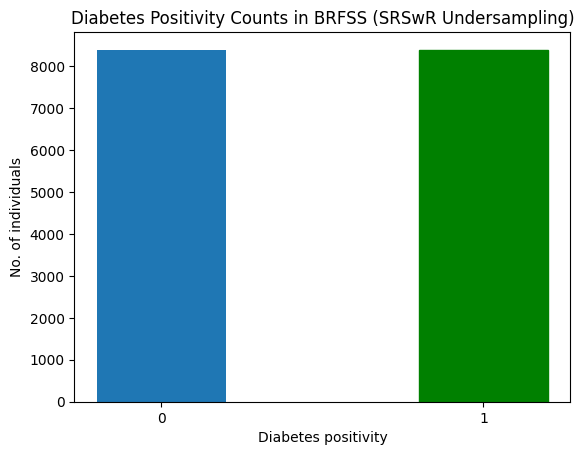

In [ ]:
barlist = plt.bar([str(0),str(1)], y_S_SRSwR.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRSwR Undersampling)")
plt.show()

In [ ]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (13428, 12)
y_S_train: (13428,)
X_S_test: (3358, 12)
y_S_test: (3358,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_210"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1470 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1471 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1472 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1476 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6880 - loss: 0.6424 - val_AUC: 0.7658 - val_loss: 0.5917
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7572 - loss: 0.5817 - val_AUC: 0.7906 - val_loss: 0.5628
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7684 - loss: 0.5753 - val_AUC: 0.8080 - val_loss: 0.5446
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7790 - loss: 0.5671 - val_AUC: 0.8125 - val_loss: 0.5338
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7951 - loss: 0.5493 - val_AUC: 0.8066 - val_loss: 0.5395
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7978 - loss: 0.5463 - val_AUC: 0.8165 - val_loss: 0.5226
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8035 - loss: 0.5367 - val_AUC: 0.8241 - val_loss: 0.5209
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8087 - loss: 0.5333 - val_AUC: 0.8173 - val_loss: 0.5291
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

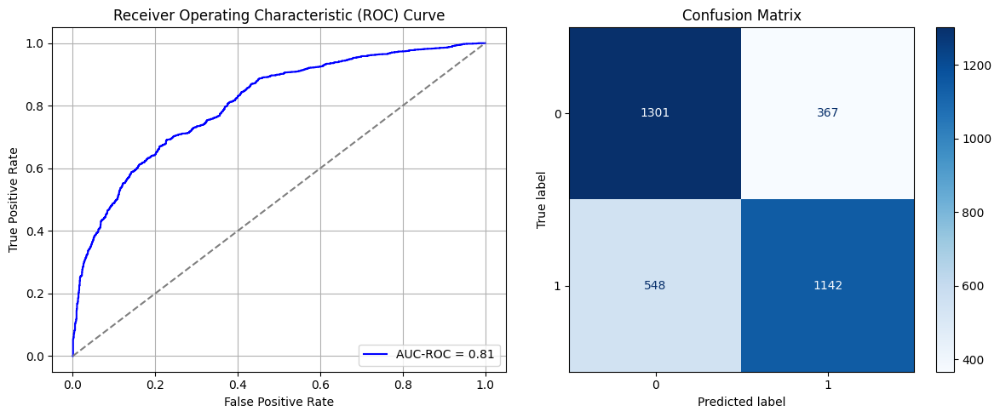

Best threshold based on F1-score: 0.2819669544696808
Time elapsed (performance): 15.031068353000592


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_211"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1477 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1478 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1479 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1483 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7456 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.7636
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7653 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.6638
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7618 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.8066
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7553 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7753 - loss: 0.5342 - val_AUC: 0.0000e+00 - val_loss: 0.7345
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7752 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.7400
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7968 - loss: 0.5235 - val_AUC: 0.0000e+00 - val_loss: 0.7753
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8010 - loss: 0.5216 - val_AUC: 0.0000e+00 - val_loss: 0.7950
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_212"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1484 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1485 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1486 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1490 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7538 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7784
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7408 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.6583
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7543 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.6885
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7639 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.6932
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7853 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7372
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7857 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.7562
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8032 - loss: 0.5201 - val_AUC: 0.0000e+00 - val_loss: 0.7560
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7990 - loss: 0.5239 - val_AUC: 0.0000e+00 - val_loss: 0.7482
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_213"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1491 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1492 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1493 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1497 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7171 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7746 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.7297
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.6612
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7798 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.7583
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7646 - loss: 0.5530 - val_AUC: 0.0000e+00 - val_loss: 0.7335
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7809 - loss: 0.5402 - val_AUC: 0.0000e+00 - val_loss: 0.6714
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7960 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.6692
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7834 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.6689
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_214"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1498 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1499 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1500 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1504 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7409 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.6848
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7384 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.6637
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7601 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.7587
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7676 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.7462
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7712 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.7946
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7797 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.7442
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7988 - loss: 0.5184 - val_AUC: 0.0000e+00 - val_loss: 0.6940
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8060 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.7436
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_215"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1505 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1506 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1507 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1511 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7406 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7624 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.7251
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7683 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.7250
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7700 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.6635
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7860 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7420
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7832 - loss: 0.5356 - val_AUC: 0.0000e+00 - val_loss: 0.7487
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7949 - loss: 0.5288 - val_AUC: 0.0000e+00 - val_loss: 0.6930
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8025 - loss: 0.5194 - val_AUC: 0.0000e+00 - val_loss: 0.6034
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_216"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1512 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1513 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1514 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1518 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7111 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.7197
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7558 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7615 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.6849
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7813 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.6354
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7770 - loss: 0.5454 - val_AUC: 0.0000e+00 - val_loss: 0.7281
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7754 - loss: 0.5418 - val_AUC: 0.0000e+00 - val_loss: 0.6996
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7953 - loss: 0.5277 - val_AUC: 0.0000e+00 - val_loss: 0.6969
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7915 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.6953
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_217"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1519 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1520 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1521 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1525 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7460 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8295
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7502 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.7571
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7798 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.7415
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7644 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.6917
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7699 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.6887
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7726 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.6837
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7887 - loss: 0.5358 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7995 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.6528
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_218"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1526 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1527 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1528 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1532 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7305 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.7280
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7637 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7950
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7554 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.6592
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7805 - loss: 0.5424 - val_AUC: 0.0000e+00 - val_loss: 0.7336
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7670 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.6478
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7888 - loss: 0.5244 - val_AUC: 0.0000e+00 - val_loss: 0.6967
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7917 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.7289
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7956 - loss: 0.5302 - val_AUC: 0.0000e+00 - val_loss: 0.7460
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_219"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1533 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1534 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1535 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1539 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7406 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.7966
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7607 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.7070
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7744 - loss: 0.5472 - val_AUC: 0.0000e+00 - val_loss: 0.7522
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7674 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.6943
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7778 - loss: 0.5402 - val_AUC: 0.0000e+00 - val_loss: 0.7433
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7957 - loss: 0.5297 - val_AUC: 0.0000e+00 - val_loss: 0.6868
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7770 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.7551
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7882 - loss: 0.5341 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_220"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1540 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1541 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1542 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1546 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7198 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.7387
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7789 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.8033
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7644 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.6915
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7676 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.7145
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7815 - loss: 0.5339 - val_AUC: 0.0000e+00 - val_loss: 0.6826
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7856 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.7639
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7934 - loss: 0.5135 - val_AUC: 0.0000e+00 - val_loss: 0.6226
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7967 - loss: 0.5191 - val_AUC: 0.0000e+00 - val_loss: 0.5976
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_221"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1547 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1548 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1549 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1553 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - AUC: 0.7370 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7492 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7665 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.7105
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7575 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.6722
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7943 - loss: 0.5313 - val_AUC: 0.0000e+00 - val_loss: 0.7906
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7970 - loss: 0.5240 - val_AUC: 0.0000e+00 - val_loss: 0.6538
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7758 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.6891
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7931 - loss: 0.5122 - val_AUC: 0.0000e+00 - val_loss: 0.7077
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_222"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1554 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1555 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1556 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1560 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7247 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.7587
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7513 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7542 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.6991
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7784 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.6023
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7783 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.6633
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7990 - loss: 0.5240 - val_AUC: 0.0000e+00 - val_loss: 0.6852
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7989 - loss: 0.5234 - val_AUC: 0.0000e+00 - val_loss: 0.6304
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7846 - loss: 0.5361 - val_AUC: 0.0000e+00 - val_loss: 0.7359
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_223"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1561 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1562 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1563 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1567 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7540 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.7550
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7447 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.7334
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7533 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.7093
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7652 - loss: 0.5588 - val_AUC: 0.0000e+00 - val_loss: 0.7544
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7754 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.7013
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7953 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.7318
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7879 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.6960
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.8059 - loss: 0.5126 - val_AUC: 0.0000e+00 - val_loss: 0.6349
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1568 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1569 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1570 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1574 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7430 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7404 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.7888
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7519 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.5899
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7719 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.6357
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7766 - loss: 0.5411 - val_AUC: 0.0000e+00 - val_loss: 0.6798
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7952 - loss: 0.5262 - val_AUC: 0.0000e+00 - val_loss: 0.7083
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7852 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.6844
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7908 - loss: 0.5292 - val_AUC: 0.0000e+00 - val_loss: 0.7905
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_225"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1575 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1576 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1577 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1581 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7274 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.6414
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7495 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.6953
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7555 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.7633
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7771 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7779 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.6472
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8032 - loss: 0.5304 - val_AUC: 0.0000e+00 - val_loss: 0.9637
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7786 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.7309
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8041 - loss: 0.5229 - val_AUC: 0.0000e+00 - val_loss: 0.6425
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_226"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1582 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1583 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1584 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1585 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1588 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7371 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7472 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8895
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7656 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.7490
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7683 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.6645
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7682 - loss: 0.5440 - val_AUC: 0.0000e+00 - val_loss: 0.6169
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7631 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7905 - loss: 0.5315 - val_AUC: 0.0000e+00 - val_loss: 0.6753
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8040 - loss: 0.5140 - val_AUC: 0.0000e+00 - val_loss: 0.7091
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_227"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1589 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1590 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1591 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1592 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1595 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7311 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.7416
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7676 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.6771
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7616 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.7030
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7666 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.6542
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7946 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.7203
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7735 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.6864
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7963 - loss: 0.5210 - val_AUC: 0.0000e+00 - val_loss: 0.7433
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7909 - loss: 0.5349 - val_AUC: 0.0000e+00 - val_loss: 0.7320
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_228"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1596 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1597 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1598 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1599 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1602 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7254 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8032
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7628 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.7379
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7680 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.7425
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7935 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.7650
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7757 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.6833
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7743 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.7172
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7983 - loss: 0.5190 - val_AUC: 0.0000e+00 - val_loss: 0.6670
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8010 - loss: 0.5214 - val_AUC: 0.0000e+00 - val_loss: 0.7375
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_229"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1603 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1604 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1605 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1606 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1609 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7325 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.7860
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7538 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.7362
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7666 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.7825
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7916 - loss: 0.5262 - val_AUC: 0.0000e+00 - val_loss: 0.7259
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7736 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.6976
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7798 - loss: 0.5368 - val_AUC: 0.0000e+00 - val_loss: 0.6828
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7881 - loss: 0.5302 - val_AUC: 0.0000e+00 - val_loss: 0.6310
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8025 - loss: 0.5158 - val_AUC: 0.0000e+00 - val_loss: 0.7268
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_230"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1610 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1611 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1612 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1613 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1616 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7239 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.7330
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7501 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8039
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7770 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7777 - loss: 0.5362 - val_AUC: 0.0000e+00 - val_loss: 0.7148
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7892 - loss: 0.5385 - val_AUC: 0.0000e+00 - val_loss: 0.7969
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7713 - loss: 0.5435 - val_AUC: 0.0000e+00 - val_loss: 0.7193
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7859 - loss: 0.5351 - val_AUC: 0.0000e+00 - val_loss: 0.7366
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8050 - loss: 0.5126 - val_AUC: 0.0000e+00 - val_loss: 0.6444
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_231"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1617 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1618 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1619 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1620 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1623 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6863 - loss: 0.6431 - val_AUC: 0.7675 - val_loss: 0.5806
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7531 - loss: 0.5838 - val_AUC: 0.7860 - val_loss: 0.5591
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7670 - loss: 0.5725 - val_AUC: 0.7969 - val_loss: 0.5491
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7838 - loss: 0.5608 - val_AUC: 0.8052 - val_loss: 0.5468
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7842 - loss: 0.5614 - val_AUC: 0.8053 - val_loss: 0.5389
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7987 - loss: 0.5441 - val_AUC: 0.8115 - val_loss: 0.5290
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8012 - loss: 0.5395 - val_AUC: 0.8165 - val_loss: 0.5598
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7986 - loss: 0.5429 - val_AUC: 0.8130 - val_loss: 0.5420
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

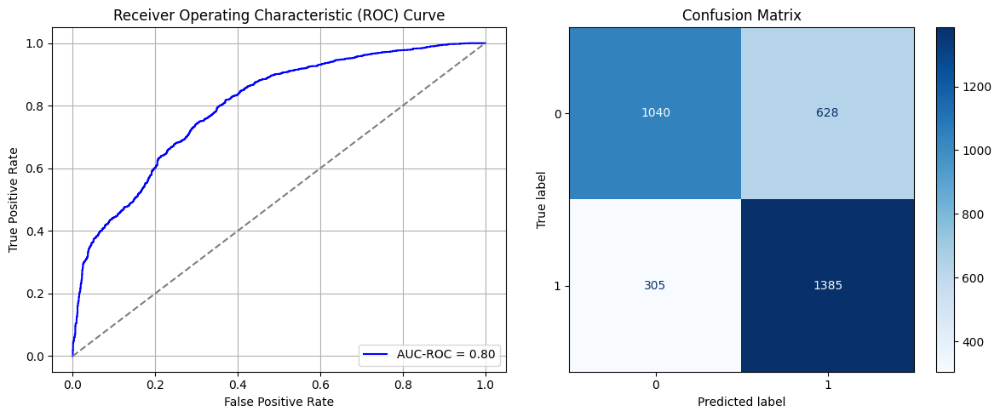

Best threshold based on F1-score: 0.43879443407058716
Time elapsed (performance): 18.09758352299923


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_232"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1624 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1625 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1626 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1627 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1630 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7534 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.7055
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7493 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.7925
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7652 - loss: 0.5438 - val_AUC: 0.0000e+00 - val_loss: 0.7011
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7729 - loss: 0.5324 - val_AUC: 0.0000e+00 - val_loss: 0.7044
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7793 - loss: 0.5378 - val_AUC: 0.0000e+00 - val_loss: 0.6599
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7855 - loss: 0.5317 - val_AUC: 0.0000e+00 - val_loss: 0.7562
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7796 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.7893
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8005 - loss: 0.5102 - val_AUC: 0.0000e+00 - val_loss: 0.7407
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_233"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1631 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1632 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1633 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1634 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1637 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7372 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.6992
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7532 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.7761
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7716 - loss: 0.5395 - val_AUC: 0.0000e+00 - val_loss: 0.7540
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7559 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7367
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7638 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.7426
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7855 - loss: 0.5311 - val_AUC: 0.0000e+00 - val_loss: 0.8699
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8013 - loss: 0.5142 - val_AUC: 0.0000e+00 - val_loss: 0.7144
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7949 - loss: 0.5238 - val_AUC: 0.0000e+00 - val_loss: 0.7028
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_234"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1638 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1639 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1640 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1644 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7184 - loss: 0.6325 - val_AUC: 0.0000e+00 - val_loss: 0.7658
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7326 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7397
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7531 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.8061
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7691 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.7204
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7733 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.7264
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7846 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.7022
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7922 - loss: 0.5233 - val_AUC: 0.0000e+00 - val_loss: 0.7406
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7872 - loss: 0.5283 - val_AUC: 0.0000e+00 - val_loss: 0.6942
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_235"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1645 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1646 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1647 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1651 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7409 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.7212
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7357 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.6891
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7579 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7800
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7687 - loss: 0.5361 - val_AUC: 0.0000e+00 - val_loss: 0.6921
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7827 - loss: 0.5315 - val_AUC: 0.0000e+00 - val_loss: 0.7260
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7777 - loss: 0.5317 - val_AUC: 0.0000e+00 - val_loss: 0.6516
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7937 - loss: 0.5132 - val_AUC: 0.0000e+00 - val_loss: 0.6420
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7852 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.7433
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_236"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1652 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1653 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1654 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1658 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7543 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.6838
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7478 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.7480
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7484 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.7863
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7739 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.7695
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7751 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.7721
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7708 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7870 - loss: 0.5330 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8023 - loss: 0.5127 - val_AUC: 0.0000e+00 - val_loss: 0.7020
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_237"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1659 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1660 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1661 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1665 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7405 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.7011
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7399 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.7452
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7744 - loss: 0.5373 - val_AUC: 0.0000e+00 - val_loss: 0.7782
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7573 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.7284
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7818 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.7680
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7840 - loss: 0.5300 - val_AUC: 0.0000e+00 - val_loss: 0.6751
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7759 - loss: 0.5392 - val_AUC: 0.0000e+00 - val_loss: 0.7422
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7949 - loss: 0.5198 - val_AUC: 0.0000e+00 - val_loss: 0.7034
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_238"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1666 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1667 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1668 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1672 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7563 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.6673
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7413 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.6341
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7623 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.7567
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7650 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.7368
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7664 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7897 - loss: 0.5227 - val_AUC: 0.0000e+00 - val_loss: 0.7114
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7947 - loss: 0.5221 - val_AUC: 0.0000e+00 - val_loss: 0.6636
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7968 - loss: 0.5219 - val_AUC: 0.0000e+00 - val_loss: 0.7601
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_239"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1673 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1674 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1675 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1679 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7414 - loss: 0.6132 - val_AUC: 0.0000e+00 - val_loss: 0.6859
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7477 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7460 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.7440
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7573 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.7777
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7810 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.7636
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7829 - loss: 0.5354 - val_AUC: 0.0000e+00 - val_loss: 0.7410
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7782 - loss: 0.5340 - val_AUC: 0.0000e+00 - val_loss: 0.6880
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8009 - loss: 0.5120 - val_AUC: 0.0000e+00 - val_loss: 0.6225
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_240"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1680 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1681 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1682 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1686 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7568 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.7188
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7481 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.7251
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7531 - loss: 0.5588 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7560 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7662 - loss: 0.5380 - val_AUC: 0.0000e+00 - val_loss: 0.7366
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7769 - loss: 0.5383 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7720 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.7918
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7778 - loss: 0.5310 - val_AUC: 0.0000e+00 - val_loss: 0.7101
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_241"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1687 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1688 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1689 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1693 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7484 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8000
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7507 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8041
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7601 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7534
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7836 - loss: 0.5342 - val_AUC: 0.0000e+00 - val_loss: 0.7335
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7842 - loss: 0.5300 - val_AUC: 0.0000e+00 - val_loss: 0.7033
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7848 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.7276
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7828 - loss: 0.5330 - val_AUC: 0.0000e+00 - val_loss: 0.6904
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8082 - loss: 0.5026 - val_AUC: 0.0000e+00 - val_loss: 0.6557
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_242"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1694 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1695 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1696 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1700 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7597 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.6745
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7278 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7047
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7561 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7364
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7611 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.7556
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7671 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.7017
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7774 - loss: 0.5373 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7927 - loss: 0.5201 - val_AUC: 0.0000e+00 - val_loss: 0.7080
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7927 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.6639
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_243"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1701 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1702 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1703 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1707 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7375 - loss: 0.6142 - val_AUC: 0.0000e+00 - val_loss: 0.7652
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8401
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7594 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8091
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7676 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7630 - loss: 0.5425 - val_AUC: 0.0000e+00 - val_loss: 0.7438
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7805 - loss: 0.5356 - val_AUC: 0.0000e+00 - val_loss: 0.7373
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7940 - loss: 0.5149 - val_AUC: 0.0000e+00 - val_loss: 0.6631
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7828 - loss: 0.5317 - val_AUC: 0.0000e+00 - val_loss: 0.7727
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_244"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1708 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1709 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1710 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1714 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7462 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.7615
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7545 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7562 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7551
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7716 - loss: 0.5344 - val_AUC: 0.0000e+00 - val_loss: 0.6795
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7701 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.7552
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7648 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7228
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7790 - loss: 0.5278 - val_AUC: 0.0000e+00 - val_loss: 0.6430
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7840 - loss: 0.5318 - val_AUC: 0.0000e+00 - val_loss: 0.6374
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_245"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1715 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1716 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1717 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1721 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7279 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.6856
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7416 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.7438
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7638 - loss: 0.5438 - val_AUC: 0.0000e+00 - val_loss: 0.7515
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7639 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.7792
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7634 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.7672
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7835 - loss: 0.5266 - val_AUC: 0.0000e+00 - val_loss: 0.6976
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7923 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.7007
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7914 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.7149
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_246"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1722 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1723 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1724 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1728 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7296 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.7551
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7433 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7683 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.7614
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7689 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.7153
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7529 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7792
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7858 - loss: 0.5238 - val_AUC: 0.0000e+00 - val_loss: 0.7708
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7783 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.6948
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7782 - loss: 0.5330 - val_AUC: 0.0000e+00 - val_loss: 0.6941
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_247"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1729 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1730 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1731 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1735 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7427 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.7318
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7417 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.6869
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7565 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.7543
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7624 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.6745
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7659 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.7461
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7797 - loss: 0.5300 - val_AUC: 0.0000e+00 - val_loss: 0.7471
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8039 - loss: 0.5062 - val_AUC: 0.0000e+00 - val_loss: 0.6283
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7940 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_248"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1736 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1737 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1738 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1742 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7227 - loss: 0.6251 - val_AUC: 0.0000e+00 - val_loss: 0.7043
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7254 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.7126
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7724 - loss: 0.5395 - val_AUC: 0.0000e+00 - val_loss: 0.7101
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7785 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.7124
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7777 - loss: 0.5333 - val_AUC: 0.0000e+00 - val_loss: 0.6791
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7732 - loss: 0.5419 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7768 - loss: 0.5316 - val_AUC: 0.0000e+00 - val_loss: 0.6920
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7976 - loss: 0.5178 - val_AUC: 0.0000e+00 - val_loss: 0.7239
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_249"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1743 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1744 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1745 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1749 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7561 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.7415
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7530 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.7055
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7546 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.7546
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7813 - loss: 0.5306 - val_AUC: 0.0000e+00 - val_loss: 0.7626
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7809 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.7255
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7843 - loss: 0.5266 - val_AUC: 0.0000e+00 - val_loss: 0.7626
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7836 - loss: 0.5281 - val_AUC: 0.0000e+00 - val_loss: 0.7357
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7838 - loss: 0.5279 - val_AUC: 0.0000e+00 - val_loss: 0.6882
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_250"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1750 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1751 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1752 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1756 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7485 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.7492
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7374 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7557
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7631 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.6880
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7692 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.7722
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7830 - loss: 0.5305 - val_AUC: 0.0000e+00 - val_loss: 0.7437
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7817 - loss: 0.5352 - val_AUC: 0.0000e+00 - val_loss: 0.7807
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7987 - loss: 0.5106 - val_AUC: 0.0000e+00 - val_loss: 0.6801
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7999 - loss: 0.5222 - val_AUC: 0.0000e+00 - val_loss: 0.7540
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_251"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1757 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1758 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1759 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1763 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7339 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.6896
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7644 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.6716
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7454 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7612 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.6705
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7747 - loss: 0.5341 - val_AUC: 0.0000e+00 - val_loss: 0.6892
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7777 - loss: 0.5440 - val_AUC: 0.0000e+00 - val_loss: 0.7330
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7989 - loss: 0.5197 - val_AUC: 0.0000e+00 - val_loss: 0.7375
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8106 - loss: 0.5084 - val_AUC: 0.0000e+00 - val_loss: 0.7221
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_252"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1764 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1765 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1766 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1770 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7040 - loss: 0.6378 - val_AUC: 0.7646 - val_loss: 0.5759
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7472 - loss: 0.5875 - val_AUC: 0.8030 - val_loss: 0.5622
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7721 - loss: 0.5740 - val_AUC: 0.8118 - val_loss: 0.5418
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7892 - loss: 0.5567 - val_AUC: 0.8146 - val_loss: 0.5306
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8017 - loss: 0.5431 - val_AUC: 0.8182 - val_loss: 0.5250
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7924 - loss: 0.5517 - val_AUC: 0.8116 - val_loss: 0.5300
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8011 - loss: 0.5396 - val_AUC: 0.8219 - val_loss: 0.5185
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8098 - loss: 0.5294 - val_AUC: 0.8225 - val_loss: 0.5130
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

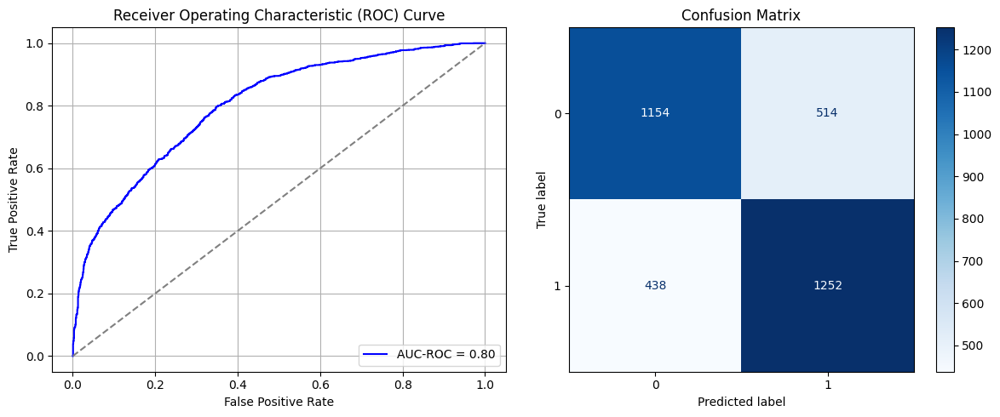

Best threshold based on F1-score: 0.302685022354126
Time elapsed (performance): 17.92972300100064


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_253"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1771 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1772 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1773 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1777 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6459 - loss: 0.6939 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6887 - loss: 0.6123 - val_AUC: 0.0000e+00 - val_loss: 0.9087
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7055 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8065
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7315 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.7689
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7239 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7461 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7935
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7495 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.7211
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7684 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_254"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1778 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1779 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1780 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1784 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6396 - loss: 0.7037 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6631 - loss: 0.6181 - val_AUC: 0.0000e+00 - val_loss: 0.7805
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7224 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8096
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7148 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8336
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7329 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7474 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.7729
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7763 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7753 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.7978
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_255"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1785 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1786 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1787 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1791 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6392 - loss: 0.6972 - val_AUC: 0.0000e+00 - val_loss: 0.7971
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6668 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6963 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.7978
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7193 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.7035
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7434 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.7475
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7571 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7780 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.6205
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_256"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1792 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1793 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1794 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1798 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6347 - loss: 0.7094 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6716 - loss: 0.6127 - val_AUC: 0.0000e+00 - val_loss: 0.8745
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7083 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7063 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.7847
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7382 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.7339
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7430 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.7892
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7638 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7025
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7749 - loss: 0.5451 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_257"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1799 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1800 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1801 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1805 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6592 - loss: 0.6864 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6836 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7204 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.7686
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7275 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.7704
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7068 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7625 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.7184
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7570 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.6758
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7782 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.7742
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_258"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1806 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1807 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1808 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1812 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6217 - loss: 0.7212 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6800 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7079 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9365
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7166 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.7189
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7331 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7417 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7679 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.7501
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7714 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.7674
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_259"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1813 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1814 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1815 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1819 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6375 - loss: 0.6960 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6673 - loss: 0.6164 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6965 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7206 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.6944
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7351 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.7226
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7499 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.7292
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7677 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.7028
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7773 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.6471
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_260"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1820 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1821 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1822 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1826 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6527 - loss: 0.6795 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6726 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.7760
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7133 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8258
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7196 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7367 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7414 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7402 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7629 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.6496
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_261"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1827 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1828 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1829 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1833 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - AUC: 0.6486 - loss: 0.7103 - val_AUC: 0.0000e+00 - val_loss: 0.9461
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6639 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.7533
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7034 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7182 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8148
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7354 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.7346
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7524 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7503 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.7614
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7593 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.6559
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_262"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1834 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1835 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1836 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1840 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6431 - loss: 0.7049 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6859 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 0.7953
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7074 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.7708
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7316 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7239 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7432 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.7540
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7850 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7774 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.7305
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_263"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1841 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1842 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1843 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1847 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6556 - loss: 0.6854 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6722 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6947 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8144
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7089 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7272 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7571 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.6476
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7604 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.7020
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7778 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.7436
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_264"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1848 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1849 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1850 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1854 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6534 - loss: 0.6903 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6852 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.8157
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6803 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.7488
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7260 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.7911
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7506 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7742
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7749 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7729 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7563
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7880 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_265"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1855 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1856 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1857 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1861 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6505 - loss: 0.6893 - val_AUC: 0.0000e+00 - val_loss: 0.8136
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6810 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7021 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.7909
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7345 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7567 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.7063
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7610 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.7718
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7606 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7635
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_266"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1862 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1863 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1864 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1868 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6219 - loss: 0.7283 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6812 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6764 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.7544
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.7553
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.7220
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7371 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7579
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7490 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7886 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.7184
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_267"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1869 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1870 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1871 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1875 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6418 - loss: 0.7087 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6814 - loss: 0.6112 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7098 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7156 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7419 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.7504
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7382 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7531 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.6630
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7787 - loss: 0.5489 - val_AUC: 0.0000e+00 - val_loss: 0.6771
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_268"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1876 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1877 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1878 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1882 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6573 - loss: 0.6904 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6670 - loss: 0.6130 - val_AUC: 0.0000e+00 - val_loss: 0.7257
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7132 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.7463
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7823
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7298 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.7772
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7416 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.6505
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7547 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.7293
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7606 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7718
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_269"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1883 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1884 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1885 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1889 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6227 - loss: 0.7126 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6793 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.7847
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6907 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7084 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7273 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.7772
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7633 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.7371
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7689 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7856 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.6943
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_270"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1890 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1891 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1892 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1896 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6336 - loss: 0.7098 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6727 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6995 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8044
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7097 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7326 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.7803
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7588 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.6751
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7572 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.7698
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7743 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7650
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_271"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1897 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1898 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1899 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1903 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6441 - loss: 0.6990 - val_AUC: 0.0000e+00 - val_loss: 0.8516
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6852 - loss: 0.6124 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7030 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7130 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7507 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.7187
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7492 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.7443
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7603 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.6934
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7763 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.7300
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_272"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1904 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1905 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1906 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1910 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6319 - loss: 0.7133 - val_AUC: 0.0000e+00 - val_loss: 0.8045
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6752 - loss: 0.6199 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6893 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.6825
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7162 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.7430
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7279 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.7966
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8302
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7626 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.8200
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7739 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.7270
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_273"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1911 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1912 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1913 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1917 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.6908 - loss: 0.6383 - val_AUC: 0.7656 - val_loss: 0.5765
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7454 - loss: 0.5911 - val_AUC: 0.7754 - val_loss: 0.5701
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7760 - loss: 0.5709 - val_AUC: 0.7917 - val_loss: 0.5545
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7780 - loss: 0.5682 - val_AUC: 0.7966 - val_loss: 0.5531
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7906 - loss: 0.5535 - val_AUC: 0.8135 - val_loss: 0.5289
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7949 - loss: 0.5468 - val_AUC: 0.8169 - val_loss: 0.5224
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8057 - loss: 0.5340 - val_AUC: 0.8165 - val_loss: 0.5231
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8071 - loss: 0.5321 - val_AUC: 0.8197 - val_loss: 0.5144
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

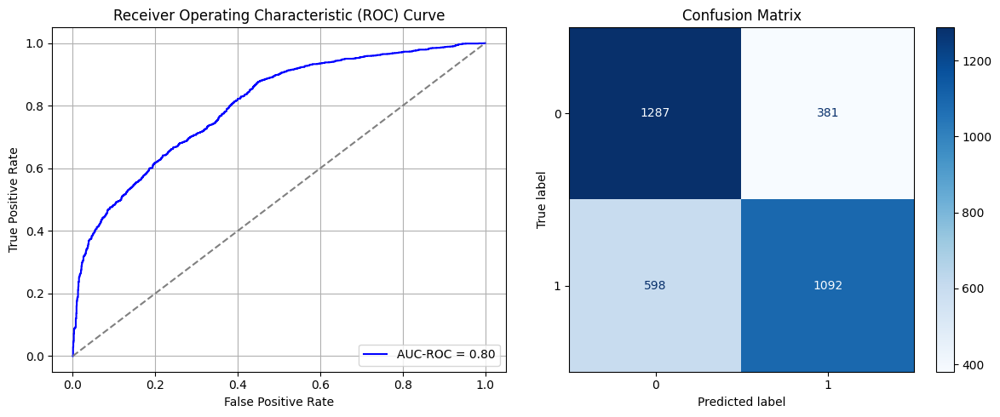

Best threshold based on F1-score: 0.3123774230480194
Time elapsed (performance): 18.39827570399939


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_274"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1918 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1919 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1920 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1924 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7466 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.6985
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7579 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.7974
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7736 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.6567
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7720 - loss: 0.5380 - val_AUC: 0.0000e+00 - val_loss: 0.7469
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7720 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.7480
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7701 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.7678
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7813 - loss: 0.5360 - val_AUC: 0.0000e+00 - val_loss: 0.7787
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7865 - loss: 0.5238 - val_AUC: 0.0000e+00 - val_loss: 0.6940
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_275"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1925 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1926 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1927 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1931 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7448 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7329
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7530 - loss: 0.5537 - val_AUC: 0.0000e+00 - val_loss: 0.6935
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7645 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.7709
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7684 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7809 - loss: 0.5385 - val_AUC: 0.0000e+00 - val_loss: 0.7336
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7786 - loss: 0.5393 - val_AUC: 0.0000e+00 - val_loss: 0.7039
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7818 - loss: 0.5365 - val_AUC: 0.0000e+00 - val_loss: 0.6391
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7758 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.7082
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_276"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1932 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1933 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1934 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1938 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7456 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.7922
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7560 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7613 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.7825
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.7140
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7756 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.7731
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7903 - loss: 0.5271 - val_AUC: 0.0000e+00 - val_loss: 0.6608
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7732 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7401
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7889 - loss: 0.5276 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_277"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1939 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1940 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1941 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1942 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1945 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7317 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7569 - loss: 0.5539 - val_AUC: 0.0000e+00 - val_loss: 0.7599
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7728 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.7821
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7706 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.7340
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7673 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7577
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7767 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.7976
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7788 - loss: 0.5414 - val_AUC: 0.0000e+00 - val_loss: 0.7604
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7733 - loss: 0.5354 - val_AUC: 0.0000e+00 - val_loss: 0.7178
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_278"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1946 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1947 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1948 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1949 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1952 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7408 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7660
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7591 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.7279
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7428 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.7345
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7826 - loss: 0.5324 - val_AUC: 0.0000e+00 - val_loss: 0.6897
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7783 - loss: 0.5392 - val_AUC: 0.0000e+00 - val_loss: 0.6758
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7719 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7383
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7860 - loss: 0.5290 - val_AUC: 0.0000e+00 - val_loss: 0.7175
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7825 - loss: 0.5332 - val_AUC: 0.0000e+00 - val_loss: 0.6647
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_279"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1953 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1954 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1955 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1956 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1959 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7190 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.7142
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7638 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.7406
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7663 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.7554
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7582 - loss: 0.5530 - val_AUC: 0.0000e+00 - val_loss: 0.7165
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7765 - loss: 0.5395 - val_AUC: 0.0000e+00 - val_loss: 0.7121
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7816 - loss: 0.5355 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7793 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.7904
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7876 - loss: 0.5295 - val_AUC: 0.0000e+00 - val_loss: 0.6674
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_280"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1960 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1961 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1962 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1963 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1966 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7270 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.7535
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7618 - loss: 0.5531 - val_AUC: 0.0000e+00 - val_loss: 0.6722
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7602 - loss: 0.5518 - val_AUC: 0.0000e+00 - val_loss: 0.6969
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7613 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7279
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7484 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.7024
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7522 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7199
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7647 - loss: 0.5395 - val_AUC: 0.0000e+00 - val_loss: 0.7494
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7792 - loss: 0.5306 - val_AUC: 0.0000e+00 - val_loss: 0.7595
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_281"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1967 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1968 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1969 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1970 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1973 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7337 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.6735
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7459 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.6742
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7644 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.7663
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7640 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.7273
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7644 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.7779
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7885 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.7197
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7976 - loss: 0.5213 - val_AUC: 0.0000e+00 - val_loss: 0.7506
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7675 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.7354
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_282"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1974 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1975 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1976 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1977 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1980 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7258 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.7538
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7605 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7617
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7575 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.6672
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7592 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.6942
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7738 - loss: 0.5414 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7773 - loss: 0.5331 - val_AUC: 0.0000e+00 - val_loss: 0.6849
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7768 - loss: 0.5310 - val_AUC: 0.0000e+00 - val_loss: 0.6244
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7758 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.7055
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_283"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1981 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1982 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1983 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1984 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1987 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7450 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8039
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7560 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.7253
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7643 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.7259
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7762 - loss: 0.5316 - val_AUC: 0.0000e+00 - val_loss: 0.6671
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7678 - loss: 0.5531 - val_AUC: 0.0000e+00 - val_loss: 0.7763
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7724 - loss: 0.5386 - val_AUC: 0.0000e+00 - val_loss: 0.7457
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7751 - loss: 0.5393 - val_AUC: 0.0000e+00 - val_loss: 0.7062
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7774 - loss: 0.5372 - val_AUC: 0.0000e+00 - val_loss: 0.7364
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_284"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1988 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1989 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1990 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1991 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1994 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7387 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.7548
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7532 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.7120
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7603 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.7048
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7687 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.6893
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7774 - loss: 0.5331 - val_AUC: 0.0000e+00 - val_loss: 0.6614
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7782 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.7377
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7832 - loss: 0.5343 - val_AUC: 0.0000e+00 - val_loss: 0.6758
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7993 - loss: 0.5182 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_285"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1995 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1996 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1997 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1998 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2001 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7384 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.7994
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7622 - loss: 0.5534 - val_AUC: 0.0000e+00 - val_loss: 0.7554
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7668 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.6789
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7628 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.7916
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7675 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.6970
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7672 - loss: 0.5411 - val_AUC: 0.0000e+00 - val_loss: 0.6372
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7809 - loss: 0.5324 - val_AUC: 0.0000e+00 - val_loss: 0.6950
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7694 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.6524
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_286"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2002 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2003 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2008 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7275 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.7352
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7608 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.7722
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7780 - loss: 0.5358 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7698 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.7627
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7693 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.8136
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7766 - loss: 0.5358 - val_AUC: 0.0000e+00 - val_loss: 0.7426
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7774 - loss: 0.5314 - val_AUC: 0.0000e+00 - val_loss: 0.6996
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7883 - loss: 0.5257 - val_AUC: 0.0000e+00 - val_loss: 0.7159
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_287"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2009 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2010 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2015 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7437 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.7464
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7392 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.7465
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7704 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.7111
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7740 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7410
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7860 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.6909
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7648 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.7181
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7644 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7736 - loss: 0.5425 - val_AUC: 0.0000e+00 - val_loss: 0.7614
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_288"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2016 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2017 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2022 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7403 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7512 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.7757
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7639 - loss: 0.5416 - val_AUC: 0.0000e+00 - val_loss: 0.6603
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7638 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.7320
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7940 - loss: 0.5213 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7637 - loss: 0.5414 - val_AUC: 0.0000e+00 - val_loss: 0.7712
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7870 - loss: 0.5268 - val_AUC: 0.0000e+00 - val_loss: 0.7468
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7817 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_289"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2023 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2024 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2029 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7268 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7613 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.7597
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7529 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.7406
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7624 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.7427
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7765 - loss: 0.5385 - val_AUC: 0.0000e+00 - val_loss: 0.8260
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7593 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.7555
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8059 - loss: 0.5141 - val_AUC: 0.0000e+00 - val_loss: 0.7534
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7948 - loss: 0.5248 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_290"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2030 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2031 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2036 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7381 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7883 - loss: 0.5254 - val_AUC: 0.0000e+00 - val_loss: 0.7284
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7827 - loss: 0.5320 - val_AUC: 0.0000e+00 - val_loss: 0.7393
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7791 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.6351
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7791 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.7533
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7655 - loss: 0.5416 - val_AUC: 0.0000e+00 - val_loss: 0.7602
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7873 - loss: 0.5234 - val_AUC: 0.0000e+00 - val_loss: 0.6787
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7931 - loss: 0.5210 - val_AUC: 0.0000e+00 - val_loss: 0.7769
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_291"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2037 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2038 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2043 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7478 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.7545
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7521 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.7014
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7740 - loss: 0.5417 - val_AUC: 0.0000e+00 - val_loss: 0.7601
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7599 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.7330
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7796 - loss: 0.5349 - val_AUC: 0.0000e+00 - val_loss: 0.7337
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7602 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.7506
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7875 - loss: 0.5254 - val_AUC: 0.0000e+00 - val_loss: 0.7669
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7704 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.7414
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_292"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2044 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2045 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2050 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7182 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.7229
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7416 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7102
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7570 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.6784
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7621 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.7411
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7729 - loss: 0.5376 - val_AUC: 0.0000e+00 - val_loss: 0.7750
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7876 - loss: 0.5265 - val_AUC: 0.0000e+00 - val_loss: 0.7396
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7704 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7880 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.8103
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_293"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2051 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2052 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2057 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7422 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.7997
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7681 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7341 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.7117
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7544 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.7768
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7832 - loss: 0.5324 - val_AUC: 0.0000e+00 - val_loss: 0.7467
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7752 - loss: 0.5358 - val_AUC: 0.0000e+00 - val_loss: 0.7225
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7851 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.7142
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7708 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.7218
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_294"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2058 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2059 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2064 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6780 - loss: 0.6459 - val_AUC: 0.7662 - val_loss: 0.5763
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7492 - loss: 0.5853 - val_AUC: 0.7880 - val_loss: 0.5605
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7714 - loss: 0.5737 - val_AUC: 0.8034 - val_loss: 0.5463
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7828 - loss: 0.5649 - val_AUC: 0.8113 - val_loss: 0.5411
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7911 - loss: 0.5564 - val_AUC: 0.8105 - val_loss: 0.5352
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7965 - loss: 0.5477 - val_AUC: 0.8160 - val_loss: 0.5275
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8040 - loss: 0.5361 - val_AUC: 0.8185 - val_loss: 0.5237
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8096 - loss: 0.5288 - val_AUC: 0.8194 - val_loss: 0.5214
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

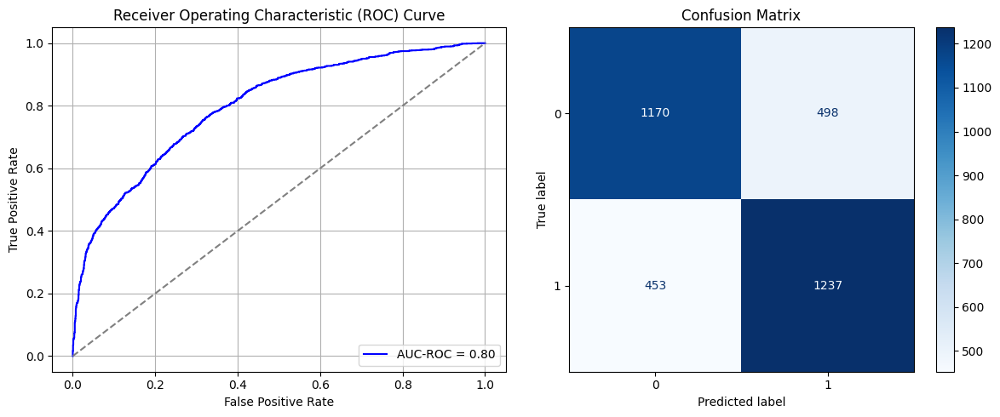

Best threshold based on F1-score: 0.3543061912059784
Time elapsed (performance): 18.792368829000225


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_295"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2065 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2066 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2071 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7551 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.7733
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7388 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.7108
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7645 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7066
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7697 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.7294
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7756 - loss: 0.5340 - val_AUC: 0.0000e+00 - val_loss: 0.7290
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7742 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.7894
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8061 - loss: 0.5092 - val_AUC: 0.0000e+00 - val_loss: 0.6604
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7960 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.7674
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_296"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2072 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2073 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2078 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7479 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.7522
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7689 - loss: 0.5429 - val_AUC: 0.0000e+00 - val_loss: 0.7364
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7565 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.7565
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7657 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7717 - loss: 0.5364 - val_AUC: 0.0000e+00 - val_loss: 0.6456
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7920 - loss: 0.5228 - val_AUC: 0.0000e+00 - val_loss: 0.7228
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7855 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8119 - loss: 0.5142 - val_AUC: 0.0000e+00 - val_loss: 0.6806
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_297"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2079 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2080 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2085 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7326 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.7437
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7409 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7556
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7620 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.7264
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7501 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.7817
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7852 - loss: 0.5239 - val_AUC: 0.0000e+00 - val_loss: 0.7547
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7777 - loss: 0.5354 - val_AUC: 0.0000e+00 - val_loss: 0.7170
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8007 - loss: 0.5148 - val_AUC: 0.0000e+00 - val_loss: 0.7422
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7888 - loss: 0.5346 - val_AUC: 0.0000e+00 - val_loss: 0.6017
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_298"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2086 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2087 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2092 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7455 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8014
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.7274
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7531 - loss: 0.5510 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7671 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7340
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7699 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7567
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7735 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.7363
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7859 - loss: 0.5211 - val_AUC: 0.0000e+00 - val_loss: 0.6949
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7994 - loss: 0.5130 - val_AUC: 0.0000e+00 - val_loss: 0.6503
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_299"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2093 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2094 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2099 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7448 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8067
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7458 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7640 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.7155
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7642 - loss: 0.5440 - val_AUC: 0.0000e+00 - val_loss: 0.6913
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7651 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7581
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7710 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.7718
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7818 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.6477
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8095 - loss: 0.5100 - val_AUC: 0.0000e+00 - val_loss: 0.6444
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_300"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2100 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2101 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2106 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7481 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7537 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7505 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7570
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7628 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.7170
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7720 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.7426
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7805 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7074
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8077 - loss: 0.5140 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7937 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.6963
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_301"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2107 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2108 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2113 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7412 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.7292
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7303 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.7208
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7438 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.7482
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7751 - loss: 0.5315 - val_AUC: 0.0000e+00 - val_loss: 0.7347
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7815 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.7243
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7748 - loss: 0.5372 - val_AUC: 0.0000e+00 - val_loss: 0.6326
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7951 - loss: 0.5178 - val_AUC: 0.0000e+00 - val_loss: 0.7157
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8020 - loss: 0.5154 - val_AUC: 0.0000e+00 - val_loss: 0.6635
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_302"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2114 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2115 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2120 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7601 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.7016
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7648 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7542 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.7303
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7548 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7873 - loss: 0.5296 - val_AUC: 0.0000e+00 - val_loss: 0.7232
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7793 - loss: 0.5284 - val_AUC: 0.0000e+00 - val_loss: 0.7637
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7884 - loss: 0.5192 - val_AUC: 0.0000e+00 - val_loss: 0.7047
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7886 - loss: 0.5200 - val_AUC: 0.0000e+00 - val_loss: 0.6609
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_303"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2121 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2122 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2127 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7330 - loss: 0.6154 - val_AUC: 0.0000e+00 - val_loss: 0.7153
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.7586
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7612 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.7336
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7528 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.7423
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7602 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.7684
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7686 - loss: 0.5402 - val_AUC: 0.0000e+00 - val_loss: 0.7206
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7820 - loss: 0.5305 - val_AUC: 0.0000e+00 - val_loss: 0.6631
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7918 - loss: 0.5262 - val_AUC: 0.0000e+00 - val_loss: 0.6914
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_304"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2128 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2129 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2134 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7508 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.7711
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7525 - loss: 0.5588 - val_AUC: 0.0000e+00 - val_loss: 0.7819
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7569 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.7759
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7519 - loss: 0.5530 - val_AUC: 0.0000e+00 - val_loss: 0.6728
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7797 - loss: 0.5318 - val_AUC: 0.0000e+00 - val_loss: 0.7426
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7780 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.6937
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7971 - loss: 0.5196 - val_AUC: 0.0000e+00 - val_loss: 0.6681
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7952 - loss: 0.5237 - val_AUC: 0.0000e+00 - val_loss: 0.6951
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_305"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2135 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2136 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2141 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7584 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.7599
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7566 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7601 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.7404
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7572 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.6864
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7758 - loss: 0.5339 - val_AUC: 0.0000e+00 - val_loss: 0.7550
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7724 - loss: 0.5395 - val_AUC: 0.0000e+00 - val_loss: 0.7647
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7745 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.6528
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7980 - loss: 0.5163 - val_AUC: 0.0000e+00 - val_loss: 0.6408
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_306"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2142 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2143 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2148 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7528 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.7329
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7589 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.7917
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7574 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.6887
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7593 - loss: 0.5547 - val_AUC: 0.0000e+00 - val_loss: 0.7121
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7723 - loss: 0.5320 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7643 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.7657
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7741 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.6969
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8002 - loss: 0.5208 - val_AUC: 0.0000e+00 - val_loss: 0.7153
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_307"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2149 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2150 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2155 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - AUC: 0.7481 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7327 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.7706
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7490 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.7588
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7628 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.7821
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7727 - loss: 0.5351 - val_AUC: 0.0000e+00 - val_loss: 0.6895
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7858 - loss: 0.5304 - val_AUC: 0.0000e+00 - val_loss: 0.6704
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7835 - loss: 0.5286 - val_AUC: 0.0000e+00 - val_loss: 0.7826
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8056 - loss: 0.5089 - val_AUC: 0.0000e+00 - val_loss: 0.6854
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2156 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2157 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2162 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7556 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.7887
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7628 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7652 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.7540
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7571 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.7283
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.7819
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7668 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.7405
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7849 - loss: 0.5336 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7896 - loss: 0.5242 - val_AUC: 0.0000e+00 - val_loss: 0.6145
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2163 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2164 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2169 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7431 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.7094
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7567 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7654 - loss: 0.5411 - val_AUC: 0.0000e+00 - val_loss: 0.6995
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7745 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.8060
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7619 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.6961
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7938 - loss: 0.5266 - val_AUC: 0.0000e+00 - val_loss: 0.7170
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7906 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7400
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8082 - loss: 0.5077 - val_AUC: 0.0000e+00 - val_loss: 0.6425
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2170 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2171 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2176 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7283 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.7376
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.7099
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7576 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.7289
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7657 - loss: 0.5449 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7802 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7657 - loss: 0.5487 - val_AUC: 0.0000e+00 - val_loss: 0.7408
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8006 - loss: 0.5168 - val_AUC: 0.0000e+00 - val_loss: 0.7432
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7939 - loss: 0.5252 - val_AUC: 0.0000e+00 - val_loss: 0.7076
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2177 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2178 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2183 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7204 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7504 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.7494
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7636 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.6970
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7695 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7663 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.6535
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7792 - loss: 0.5333 - val_AUC: 0.0000e+00 - val_loss: 0.7294
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7823 - loss: 0.5412 - val_AUC: 0.0000e+00 - val_loss: 0.7995
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7869 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.7584
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2184 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2185 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2190 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7415 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.7218
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7552 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7371 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8143
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7604 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.6820
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7624 - loss: 0.5491 - val_AUC: 0.0000e+00 - val_loss: 0.7659
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7705 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.7668
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7956 - loss: 0.5170 - val_AUC: 0.0000e+00 - val_loss: 0.7377
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7870 - loss: 0.5265 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2191 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2192 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2197 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7490 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.7523
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7421 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.7286
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7569 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.8081
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7759 - loss: 0.5355 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7585 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.7672
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7879 - loss: 0.5215 - val_AUC: 0.0000e+00 - val_loss: 0.7869
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7691 - loss: 0.5383 - val_AUC: 0.0000e+00 - val_loss: 0.8328
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7859 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2198 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2199 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2204 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7390 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.7352
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7394 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7548 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.7224
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7674 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.6624
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7555 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.6622
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7737 - loss: 0.5319 - val_AUC: 0.0000e+00 - val_loss: 0.7256
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7776 - loss: 0.5297 - val_AUC: 0.0000e+00 - val_loss: 0.7493
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7910 - loss: 0.5220 - val_AUC: 0.0000e+00 - val_loss: 0.7134
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

In [ ]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRSwR = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRSwR, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)

In [ ]:
print(ParamFit)
ParamFit.to_csv('SRSwR_Fine_Tuning.csv')

         FPR       FNR
0   0.125716  0.400000
1   0.118553  0.431884
2   0.141834  0.365217
3   0.171920  0.318841
4   0.117837  0.431884
..       ...       ...
95  0.109957  0.440580
96  0.177292  0.307246
97  0.186963  0.318841
98  0.093481  0.475362
99  0.185172  0.281159

[100 rows x 2 columns]


In [ ]:
ParamFit['FNR'].mean()

np.float64(0.4149565217391304)

## Systematic Sampling:

First, we select a single systematic sample from the majority class, in which $k = \frac{N_0}{N_1}$, where $N_0$ is the majority class size in the source domain and $N_1$ is the minority class in the source domain.

In [ ]:
X_S_Sy, y_S_Sy = systematic_undersampler(data_S_full, data_S_full.iloc[:,-1])
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_undersampler(T_train, T_train.iloc[:, -1])
print(y_T_train_Sy)


8393
23544
2.8051948051948052
2
[1, 3, 6, 9, 12, 15, 17, 20, 23, 26, 29, 31, 34, 37, 40, 43, 45, 48, 51, 54, 57, 59, 62, 65, 68, 71, 73, 76, 79, 82, 85, 87, 90, 93, 96, 99, 101, 104, 107, 110, 113, 116, 118, 121, 124, 127, 130, 132, 135, 138, 141, 144, 146, 149, 152, 155, 158, 160, 163, 166, 169, 172, 174, 177, 180, 183, 186, 188, 191, 194, 197, 200, 202, 205, 208, 211, 214, 217, 219, 222, 225, 228, 231, 233, 236, 239, 242, 245, 247, 250, 253, 256, 259, 261, 264, 267, 270, 273, 275, 278, 281, 284, 287, 289, 292, 295, 298, 301, 303, 306, 309, 312, 315, 317, 320, 323, 326, 329, 332, 334, 337, 340, 343, 346, 348, 351, 354, 357, 360, 362, 365, 368, 371, 374, 376, 379, 382, 385, 388, 390, 393, 396, 399, 402, 404, 407, 410, 413, 416, 418, 421, 424, 427, 430, 433, 435, 438, 441, 444, 447, 449, 452, 455, 458, 461, 463, 466, 469, 472, 475, 477, 480, 483, 486, 489, 491, 494, 497, 500, 503, 505, 508, 511, 514, 517, 519, 522, 525, 528, 531, 533, 536, 539, 542, 545, 548, 550, 553, 556, 559, 562, 56

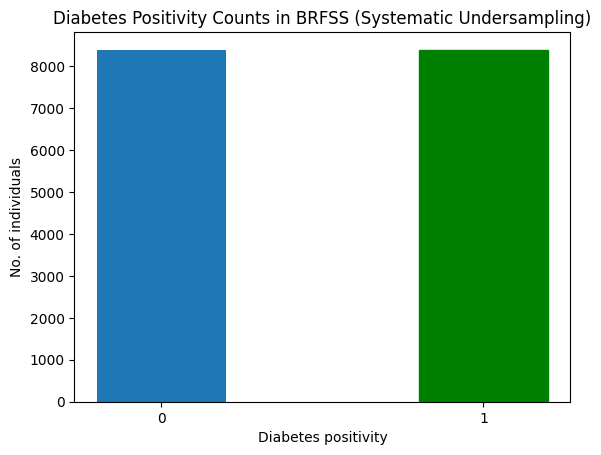

In [ ]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Undersampling)")
plt.show()

In [ ]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (13428, 12)
y_S_train: (13428,)
X_S_test: (3358, 12)
y_S_test: (3358,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2205 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2206 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2210 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2211 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6853 - loss: 0.6375 - val_AUC: 0.7707 - val_loss: 0.5599
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7666 - loss: 0.5702 - val_AUC: 0.7941 - val_loss: 0.5682
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7808 - loss: 0.5639 - val_AUC: 0.8152 - val_loss: 0.5305
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7906 - loss: 0.5552 - val_AUC: 0.8180 - val_loss: 0.5236
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8082 - loss: 0.5339 - val_AUC: 0.8106 - val_loss: 0.5347
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8124 - loss: 0.5298 - val_AUC: 0.8243 - val_loss: 0.5178
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8130 - loss: 0.5285 - val_AUC: 0.8200 - val_loss: 0.5217
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8120 - loss: 0.5288 - val_AUC: 0.8089 - val_loss: 0.5536
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

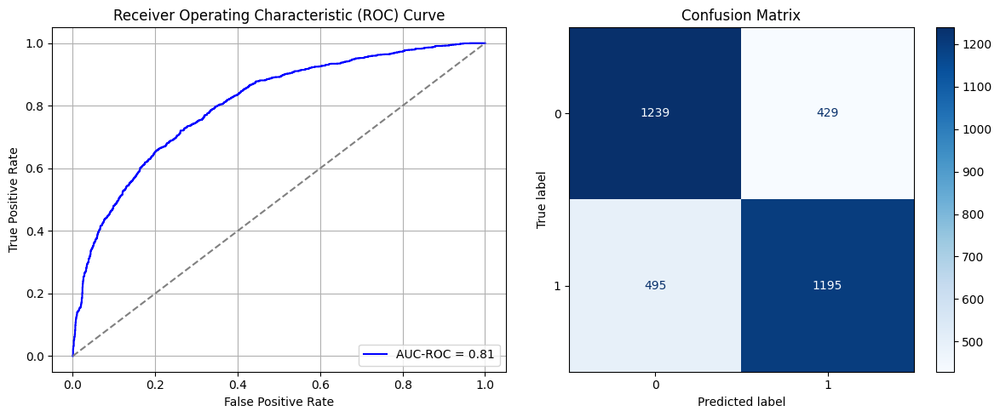

Best threshold based on F1-score: 0.2745870351791382
Time elapsed (performance): 17.864428911000687


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2212 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2213 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2217 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2218 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6930 - loss: 0.6413 - val_AUC: 0.0000e+00 - val_loss: 0.6785
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7232 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.6893
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7545 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.7020
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7728 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.6862
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7945 - loss: 0.5309 - val_AUC: 0.0000e+00 - val_loss: 0.7358
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8001 - loss: 0.5227 - val_AUC: 0.0000e+00 - val_loss: 0.6288
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7979 - loss: 0.5254 - val_AUC: 0.0000e+00 - val_loss: 0.7961
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8279 - loss: 0.4932 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2219 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2220 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2224 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2225 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7110 - loss: 0.6266 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7218 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.6946
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7576 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.7509
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7745 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.7317
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7956 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.9337
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7897 - loss: 0.5378 - val_AUC: 0.0000e+00 - val_loss: 0.7413
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8102 - loss: 0.5026 - val_AUC: 0.0000e+00 - val_loss: 0.6765
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8315 - loss: 0.4942 - val_AUC: 0.0000e+00 - val_loss: 0.7660
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2226 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2227 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2231 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2232 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7008 - loss: 0.6294 - val_AUC: 0.0000e+00 - val_loss: 0.6962
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7386 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7635 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.7540
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7537 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7792 - loss: 0.5435 - val_AUC: 0.0000e+00 - val_loss: 0.6530
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8033 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.6767
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8214 - loss: 0.5069 - val_AUC: 0.0000e+00 - val_loss: 0.6661
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8139 - loss: 0.5087 - val_AUC: 0.0000e+00 - val_loss: 0.6153
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2233 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2234 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2238 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2239 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7251 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7261 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8002
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7607 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7688 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7928 - loss: 0.5299 - val_AUC: 0.0000e+00 - val_loss: 0.6969
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7876 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8112 - loss: 0.5135 - val_AUC: 0.0000e+00 - val_loss: 0.7241
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8233 - loss: 0.5040 - val_AUC: 0.0000e+00 - val_loss: 0.6412
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2240 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2241 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2245 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2246 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6891 - loss: 0.6481 - val_AUC: 0.0000e+00 - val_loss: 0.8182
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7420 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7386 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.7126
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7736 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.7416
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7878 - loss: 0.5367 - val_AUC: 0.0000e+00 - val_loss: 0.7606
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7843 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.5800
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8000 - loss: 0.5193 - val_AUC: 0.0000e+00 - val_loss: 0.7707
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8298 - loss: 0.4916 - val_AUC: 0.0000e+00 - val_loss: 0.7666
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2247 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2248 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2252 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2253 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6970 - loss: 0.6530 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7261 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.7026
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7625 - loss: 0.5573 - val_AUC: 0.0000e+00 - val_loss: 0.7671
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7678 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.7883
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7938 - loss: 0.5285 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8158 - loss: 0.5180 - val_AUC: 0.0000e+00 - val_loss: 0.6219
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8174 - loss: 0.5079 - val_AUC: 0.0000e+00 - val_loss: 0.6153
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8272 - loss: 0.5034 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2254 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2255 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2259 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2260 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7029 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.7634
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7327 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.7442
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7717 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.6193
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7793 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.6264
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7956 - loss: 0.5263 - val_AUC: 0.0000e+00 - val_loss: 0.7210
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8122 - loss: 0.5198 - val_AUC: 0.0000e+00 - val_loss: 0.8307
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8173 - loss: 0.5126 - val_AUC: 0.0000e+00 - val_loss: 0.7395
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8192 - loss: 0.5107 - val_AUC: 0.0000e+00 - val_loss: 0.7190
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2261 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2262 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2266 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2267 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7038 - loss: 0.6333 - val_AUC: 0.0000e+00 - val_loss: 0.7807
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7349 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.7463
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7487 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.7398
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7833 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.7092
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7989 - loss: 0.5254 - val_AUC: 0.0000e+00 - val_loss: 0.6660
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7905 - loss: 0.5320 - val_AUC: 0.0000e+00 - val_loss: 0.6581
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8037 - loss: 0.5200 - val_AUC: 0.0000e+00 - val_loss: 0.5858
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8237 - loss: 0.5081 - val_AUC: 0.0000e+00 - val_loss: 0.7340
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2268 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2269 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2273 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2274 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6958 - loss: 0.6400 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7033 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.7549
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7278 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.6268
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7680 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.7439
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7821 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.7748
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8009 - loss: 0.5176 - val_AUC: 0.0000e+00 - val_loss: 0.6458
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8090 - loss: 0.5197 - val_AUC: 0.0000e+00 - val_loss: 0.6796
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8347 - loss: 0.4909 - val_AUC: 0.0000e+00 - val_loss: 0.6629
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2275 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2276 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2280 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2281 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6921 - loss: 0.6458 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7330 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.6647
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7572 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.7766
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7715 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.7767
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7703 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.6327
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7911 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.7292
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8225 - loss: 0.5010 - val_AUC: 0.0000e+00 - val_loss: 0.7032
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8136 - loss: 0.5128 - val_AUC: 0.0000e+00 - val_loss: 0.6807
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2282 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2283 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2287 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2288 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6949 - loss: 0.6398 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.6705
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7689 - loss: 0.5511 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7685 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.6914
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7835 - loss: 0.5405 - val_AUC: 0.0000e+00 - val_loss: 0.7189
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8079 - loss: 0.5220 - val_AUC: 0.0000e+00 - val_loss: 0.6396
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8160 - loss: 0.5115 - val_AUC: 0.0000e+00 - val_loss: 0.6659
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8292 - loss: 0.4978 - val_AUC: 0.0000e+00 - val_loss: 0.6280
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2289 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2290 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2294 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2295 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7107 - loss: 0.6306 - val_AUC: 0.0000e+00 - val_loss: 0.7830
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7257 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.7982
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7473 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.7417
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7822 - loss: 0.5427 - val_AUC: 0.0000e+00 - val_loss: 0.7632
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7761 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.7544
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.8032 - loss: 0.5218 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8128 - loss: 0.5126 - val_AUC: 0.0000e+00 - val_loss: 0.7379
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8288 - loss: 0.4987 - val_AUC: 0.0000e+00 - val_loss: 0.7105
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2296 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2297 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2301 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2302 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6839 - loss: 0.6563 - val_AUC: 0.0000e+00 - val_loss: 0.7418
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7252 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.7269
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7444 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7672 - loss: 0.5538 - val_AUC: 0.0000e+00 - val_loss: 0.6499
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7865 - loss: 0.5372 - val_AUC: 0.0000e+00 - val_loss: 0.6705
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7954 - loss: 0.5238 - val_AUC: 0.0000e+00 - val_loss: 0.6712
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8052 - loss: 0.5230 - val_AUC: 0.0000e+00 - val_loss: 0.7118
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8187 - loss: 0.5076 - val_AUC: 0.0000e+00 - val_loss: 0.6942
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2303 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2304 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2308 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2309 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6745 - loss: 0.6682 - val_AUC: 0.0000e+00 - val_loss: 0.7282
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7247 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8140
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7341 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.7417
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7500 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.6854
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7870 - loss: 0.5340 - val_AUC: 0.0000e+00 - val_loss: 0.7749
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7917 - loss: 0.5215 - val_AUC: 0.0000e+00 - val_loss: 0.7370
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.8195 - loss: 0.5105 - val_AUC: 0.0000e+00 - val_loss: 0.7253
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8169 - loss: 0.5070 - val_AUC: 0.0000e+00 - val_loss: 0.6662
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2310 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2311 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2315 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2316 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7033 - loss: 0.6307 - val_AUC: 0.0000e+00 - val_loss: 0.6896
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7222 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7377 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7756 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.6553
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7939 - loss: 0.5303 - val_AUC: 0.0000e+00 - val_loss: 0.5622
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8037 - loss: 0.5221 - val_AUC: 0.0000e+00 - val_loss: 0.6675
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8125 - loss: 0.5153 - val_AUC: 0.0000e+00 - val_loss: 0.6517
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8092 - loss: 0.5097 - val_AUC: 0.0000e+00 - val_loss: 0.6370
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2317 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2318 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2322 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2323 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7087 - loss: 0.6245 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7250 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.6983
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7528 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.7253
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7631 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.6420
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7831 - loss: 0.5419 - val_AUC: 0.0000e+00 - val_loss: 0.7316
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8058 - loss: 0.5252 - val_AUC: 0.0000e+00 - val_loss: 0.7078
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8058 - loss: 0.5165 - val_AUC: 0.0000e+00 - val_loss: 0.6154
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8258 - loss: 0.5039 - val_AUC: 0.0000e+00 - val_loss: 0.6651
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2324 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2325 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2329 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2330 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6906 - loss: 0.6318 - val_AUC: 0.0000e+00 - val_loss: 0.8102
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7203 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.6979
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7452 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.7283
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7658 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.6723
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7885 - loss: 0.5257 - val_AUC: 0.0000e+00 - val_loss: 0.6794
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7990 - loss: 0.5254 - val_AUC: 0.0000e+00 - val_loss: 0.6481
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8089 - loss: 0.5135 - val_AUC: 0.0000e+00 - val_loss: 0.7377
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8150 - loss: 0.5108 - val_AUC: 0.0000e+00 - val_loss: 0.6221
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2331 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2332 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2336 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2337 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7095 - loss: 0.6225 - val_AUC: 0.0000e+00 - val_loss: 0.7453
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7438 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.7201
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7736 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.7774
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7812 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.6497
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7881 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.6814
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7967 - loss: 0.5250 - val_AUC: 0.0000e+00 - val_loss: 0.6065
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8189 - loss: 0.5145 - val_AUC: 0.0000e+00 - val_loss: 0.7524
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8302 - loss: 0.4962 - val_AUC: 0.0000e+00 - val_loss: 0.5446
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2338 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2339 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2343 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2344 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6950 - loss: 0.6377 - val_AUC: 0.0000e+00 - val_loss: 0.6706
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7383 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.7898
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7314 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.6806
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7858 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.5230
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7950 - loss: 0.5283 - val_AUC: 0.0000e+00 - val_loss: 0.6255
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8046 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.6713
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8219 - loss: 0.5045 - val_AUC: 0.0000e+00 - val_loss: 0.7064
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8071 - loss: 0.5118 - val_AUC: 0.0000e+00 - val_loss: 0.6023
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2345 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2346 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2350 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2351 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7085 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.7771
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7357 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7451 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.7479
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7765 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.7557
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7922 - loss: 0.5376 - val_AUC: 0.0000e+00 - val_loss: 0.7090
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8061 - loss: 0.5209 - val_AUC: 0.0000e+00 - val_loss: 0.7210
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8152 - loss: 0.5145 - val_AUC: 0.0000e+00 - val_loss: 0.7649
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8230 - loss: 0.4992 - val_AUC: 0.0000e+00 - val_loss: 0.7272
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2352 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2353 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2357 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2358 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7054 - loss: 0.6322 - val_AUC: 0.7816 - val_loss: 0.5585
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7694 - loss: 0.5719 - val_AUC: 0.7922 - val_loss: 0.5492
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7815 - loss: 0.5619 - val_AUC: 0.7959 - val_loss: 0.5506
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7979 - loss: 0.5480 - val_AUC: 0.8128 - val_loss: 0.5317
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8010 - loss: 0.5433 - val_AUC: 0.8128 - val_loss: 0.5359
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8083 - loss: 0.5346 - val_AUC: 0.8107 - val_loss: 0.5382
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8075 - loss: 0.5347 - val_AUC: 0.8119 - val_loss: 0.5469
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8163 - loss: 0.5235 - val_AUC: 0.8220 - val_loss: 0.5285
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

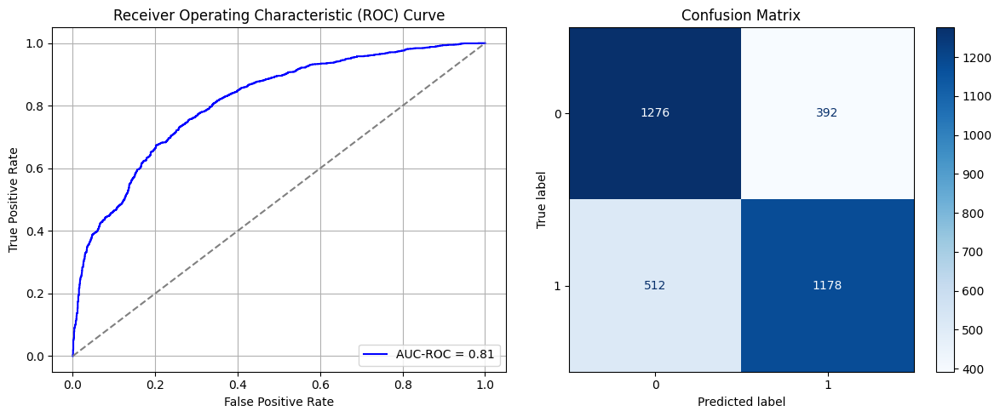

Best threshold based on F1-score: 0.35295239090919495
Time elapsed (performance): 18.128609159000007


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2359 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2360 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2364 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2365 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6406 - loss: 0.6639 - val_AUC: 0.0000e+00 - val_loss: 0.7611
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6919 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7200 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7306 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8201
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7588 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7705 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7813 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.6628
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7938 - loss: 0.5270 - val_AUC: 0.0000e+00 - val_loss: 0.6704
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2366 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2367 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2371 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2372 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6573 - loss: 0.6554 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7021 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.7161
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7311 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.7438
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7426 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7588 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7743 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.7486
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7724 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7597
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8014 - loss: 0.5244 - val_AUC: 0.0000e+00 - val_loss: 0.7152
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_339"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2373 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2374 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2378 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2379 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6525 - loss: 0.6604 - val_AUC: 0.0000e+00 - val_loss: 0.7942
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6874 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7305 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7367 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8620
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7602 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.7593
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7627 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.8014
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7823 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.8017
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7987 - loss: 0.5281 - val_AUC: 0.0000e+00 - val_loss: 0.6907
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_340"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2380 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2381 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2385 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2386 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6648 - loss: 0.6567 - val_AUC: 0.0000e+00 - val_loss: 0.8696
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7049 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7359 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7761
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7432 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8553
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7633 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.7883
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7756 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.6266
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7937 - loss: 0.5345 - val_AUC: 0.0000e+00 - val_loss: 0.7255
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8103 - loss: 0.5194 - val_AUC: 0.0000e+00 - val_loss: 0.6973
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_341"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2387 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2388 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2392 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2393 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6553 - loss: 0.6601 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6803 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.7460
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7354 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.7824
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7284 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.7613
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7469 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.7573
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7578 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7865 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7663
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8013 - loss: 0.5199 - val_AUC: 0.0000e+00 - val_loss: 0.7333
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_342"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2394 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2395 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2399 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2400 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6572 - loss: 0.6540 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7011 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8111
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7235 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7236 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7542 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.7673
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7657 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7498
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7752 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.6344
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8004 - loss: 0.5236 - val_AUC: 0.0000e+00 - val_loss: 0.5808
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_343"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2401 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2402 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2406 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2407 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6562 - loss: 0.6567 - val_AUC: 0.0000e+00 - val_loss: 0.7925
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7060 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.7545
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7085 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8270
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7504 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7322
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7591 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.6850
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7884 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.6597
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7878 - loss: 0.5392 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_344"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2408 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2409 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2413 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2414 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6467 - loss: 0.6645 - val_AUC: 0.0000e+00 - val_loss: 0.7362
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6945 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7139 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7327 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7628 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7744 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.8135
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7938 - loss: 0.5230 - val_AUC: 0.0000e+00 - val_loss: 0.6836
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7904 - loss: 0.5170 - val_AUC: 0.0000e+00 - val_loss: 0.6507
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_345"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2415 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2416 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2420 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2421 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6559 - loss: 0.6565 - val_AUC: 0.0000e+00 - val_loss: 0.8302
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6933 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8157
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7056 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.7852
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7288 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8112
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7378 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.7444
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7586 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.6864
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7916 - loss: 0.5268 - val_AUC: 0.0000e+00 - val_loss: 0.7173
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7929 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.6622
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_346"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2422 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2423 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2427 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2428 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6535 - loss: 0.6623 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6954 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7229 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7642
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7507 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7755 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.8008
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7728 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.7643
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7826 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.7417
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8043 - loss: 0.5179 - val_AUC: 0.0000e+00 - val_loss: 0.6126
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2429 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2430 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2434 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2435 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6566 - loss: 0.6550 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6853 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.8123
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7186 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7444 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7543 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.7752
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7727 - loss: 0.5424 - val_AUC: 0.0000e+00 - val_loss: 0.6709
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7927 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.7913
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8029 - loss: 0.5209 - val_AUC: 0.0000e+00 - val_loss: 0.8181
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2436 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2437 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2441 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2442 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6530 - loss: 0.6553 - val_AUC: 0.0000e+00 - val_loss: 0.7384
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6972 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.8035
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7350 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7121
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7572 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7497 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.7489
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7738 - loss: 0.5435 - val_AUC: 0.0000e+00 - val_loss: 0.6599
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7746 - loss: 0.5390 - val_AUC: 0.0000e+00 - val_loss: 0.6367
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8021 - loss: 0.5257 - val_AUC: 0.0000e+00 - val_loss: 0.6905
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2443 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2444 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2448 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2449 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6517 - loss: 0.6572 - val_AUC: 0.0000e+00 - val_loss: 0.7183
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7025 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.7683
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7300 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7280
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7420 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.7191
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7475 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.7217
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7669 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.7219
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7633 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.6523
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7972 - loss: 0.5297 - val_AUC: 0.0000e+00 - val_loss: 0.7406
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2450 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2451 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2455 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2456 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6751 - loss: 0.6383 - val_AUC: 0.0000e+00 - val_loss: 0.7603
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7017 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7171 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.7614
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7378 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.7885
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7586 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.6620
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7991 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.7343
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7906 - loss: 0.5335 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8236 - loss: 0.5044 - val_AUC: 0.0000e+00 - val_loss: 0.5824
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2457 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2458 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2462 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2463 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6551 - loss: 0.6621 - val_AUC: 0.0000e+00 - val_loss: 0.8005
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7002 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.7692
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7365 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7365 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7633 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7496 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7765
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7775 - loss: 0.5487 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7923 - loss: 0.5304 - val_AUC: 0.0000e+00 - val_loss: 0.7367
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2464 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2465 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2469 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2470 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6698 - loss: 0.6491 - val_AUC: 0.0000e+00 - val_loss: 0.7331
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6912 - loss: 0.6050 - val_AUC: 0.0000e+00 - val_loss: 0.7504
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7034 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.8079
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7314 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.7529
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7578 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.7245
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7812 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.8232
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7744 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.7206
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7827 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2471 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2472 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2476 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2477 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6734 - loss: 0.6464 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7126 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.7476
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7305 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.7201
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7333 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.7841
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7453 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8657
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7611 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.6977
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7812 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.5979
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.8022 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.6669
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2478 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2479 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2483 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2484 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6558 - loss: 0.6634 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6900 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.7982
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7198 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.7778
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7520 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7653 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.7229
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7799 - loss: 0.5368 - val_AUC: 0.0000e+00 - val_loss: 0.7004
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7837 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.7659
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7969 - loss: 0.5240 - val_AUC: 0.0000e+00 - val_loss: 0.6967
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2485 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2486 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2490 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2491 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6699 - loss: 0.6458 - val_AUC: 0.0000e+00 - val_loss: 0.7572
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7097 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7276 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7422 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.7939
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7553 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.7503
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7889 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7812 - loss: 0.5397 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8091 - loss: 0.5105 - val_AUC: 0.0000e+00 - val_loss: 0.6374
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2492 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2493 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2497 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2498 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6528 - loss: 0.6654 - val_AUC: 0.0000e+00 - val_loss: 0.7500
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6755 - loss: 0.6181 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7160 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.7809
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7386 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7496 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7126
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7598 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.6623
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7809 - loss: 0.5378 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8059 - loss: 0.5207 - val_AUC: 0.0000e+00 - val_loss: 0.6395
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2499 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2500 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2504 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2505 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7131 - loss: 0.6330 - val_AUC: 0.7715 - val_loss: 0.5636
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7704 - loss: 0.5690 - val_AUC: 0.7902 - val_loss: 0.5483
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7841 - loss: 0.5588 - val_AUC: 0.8032 - val_loss: 0.5449
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8005 - loss: 0.5450 - val_AUC: 0.8095 - val_loss: 0.5338
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8067 - loss: 0.5381 - val_AUC: 0.8150 - val_loss: 0.5289
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8088 - loss: 0.5340 - val_AUC: 0.8156 - val_loss: 0.5306
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8055 - loss: 0.5382 - val_AUC: 0.8199 - val_loss: 0.5322
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8141 - loss: 0.5269 - val_AUC: 0.8230 - val_loss: 0.5176
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

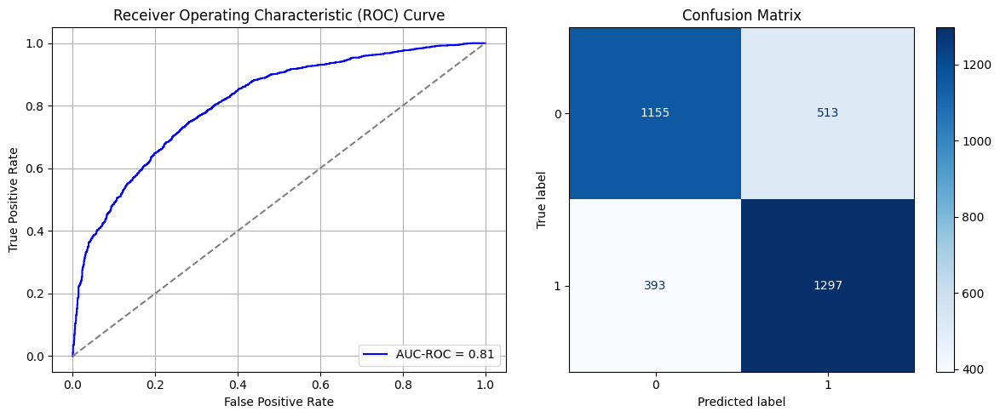

Best threshold based on F1-score: 0.35285574197769165
Time elapsed (performance): 18.09283205599968


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2506 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2507 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2511 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2512 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - AUC: 0.6300 - loss: 0.6704 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6993 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6987 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7310 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8072
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7345 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.7688
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7178 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.7623
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7264 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.7961
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2513 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2514 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2518 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2519 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.6712 - loss: 0.6331 - val_AUC: 0.0000e+00 - val_loss: 0.8127
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6913 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.7792
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6987 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.7923
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7201 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.7709
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7160 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.7038
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7224 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7489 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7776
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2520 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2521 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2525 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2526 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6464 - loss: 0.6553 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6862 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7081 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.7875
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7110 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7132 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7415 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7259 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.7592
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7528 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7722
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2527 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2528 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2532 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2533 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6719 - loss: 0.6325 - val_AUC: 0.0000e+00 - val_loss: 0.8378
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7126 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.7799
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7176 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7257 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7348 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.7699
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.7175
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7434 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2534 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2535 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2539 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2540 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6471 - loss: 0.6488 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6891 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7125 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7220 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7183 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.7640
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7391 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7389 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.7349
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7298 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2541 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2542 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2546 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2547 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6562 - loss: 0.6483 - val_AUC: 0.0000e+00 - val_loss: 0.7778
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7060 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7222 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7228 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7299 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7376 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7355 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7375 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8270
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2548 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2549 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2553 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2554 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6425 - loss: 0.6566 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7026 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8190
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7187 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7245 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.7681
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7466 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8229
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7361 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.7366
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7452 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2555 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2556 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2560 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2561 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6598 - loss: 0.6415 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7144 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.7735
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7047 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7133 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7340 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8454
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7345 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.7636
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7426 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7474 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.7645
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2562 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2563 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2567 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2568 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6609 - loss: 0.6453 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6950 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7166 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.7676
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6993 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7275 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8294
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7411 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.7162
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2569 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2570 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2574 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2575 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6602 - loss: 0.6376 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6972 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7197 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7203 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.7669
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.7864
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7446 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7368 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7538 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.7450
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2576 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2577 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2581 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2582 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6520 - loss: 0.6472 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7093 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7077 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7235 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.7867
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7431 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.7923
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7176 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.7733
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7501 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.7944
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7382 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.7386
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2583 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2584 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2585 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2588 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2589 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6596 - loss: 0.6475 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7077 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7164 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.7671
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7145 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7093 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7372 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.7540
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7518 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7239 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2590 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2591 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2592 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2595 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2596 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6686 - loss: 0.6326 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7190 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7175 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.7297
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7216 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8002
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7383 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7601
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7517 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.7561
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7475 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.7791
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2597 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2598 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2599 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2602 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2603 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.6574 - loss: 0.6424 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7093 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.7824
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7348 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7189 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7169 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.7867
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7378 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.7670
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7546 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7417 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2604 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2605 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2606 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2609 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2610 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6394 - loss: 0.6606 - val_AUC: 0.0000e+00 - val_loss: 0.8168
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7022 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7258 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7404 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8642
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7487 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.7713
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7465 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2611 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2612 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2613 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2616 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2617 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6617 - loss: 0.6392 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7069 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8327
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7309 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7425 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.7495
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7382 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2618 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2619 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2620 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2623 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2624 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6640 - loss: 0.6444 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6938 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7157 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.7941
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8328
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7357 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.7646
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7292 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7474 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7350 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7776
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2625 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2626 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2627 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2630 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2631 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6545 - loss: 0.6513 - val_AUC: 0.0000e+00 - val_loss: 0.8239
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7141 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7052 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7345 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8303
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7327 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7293 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7910
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7461 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.7833
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7316 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.7551
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2632 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2633 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2634 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2637 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2638 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6609 - loss: 0.6512 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7085 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6857 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.8193
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7229 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.7363
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7372 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7283 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.7285
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7430 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2639 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2640 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2644 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2645 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6553 - loss: 0.6464 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7032 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7120 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.9286
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7321 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.7896
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7404 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.7380
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7432 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7554 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.7510
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2646 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2647 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2651 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2652 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7202 - loss: 0.6228 - val_AUC: 0.7719 - val_loss: 0.5743
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7699 - loss: 0.5707 - val_AUC: 0.7939 - val_loss: 0.5669
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7823 - loss: 0.5623 - val_AUC: 0.8067 - val_loss: 0.5382
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8024 - loss: 0.5429 - val_AUC: 0.8133 - val_loss: 0.5317
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8020 - loss: 0.5417 - val_AUC: 0.8064 - val_loss: 0.5394
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8044 - loss: 0.5389 - val_AUC: 0.8187 - val_loss: 0.5332
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8130 - loss: 0.5277 - val_AUC: 0.8186 - val_loss: 0.5269
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8156 - loss: 0.5247 - val_AUC: 0.8241 - val_loss: 0.5253
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - 

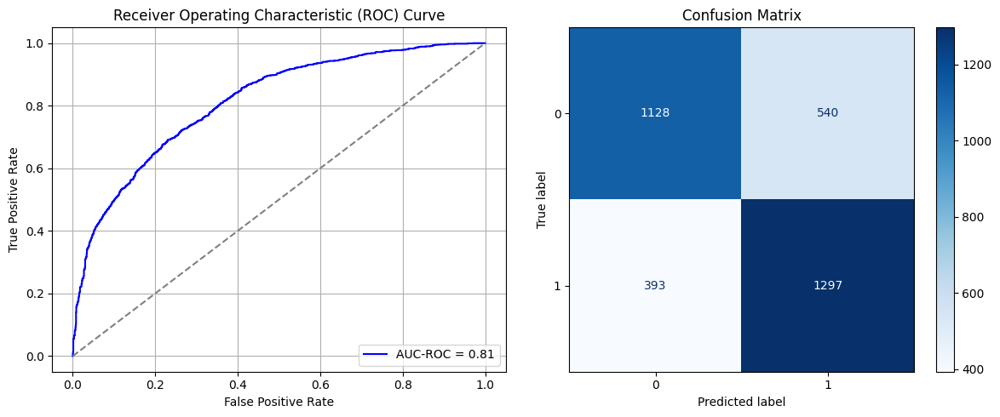

Best threshold based on F1-score: 0.3598543107509613
Time elapsed (performance): 21.917317265000747


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2653 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2654 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2658 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2659 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7121 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7958 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.7820
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8056 - loss: 0.5318 - val_AUC: 0.0000e+00 - val_loss: 0.7299
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8072 - loss: 0.5215 - val_AUC: 0.0000e+00 - val_loss: 0.7660
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8273 - loss: 0.5028 - val_AUC: 0.0000e+00 - val_loss: 0.6873
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8308 - loss: 0.4919 - val_AUC: 0.0000e+00 - val_loss: 0.6632
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8131 - loss: 0.5037 - val_AUC: 0.0000e+00 - val_loss: 0.7162
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8220 - loss: 0.4887 - val_AUC: 0.0000e+00 - val_loss: 0.6515
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2660 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2661 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2665 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2666 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6994 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7896 - loss: 0.5503 - val_AUC: 0.0000e+00 - val_loss: 0.7151
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8002 - loss: 0.5359 - val_AUC: 0.0000e+00 - val_loss: 0.7445
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8052 - loss: 0.5151 - val_AUC: 0.0000e+00 - val_loss: 0.6730
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8099 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.7530
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8146 - loss: 0.5091 - val_AUC: 0.0000e+00 - val_loss: 0.6956
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8161 - loss: 0.4921 - val_AUC: 0.0000e+00 - val_loss: 0.6240
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8062 - loss: 0.5175 - val_AUC: 0.0000e+00 - val_loss: 0.6517
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2667 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2668 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2672 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2673 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7111 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7974 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.7885
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8128 - loss: 0.5275 - val_AUC: 0.0000e+00 - val_loss: 0.7214
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7972 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.7160
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8087 - loss: 0.5130 - val_AUC: 0.0000e+00 - val_loss: 0.6357
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8134 - loss: 0.5100 - val_AUC: 0.0000e+00 - val_loss: 0.7684
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8029 - loss: 0.5179 - val_AUC: 0.0000e+00 - val_loss: 0.6098
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.8130 - loss: 0.5060 - val_AUC: 0.0000e+00 - val_loss: 0.6420
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2674 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2675 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2679 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2680 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6890 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.7858
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7996 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8024 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.7113
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8253 - loss: 0.5026 - val_AUC: 0.0000e+00 - val_loss: 0.6092
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.8090 - loss: 0.5203 - val_AUC: 0.0000e+00 - val_loss: 0.7332
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8150 - loss: 0.5126 - val_AUC: 0.0000e+00 - val_loss: 0.6636
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8112 - loss: 0.5120 - val_AUC: 0.0000e+00 - val_loss: 0.7320
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8280 - loss: 0.4900 - val_AUC: 0.0000e+00 - val_loss: 0.6252
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2681 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2682 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2686 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2687 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6831 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7810 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8069
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8092 - loss: 0.5272 - val_AUC: 0.0000e+00 - val_loss: 0.7707
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8143 - loss: 0.5134 - val_AUC: 0.0000e+00 - val_loss: 0.6905
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8068 - loss: 0.5086 - val_AUC: 0.0000e+00 - val_loss: 0.6631
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8022 - loss: 0.5113 - val_AUC: 0.0000e+00 - val_loss: 0.6667
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8228 - loss: 0.4969 - val_AUC: 0.0000e+00 - val_loss: 0.6821
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8093 - loss: 0.5109 - val_AUC: 0.0000e+00 - val_loss: 0.6904
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2688 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2689 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2693 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2694 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6837 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7733 - loss: 0.5559 - val_AUC: 0.0000e+00 - val_loss: 0.7712
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7958 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.7518
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8280 - loss: 0.4999 - val_AUC: 0.0000e+00 - val_loss: 0.7077
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8104 - loss: 0.5106 - val_AUC: 0.0000e+00 - val_loss: 0.6888
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8091 - loss: 0.5078 - val_AUC: 0.0000e+00 - val_loss: 0.7667
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8157 - loss: 0.5028 - val_AUC: 0.0000e+00 - val_loss: 0.6142
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8169 - loss: 0.5055 - val_AUC: 0.0000e+00 - val_loss: 0.6564
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2695 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2696 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2700 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2701 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6897 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8189
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7892 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8066 - loss: 0.5316 - val_AUC: 0.0000e+00 - val_loss: 0.6766
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7997 - loss: 0.5225 - val_AUC: 0.0000e+00 - val_loss: 0.6946
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.8141 - loss: 0.5105 - val_AUC: 0.0000e+00 - val_loss: 0.6903
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8095 - loss: 0.5156 - val_AUC: 0.0000e+00 - val_loss: 0.7525
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8122 - loss: 0.5128 - val_AUC: 0.0000e+00 - val_loss: 0.6735
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8108 - loss: 0.5102 - val_AUC: 0.0000e+00 - val_loss: 0.7298
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2702 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2703 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2707 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2708 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6873 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7808 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.7089
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8073 - loss: 0.5302 - val_AUC: 0.0000e+00 - val_loss: 0.7048
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8155 - loss: 0.5136 - val_AUC: 0.0000e+00 - val_loss: 0.7382
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8094 - loss: 0.5167 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8061 - loss: 0.5083 - val_AUC: 0.0000e+00 - val_loss: 0.7663
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8171 - loss: 0.4970 - val_AUC: 0.0000e+00 - val_loss: 0.6104
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8229 - loss: 0.4928 - val_AUC: 0.0000e+00 - val_loss: 0.6206
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2709 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2710 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2714 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2715 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7093 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.7585
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7846 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.7652
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8015 - loss: 0.5298 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8185 - loss: 0.5117 - val_AUC: 0.0000e+00 - val_loss: 0.7659
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8132 - loss: 0.5108 - val_AUC: 0.0000e+00 - val_loss: 0.6554
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8179 - loss: 0.5131 - val_AUC: 0.0000e+00 - val_loss: 0.7275
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.8242 - loss: 0.4968 - val_AUC: 0.0000e+00 - val_loss: 0.7494
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8070 - loss: 0.5120 - val_AUC: 0.0000e+00 - val_loss: 0.6886
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2716 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2717 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2721 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2722 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7124 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7760 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.7750
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8176 - loss: 0.5251 - val_AUC: 0.0000e+00 - val_loss: 0.7507
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8097 - loss: 0.5142 - val_AUC: 0.0000e+00 - val_loss: 0.7190
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8179 - loss: 0.5112 - val_AUC: 0.0000e+00 - val_loss: 0.6736
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8256 - loss: 0.4967 - val_AUC: 0.0000e+00 - val_loss: 0.5913
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8082 - loss: 0.5114 - val_AUC: 0.0000e+00 - val_loss: 0.7531
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8146 - loss: 0.5053 - val_AUC: 0.0000e+00 - val_loss: 0.6304
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2723 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2724 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2728 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2729 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6985 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7853 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.7566
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8139 - loss: 0.5175 - val_AUC: 0.0000e+00 - val_loss: 0.6718
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8147 - loss: 0.5128 - val_AUC: 0.0000e+00 - val_loss: 0.7212
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8022 - loss: 0.5214 - val_AUC: 0.0000e+00 - val_loss: 0.6920
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8161 - loss: 0.5095 - val_AUC: 0.0000e+00 - val_loss: 0.6743
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8119 - loss: 0.5104 - val_AUC: 0.0000e+00 - val_loss: 0.6319
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8057 - loss: 0.5120 - val_AUC: 0.0000e+00 - val_loss: 0.7326
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2730 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2731 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2735 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2736 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7029 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8143
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7934 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.8069 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.7022
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8249 - loss: 0.5070 - val_AUC: 0.0000e+00 - val_loss: 0.6796
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8066 - loss: 0.5052 - val_AUC: 0.0000e+00 - val_loss: 0.6875
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8243 - loss: 0.4926 - val_AUC: 0.0000e+00 - val_loss: 0.6488
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8178 - loss: 0.5005 - val_AUC: 0.0000e+00 - val_loss: 0.6445
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8127 - loss: 0.5035 - val_AUC: 0.0000e+00 - val_loss: 0.6469
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2737 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2738 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2742 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2743 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6989 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7776 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8148 - loss: 0.5201 - val_AUC: 0.0000e+00 - val_loss: 0.7496
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8075 - loss: 0.5231 - val_AUC: 0.0000e+00 - val_loss: 0.7133
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8128 - loss: 0.5061 - val_AUC: 0.0000e+00 - val_loss: 0.6804
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8153 - loss: 0.5099 - val_AUC: 0.0000e+00 - val_loss: 0.6299
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8220 - loss: 0.4963 - val_AUC: 0.0000e+00 - val_loss: 0.6800
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8121 - loss: 0.5004 - val_AUC: 0.0000e+00 - val_loss: 0.6241
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2744 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2745 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2749 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2750 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7007 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7751 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.7292
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8118 - loss: 0.5208 - val_AUC: 0.0000e+00 - val_loss: 0.6477
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8032 - loss: 0.5244 - val_AUC: 0.0000e+00 - val_loss: 0.7290
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8040 - loss: 0.5230 - val_AUC: 0.0000e+00 - val_loss: 0.6801
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8096 - loss: 0.5126 - val_AUC: 0.0000e+00 - val_loss: 0.6717
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8049 - loss: 0.5165 - val_AUC: 0.0000e+00 - val_loss: 0.6633
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.8236 - loss: 0.4826 - val_AUC: 0.0000e+00 - val_loss: 0.5811
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2751 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2752 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2756 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2757 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7173 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.7782
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7846 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.7225
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8038 - loss: 0.5320 - val_AUC: 0.0000e+00 - val_loss: 0.6897
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8139 - loss: 0.5102 - val_AUC: 0.0000e+00 - val_loss: 0.6453
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8041 - loss: 0.5144 - val_AUC: 0.0000e+00 - val_loss: 0.7743
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8043 - loss: 0.5124 - val_AUC: 0.0000e+00 - val_loss: 0.7022
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8003 - loss: 0.5142 - val_AUC: 0.0000e+00 - val_loss: 0.6803
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8072 - loss: 0.5066 - val_AUC: 0.0000e+00 - val_loss: 0.7520
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2758 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2759 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2763 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2764 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7106 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8014
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7785 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.7742
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7909 - loss: 0.5429 - val_AUC: 0.0000e+00 - val_loss: 0.7504
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8139 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.6681
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7976 - loss: 0.5234 - val_AUC: 0.0000e+00 - val_loss: 0.6260
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7934 - loss: 0.5251 - val_AUC: 0.0000e+00 - val_loss: 0.7040
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8133 - loss: 0.5036 - val_AUC: 0.0000e+00 - val_loss: 0.6626
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.8193 - loss: 0.4988 - val_AUC: 0.0000e+00 - val_loss: 0.6998
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2765 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2766 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2770 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2771 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6878 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.7391
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7944 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.7690
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7963 - loss: 0.5359 - val_AUC: 0.0000e+00 - val_loss: 0.7370
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7991 - loss: 0.5240 - val_AUC: 0.0000e+00 - val_loss: 0.6971
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7948 - loss: 0.5302 - val_AUC: 0.0000e+00 - val_loss: 0.7602
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8147 - loss: 0.5040 - val_AUC: 0.0000e+00 - val_loss: 0.6270
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8168 - loss: 0.5011 - val_AUC: 0.0000e+00 - val_loss: 0.6760
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8303 - loss: 0.4873 - val_AUC: 0.0000e+00 - val_loss: 0.6384
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2772 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2773 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2777 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2778 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6870 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7752 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7107
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7935 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8133 - loss: 0.5165 - val_AUC: 0.0000e+00 - val_loss: 0.7775
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7821 - loss: 0.5240 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8131 - loss: 0.5050 - val_AUC: 0.0000e+00 - val_loss: 0.6736
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8217 - loss: 0.4921 - val_AUC: 0.0000e+00 - val_loss: 0.6163
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8122 - loss: 0.5060 - val_AUC: 0.0000e+00 - val_loss: 0.7706
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2779 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2780 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2784 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2785 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7003 - loss: 0.6027 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8049 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8053 - loss: 0.5262 - val_AUC: 0.0000e+00 - val_loss: 0.7054
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8176 - loss: 0.5108 - val_AUC: 0.0000e+00 - val_loss: 0.8136
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8076 - loss: 0.5226 - val_AUC: 0.0000e+00 - val_loss: 0.7081
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8131 - loss: 0.5031 - val_AUC: 0.0000e+00 - val_loss: 0.7094
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8201 - loss: 0.5008 - val_AUC: 0.0000e+00 - val_loss: 0.6976
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8070 - loss: 0.5157 - val_AUC: 0.0000e+00 - val_loss: 0.6638
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2786 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2787 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2791 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2792 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7092 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7962 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7875 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8042 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7945 - loss: 0.5243 - val_AUC: 0.0000e+00 - val_loss: 0.6450
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8216 - loss: 0.5015 - val_AUC: 0.0000e+00 - val_loss: 0.7939
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8159 - loss: 0.5038 - val_AUC: 0.0000e+00 - val_loss: 0.6314
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8110 - loss: 0.5013 - val_AUC: 0.0000e+00 - val_loss: 0.6682
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2793 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2794 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2798 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2799 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7154 - loss: 0.6312 - val_AUC: 0.7732 - val_loss: 0.5686
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7715 - loss: 0.5683 - val_AUC: 0.7846 - val_loss: 0.5929
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7795 - loss: 0.5646 - val_AUC: 0.7990 - val_loss: 0.5522
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7944 - loss: 0.5518 - val_AUC: 0.8150 - val_loss: 0.5300
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8119 - loss: 0.5307 - val_AUC: 0.8255 - val_loss: 0.5150
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8151 - loss: 0.5243 - val_AUC: 0.8211 - val_loss: 0.5221
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8251 - loss: 0.5118 - val_AUC: 0.8300 - val_loss: 0.5071
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8248 - loss: 0.5107 - val_AUC: 0.8315 - val_loss: 0.5068
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

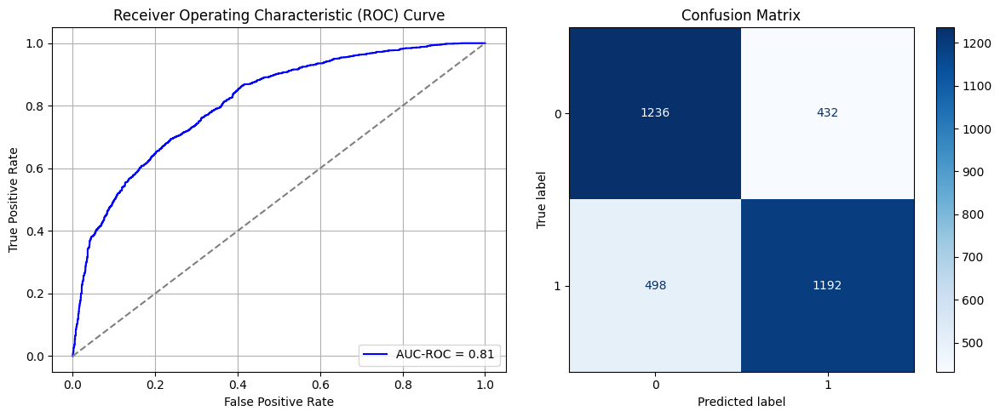

Best threshold based on F1-score: 0.36332467198371887
Time elapsed (performance): 19.810132938000606


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2800 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2801 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2805 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2806 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7140 - loss: 0.6770 - val_AUC: 0.0000e+00 - val_loss: 0.8068
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7107 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7236 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7229 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7523 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7710 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.6691
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7813 - loss: 0.5313 - val_AUC: 0.0000e+00 - val_loss: 0.6368
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2807 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2808 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2812 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2813 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6973 - loss: 0.6921 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7004 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6966 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7137 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.6900
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7354 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.7701
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7468 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7502 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.7759
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7717 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.7710
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2814 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2815 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2819 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2820 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7261 - loss: 0.6459 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7091 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7338 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7406 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.7632
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.7588
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7473 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.6388
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7730 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.7199
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7665 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.8039
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2821 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2822 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2826 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2827 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6685 - loss: 0.7308 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7257 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7074 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7214 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.7394
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7441 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.7434
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7410 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7544 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.7354
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7925 - loss: 0.5314 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2828 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2829 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2833 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2834 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7190 - loss: 0.6616 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7021 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7327 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8045
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7233 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.7563
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7446 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.7905
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7515 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.6896
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7526 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7624 - loss: 0.5487 - val_AUC: 0.0000e+00 - val_loss: 0.6909
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2835 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2836 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2840 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2841 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6979 - loss: 0.6868 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7110 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7141 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7459 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.7751
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7609 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.7779
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7666 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.7671
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7917 - loss: 0.5300 - val_AUC: 0.0000e+00 - val_loss: 0.7510
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2842 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2843 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2847 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2848 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7111 - loss: 0.6760 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7140 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7198 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7362 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.7421
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7604 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.9198
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7661 - loss: 0.5471 - val_AUC: 0.0000e+00 - val_loss: 0.7427
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7911 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2849 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2850 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2854 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2855 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6864 - loss: 0.7128 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6963 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6980 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.7894
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7195 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8068
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8153
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7534 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.7342
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7606 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.8661
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7686 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.7230
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2856 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2857 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2861 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2862 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6822 - loss: 0.7079 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7057 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.7771
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7245 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.7072
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7496 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.6804
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7582 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.7652
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7570 - loss: 0.5425 - val_AUC: 0.0000e+00 - val_loss: 0.7043
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7682 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.6730
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2863 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2864 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2868 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2869 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7177 - loss: 0.6562 - val_AUC: 0.0000e+00 - val_loss: 0.7364
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7061 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.7290
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.7194
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7393 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7485
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7540 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7723
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7599 - loss: 0.5445 - val_AUC: 0.0000e+00 - val_loss: 0.5807
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7756 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.7032
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2870 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2871 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2875 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2876 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7098 - loss: 0.6665 - val_AUC: 0.0000e+00 - val_loss: 0.7861
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7075 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7338 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8269
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7497 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.7631
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7602 - loss: 0.5508 - val_AUC: 0.0000e+00 - val_loss: 0.6971
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7571 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7911
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7793 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.8221
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2877 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2878 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2882 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2883 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6970 - loss: 0.6895 - val_AUC: 0.0000e+00 - val_loss: 0.7803
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6942 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.7895
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7003 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7142 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7301 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7949
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7311 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.7466
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7667 - loss: 0.5425 - val_AUC: 0.0000e+00 - val_loss: 0.7920
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7783 - loss: 0.5356 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2884 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2885 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2889 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2890 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7026 - loss: 0.6863 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6941 - loss: 0.6066 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7126 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7847
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7136 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7518 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.7752
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7548 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.6711
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7554 - loss: 0.5494 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7594 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.7060
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2891 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2892 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2896 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2897 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7111 - loss: 0.6575 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7042 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7299 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7488 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.6951
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7658 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.6579
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7774 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.6094
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2898 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2899 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2903 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2904 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6985 - loss: 0.6826 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7047 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7207 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7230 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7338 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7893
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7572 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.7836
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7646 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.7317
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7753 - loss: 0.5361 - val_AUC: 0.0000e+00 - val_loss: 0.6694
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2905 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2906 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2910 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2911 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7084 - loss: 0.6673 - val_AUC: 0.0000e+00 - val_loss: 0.8360
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7060 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6993 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7175 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.7997
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7391 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.7137
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7560 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.7754
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7739 - loss: 0.5392 - val_AUC: 0.0000e+00 - val_loss: 0.7083
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7713 - loss: 0.5392 - val_AUC: 0.0000e+00 - val_loss: 0.6484
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2912 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2913 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2917 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2918 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6989 - loss: 0.6862 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6835 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 0.7998
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6950 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7418 - loss: 0.5563 - val_AUC: 0.0000e+00 - val_loss: 0.7905
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7199 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.7816
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7481 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.7695
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.7461
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7687 - loss: 0.5528 - val_AUC: 0.0000e+00 - val_loss: 0.7606
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_417"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2919 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2920 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2924 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2925 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7119 - loss: 0.6621 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7076 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8871
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6994 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7241 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7176 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.7812
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7421 - loss: 0.5588 - val_AUC: 0.0000e+00 - val_loss: 0.7793
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7738 - loss: 0.5410 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7654 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.6647
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_418"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2926 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2927 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2931 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2932 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6930 - loss: 0.6876 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6971 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7272 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.7366
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8049
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7472 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7503 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.6375
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7751 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.7822
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_419"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2933 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2934 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2938 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2939 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7157 - loss: 0.6573 - val_AUC: 0.0000e+00 - val_loss: 0.7372
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6982 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7146 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7255
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7199 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.7996
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7446 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7368
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7306 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.7302
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7659 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.6788
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7881 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.7759
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1

In [ ]:
times_train = 5
times_fine_tune = 20


FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [ ]:
print(ParamFit)
ParamFit.to_csv('Sy_Fine_Tuning.csv')

         FPR       FNR
0   0.127865  0.304348
1   0.119986  0.318841
2   0.080587  0.428986
3   0.154370  0.269565
4   0.110673  0.330435
..       ...       ...
95  0.179083  0.344928
96  0.155086  0.405797
97  0.159742  0.394203
98  0.221705  0.286957
99  0.266476  0.234783

[100 rows x 2 columns]


In [ ]:
ParamFit['FNR'].mean()

np.float64(0.4097391304347826)

## Systematic Sampling (multiple samples):

Now, we investigate the possibility of conducting $m$ systematic samples, each with a sampling interval of $k=m*\frac{N_0}{N_1}$, and obtaining the undersampled majority class data using all $m$ systematic samples combined. This may more closely approximate SRS sampling.

For convenience, we take $m=10$ in this case.

In [ ]:
X_S_Sy, y_S_Sy = multi_systematic_undersampler(data_S_full, data_S_full.iloc[:,-1], 10)
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = multi_systematic_undersampler(T_train, T_train.iloc[:,-1], 10)
print(y_T_train_Sy)

8393
23544
2.8051948051948052
[1, 3, 6, 9, 12, 15, 17, 20, 23, 26, 29, 31, 34, 37, 40, 43, 45, 48, 51, 54, 57, 59, 62, 65, 68, 71, 73, 76, 79, 82, 85, 87, 90, 93, 96, 99, 101, 104, 107, 110, 113, 116, 118, 121, 124, 127, 130, 132, 135, 138, 141, 144, 146, 149, 152, 155, 158, 160, 163, 166, 169, 172, 174, 177, 180, 183, 186, 188, 191, 194, 197, 200, 202, 205, 208, 211, 214, 217, 219, 222, 225, 228, 231, 233, 236, 239, 242, 245, 247, 250, 253, 256, 259, 261, 264, 267, 270, 273, 275, 278, 281, 284, 287, 289, 292, 295, 298, 301, 303, 306, 309, 312, 315, 317, 320, 323, 326, 329, 332, 334, 337, 340, 343, 346, 348, 351, 354, 357, 360, 362, 365, 368, 371, 374, 376, 379, 382, 385, 388, 390, 393, 396, 399, 402, 404, 407, 410, 413, 416, 418, 421, 424, 427, 430, 433, 435, 438, 441, 444, 447, 449, 452, 455, 458, 461, 463, 466, 469, 472, 475, 477, 480, 483, 486, 489, 491, 494, 497, 500, 503, 505, 508, 511, 514, 517, 519, 522, 525, 528, 531, 533, 536, 539, 542, 545, 548, 550, 553, 556, 559, 562, 564,

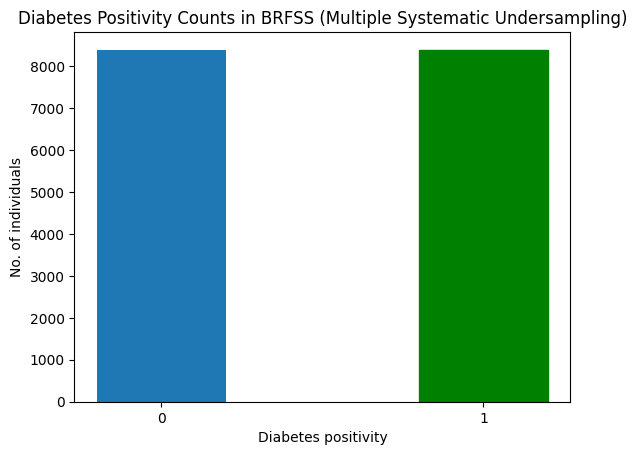

In [ ]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Multiple Systematic Undersampling)")
plt.show()

In [ ]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (13426, 12)
y_S_train: (13426,)
X_S_test: (3357, 12)
y_S_test: (3357,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_420"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2940 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2941 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2942 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2945 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2946 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7223 - loss: 0.6307 - val_AUC: 0.7612 - val_loss: 0.5735
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7667 - loss: 0.5722 - val_AUC: 0.7881 - val_loss: 0.5631
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7949 - loss: 0.5508 - val_AUC: 0.7993 - val_loss: 0.5493
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8020 - loss: 0.5408 - val_AUC: 0.8077 - val_loss: 0.5399
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8101 - loss: 0.5325 - val_AUC: 0.8055 - val_loss: 0.5465
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8240 - loss: 0.5163 - val_AUC: 0.8048 - val_loss: 0.5452
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8243 - loss: 0.5151 - val_AUC: 0.8196 - val_loss: 0.5288
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8261 - loss: 0.5116 - val_AUC: 0.8135 - val_loss: 0.5279
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

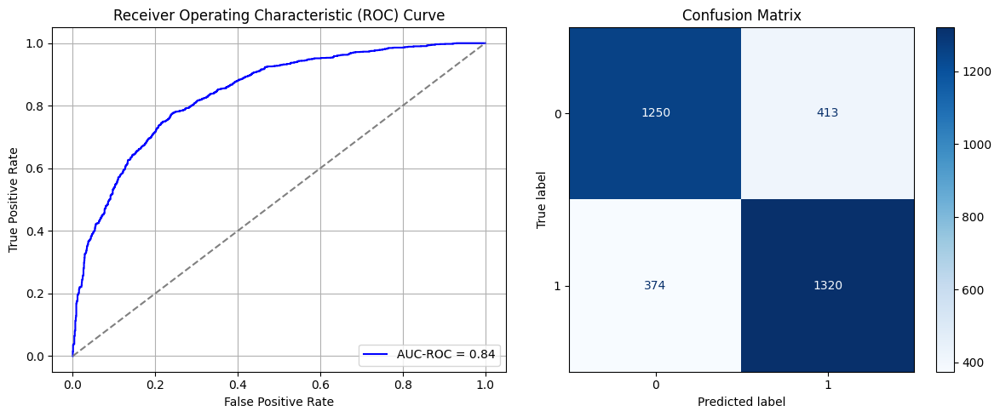

Best threshold based on F1-score: 0.2576136291027069
Time elapsed (performance): 17.375316194000334


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_421"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2947 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2948 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2949 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2952 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2953 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6547 - loss: 0.6417 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7024 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.7750
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7198 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8099
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7407 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.7182
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7550 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.7351
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7560 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.7673
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7792 - loss: 0.5373 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7624 - lo

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_422"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2954 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2955 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2956 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2959 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2960 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6447 - loss: 0.6576 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7083 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8448
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7294 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7595 - loss: 0.5485 - val_AUC: 0.0000e+00 - val_loss: 0.8304
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7487 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7388 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.7441
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7712 - loss: 0.5354 - val_AUC: 0.0000e+00 - val_loss: 0.6449
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7849 - loss: 0.5364 - val_AUC: 0.0000e+00 - val_loss: 0.8461
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_423"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2961 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2962 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2963 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2966 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2967 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6618 - loss: 0.6388 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7079 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.7955
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7314 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.7544
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7405 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7653 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7676 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.7386
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7657 - loss: 0.5407 - val_AUC: 0.0000e+00 - val_loss: 0.7456
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7763 - loss: 0.5344 - val_AUC: 0.0000e+00 - val_loss: 0.6836
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_424"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2968 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2969 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2970 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2973 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2974 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6687 - loss: 0.6310 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7215 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7088 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8088
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7362 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.7717
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7581 - loss: 0.5418 - val_AUC: 0.0000e+00 - val_loss: 0.7797
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7794 - loss: 0.5282 - val_AUC: 0.0000e+00 - val_loss: 0.7488
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7809 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.7121
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_425"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2975 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2976 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2977 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2980 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2981 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6551 - loss: 0.6475 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6887 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7228 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.7471
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7471 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7554 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.6732
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7652 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.7938
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7693 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.6962
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7818 - loss: 0.5255 - val_AUC: 0.0000e+00 - val_loss: 0.7038
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_426"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2982 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2983 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2984 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2987 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2988 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6452 - loss: 0.6557 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6904 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.7966
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7175 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.7809
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7373 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7260
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7578 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.7980
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7674 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7232
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7720 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.6911
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7801 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7021
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_427"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2989 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2990 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2991 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2994 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2995 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6411 - loss: 0.6579 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6776 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7403 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.7877
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7331 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8148
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7500 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7516 - loss: 0.5495 - val_AUC: 0.0000e+00 - val_loss: 0.6798
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7596 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.7690
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7828 - loss: 0.5295 - val_AUC: 0.0000e+00 - val_loss: 0.7594
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_428"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2996 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2997 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2998 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3001 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3002 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6671 - loss: 0.6386 - val_AUC: 0.0000e+00 - val_loss: 0.9286
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6958 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.7493
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7309 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7273 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.6910
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7443 - loss: 0.5555 - val_AUC: 0.0000e+00 - val_loss: 0.7234
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7687 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7337
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7758 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.7007
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7703 - loss: 0.5402 - val_AUC: 0.0000e+00 - val_loss: 0.6678
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_429"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3003 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3004 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3008 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3009 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6402 - loss: 0.6552 - val_AUC: 0.0000e+00 - val_loss: 0.8058
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6898 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7298 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7450 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7484 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7640 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.7332
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7779 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.7663
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7734 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.7249
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_430"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3010 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3011 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3015 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3016 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6381 - loss: 0.6575 - val_AUC: 0.0000e+00 - val_loss: 0.9321
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7059 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.7482
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7291 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8418
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7391 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7388 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.7487
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7494 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.8118
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7565 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7000
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7561 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_431"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3017 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3018 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3022 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3023 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6426 - loss: 0.6562 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6909 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8352
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7271 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8234
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7441 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.7497
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7456 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7551 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.6817
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7616 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7751 - loss: 0.5268 - val_AUC: 0.0000e+00 - val_loss: 0.6210
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_432"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3024 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3025 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3029 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3030 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6605 - loss: 0.6310 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7082 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7178 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7303 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7591 - loss: 0.5356 - val_AUC: 0.0000e+00 - val_loss: 0.7019
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7819 - loss: 0.5270 - val_AUC: 0.0000e+00 - val_loss: 0.7259
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7706 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.7509
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7831 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.5909
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_433"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3031 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3032 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3036 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3037 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6589 - loss: 0.6488 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6979 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7249 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7319 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.7646
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7526 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.6145
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7584 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7494 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7804 - loss: 0.5201 - val_AUC: 0.0000e+00 - val_loss: 0.6926
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_434"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3038 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3039 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3043 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3044 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6434 - loss: 0.6565 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6937 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.7433
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7471 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7551 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.7435
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7481 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.7701
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7617 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7616 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.7735
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_435"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3045 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3046 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3050 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3051 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6626 - loss: 0.6465 - val_AUC: 0.0000e+00 - val_loss: 0.9650
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6947 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7302 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7623 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.8149
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7521 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.7459
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7620 - loss: 0.5412 - val_AUC: 0.0000e+00 - val_loss: 0.7095
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7652 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.7999
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7479 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.6926
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_436"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3052 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3053 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3057 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3058 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6449 - loss: 0.6547 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7091 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7278 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.7882
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7558 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.7326
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7599 - loss: 0.5427 - val_AUC: 0.0000e+00 - val_loss: 0.7281
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7664 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.6955
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7570 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.6605
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7747 - loss: 0.5272 - val_AUC: 0.0000e+00 - val_loss: 0.5892
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_437"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3059 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3060 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3064 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3065 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6535 - loss: 0.6509 - val_AUC: 0.0000e+00 - val_loss: 0.9566
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7162 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7037 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.7578
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7474 - loss: 0.5572 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7513 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7603 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7744 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.7394
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7698 - loss: 0.5393 - val_AUC: 0.0000e+00 - val_loss: 0.6801
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_438"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3066 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3067 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3071 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3072 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6620 - loss: 0.6421 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6849 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.7878
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7331 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.7044
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7335 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7224
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7359 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.7983
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7611 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.6420
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7784 - loss: 0.5283 - val_AUC: 0.0000e+00 - val_loss: 0.7400
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_439"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3073 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3074 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3078 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3079 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6575 - loss: 0.6368 - val_AUC: 0.0000e+00 - val_loss: 0.8160
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6951 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6964 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7231 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.7684
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7641 - loss: 0.5503 - val_AUC: 0.0000e+00 - val_loss: 0.7773
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7581 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.7543
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7754 - loss: 0.5323 - val_AUC: 0.0000e+00 - val_loss: 0.6291
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7938 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.7387
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_440"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3080 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3081 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3085 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3086 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6677 - loss: 0.6348 - val_AUC: 0.0000e+00 - val_loss: 0.7692
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6905 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.7649
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7148 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.7853
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7315 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.7688
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7621 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.7612
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7513 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7641 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.6527
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7776 - loss: 0.5298 - val_AUC: 0.0000e+00 - val_loss: 0.7910
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_441"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3087 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3088 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3092 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3093 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7218 - loss: 0.6282 - val_AUC: 0.7604 - val_loss: 0.5742
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7671 - loss: 0.5688 - val_AUC: 0.7952 - val_loss: 0.5606
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7884 - loss: 0.5541 - val_AUC: 0.7947 - val_loss: 0.5597
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8056 - loss: 0.5392 - val_AUC: 0.8072 - val_loss: 0.5388
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8136 - loss: 0.5285 - val_AUC: 0.8097 - val_loss: 0.5343
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8187 - loss: 0.5219 - val_AUC: 0.8100 - val_loss: 0.5343
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8320 - loss: 0.5034 - val_AUC: 0.8167 - val_loss: 0.5277
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8326 - loss: 0.5053 - val_AUC: 0.8234 - val_loss: 0.5164
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

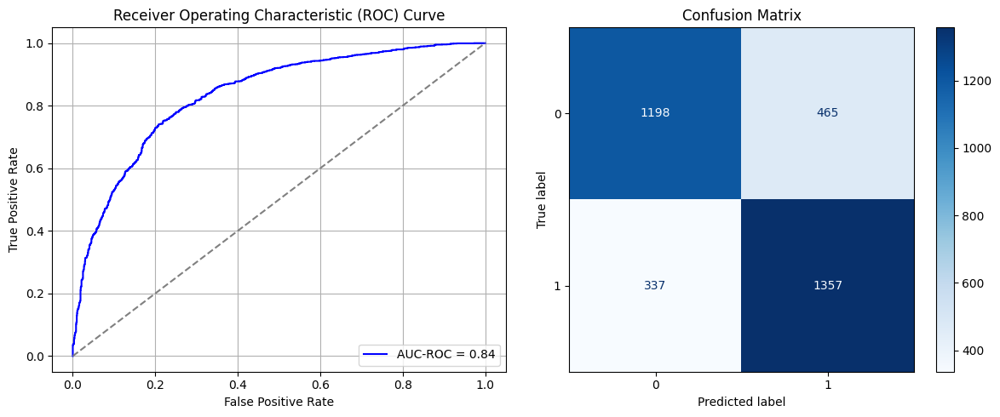

Best threshold based on F1-score: 0.4147103726863861
Time elapsed (performance): 17.86710389700056


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_442"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3094 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3095 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3099 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3100 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6691 - loss: 0.6434 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6826 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.8399
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7014 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7332 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7128 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7249 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7260 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7422 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_443"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3101 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3102 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3106 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3107 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6489 - loss: 0.6766 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6908 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7047 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7129 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9299
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7113 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7112 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7350 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7425 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_444"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3108 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3109 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3113 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3114 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6690 - loss: 0.6639 - val_AUC: 0.0000e+00 - val_loss: 0.8091
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6848 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6971 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8447
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7015 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7174 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7047 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8783
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7288 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.7451
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7337 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.7793
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_445"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3115 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3116 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3120 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3121 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6571 - loss: 0.6707 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6956 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6946 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.7750
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7258 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7227 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7115 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7404 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7371 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_446"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3122 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3123 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3127 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3128 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6739 - loss: 0.6506 - val_AUC: 0.0000e+00 - val_loss: 0.8068
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6969 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7034 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8185
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6946 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6946 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7096 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.7486
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7218 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8228
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7236 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.7952
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_447"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3129 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3130 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3134 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3135 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6627 - loss: 0.6812 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6882 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6929 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7037 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7094 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7239 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8726
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7162 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.7950
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7284 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.7401
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_448"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3136 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3137 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3141 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3142 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6718 - loss: 0.6559 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7018 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6886 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.7815
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6983 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.7914
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7264 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8068
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7175 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.7480
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7174 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.7287
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7217 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_449"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3143 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3144 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3148 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3149 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.6366 - loss: 0.6868 - val_AUC: 0.0000e+00 - val_loss: 0.8173
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6911 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.9265
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6925 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7167 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7246 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7307 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7359 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_450"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3150 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3151 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3155 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3156 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6722 - loss: 0.6513 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6982 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7028 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6915 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8012
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7105 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7138 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7309 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8132
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7422 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8234
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_451"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3157 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3158 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3162 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3163 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6543 - loss: 0.6889 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6868 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.8038
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6907 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7010 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7058 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.7920
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7093 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.7365
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7322 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_452"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3164 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3165 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3169 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3170 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6911 - loss: 0.6423 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6708 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6948 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7011 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.7841
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7113 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8140
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7086 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9049
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7251 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7373 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8070
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_453"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3171 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3172 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3176 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3177 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6634 - loss: 0.6703 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6952 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.7942
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6910 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7058 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.7903
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7077 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.7588
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7234 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.7955
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7307 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8976
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7229 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.7647
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_454"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3178 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3179 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3183 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3184 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6701 - loss: 0.6534 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6877 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7084 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7136 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8026
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8548
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7422 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.7250
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7379 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8360
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7443 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.7791
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_455"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3185 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3186 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3190 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3191 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6754 - loss: 0.6548 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6778 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.8552
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7168 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.7926
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7155 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7074 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7136 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7092 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.7843
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7294 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.6926
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_456"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3192 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3193 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3197 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3198 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6690 - loss: 0.6680 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6792 - loss: 0.6201 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7066 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7042 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.7773
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7127 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.7939
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7225 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7225 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.7617
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7107 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.7744
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_457"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3199 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3200 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3204 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3205 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6774 - loss: 0.6519 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6874 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7082 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6943 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7079 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.7973
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7245 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.7635
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7129 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.7187
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7298 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_458"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3206 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3207 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3210 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3211 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3212 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6593 - loss: 0.6693 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6780 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7074 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7031 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7302 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7140 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.7531
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7447 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7712
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7276 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_459"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3213 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3214 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3217 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3218 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3219 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6740 - loss: 0.6804 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6821 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.7783
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6804 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6964 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.7918
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7000 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7156 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.7772
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7351 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7363 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.7877
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_460"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3220 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3221 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3224 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3225 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3226 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6473 - loss: 0.6893 - val_AUC: 0.0000e+00 - val_loss: 0.7918
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6824 - loss: 0.6116 - val_AUC: 0.0000e+00 - val_loss: 0.7924
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7097 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7213 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8372
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7030 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7351 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7348 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7791
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7293 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.7632
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_461"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3227 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3228 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3231 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3232 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3233 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6670 - loss: 0.6733 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6789 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6811 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7035 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8350
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7318 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7355 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.7842
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7191 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_462"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3234 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3235 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3238 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3239 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3240 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7084 - loss: 0.6321 - val_AUC: 0.7617 - val_loss: 0.5841
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7649 - loss: 0.5717 - val_AUC: 0.7904 - val_loss: 0.5607
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8014 - loss: 0.5453 - val_AUC: 0.7962 - val_loss: 0.5595
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8001 - loss: 0.5433 - val_AUC: 0.7870 - val_loss: 0.5670
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8062 - loss: 0.5377 - val_AUC: 0.8119 - val_loss: 0.5320
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8140 - loss: 0.5272 - val_AUC: 0.8130 - val_loss: 0.5311
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8217 - loss: 0.5173 - val_AUC: 0.8163 - val_loss: 0.5248
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8246 - loss: 0.5130 - val_AUC: 0.8190 - val_loss: 0.5308
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

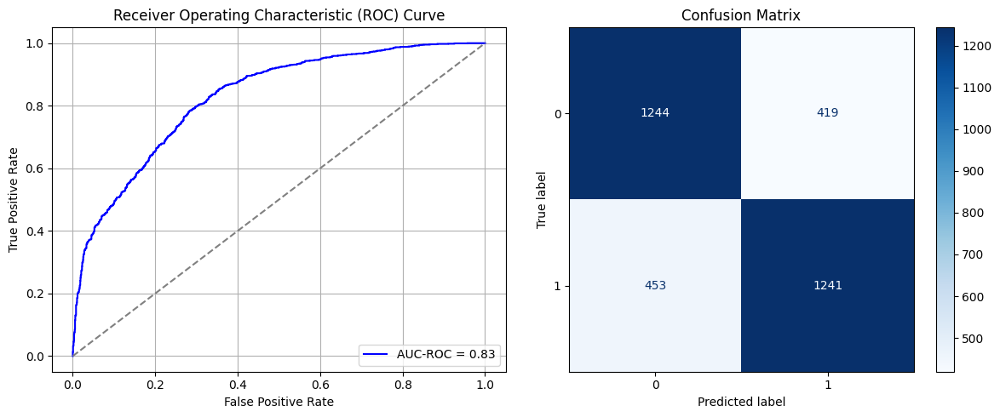

Best threshold based on F1-score: 0.4236281216144562
Time elapsed (performance): 19.13747085199975


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_463"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3241 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3242 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3245 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3246 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3247 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6035 - loss: 0.6307 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7088 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7289 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7410 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.7979
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7459 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.7684
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7576 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.6890
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7630 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7800 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.7547
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_464"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3248 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3249 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3252 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3253 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3254 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6035 - loss: 0.6215 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7323 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8236
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7425 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8010
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7378 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.7754
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7616 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.7830
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7635 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.7718
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7762 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.7341
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7655 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_465"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3255 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3256 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3259 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3260 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3261 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6038 - loss: 0.6330 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7173 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7242 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.7614
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7513 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8173
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7535 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.7980
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7424 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8031
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7543 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.7591
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7604 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.7086
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_466"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3262 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3263 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3266 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3267 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3268 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.5870 - loss: 0.6365 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7261 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8587
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7266 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7376 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.7941
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7477 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7489 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.7650
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7644 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.7465
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7712 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.7807
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_467"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3269 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3270 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3273 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3274 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3275 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5814 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7220 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7268 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7498 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.7732
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7472 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7621
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7687 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.7834
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7616 - loss: 0.5605 - val_AUC: 0.0000e+00 - val_loss: 0.6948
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7892 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.6948
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_468"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3276 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3277 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3280 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3281 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3282 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.5999 - loss: 0.6263 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7182 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8078
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7343 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7499 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7393 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.7072
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7498 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.7150
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7694 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8108
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7703 - loss: 0.5543 - val_AUC: 0.0000e+00 - val_loss: 0.7175
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_469"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3283 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3284 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3287 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3288 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3289 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5806 - loss: 0.6386 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6936 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8103
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7510 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.7973
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7457 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.7878
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7620 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.7899
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7756 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.6642
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7836 - loss: 0.5388 - val_AUC: 0.0000e+00 - val_loss: 0.7331
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_470"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3290 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3291 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3294 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3295 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3296 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5917 - loss: 0.6343 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7305 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.7698
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7598 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.7819
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7612 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.7683
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7656 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.6990
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7493 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7631 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7916
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_471"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3297 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3298 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3301 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3302 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3303 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5815 - loss: 0.6429 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7234 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.7906
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7446 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.7918
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7400 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.7867
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7445 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7530 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.7977
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7731 - loss: 0.5453 - val_AUC: 0.0000e+00 - val_loss: 0.7603
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_472"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3304 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3305 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3308 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3309 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3310 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6046 - loss: 0.6283 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7269 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.7781
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7457 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7289 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.7508
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7687 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.7292
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7706 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.7063
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7622 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.7105
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7708 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.6987
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_473"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3311 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3312 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3315 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3316 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3317 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5891 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7231 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7351 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.7858
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7394 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.7864
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7560 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.7688
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7537 - loss: 0.5585 - val_AUC: 0.0000e+00 - val_loss: 0.7536
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7703 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.6975
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7763 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.7643
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_474"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3318 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3319 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3322 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3323 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3324 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6010 - loss: 0.6275 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7310 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7188 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7352 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.7551
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7427 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.7685
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7514 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.7077
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7472 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7593 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.7763
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_475"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3325 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3326 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3329 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3330 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3331 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6059 - loss: 0.6244 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7259 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.7857
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7257 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7474 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8484
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7508 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.7575
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7870 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.7950
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7712 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7041
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7462 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.7415
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_476"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3332 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3333 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3336 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3337 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3338 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6055 - loss: 0.6325 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7219 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7309 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7483 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7592 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7531 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8095
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7394 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.7034
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7788 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.7476
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_477"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3339 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3340 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3343 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3344 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3345 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5922 - loss: 0.6331 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7266 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7423 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7630 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7374 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.7710
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7710 - loss: 0.5568 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7643 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7621 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.7243
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_478"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3346 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3347 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3350 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3351 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3352 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5880 - loss: 0.6371 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7034 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7235 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7506 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.7741
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7611 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.7873
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7610 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.7602
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7614 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.6856
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7634 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.6718
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_479"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3353 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3354 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3357 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3358 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3359 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6214 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.9017
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7238 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.7666
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7412 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8196
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7267 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.7541
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7624 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7481 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7743 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.7295
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_480"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3360 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3361 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3364 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3365 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3366 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5752 - loss: 0.6368 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7045 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.8058
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7572 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.7681
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.7776
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7521 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.7747
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7541 - loss: 0.5622 - val_AUC: 0.0000e+00 - val_loss: 0.7453
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7740 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.7719
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_481"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3367 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3368 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3371 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3372 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3373 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.5801 - loss: 0.6403 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7043 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7407 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.7928
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7432 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7613 - loss: 0.5560 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7544 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.7472
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7498 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8002
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7657 - loss: 0.5533 - val_AUC: 0.0000e+00 - val_loss: 0.7682
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_482"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3374 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3375 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3378 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3379 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3380 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.5989 - loss: 0.6293 - val_AUC: 0.0000e+00 - val_loss: 0.8426
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7138 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8235
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7273 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.7686
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7536 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7590 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7754 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.7469
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7730 - loss: 0.5490 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_483"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3381 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3382 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3385 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3386 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3387 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7082 - loss: 0.6290 - val_AUC: 0.7569 - val_loss: 0.5777
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7651 - loss: 0.5708 - val_AUC: 0.7796 - val_loss: 0.5710
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7926 - loss: 0.5491 - val_AUC: 0.8021 - val_loss: 0.5445
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8138 - loss: 0.5283 - val_AUC: 0.8073 - val_loss: 0.5407
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8128 - loss: 0.5281 - val_AUC: 0.8177 - val_loss: 0.5321
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8213 - loss: 0.5172 - val_AUC: 0.8182 - val_loss: 0.5374
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8253 - loss: 0.5125 - val_AUC: 0.8264 - val_loss: 0.5109
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8312 - loss: 0.5054 - val_AUC: 0.8200 - val_loss: 0.5434
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

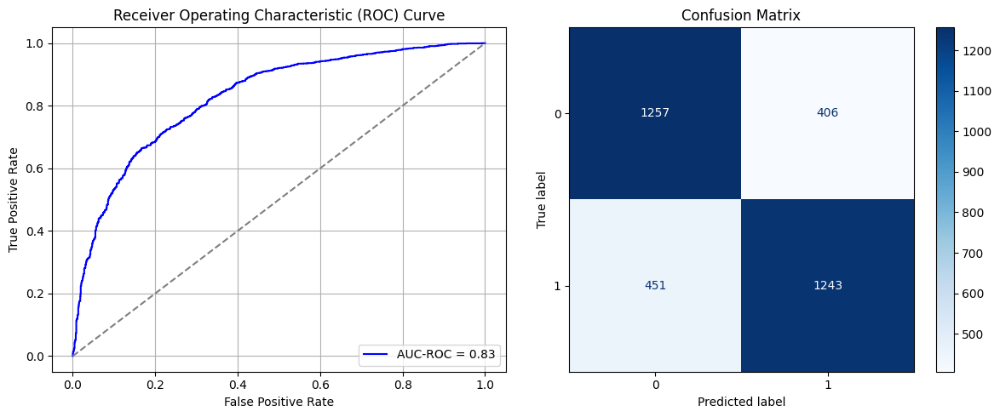

Best threshold based on F1-score: 0.32269471883773804
Time elapsed (performance): 18.855585714998597


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_484"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3388 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3389 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3392 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3393 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3394 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7324 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.7144
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7567 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.6797
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7824 - loss: 0.5356 - val_AUC: 0.0000e+00 - val_loss: 0.6983
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7748 - loss: 0.5411 - val_AUC: 0.0000e+00 - val_loss: 0.6770
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7732 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.7843
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7790 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.6620
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7887 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.6581
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8022 - loss: 0.5116 - val_AUC: 0.0000e+00 - val_loss: 0.7024
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_485"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3395 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3396 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3399 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3400 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3401 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7370 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.7151
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7600 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.6666
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7815 - loss: 0.5397 - val_AUC: 0.0000e+00 - val_loss: 0.7116
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7643 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.6815
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7850 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.6568
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7921 - loss: 0.5248 - val_AUC: 0.0000e+00 - val_loss: 0.6923
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7890 - loss: 0.5304 - val_AUC: 0.0000e+00 - val_loss: 0.6522
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7889 - loss: 0.5339 - val_AUC: 0.0000e+00 - val_loss: 0.7387
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_486"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3402 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3403 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3406 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3407 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3408 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - AUC: 0.7489 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.6887
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7481 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.7503
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7582 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.7550
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7776 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.6784
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7824 - loss: 0.5335 - val_AUC: 0.0000e+00 - val_loss: 0.6563
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7811 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.6674
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7796 - loss: 0.5298 - val_AUC: 0.0000e+00 - val_loss: 0.6472
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7921 - loss: 0.5317 - val_AUC: 0.0000e+00 - val_loss: 0.7339
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_487"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3409 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3410 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3413 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3414 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3415 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7362 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.7293
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7828 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.6720
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7746 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.6791
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7832 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.6871
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7728 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.6434
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7817 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.6451
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7901 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.7669
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7876 - loss: 0.5200 - val_AUC: 0.0000e+00 - val_loss: 0.6817
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_488"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3416 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3417 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3420 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3421 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3422 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7573 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8076
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7669 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.7384
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7599 - loss: 0.5564 - val_AUC: 0.0000e+00 - val_loss: 0.7545
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7598 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.7052
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7923 - loss: 0.5319 - val_AUC: 0.0000e+00 - val_loss: 0.6881
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7796 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.6810
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7904 - loss: 0.5302 - val_AUC: 0.0000e+00 - val_loss: 0.6924
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7850 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.7272
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_489"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3423 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3424 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3427 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3428 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3429 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7328 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.6936
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7571 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.7526
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7689 - loss: 0.5393 - val_AUC: 0.0000e+00 - val_loss: 0.7150
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7712 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.7223
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7708 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.7044
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7770 - loss: 0.5407 - val_AUC: 0.0000e+00 - val_loss: 0.7386
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7832 - loss: 0.5406 - val_AUC: 0.0000e+00 - val_loss: 0.6727
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8006 - loss: 0.5219 - val_AUC: 0.0000e+00 - val_loss: 0.6613
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_490"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3430 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3431 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3434 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3435 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3436 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7524 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8063
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7686 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.6368
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7676 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.7485
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7715 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.7007
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7792 - loss: 0.5396 - val_AUC: 0.0000e+00 - val_loss: 0.6985
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7826 - loss: 0.5378 - val_AUC: 0.0000e+00 - val_loss: 0.6667
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7821 - loss: 0.5327 - val_AUC: 0.0000e+00 - val_loss: 0.7009
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7941 - loss: 0.5153 - val_AUC: 0.0000e+00 - val_loss: 0.7519
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_491"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3437 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3438 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3441 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3442 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3443 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7485 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.7051
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7523 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.7321
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7890 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.7485
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7798 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.7110
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7746 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.6759
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7909 - loss: 0.5258 - val_AUC: 0.0000e+00 - val_loss: 0.7487
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7763 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.6815
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7981 - loss: 0.5215 - val_AUC: 0.0000e+00 - val_loss: 0.6226
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_492"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3444 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3445 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3448 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3449 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3450 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - AUC: 0.7478 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.7398
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7520 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.7261
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7637 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.7039
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7923 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.7670
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7840 - loss: 0.5344 - val_AUC: 0.0000e+00 - val_loss: 0.6487
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7771 - loss: 0.5395 - val_AUC: 0.0000e+00 - val_loss: 0.7304
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7966 - loss: 0.5241 - val_AUC: 0.0000e+00 - val_loss: 0.7047
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7972 - loss: 0.5225 - val_AUC: 0.0000e+00 - val_loss: 0.7379
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_493"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3451 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3452 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3455 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3456 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3457 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7549 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.7876
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7541 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.7518
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7837 - loss: 0.5343 - val_AUC: 0.0000e+00 - val_loss: 0.6985
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7726 - loss: 0.5449 - val_AUC: 0.0000e+00 - val_loss: 0.6195
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7670 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.6845
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7688 - loss: 0.5499 - val_AUC: 0.0000e+00 - val_loss: 0.7255
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7874 - loss: 0.5311 - val_AUC: 0.0000e+00 - val_loss: 0.6347
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7773 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.7295
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_494"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3458 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3459 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3462 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3463 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3464 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7284 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.6569
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7706 - loss: 0.5468 - val_AUC: 0.0000e+00 - val_loss: 0.6873
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7613 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7642 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.7022
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7821 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.7179
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7962 - loss: 0.5218 - val_AUC: 0.0000e+00 - val_loss: 0.6938
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7936 - loss: 0.5278 - val_AUC: 0.0000e+00 - val_loss: 0.7207
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8106 - loss: 0.5098 - val_AUC: 0.0000e+00 - val_loss: 0.7577
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_495"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3465 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3466 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3469 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3470 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3471 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7315 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.7163
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7631 - loss: 0.5451 - val_AUC: 0.0000e+00 - val_loss: 0.6759
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7569 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.7232
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7748 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.7719
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7805 - loss: 0.5367 - val_AUC: 0.0000e+00 - val_loss: 0.6740
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7944 - loss: 0.5263 - val_AUC: 0.0000e+00 - val_loss: 0.7241
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7644 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.6525
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7842 - loss: 0.5287 - val_AUC: 0.0000e+00 - val_loss: 0.7431
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_496"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3472 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3473 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3476 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3477 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3478 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7381 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.7551
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7574 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7532 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.6778
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7732 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7615
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7817 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.7316
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7802 - loss: 0.5284 - val_AUC: 0.0000e+00 - val_loss: 0.6751
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7848 - loss: 0.5324 - val_AUC: 0.0000e+00 - val_loss: 0.7359
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7641 - loss: 0.5428 - val_AUC: 0.0000e+00 - val_loss: 0.6547
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_497"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3479 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3480 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3483 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3484 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3485 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7400 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7216
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7591 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.7195
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7521 - loss: 0.5592 - val_AUC: 0.0000e+00 - val_loss: 0.6755
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7870 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.6986
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7750 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7797 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.6463
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7974 - loss: 0.5231 - val_AUC: 0.0000e+00 - val_loss: 0.6858
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7936 - loss: 0.5292 - val_AUC: 0.0000e+00 - val_loss: 0.7133
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_498"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3486 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3487 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3490 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3491 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3492 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7180 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.7011
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7422 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.6954
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7607 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.6976
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7643 - loss: 0.5516 - val_AUC: 0.0000e+00 - val_loss: 0.7167
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7842 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.6698
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7871 - loss: 0.5358 - val_AUC: 0.0000e+00 - val_loss: 0.7185
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7860 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.7191
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7957 - loss: 0.5215 - val_AUC: 0.0000e+00 - val_loss: 0.7174
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_499"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3493 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3494 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3497 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3498 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3499 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7416 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7573 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.7548
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7716 - loss: 0.5425 - val_AUC: 0.0000e+00 - val_loss: 0.7574
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7915 - loss: 0.5297 - val_AUC: 0.0000e+00 - val_loss: 0.7254
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7828 - loss: 0.5319 - val_AUC: 0.0000e+00 - val_loss: 0.7208
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7682 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.6725
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7891 - loss: 0.5321 - val_AUC: 0.0000e+00 - val_loss: 0.6729
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8001 - loss: 0.5216 - val_AUC: 0.0000e+00 - val_loss: 0.6872
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_500"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3500 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3501 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3504 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3505 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3506 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7494 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.7740
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7512 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.7672
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7598 - loss: 0.5571 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7875 - loss: 0.5352 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7594 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.6924
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7720 - loss: 0.5386 - val_AUC: 0.0000e+00 - val_loss: 0.6352
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7742 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.6576
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7975 - loss: 0.5208 - val_AUC: 0.0000e+00 - val_loss: 0.7431
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_501"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3507 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3508 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3511 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3512 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3513 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7439 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.7683
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7681 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.7504
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7643 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.7645
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7742 - loss: 0.5351 - val_AUC: 0.0000e+00 - val_loss: 0.6708
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7974 - loss: 0.5217 - val_AUC: 0.0000e+00 - val_loss: 0.7146
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8011 - loss: 0.5207 - val_AUC: 0.0000e+00 - val_loss: 0.7009
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7831 - loss: 0.5335 - val_AUC: 0.0000e+00 - val_loss: 0.6832
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7978 - loss: 0.5218 - val_AUC: 0.0000e+00 - val_loss: 0.7109
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_502"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3514 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3515 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3518 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3519 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3520 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7510 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7399
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7342 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.7157
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7688 - loss: 0.5456 - val_AUC: 0.0000e+00 - val_loss: 0.7087
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7680 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.6999
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7882 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.6433
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7693 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.6072
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7713 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.6566
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7894 - loss: 0.5296 - val_AUC: 0.0000e+00 - val_loss: 0.7045
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_503"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3521 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3522 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3525 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3526 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3527 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7440 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.7083
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7803 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.7719
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7752 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.7443
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7802 - loss: 0.5364 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7716 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.7267
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7942 - loss: 0.5255 - val_AUC: 0.0000e+00 - val_loss: 0.7381
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7896 - loss: 0.5335 - val_AUC: 0.0000e+00 - val_loss: 0.6683
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7978 - loss: 0.5181 - val_AUC: 0.0000e+00 - val_loss: 0.7179
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_504"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3528 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3529 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3532 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3533 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3534 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.7220 - loss: 0.6280 - val_AUC: 0.7558 - val_loss: 0.5753
Epoch 2/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7700 - loss: 0.5692 - val_AUC: 0.7943 - val_loss: 0.5555
Epoch 3/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7900 - loss: 0.5548 - val_AUC: 0.8071 - val_loss: 0.5389
Epoch 4/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8100 - loss: 0.5328 - val_AUC: 0.8097 - val_loss: 0.5363
Epoch 5/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8274 - loss: 0.5117 - val_AUC: 0.8146 - val_loss: 0.5295
Epoch 6/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8197 - loss: 0.5196 - val_AUC: 0.8209 - val_loss: 0.5213
Epoch 7/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8229 - loss: 0.5150 - val_AUC: 0.8207 - val_loss: 0.5195
Epoch 8/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8309 - loss: 0.5052 - val_AUC: 0.8264 - val_loss: 0.5183
Epoch 9/10
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

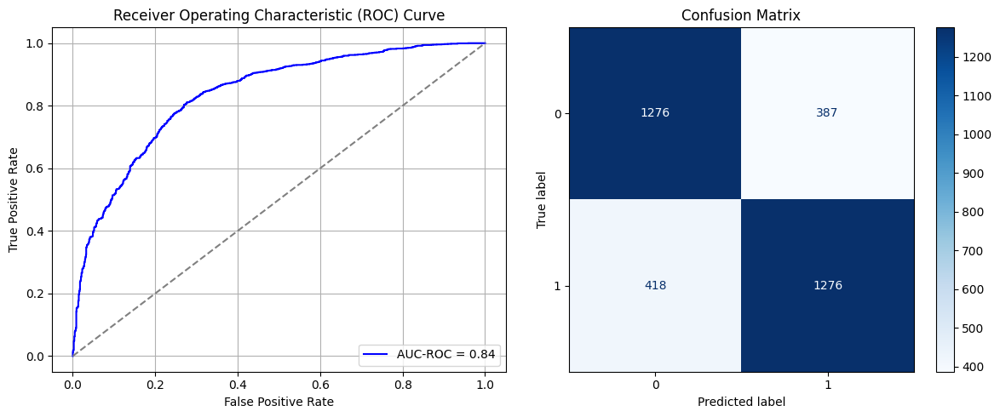

Best threshold based on F1-score: 0.39539024233818054
Time elapsed (performance): 24.841184564000287


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_505"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3535 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3536 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3539 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3540 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3541 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7416 - loss: 0.6676 - val_AUC: 0.0000e+00 - val_loss: 0.8885
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7278 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.7428
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7460 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7592 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7716 - loss: 0.5443 - val_AUC: 0.0000e+00 - val_loss: 0.6983
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7774 - loss: 0.5392 - val_AUC: 0.0000e+00 - val_loss: 0.7468
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7971 - loss: 0.5244 - val_AUC: 0.0000e+00 - val_loss: 0.7619
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7950 - loss: 0.5224 - val_AUC: 0.0000e+00 - val_loss: 0.7662
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_506"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3542 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3543 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3546 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3547 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3548 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7436 - loss: 0.6522 - val_AUC: 0.0000e+00 - val_loss: 0.8787
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7360 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7597 - loss: 0.5537 - val_AUC: 0.0000e+00 - val_loss: 0.8101
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7453 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7632 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.7236
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7891 - loss: 0.5278 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8072 - loss: 0.5134 - val_AUC: 0.0000e+00 - val_loss: 0.7057
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8048 - loss: 0.5106 - val_AUC: 0.0000e+00 - val_loss: 0.7393
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_507"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3549 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3550 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3553 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3554 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3555 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7339 - loss: 0.6910 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7410 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.7665
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7533 - loss: 0.5607 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7599 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.7537
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7759 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.7423
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7951 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.7159
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7949 - loss: 0.5333 - val_AUC: 0.0000e+00 - val_loss: 0.7450
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7850 - loss: 0.5327 - val_AUC: 0.0000e+00 - val_loss: 0.7453
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_508"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3556 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3557 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3560 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3561 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3562 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - AUC: 0.7243 - loss: 0.6949 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7375 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7536 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.7266
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7715 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.7892
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7613 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.7881
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7733 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.7189
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8044 - loss: 0.5235 - val_AUC: 0.0000e+00 - val_loss: 0.7472
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8038 - loss: 0.5216 - val_AUC: 0.0000e+00 - val_loss: 0.7481
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_509"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3563 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3564 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3567 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3568 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3569 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7272 - loss: 0.6853 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7464 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7522 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8516
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7677 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.7871
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7627 - loss: 0.5523 - val_AUC: 0.0000e+00 - val_loss: 0.7726
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7907 - loss: 0.5272 - val_AUC: 0.0000e+00 - val_loss: 0.6464
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8071 - loss: 0.5267 - val_AUC: 0.0000e+00 - val_loss: 0.7292
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7893 - loss: 0.5242 - val_AUC: 0.0000e+00 - val_loss: 0.6592
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_510"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3570 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3571 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3574 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3575 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3576 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7300 - loss: 0.6815 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7525 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.7443
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7353 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7597 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.7646
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7849 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.7876
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7717 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.7491
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7925 - loss: 0.5282 - val_AUC: 0.0000e+00 - val_loss: 0.7385
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7940 - loss: 0.5243 - val_AUC: 0.0000e+00 - val_loss: 0.6580
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_511"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3577 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3578 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3581 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3582 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3583 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7140 - loss: 0.7226 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7354 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7678 - loss: 0.5455 - val_AUC: 0.0000e+00 - val_loss: 0.7989
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7434 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.7945
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7692 - loss: 0.5497 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7653 - loss: 0.5535 - val_AUC: 0.0000e+00 - val_loss: 0.7367
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7809 - loss: 0.5397 - val_AUC: 0.0000e+00 - val_loss: 0.7987
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7966 - loss: 0.5342 - val_AUC: 0.0000e+00 - val_loss: 0.8010
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_512"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3584 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3585 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3588 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3589 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3590 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7355 - loss: 0.6764 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7411 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.7794
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7534 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.7749
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7608 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.7984
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7617 - loss: 0.5570 - val_AUC: 0.0000e+00 - val_loss: 0.7749
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7791 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.6799
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7885 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.7127
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8213 - loss: 0.5045 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_513"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3591 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3592 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3595 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3596 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3597 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7322 - loss: 0.6779 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7344 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7437 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8269
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7581 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.7908
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7665 - loss: 0.5527 - val_AUC: 0.0000e+00 - val_loss: 0.6716
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7852 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.6894
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7935 - loss: 0.5292 - val_AUC: 0.0000e+00 - val_loss: 0.6737
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7909 - loss: 0.5292 - val_AUC: 0.0000e+00 - val_loss: 0.6754
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_514"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3598 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3599 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3602 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3603 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3604 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7267 - loss: 0.6877 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7378 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7415 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7684 - loss: 0.5509 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7560 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.7503
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7719 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7872 - loss: 0.5296 - val_AUC: 0.0000e+00 - val_loss: 0.7082
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7941 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.7391
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_515"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3605 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3606 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3609 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3610 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3611 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7190 - loss: 0.7021 - val_AUC: 0.0000e+00 - val_loss: 0.8531
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7215 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.7920
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7665 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.7494
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7790 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7835 - loss: 0.5369 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7741 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.7349
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8026 - loss: 0.5195 - val_AUC: 0.0000e+00 - val_loss: 0.7422
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_516"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3612 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3613 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3616 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3617 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3618 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7369 - loss: 0.6762 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7424 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7283 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.7508
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7571 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7635 - loss: 0.5498 - val_AUC: 0.0000e+00 - val_loss: 0.6888
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7699 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.8443
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7630 - loss: 0.5546 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7818 - loss: 0.5444 - val_AUC: 0.0000e+00 - val_loss: 0.7221
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_517"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3619 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3620 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3623 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3624 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3625 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7135 - loss: 0.7137 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7222 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8428
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7479 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.7741
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7453 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7640 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.7044
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7796 - loss: 0.5459 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7819 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.6776
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7925 - loss: 0.5309 - val_AUC: 0.0000e+00 - val_loss: 0.6767
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_518"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3626 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3627 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3630 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3631 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3632 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7105 - loss: 0.7075 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7489 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7499 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7625 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7601 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7831 - loss: 0.5325 - val_AUC: 0.0000e+00 - val_loss: 0.6865
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7918 - loss: 0.5306 - val_AUC: 0.0000e+00 - val_loss: 0.6996
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8051 - loss: 0.5206 - val_AUC: 0.0000e+00 - val_loss: 0.6688
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_519"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3633 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3634 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3637 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3638 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3639 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.7100 - loss: 0.7081 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7280 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8077
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7456 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.7464
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7617 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7733 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7818 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.6496
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7871 - loss: 0.5323 - val_AUC: 0.0000e+00 - val_loss: 0.7351
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8025 - loss: 0.5183 - val_AUC: 0.0000e+00 - val_loss: 0.7598
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_520"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3640 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3641 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3644 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3645 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3646 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7276 - loss: 0.6712 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7310 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7387 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.7478
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7650 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7281
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7834 - loss: 0.5317 - val_AUC: 0.0000e+00 - val_loss: 0.7662
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7947 - loss: 0.5277 - val_AUC: 0.0000e+00 - val_loss: 0.7595
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7880 - loss: 0.5262 - val_AUC: 0.0000e+00 - val_loss: 0.6361
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.8205 - loss: 0.5063 - val_AUC: 0.0000e+00 - val_loss: 0.7727
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_521"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3647 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3648 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3651 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3652 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3653 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7241 - loss: 0.6914 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7305 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7488 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.7227
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7733 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.7584
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7738 - loss: 0.5525 - val_AUC: 0.0000e+00 - val_loss: 0.7272
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7757 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7841
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.8040 - loss: 0.5218 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7880 - loss: 0.5271 - val_AUC: 0.0000e+00 - val_loss: 0.6932
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_522"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3654 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3655 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3658 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3659 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3660 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7206 - loss: 0.6969 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7281 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.7754
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7517 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7506 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7686 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.9220
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7761 - loss: 0.5421 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7891 - loss: 0.5298 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7985 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.6792
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_523"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3661 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3662 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3665 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3666 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3667 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.7225 - loss: 0.6972 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7271 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.7492
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7485 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8264
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7609 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.7065
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7722 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.7744
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7935 - loss: 0.5237 - val_AUC: 0.0000e+00 - val_loss: 0.6955
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8020 - loss: 0.5212 - val_AUC: 0.0000e+00 - val_loss: 0.7600
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8237 - loss: 0.4999 - val_AUC: 0.0000e+00 - val_loss: 0.7348
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_524"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3668 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3669 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3672 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3673 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3674 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


70/70 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - AUC: 0.7278 - loss: 0.6793 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 2/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7513 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 3/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7479 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7685
Epoch 4/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7682 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 5/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7709 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.7720
Epoch 6/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7915 - loss: 0.5329 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 7/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7770 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.6811
Epoch 8/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8014 - loss: 0.5274 - val_AUC: 0.0000e+00 - val_loss: 0.7431
Epoch 9/10
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

In [ ]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [ ]:
print(ParamFit)
ParamFit.to_csv('Sy_multi_Fine_Tuning.csv')

         FPR       FNR
0   0.190186  0.408696
1   0.110673  0.536232
2   0.183739  0.423188
3   0.136819  0.498551
4   0.112464  0.536232
..       ...       ...
95  0.272206  0.240580
96  0.230301  0.275362
97  0.114613  0.440580
98  0.201648  0.295652
99  0.196633  0.307246

[100 rows x 2 columns]


In [ ]:
ParamFit['FNR'].mean()

np.float64(0.45298550724637676)

# Random Oversampling (ROS):

## Simple Random Sampling with Replacement:

In this case, we investigate the effectiveness of Random Oversampling methods, beginning with Simple Random Sampling (SRS) with replacement. For this, we perform random resampling from the minority class of size $N_1$ to generate an additional sample of size $N_0-N_1$, such that the oversampled minority class will have the same size as the majority class.

In [ ]:
X_S_SRS, y_S_SRS = SRSwR_oversampler(data_S_full, data_S_full.iloc[:, -1])
print(y_S_SRS)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRS, y_T_train_SRS = SRSwR_oversampler(T_train, T_train.iloc[:, -1])
print(y_T_train_SRS)

8393
23544
2        0
3        0
4        0
6        0
8        0
        ..
31314    1
5624     1
14979    1
22390    1
10216    1
Name: Y2, Length: 47088, dtype: int64
1391
11156
14490    0
4908     0
11461    0
2455     0
13540    0
        ..
15527    1
3887     1
3236     1
1163     1
11956    1
Name: Y, Length: 22312, dtype: int64


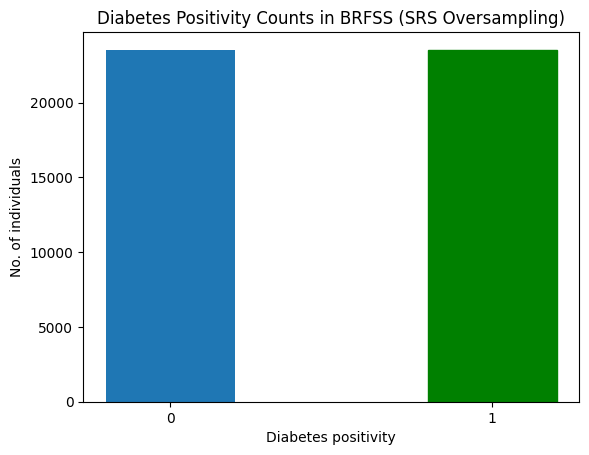

In [ ]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRS Oversampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_525"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3675 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3676 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3679 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3680 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3681 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.7470 - loss: 0.5982 - val_AUC: 0.8074 - val_loss: 0.5485
Epoch 2/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7929 - loss: 0.5522 - val_AUC: 0.8125 - val_loss: 0.5289
Epoch 3/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8120 - loss: 0.5305 - val_AUC: 0.8189 - val_loss: 0.5291
Epoch 4/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8197 - loss: 0.5188 - val_AUC: 0.8247 - val_loss: 0.5173
Epoch 5/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8262 - loss: 0.5078 - val_AUC: 0.8278 - val_loss: 0.5178
Epoch 6/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8302 - loss: 0.5027 - val_AUC: 0.8438 - val_loss: 0.4907
Epoch 7/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8460 - loss: 0.4844 - val_AUC: 0.8600 - val_loss: 0.4670
Epoch 8/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8558 - loss: 0.4707 - val_AUC: 0.8591 - val_loss: 0.4659
Epoch 9/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - 

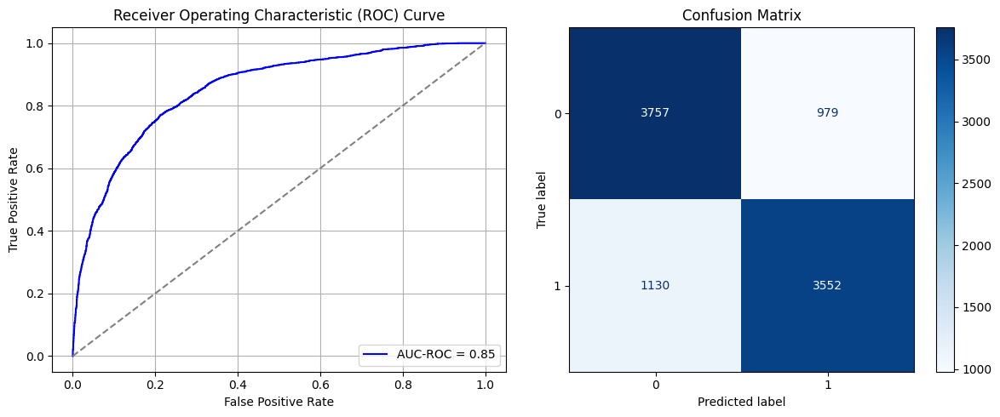

Best threshold based on F1-score: 0.34173089265823364
Time elapsed (performance): 43.15550420100044


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_526"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3682 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3683 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3686 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3687 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3688 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7272 - loss: 0.6118 - val_AUC: 0.0000e+00 - val_loss: 0.8056
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7650 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.8083
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7723 - loss: 0.5397 - val_AUC: 0.0000e+00 - val_loss: 0.7361
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7837 - loss: 0.5262 - val_AUC: 0.0000e+00 - val_loss: 0.7465
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7854 - loss: 0.5269 - val_AUC: 0.0000e+00 - val_loss: 0.8048
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7996 - loss: 0.5130 - val_AUC: 0.0000e+00 - val_loss: 0.7851
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8067 - loss: 0.5050 - val_AUC: 0.0000e+00 - val_loss: 0.7609
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8134 - loss: 0.5003 - val_AUC: 0.0000e+00 - val_loss: 0.7819
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_527"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3689 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3690 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3693 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3694 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3695 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7355 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7661 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7731 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7558
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7785 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7439
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7854 - loss: 0.5251 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7981 - loss: 0.5147 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.8112 - loss: 0.5030 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8183 - loss: 0.4948 - val_AUC: 0.0000e+00 - val_loss: 0.7426
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_528"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3696 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3697 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3700 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3701 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3702 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7365 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.8158
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7630 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7721 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7876 - loss: 0.5271 - val_AUC: 0.0000e+00 - val_loss: 0.7647
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7944 - loss: 0.5176 - val_AUC: 0.0000e+00 - val_loss: 0.7511
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.8000 - loss: 0.5120 - val_AUC: 0.0000e+00 - val_loss: 0.7988
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8053 - loss: 0.5077 - val_AUC: 0.0000e+00 - val_loss: 0.7319
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.8212 - loss: 0.4923 - val_AUC: 0.0000e+00 - val_loss: 0.6586
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_529"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3703 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3704 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3707 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3708 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3709 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7259 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7592 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.8090
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7776 - loss: 0.5346 - val_AUC: 0.0000e+00 - val_loss: 0.7850
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7851 - loss: 0.5283 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7925 - loss: 0.5205 - val_AUC: 0.0000e+00 - val_loss: 0.7679
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7971 - loss: 0.5173 - val_AUC: 0.0000e+00 - val_loss: 0.7447
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.8056 - loss: 0.5110 - val_AUC: 0.0000e+00 - val_loss: 0.7880
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8157 - loss: 0.4999 - val_AUC: 0.0000e+00 - val_loss: 0.5576
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_530"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3710 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3711 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3714 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3715 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3716 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7324 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.7160
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7648 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.7461
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7687 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.7976
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7754 - loss: 0.5355 - val_AUC: 0.0000e+00 - val_loss: 0.7644
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7848 - loss: 0.5255 - val_AUC: 0.0000e+00 - val_loss: 0.7544
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7993 - loss: 0.5125 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7995 - loss: 0.5144 - val_AUC: 0.0000e+00 - val_loss: 0.6916
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8059 - loss: 0.5107 - val_AUC: 0.0000e+00 - val_loss: 0.6818
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_531"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3717 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3718 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3721 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3722 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3723 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7272 - loss: 0.6104 - val_AUC: 0.0000e+00 - val_loss: 0.7819
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7711 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.7732
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7713 - loss: 0.5410 - val_AUC: 0.0000e+00 - val_loss: 0.7653
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7727 - loss: 0.5369 - val_AUC: 0.0000e+00 - val_loss: 0.7447
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7935 - loss: 0.5199 - val_AUC: 0.0000e+00 - val_loss: 0.6812
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8034 - loss: 0.5091 - val_AUC: 0.0000e+00 - val_loss: 0.6150
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8016 - loss: 0.5124 - val_AUC: 0.0000e+00 - val_loss: 0.7363
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.8097 - loss: 0.5007 - val_AUC: 0.0000e+00 - val_loss: 0.7205
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_532"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3724 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3725 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3728 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3729 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3730 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7392 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7682 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.7892
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7707 - loss: 0.5416 - val_AUC: 0.0000e+00 - val_loss: 0.7670
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7826 - loss: 0.5290 - val_AUC: 0.0000e+00 - val_loss: 0.7558
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7858 - loss: 0.5238 - val_AUC: 0.0000e+00 - val_loss: 0.7070
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8030 - loss: 0.5085 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8069 - loss: 0.5063 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.8120 - loss: 0.5013 - val_AUC: 0.0000e+00 - val_loss: 0.6367
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_533"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3731 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3732 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3735 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3736 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3737 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7363 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.7663
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7668 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7764 - loss: 0.5358 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7747 - loss: 0.5338 - val_AUC: 0.0000e+00 - val_loss: 0.7705
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7900 - loss: 0.5211 - val_AUC: 0.0000e+00 - val_loss: 0.7896
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7911 - loss: 0.5181 - val_AUC: 0.0000e+00 - val_loss: 0.6488
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7904 - loss: 0.5203 - val_AUC: 0.0000e+00 - val_loss: 0.7279
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8019 - loss: 0.5107 - val_AUC: 0.0000e+00 - val_loss: 0.7253
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_534"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3738 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3739 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3742 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3743 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3744 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7269 - loss: 0.6094 - val_AUC: 0.0000e+00 - val_loss: 0.7829
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7634 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7748 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7528
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7800 - loss: 0.5317 - val_AUC: 0.0000e+00 - val_loss: 0.7396
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7885 - loss: 0.5239 - val_AUC: 0.0000e+00 - val_loss: 0.7765
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8012 - loss: 0.5116 - val_AUC: 0.0000e+00 - val_loss: 0.7319
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8067 - loss: 0.5066 - val_AUC: 0.0000e+00 - val_loss: 0.8587
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.8131 - loss: 0.5004 - val_AUC: 0.0000e+00 - val_loss: 0.7312
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_535"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3745 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3746 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3749 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3750 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3751 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7338 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.7751
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7652 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7702 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.7705
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7831 - loss: 0.5300 - val_AUC: 0.0000e+00 - val_loss: 0.7794
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7877 - loss: 0.5270 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7905 - loss: 0.5229 - val_AUC: 0.0000e+00 - val_loss: 0.7966
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8009 - loss: 0.5115 - val_AUC: 0.0000e+00 - val_loss: 0.7931
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.8090 - loss: 0.5058 - val_AUC: 0.0000e+00 - val_loss: 0.6557
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_536"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3752 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3753 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3756 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3757 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3758 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7338 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.7620
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7652 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7705 - loss: 0.5392 - val_AUC: 0.0000e+00 - val_loss: 0.7505
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7845 - loss: 0.5282 - val_AUC: 0.0000e+00 - val_loss: 0.7769
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7899 - loss: 0.5215 - val_AUC: 0.0000e+00 - val_loss: 0.7491
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7907 - loss: 0.5200 - val_AUC: 0.0000e+00 - val_loss: 0.7622
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7999 - loss: 0.5128 - val_AUC: 0.0000e+00 - val_loss: 0.6814
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8133 - loss: 0.4984 - val_AUC: 0.0000e+00 - val_loss: 0.7030
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_537"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3759 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3760 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3763 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3764 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3765 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7360 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7642 - loss: 0.5454 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7759 - loss: 0.5346 - val_AUC: 0.0000e+00 - val_loss: 0.8500
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7812 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.7395
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7846 - loss: 0.5230 - val_AUC: 0.0000e+00 - val_loss: 0.7443
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7917 - loss: 0.5192 - val_AUC: 0.0000e+00 - val_loss: 0.6568
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7994 - loss: 0.5121 - val_AUC: 0.0000e+00 - val_loss: 0.8051
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8119 - loss: 0.5019 - val_AUC: 0.0000e+00 - val_loss: 0.6618
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_538"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3766 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3767 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3770 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3771 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3772 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7294 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7664 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7699 - loss: 0.5400 - val_AUC: 0.0000e+00 - val_loss: 0.7161
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7857 - loss: 0.5228 - val_AUC: 0.0000e+00 - val_loss: 0.6991
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7937 - loss: 0.5164 - val_AUC: 0.0000e+00 - val_loss: 0.6640
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7988 - loss: 0.5153 - val_AUC: 0.0000e+00 - val_loss: 0.7717
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.8039 - loss: 0.5074 - val_AUC: 0.0000e+00 - val_loss: 0.6776
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8094 - loss: 0.5050 - val_AUC: 0.0000e+00 - val_loss: 0.6679
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_539"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3773 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3774 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3777 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3778 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3779 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7309 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.7389
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7608 - loss: 0.5511 - val_AUC: 0.0000e+00 - val_loss: 0.7675
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7750 - loss: 0.5373 - val_AUC: 0.0000e+00 - val_loss: 0.8178
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7828 - loss: 0.5262 - val_AUC: 0.0000e+00 - val_loss: 0.7570
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7918 - loss: 0.5220 - val_AUC: 0.0000e+00 - val_loss: 0.7576
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8065 - loss: 0.5074 - val_AUC: 0.0000e+00 - val_loss: 0.7376
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8069 - loss: 0.5069 - val_AUC: 0.0000e+00 - val_loss: 0.7069
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8148 - loss: 0.4991 - val_AUC: 0.0000e+00 - val_loss: 0.7690
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_540"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3780 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3781 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3784 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3785 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3786 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7282 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7696 - loss: 0.5450 - val_AUC: 0.0000e+00 - val_loss: 0.8145
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7686 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.6921
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7800 - loss: 0.5324 - val_AUC: 0.0000e+00 - val_loss: 0.8127
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7951 - loss: 0.5174 - val_AUC: 0.0000e+00 - val_loss: 0.7063
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7971 - loss: 0.5169 - val_AUC: 0.0000e+00 - val_loss: 0.6555
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.8062 - loss: 0.5081 - val_AUC: 0.0000e+00 - val_loss: 0.7383
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.8146 - loss: 0.5018 - val_AUC: 0.0000e+00 - val_loss: 0.6347
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_541"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3787 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3788 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3791 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3792 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3793 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7321 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.7968
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7645 - loss: 0.5476 - val_AUC: 0.0000e+00 - val_loss: 0.8278
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7717 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.7009
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7802 - loss: 0.5310 - val_AUC: 0.0000e+00 - val_loss: 0.7362
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7924 - loss: 0.5225 - val_AUC: 0.0000e+00 - val_loss: 0.7566
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8029 - loss: 0.5100 - val_AUC: 0.0000e+00 - val_loss: 0.6958
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8004 - loss: 0.5133 - val_AUC: 0.0000e+00 - val_loss: 0.7109
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8115 - loss: 0.5015 - val_AUC: 0.0000e+00 - val_loss: 0.6603
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_542"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3794 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3795 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3798 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3799 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3800 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7350 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.7849
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7633 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7644
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7782 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.7915
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7867 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.6589
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7902 - loss: 0.5214 - val_AUC: 0.0000e+00 - val_loss: 0.7422
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7951 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8058 - loss: 0.5061 - val_AUC: 0.0000e+00 - val_loss: 0.7293
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8130 - loss: 0.5012 - val_AUC: 0.0000e+00 - val_loss: 0.7500
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_543"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3801 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3802 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3805 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3806 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3807 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7399 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.7734
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7667 - loss: 0.5479 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7763 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.7903
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7782 - loss: 0.5320 - val_AUC: 0.0000e+00 - val_loss: 0.7019
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7944 - loss: 0.5168 - val_AUC: 0.0000e+00 - val_loss: 0.7088
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7991 - loss: 0.5152 - val_AUC: 0.0000e+00 - val_loss: 0.9533
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8059 - loss: 0.5061 - val_AUC: 0.0000e+00 - val_loss: 0.7160
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8095 - loss: 0.5053 - val_AUC: 0.0000e+00 - val_loss: 0.7248
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_544"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3808 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3809 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3812 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3813 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3814 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7364 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.8082
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7662 - loss: 0.5465 - val_AUC: 0.0000e+00 - val_loss: 0.7654
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7831 - loss: 0.5292 - val_AUC: 0.0000e+00 - val_loss: 0.7899
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7876 - loss: 0.5238 - val_AUC: 0.0000e+00 - val_loss: 0.7242
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7950 - loss: 0.5165 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7966 - loss: 0.5163 - val_AUC: 0.0000e+00 - val_loss: 0.8155
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8085 - loss: 0.5072 - val_AUC: 0.0000e+00 - val_loss: 0.7815
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8144 - loss: 0.5004 - val_AUC: 0.0000e+00 - val_loss: 0.7293
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_545"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3815 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3816 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3819 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3820 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3821 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7384 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7674 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7744 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7839 - loss: 0.5260 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7958 - loss: 0.5155 - val_AUC: 0.0000e+00 - val_loss: 0.7316
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8117 - loss: 0.5028 - val_AUC: 0.0000e+00 - val_loss: 0.7352
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8065 - loss: 0.5082 - val_AUC: 0.0000e+00 - val_loss: 0.7305
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.8193 - loss: 0.4941 - val_AUC: 0.0000e+00 - val_loss: 0.6663
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_546"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3822 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3823 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3826 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3827 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3828 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7381 - loss: 0.6039 - val_AUC: 0.8061 - val_loss: 0.5507
Epoch 2/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8003 - loss: 0.5442 - val_AUC: 0.8104 - val_loss: 0.5381
Epoch 3/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8155 - loss: 0.5250 - val_AUC: 0.8226 - val_loss: 0.5136
Epoch 4/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8218 - loss: 0.5147 - val_AUC: 0.8302 - val_loss: 0.5093
Epoch 5/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8361 - loss: 0.4974 - val_AUC: 0.8438 - val_loss: 0.4896
Epoch 6/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8445 - loss: 0.4867 - val_AUC: 0.8385 - val_loss: 0.5022
Epoch 7/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8497 - loss: 0.4787 - val_AUC: 0.8528 - val_loss: 0.4792
Epoch 8/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8548 - loss: 0.4713 - val_AUC: 0.8608 - val_loss: 0.4674
Epoch 9/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - 

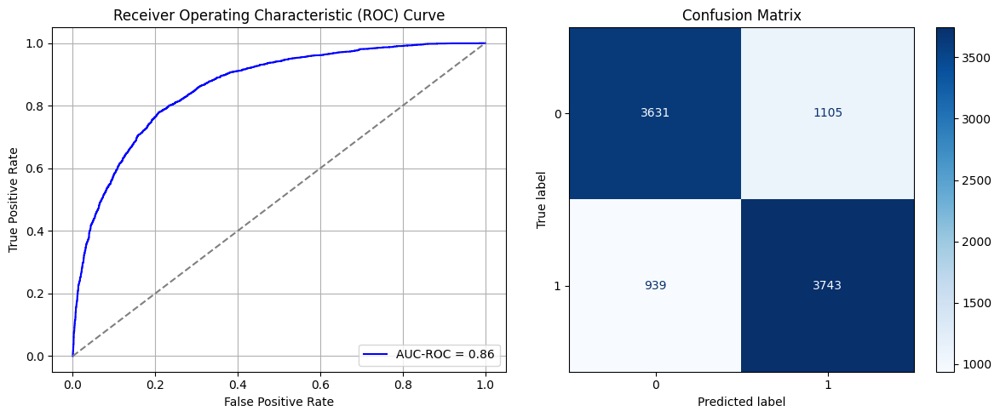

Best threshold based on F1-score: 0.4189399182796478
Time elapsed (performance): 36.810675326998535


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_547"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3829 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3830 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3833 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3834 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3835 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6899 - loss: 0.6525 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7314 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7433 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7589 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7688 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.7163
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7817 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.7540
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7922 - loss: 0.5302 - val_AUC: 0.0000e+00 - val_loss: 0.7285
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7945 - loss: 0.5250 - val_AUC: 0.0000e+00 - val_loss: 0.8157
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_548"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3836 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3837 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3840 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3841 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3842 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6817 - loss: 0.6697 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7315 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7443 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7513 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7630 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7753 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.8114
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7855 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.7713
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7983 - loss: 0.5246 - val_AUC: 0.0000e+00 - val_loss: 0.7347
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_549"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3843 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3844 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3847 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3848 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3849 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7000 - loss: 0.6526 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7392 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7402 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8255
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7577 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.7318
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7669 - loss: 0.5488 - val_AUC: 0.0000e+00 - val_loss: 0.7558
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7749 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7890 - loss: 0.5316 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7966 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.7728
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_550"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3850 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3851 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3854 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3855 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3856 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6779 - loss: 0.6809 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7356 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.7846
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7483 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7616 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.7754
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7743 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.6555
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7799 - loss: 0.5411 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7874 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7716
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7999 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.7517
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_551"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3857 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3858 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3861 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3862 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3863 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6901 - loss: 0.6606 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7337 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.7804
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7510 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.7942
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7587 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7717 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.7973
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7786 - loss: 0.5425 - val_AUC: 0.0000e+00 - val_loss: 0.8087
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7946 - loss: 0.5278 - val_AUC: 0.0000e+00 - val_loss: 0.6738
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7962 - loss: 0.5230 - val_AUC: 0.0000e+00 - val_loss: 0.5841
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_552"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3864 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3865 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3868 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3869 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3870 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6883 - loss: 0.6873 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7353 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.7483
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7510 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7562 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7620 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7854 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.7080
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7873 - loss: 0.5306 - val_AUC: 0.0000e+00 - val_loss: 0.6986
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7982 - loss: 0.5207 - val_AUC: 0.0000e+00 - val_loss: 0.8016
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_553"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3871 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3872 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3875 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3876 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3877 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6856 - loss: 0.6742 - val_AUC: 0.0000e+00 - val_loss: 0.9313
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7385 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.7882
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7477 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7623 - loss: 0.5517 - val_AUC: 0.0000e+00 - val_loss: 0.7306
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7712 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.6953
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7805 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.6830
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7902 - loss: 0.5282 - val_AUC: 0.0000e+00 - val_loss: 0.7886
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7979 - loss: 0.5222 - val_AUC: 0.0000e+00 - val_loss: 0.6331
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_554"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3878 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3879 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3882 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3883 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3884 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6867 - loss: 0.6568 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7346 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8220
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7444 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.7636
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7539 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.7605
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7717 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7650
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7822 - loss: 0.5383 - val_AUC: 0.0000e+00 - val_loss: 0.7260
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7926 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.6741
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7960 - loss: 0.5274 - val_AUC: 0.0000e+00 - val_loss: 0.7884
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_555"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3885 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3886 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3889 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3890 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3891 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6878 - loss: 0.6864 - val_AUC: 0.0000e+00 - val_loss: 0.9428
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7262 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.7761
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7438 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8237
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7584 - loss: 0.5551 - val_AUC: 0.0000e+00 - val_loss: 0.8174
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7734 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7599
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7845 - loss: 0.5380 - val_AUC: 0.0000e+00 - val_loss: 0.7779
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7977 - loss: 0.5246 - val_AUC: 0.0000e+00 - val_loss: 0.9642
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8006 - loss: 0.5188 - val_AUC: 0.0000e+00 - val_loss: 0.7211
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_556"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3892 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3893 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3896 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3897 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3898 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6918 - loss: 0.6631 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7312 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7488 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.7743
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7527 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.7297
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7635 - loss: 0.5491 - val_AUC: 0.0000e+00 - val_loss: 0.7568
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7804 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.7398
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7877 - loss: 0.5333 - val_AUC: 0.0000e+00 - val_loss: 0.7888
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7970 - loss: 0.5228 - val_AUC: 0.0000e+00 - val_loss: 0.8085
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_557"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3899 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3900 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3903 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3904 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3905 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6906 - loss: 0.6621 - val_AUC: 0.0000e+00 - val_loss: 0.8015
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7352 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.7948
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7447 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8511
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7629 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.8163
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7755 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.7884
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7861 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.6966
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7886 - loss: 0.5315 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7957 - loss: 0.5274 - val_AUC: 0.0000e+00 - val_loss: 0.6931
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_558"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3906 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3907 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3910 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3911 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3912 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6861 - loss: 0.6685 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7343 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7489 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7615 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.8131
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7737 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.7247
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7897 - loss: 0.5318 - val_AUC: 0.0000e+00 - val_loss: 0.7246
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8002 - loss: 0.5193 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8003 - loss: 0.5192 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_559"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3913 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3914 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3917 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3918 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3919 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6880 - loss: 0.6604 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7340 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.9489
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7430 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.7727
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - AUC: 0.7595 - loss: 0.5578 - val_AUC: 0.0000e+00 - val_loss: 0.8234
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7695 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.7868
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7793 - loss: 0.5411 - val_AUC: 0.0000e+00 - val_loss: 0.7580
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7913 - loss: 0.5280 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7891 - loss: 0.5297 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_560"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3920 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3921 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3924 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3925 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3926 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6811 - loss: 0.6672 - val_AUC: 0.0000e+00 - val_loss: 0.7561
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7342 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7460 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7563 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.8459
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7668 - loss: 0.5513 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7753 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.7763
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7894 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.7880
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7981 - loss: 0.5222 - val_AUC: 0.0000e+00 - val_loss: 0.7860
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_561"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3927 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3928 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3931 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3932 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3933 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6742 - loss: 0.7022 - val_AUC: 0.0000e+00 - val_loss: 0.8140
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7373 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8141
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7493 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.7885
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7522 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7703 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.7373
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7854 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.7398
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7962 - loss: 0.5252 - val_AUC: 0.0000e+00 - val_loss: 0.7374
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7970 - loss: 0.5192 - val_AUC: 0.0000e+00 - val_loss: 0.7580
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_562"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3934 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3935 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3938 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3939 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3940 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6924 - loss: 0.6514 - val_AUC: 0.0000e+00 - val_loss: 0.8380
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7315 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - AUC: 0.7491 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.7935
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7574 - loss: 0.5536 - val_AUC: 0.0000e+00 - val_loss: 0.7478
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7708 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7764 - loss: 0.5470 - val_AUC: 0.0000e+00 - val_loss: 0.7604
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7918 - loss: 0.5295 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7981 - loss: 0.5214 - val_AUC: 0.0000e+00 - val_loss: 0.7230
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_563"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3941 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3942 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3945 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3946 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3947 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6923 - loss: 0.6646 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7341 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8225
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7451 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.7836
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7587 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7736 - loss: 0.5457 - val_AUC: 0.0000e+00 - val_loss: 0.7684
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7797 - loss: 0.5420 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7953 - loss: 0.5257 - val_AUC: 0.0000e+00 - val_loss: 0.5580
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8053 - loss: 0.5140 - val_AUC: 0.0000e+00 - val_loss: 0.6945
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_564"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3948 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3949 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3952 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3953 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3954 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6944 - loss: 0.6443 - val_AUC: 0.0000e+00 - val_loss: 0.7974
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7349 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7455 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8024
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - AUC: 0.7644 - loss: 0.5519 - val_AUC: 0.0000e+00 - val_loss: 0.8085
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7690 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.7648
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7864 - loss: 0.5320 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7922 - loss: 0.5289 - val_AUC: 0.0000e+00 - val_loss: 0.7956
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7997 - loss: 0.5187 - val_AUC: 0.0000e+00 - val_loss: 0.6686
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_565"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3955 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3956 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3959 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3960 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3961 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - AUC: 0.6887 - loss: 0.6645 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7331 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7479 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.7837
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7537 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7792 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.7447
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7882 - loss: 0.5331 - val_AUC: 0.0000e+00 - val_loss: 0.8377
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7951 - loss: 0.5250 - val_AUC: 0.0000e+00 - val_loss: 0.7646
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7956 - loss: 0.5217 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_566"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3962 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3963 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3966 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3967 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3968 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6902 - loss: 0.6522 - val_AUC: 0.0000e+00 - val_loss: 0.7930
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7318 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.7807
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7470 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7680 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7714 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.7191
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7855 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.7638
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7903 - loss: 0.5329 - val_AUC: 0.0000e+00 - val_loss: 0.7780
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8021 - loss: 0.5178 - val_AUC: 0.0000e+00 - val_loss: 0.9723
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_567"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3969 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3970 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3973 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3974 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3975 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.7333 - loss: 0.6064 - val_AUC: 0.8083 - val_loss: 0.5439
Epoch 2/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7976 - loss: 0.5481 - val_AUC: 0.8034 - val_loss: 0.5417
Epoch 3/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8076 - loss: 0.5353 - val_AUC: 0.8235 - val_loss: 0.5134
Epoch 4/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8247 - loss: 0.5110 - val_AUC: 0.8310 - val_loss: 0.5033
Epoch 5/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8301 - loss: 0.5032 - val_AUC: 0.8460 - val_loss: 0.4912
Epoch 6/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8498 - loss: 0.4800 - val_AUC: 0.8612 - val_loss: 0.4633
Epoch 7/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8576 - loss: 0.4679 - val_AUC: 0.8578 - val_loss: 0.4746
Epoch 8/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8593 - loss: 0.4647 - val_AUC: 0.8647 - val_loss: 0.4618
Epoch 9/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - 

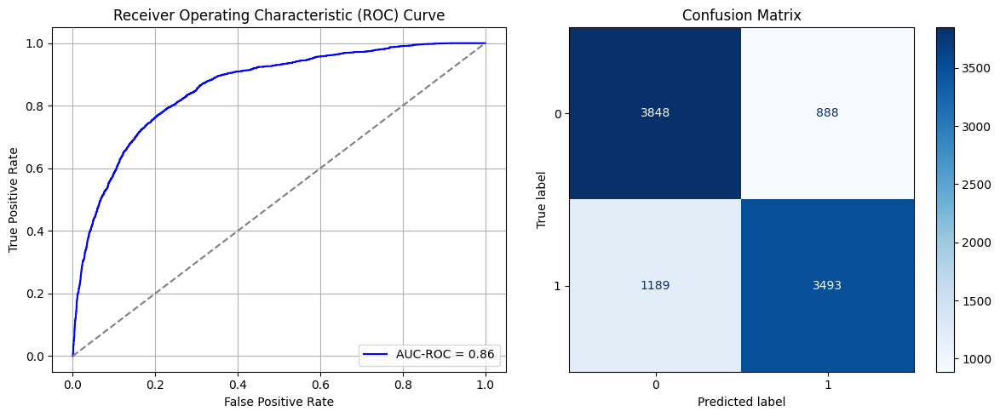

Best threshold based on F1-score: 0.37028878927230835
Time elapsed (performance): 42.01098885900137


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_568"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3976 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3977 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3980 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3981 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3982 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7260 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7750 - loss: 0.5376 - val_AUC: 0.0000e+00 - val_loss: 0.6885
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8026 - loss: 0.5089 - val_AUC: 0.0000e+00 - val_loss: 0.7556
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8076 - loss: 0.5057 - val_AUC: 0.0000e+00 - val_loss: 0.7193
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8276 - loss: 0.4832 - val_AUC: 0.0000e+00 - val_loss: 0.7507
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8400 - loss: 0.4732 - val_AUC: 0.0000e+00 - val_loss: 0.6753
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8390 - loss: 0.4751 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8452 - loss: 0.4669 - val_AUC: 0.0000e+00 - val_loss: 0.6963
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_569"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3983 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3984 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3987 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3988 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3989 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7214 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8982
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7752 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.7688
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7912 - loss: 0.5246 - val_AUC: 0.0000e+00 - val_loss: 0.7636
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8048 - loss: 0.5069 - val_AUC: 0.0000e+00 - val_loss: 0.6887
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8189 - loss: 0.4952 - val_AUC: 0.0000e+00 - val_loss: 0.6410
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8241 - loss: 0.4901 - val_AUC: 0.0000e+00 - val_loss: 0.6877
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8336 - loss: 0.4806 - val_AUC: 0.0000e+00 - val_loss: 0.6817
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8332 - loss: 0.4782 - val_AUC: 0.0000e+00 - val_loss: 0.6325
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_570"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3990 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3991 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3994 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3995 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3996 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7380 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7756 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.8274
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8040 - loss: 0.5104 - val_AUC: 0.0000e+00 - val_loss: 0.7421
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8119 - loss: 0.5004 - val_AUC: 0.0000e+00 - val_loss: 0.7479
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8258 - loss: 0.4881 - val_AUC: 0.0000e+00 - val_loss: 0.6360
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8347 - loss: 0.4789 - val_AUC: 0.0000e+00 - val_loss: 0.6585
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8405 - loss: 0.4710 - val_AUC: 0.0000e+00 - val_loss: 0.6241
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8482 - loss: 0.4604 - val_AUC: 0.0000e+00 - val_loss: 0.6487
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_571"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3997 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3998 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4001 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4002 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4003 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7339 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.7598
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7746 - loss: 0.5362 - val_AUC: 0.0000e+00 - val_loss: 0.7160
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8079 - loss: 0.5092 - val_AUC: 0.0000e+00 - val_loss: 0.7084
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8170 - loss: 0.4964 - val_AUC: 0.0000e+00 - val_loss: 0.6499
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8277 - loss: 0.4853 - val_AUC: 0.0000e+00 - val_loss: 0.6598
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8286 - loss: 0.4833 - val_AUC: 0.0000e+00 - val_loss: 0.6693
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8412 - loss: 0.4728 - val_AUC: 0.0000e+00 - val_loss: 0.6029
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8453 - loss: 0.4683 - val_AUC: 0.0000e+00 - val_loss: 0.6486
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_572"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4004 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4005 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4008 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4009 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4010 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7284 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7769 - loss: 0.5335 - val_AUC: 0.0000e+00 - val_loss: 0.7625
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7971 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.7545
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8136 - loss: 0.4977 - val_AUC: 0.0000e+00 - val_loss: 0.7134
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8218 - loss: 0.4906 - val_AUC: 0.0000e+00 - val_loss: 0.6758
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8243 - loss: 0.4886 - val_AUC: 0.0000e+00 - val_loss: 0.6199
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8360 - loss: 0.4757 - val_AUC: 0.0000e+00 - val_loss: 0.6960
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8418 - loss: 0.4728 - val_AUC: 0.0000e+00 - val_loss: 0.6603
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_573"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4011 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4012 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4015 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4016 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4017 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7294 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.7397
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7758 - loss: 0.5351 - val_AUC: 0.0000e+00 - val_loss: 0.7576
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8023 - loss: 0.5109 - val_AUC: 0.0000e+00 - val_loss: 0.6954
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8103 - loss: 0.5060 - val_AUC: 0.0000e+00 - val_loss: 0.6791
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8234 - loss: 0.4890 - val_AUC: 0.0000e+00 - val_loss: 0.7086
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8280 - loss: 0.4867 - val_AUC: 0.0000e+00 - val_loss: 0.6541
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8408 - loss: 0.4701 - val_AUC: 0.0000e+00 - val_loss: 0.6599
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8416 - loss: 0.4754 - val_AUC: 0.0000e+00 - val_loss: 0.5931
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_574"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4018 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4019 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4022 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4023 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4024 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7311 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7716 - loss: 0.5391 - val_AUC: 0.0000e+00 - val_loss: 0.7522
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7936 - loss: 0.5189 - val_AUC: 0.0000e+00 - val_loss: 0.6816
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8077 - loss: 0.5058 - val_AUC: 0.0000e+00 - val_loss: 0.6737
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8169 - loss: 0.4984 - val_AUC: 0.0000e+00 - val_loss: 0.7163
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8270 - loss: 0.4858 - val_AUC: 0.0000e+00 - val_loss: 0.7029
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8389 - loss: 0.4742 - val_AUC: 0.0000e+00 - val_loss: 0.6812
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8432 - loss: 0.4672 - val_AUC: 0.0000e+00 - val_loss: 0.5777
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_575"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4025 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4026 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4029 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4030 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4031 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7304 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8441
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7726 - loss: 0.5370 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7994 - loss: 0.5153 - val_AUC: 0.0000e+00 - val_loss: 0.7509
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8085 - loss: 0.5061 - val_AUC: 0.0000e+00 - val_loss: 0.7300
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8271 - loss: 0.4887 - val_AUC: 0.0000e+00 - val_loss: 0.6831
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8369 - loss: 0.4750 - val_AUC: 0.0000e+00 - val_loss: 0.6906
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8383 - loss: 0.4728 - val_AUC: 0.0000e+00 - val_loss: 0.6174
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8475 - loss: 0.4620 - val_AUC: 0.0000e+00 - val_loss: 0.7063
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_576"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4032 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4033 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4036 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4037 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4038 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7328 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7869 - loss: 0.5248 - val_AUC: 0.0000e+00 - val_loss: 0.7601
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7946 - loss: 0.5166 - val_AUC: 0.0000e+00 - val_loss: 0.7160
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8156 - loss: 0.4981 - val_AUC: 0.0000e+00 - val_loss: 0.7180
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8224 - loss: 0.4937 - val_AUC: 0.0000e+00 - val_loss: 0.7096
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8295 - loss: 0.4821 - val_AUC: 0.0000e+00 - val_loss: 0.7991
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8361 - loss: 0.4800 - val_AUC: 0.0000e+00 - val_loss: 0.5245
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8496 - loss: 0.4602 - val_AUC: 0.0000e+00 - val_loss: 0.6109
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_577"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4039 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4040 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4043 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4044 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4045 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7340 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7834 - loss: 0.5311 - val_AUC: 0.0000e+00 - val_loss: 0.8018
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8025 - loss: 0.5113 - val_AUC: 0.0000e+00 - val_loss: 0.7021
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8093 - loss: 0.5052 - val_AUC: 0.0000e+00 - val_loss: 0.7579
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8243 - loss: 0.4878 - val_AUC: 0.0000e+00 - val_loss: 0.7117
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8297 - loss: 0.4849 - val_AUC: 0.0000e+00 - val_loss: 0.6771
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8405 - loss: 0.4725 - val_AUC: 0.0000e+00 - val_loss: 0.6503
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8442 - loss: 0.4688 - val_AUC: 0.0000e+00 - val_loss: 0.6123
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_578"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4046 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4047 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4050 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4051 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4052 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7257 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.7716
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7809 - loss: 0.5311 - val_AUC: 0.0000e+00 - val_loss: 0.6542
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7984 - loss: 0.5159 - val_AUC: 0.0000e+00 - val_loss: 0.7231
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8039 - loss: 0.5079 - val_AUC: 0.0000e+00 - val_loss: 0.6155
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8211 - loss: 0.4914 - val_AUC: 0.0000e+00 - val_loss: 0.7081
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8226 - loss: 0.4910 - val_AUC: 0.0000e+00 - val_loss: 0.6586
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8409 - loss: 0.4735 - val_AUC: 0.0000e+00 - val_loss: 0.6925
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8350 - loss: 0.4777 - val_AUC: 0.0000e+00 - val_loss: 0.6520
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_579"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4053 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4054 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4057 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4058 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4059 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7340 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.7487
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7777 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.7773
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7941 - loss: 0.5197 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8149 - loss: 0.5015 - val_AUC: 0.0000e+00 - val_loss: 0.6862
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8201 - loss: 0.4950 - val_AUC: 0.0000e+00 - val_loss: 0.6088
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8337 - loss: 0.4798 - val_AUC: 0.0000e+00 - val_loss: 0.6639
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8366 - loss: 0.4779 - val_AUC: 0.0000e+00 - val_loss: 0.6076
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8428 - loss: 0.4676 - val_AUC: 0.0000e+00 - val_loss: 0.5602
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_580"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4060 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4061 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4064 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4065 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4066 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7295 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.7744
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7753 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.7040
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7957 - loss: 0.5167 - val_AUC: 0.0000e+00 - val_loss: 0.7124
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8123 - loss: 0.5042 - val_AUC: 0.0000e+00 - val_loss: 0.6333
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8247 - loss: 0.4901 - val_AUC: 0.0000e+00 - val_loss: 0.6341
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8284 - loss: 0.4847 - val_AUC: 0.0000e+00 - val_loss: 0.6812
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8424 - loss: 0.4704 - val_AUC: 0.0000e+00 - val_loss: 0.6112
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8440 - loss: 0.4667 - val_AUC: 0.0000e+00 - val_loss: 0.6579
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_581"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4067 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4068 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4071 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4072 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4073 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7210 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.7577
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7745 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.7329
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8012 - loss: 0.5134 - val_AUC: 0.0000e+00 - val_loss: 0.6852
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8137 - loss: 0.5063 - val_AUC: 0.0000e+00 - val_loss: 0.7846
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8238 - loss: 0.4902 - val_AUC: 0.0000e+00 - val_loss: 0.6676
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8309 - loss: 0.4818 - val_AUC: 0.0000e+00 - val_loss: 0.6948
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8343 - loss: 0.4790 - val_AUC: 0.0000e+00 - val_loss: 0.6465
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8473 - loss: 0.4668 - val_AUC: 0.0000e+00 - val_loss: 0.6392
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_582"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4074 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4075 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4078 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4079 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4080 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7323 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.7804
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7788 - loss: 0.5331 - val_AUC: 0.0000e+00 - val_loss: 0.7410
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7994 - loss: 0.5151 - val_AUC: 0.0000e+00 - val_loss: 0.6872
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8088 - loss: 0.5060 - val_AUC: 0.0000e+00 - val_loss: 0.7086
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8237 - loss: 0.4925 - val_AUC: 0.0000e+00 - val_loss: 0.6907
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8336 - loss: 0.4789 - val_AUC: 0.0000e+00 - val_loss: 0.7439
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8430 - loss: 0.4707 - val_AUC: 0.0000e+00 - val_loss: 0.6371
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8433 - loss: 0.4677 - val_AUC: 0.0000e+00 - val_loss: 0.6669
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_583"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4081 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4082 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4085 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4086 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4087 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7286 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.7762
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7789 - loss: 0.5346 - val_AUC: 0.0000e+00 - val_loss: 0.7939
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7978 - loss: 0.5150 - val_AUC: 0.0000e+00 - val_loss: 0.7337
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8045 - loss: 0.5079 - val_AUC: 0.0000e+00 - val_loss: 0.7672
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8228 - loss: 0.4904 - val_AUC: 0.0000e+00 - val_loss: 0.5723
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8380 - loss: 0.4756 - val_AUC: 0.0000e+00 - val_loss: 0.7440
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8478 - loss: 0.4617 - val_AUC: 0.0000e+00 - val_loss: 0.6535
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8452 - loss: 0.4679 - val_AUC: 0.0000e+00 - val_loss: 0.7066
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_584"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4088 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4089 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4092 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4093 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4094 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7271 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.7385
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7814 - loss: 0.5329 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7966 - loss: 0.5169 - val_AUC: 0.0000e+00 - val_loss: 0.6821
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8037 - loss: 0.5110 - val_AUC: 0.0000e+00 - val_loss: 0.6410
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8176 - loss: 0.4949 - val_AUC: 0.0000e+00 - val_loss: 0.6823
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8277 - loss: 0.4851 - val_AUC: 0.0000e+00 - val_loss: 0.7663
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8297 - loss: 0.4837 - val_AUC: 0.0000e+00 - val_loss: 0.5727
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8400 - loss: 0.4724 - val_AUC: 0.0000e+00 - val_loss: 0.6358
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_585"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4095 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4096 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4099 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4100 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4101 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7308 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.7803
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7747 - loss: 0.5366 - val_AUC: 0.0000e+00 - val_loss: 0.7277
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7997 - loss: 0.5164 - val_AUC: 0.0000e+00 - val_loss: 0.7085
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8115 - loss: 0.5027 - val_AUC: 0.0000e+00 - val_loss: 0.6594
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8207 - loss: 0.4923 - val_AUC: 0.0000e+00 - val_loss: 0.7468
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8271 - loss: 0.4862 - val_AUC: 0.0000e+00 - val_loss: 0.7304
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8373 - loss: 0.4758 - val_AUC: 0.0000e+00 - val_loss: 0.6235
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8439 - loss: 0.4688 - val_AUC: 0.0000e+00 - val_loss: 0.6807
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_586"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4102 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4103 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4106 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4107 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4108 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7232 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.7395
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7809 - loss: 0.5270 - val_AUC: 0.0000e+00 - val_loss: 0.7511
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7976 - loss: 0.5170 - val_AUC: 0.0000e+00 - val_loss: 0.8152
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8105 - loss: 0.5046 - val_AUC: 0.0000e+00 - val_loss: 0.6746
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8242 - loss: 0.4901 - val_AUC: 0.0000e+00 - val_loss: 0.7388
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8327 - loss: 0.4825 - val_AUC: 0.0000e+00 - val_loss: 0.7119
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8373 - loss: 0.4732 - val_AUC: 0.0000e+00 - val_loss: 0.6642
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8495 - loss: 0.4611 - val_AUC: 0.0000e+00 - val_loss: 0.6661
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_587"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4109 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4110 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4113 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4114 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4115 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7239 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.7568
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7788 - loss: 0.5312 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7994 - loss: 0.5141 - val_AUC: 0.0000e+00 - val_loss: 0.6704
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8116 - loss: 0.5017 - val_AUC: 0.0000e+00 - val_loss: 0.8127
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8232 - loss: 0.4920 - val_AUC: 0.0000e+00 - val_loss: 0.6723
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8332 - loss: 0.4803 - val_AUC: 0.0000e+00 - val_loss: 0.6459
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8406 - loss: 0.4722 - val_AUC: 0.0000e+00 - val_loss: 0.6337
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8476 - loss: 0.4637 - val_AUC: 0.0000e+00 - val_loss: 0.5977
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_588"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4116 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4117 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4120 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4121 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4122 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.7361 - loss: 0.6044 - val_AUC: 0.8032 - val_loss: 0.5492
Epoch 2/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7984 - loss: 0.5467 - val_AUC: 0.8143 - val_loss: 0.5324
Epoch 3/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8104 - loss: 0.5299 - val_AUC: 0.8167 - val_loss: 0.5198
Epoch 4/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8261 - loss: 0.5079 - val_AUC: 0.8257 - val_loss: 0.5108
Epoch 5/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8353 - loss: 0.4958 - val_AUC: 0.8387 - val_loss: 0.4991
Epoch 6/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8403 - loss: 0.4906 - val_AUC: 0.8456 - val_loss: 0.4844
Epoch 7/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8464 - loss: 0.4819 - val_AUC: 0.8483 - val_loss: 0.4842
Epoch 8/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8517 - loss: 0.4756 - val_AUC: 0.8535 - val_loss: 0.4754
Epoch 9/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - 

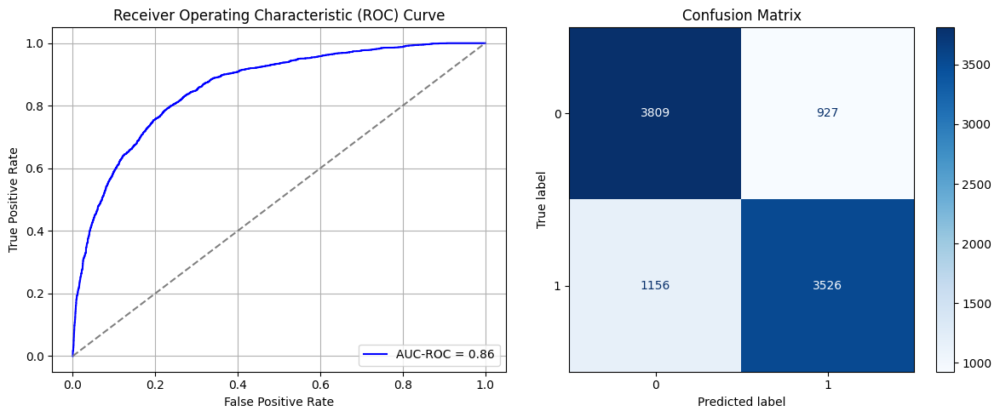

Best threshold based on F1-score: 0.3426681458950043
Time elapsed (performance): 53.464935486001195


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_589"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4123 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4124 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4127 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4128 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4129 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7558 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.7660
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8017 - loss: 0.5135 - val_AUC: 0.0000e+00 - val_loss: 0.6469
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8112 - loss: 0.5030 - val_AUC: 0.0000e+00 - val_loss: 0.6727
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8180 - loss: 0.4971 - val_AUC: 0.0000e+00 - val_loss: 0.7463
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8323 - loss: 0.4788 - val_AUC: 0.0000e+00 - val_loss: 0.6229
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8412 - loss: 0.4702 - val_AUC: 0.0000e+00 - val_loss: 0.6649
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8415 - loss: 0.4716 - val_AUC: 0.0000e+00 - val_loss: 0.5656
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8505 - loss: 0.4618 - val_AUC: 0.0000e+00 - val_loss: 0.7293
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_590"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4130 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4131 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4134 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4135 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4136 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7549 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.7838
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8019 - loss: 0.5142 - val_AUC: 0.0000e+00 - val_loss: 0.6728
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8065 - loss: 0.5068 - val_AUC: 0.0000e+00 - val_loss: 0.5883
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8192 - loss: 0.4944 - val_AUC: 0.0000e+00 - val_loss: 0.6676
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8289 - loss: 0.4829 - val_AUC: 0.0000e+00 - val_loss: 0.5808
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8390 - loss: 0.4734 - val_AUC: 0.0000e+00 - val_loss: 0.6669
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8470 - loss: 0.4632 - val_AUC: 0.0000e+00 - val_loss: 0.6326
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8498 - loss: 0.4595 - val_AUC: 0.0000e+00 - val_loss: 0.6611
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_591"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4137 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4138 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4141 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4142 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4143 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7486 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.7153
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7981 - loss: 0.5140 - val_AUC: 0.0000e+00 - val_loss: 0.6975
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8118 - loss: 0.5015 - val_AUC: 0.0000e+00 - val_loss: 0.7035
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8214 - loss: 0.4931 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8308 - loss: 0.4831 - val_AUC: 0.0000e+00 - val_loss: 0.6765
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8388 - loss: 0.4736 - val_AUC: 0.0000e+00 - val_loss: 0.6513
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8410 - loss: 0.4710 - val_AUC: 0.0000e+00 - val_loss: 0.6694
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8464 - loss: 0.4647 - val_AUC: 0.0000e+00 - val_loss: 0.7391
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_592"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4144 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4145 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4148 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4149 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4150 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7565 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.7316
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8081 - loss: 0.5079 - val_AUC: 0.0000e+00 - val_loss: 0.7883
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8148 - loss: 0.5004 - val_AUC: 0.0000e+00 - val_loss: 0.6595
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8217 - loss: 0.4916 - val_AUC: 0.0000e+00 - val_loss: 0.6886
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8315 - loss: 0.4820 - val_AUC: 0.0000e+00 - val_loss: 0.6787
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8414 - loss: 0.4714 - val_AUC: 0.0000e+00 - val_loss: 0.6390
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8471 - loss: 0.4614 - val_AUC: 0.0000e+00 - val_loss: 0.6657
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8552 - loss: 0.4521 - val_AUC: 0.0000e+00 - val_loss: 0.6961
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_593"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4151 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4152 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4155 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4156 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4157 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7557 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.7004
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8056 - loss: 0.5090 - val_AUC: 0.0000e+00 - val_loss: 0.6582
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8126 - loss: 0.5009 - val_AUC: 0.0000e+00 - val_loss: 0.7143
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8225 - loss: 0.4918 - val_AUC: 0.0000e+00 - val_loss: 0.6705
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8327 - loss: 0.4814 - val_AUC: 0.0000e+00 - val_loss: 0.7459
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8409 - loss: 0.4704 - val_AUC: 0.0000e+00 - val_loss: 0.6328
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8483 - loss: 0.4620 - val_AUC: 0.0000e+00 - val_loss: 0.6617
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8556 - loss: 0.4502 - val_AUC: 0.0000e+00 - val_loss: 0.6091
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_594"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4158 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4159 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4162 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4163 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4164 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7540 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8122
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8001 - loss: 0.5129 - val_AUC: 0.0000e+00 - val_loss: 0.6342
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8112 - loss: 0.5037 - val_AUC: 0.0000e+00 - val_loss: 0.6975
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8211 - loss: 0.4927 - val_AUC: 0.0000e+00 - val_loss: 0.6140
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8256 - loss: 0.4887 - val_AUC: 0.0000e+00 - val_loss: 0.6254
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8411 - loss: 0.4709 - val_AUC: 0.0000e+00 - val_loss: 0.6769
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8455 - loss: 0.4623 - val_AUC: 0.0000e+00 - val_loss: 0.6298
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8493 - loss: 0.4600 - val_AUC: 0.0000e+00 - val_loss: 0.5854
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_595"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4165 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4166 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4169 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4170 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4171 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7558 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.6975
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8025 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.7261
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8098 - loss: 0.5082 - val_AUC: 0.0000e+00 - val_loss: 0.6908
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8192 - loss: 0.4937 - val_AUC: 0.0000e+00 - val_loss: 0.6100
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8323 - loss: 0.4788 - val_AUC: 0.0000e+00 - val_loss: 0.6605
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8402 - loss: 0.4710 - val_AUC: 0.0000e+00 - val_loss: 0.6490
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8467 - loss: 0.4634 - val_AUC: 0.0000e+00 - val_loss: 0.6133
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8579 - loss: 0.4497 - val_AUC: 0.0000e+00 - val_loss: 0.6924
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_596"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4172 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4173 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4176 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4177 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4178 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7499 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.6999
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7988 - loss: 0.5161 - val_AUC: 0.0000e+00 - val_loss: 0.7310
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8118 - loss: 0.5042 - val_AUC: 0.0000e+00 - val_loss: 0.6790
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8216 - loss: 0.4900 - val_AUC: 0.0000e+00 - val_loss: 0.7427
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8302 - loss: 0.4854 - val_AUC: 0.0000e+00 - val_loss: 0.6194
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8377 - loss: 0.4741 - val_AUC: 0.0000e+00 - val_loss: 0.6611
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8460 - loss: 0.4650 - val_AUC: 0.0000e+00 - val_loss: 0.6740
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8493 - loss: 0.4609 - val_AUC: 0.0000e+00 - val_loss: 0.6361
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_597"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4179 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4180 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4183 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4184 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4185 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7569 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.7794
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8015 - loss: 0.5154 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8154 - loss: 0.5005 - val_AUC: 0.0000e+00 - val_loss: 0.7333
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8209 - loss: 0.4928 - val_AUC: 0.0000e+00 - val_loss: 0.6681
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8318 - loss: 0.4817 - val_AUC: 0.0000e+00 - val_loss: 0.6514
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8338 - loss: 0.4764 - val_AUC: 0.0000e+00 - val_loss: 0.6316
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8481 - loss: 0.4623 - val_AUC: 0.0000e+00 - val_loss: 0.6360
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8478 - loss: 0.4628 - val_AUC: 0.0000e+00 - val_loss: 0.6821
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_598"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4186 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4187 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4190 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4191 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4192 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7592 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.7273
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8019 - loss: 0.5136 - val_AUC: 0.0000e+00 - val_loss: 0.7124
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8109 - loss: 0.5040 - val_AUC: 0.0000e+00 - val_loss: 0.7012
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8205 - loss: 0.4928 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8236 - loss: 0.4884 - val_AUC: 0.0000e+00 - val_loss: 0.7185
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8361 - loss: 0.4769 - val_AUC: 0.0000e+00 - val_loss: 0.6852
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8481 - loss: 0.4613 - val_AUC: 0.0000e+00 - val_loss: 0.7214
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8512 - loss: 0.4587 - val_AUC: 0.0000e+00 - val_loss: 0.7879
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_599"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4193 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4194 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4197 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4198 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4199 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7533 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.7407
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7998 - loss: 0.5184 - val_AUC: 0.0000e+00 - val_loss: 0.7301
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8115 - loss: 0.5015 - val_AUC: 0.0000e+00 - val_loss: 0.6564
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8224 - loss: 0.4921 - val_AUC: 0.0000e+00 - val_loss: 0.6645
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8328 - loss: 0.4815 - val_AUC: 0.0000e+00 - val_loss: 0.7425
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8388 - loss: 0.4742 - val_AUC: 0.0000e+00 - val_loss: 0.6113
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8446 - loss: 0.4674 - val_AUC: 0.0000e+00 - val_loss: 0.6565
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8495 - loss: 0.4608 - val_AUC: 0.0000e+00 - val_loss: 0.6421
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_600"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4200 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4201 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4204 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4205 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4206 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7501 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.7623
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8016 - loss: 0.5154 - val_AUC: 0.0000e+00 - val_loss: 0.6829
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8103 - loss: 0.5078 - val_AUC: 0.0000e+00 - val_loss: 0.6987
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8258 - loss: 0.4912 - val_AUC: 0.0000e+00 - val_loss: 0.6191
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8269 - loss: 0.4877 - val_AUC: 0.0000e+00 - val_loss: 0.6838
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8354 - loss: 0.4789 - val_AUC: 0.0000e+00 - val_loss: 0.7329
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8474 - loss: 0.4644 - val_AUC: 0.0000e+00 - val_loss: 0.6357
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8560 - loss: 0.4496 - val_AUC: 0.0000e+00 - val_loss: 0.5812
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_601"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4207 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4208 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4210 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4211 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4212 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4213 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7446 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.7278
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7981 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.7686
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8152 - loss: 0.5009 - val_AUC: 0.0000e+00 - val_loss: 0.6905
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8215 - loss: 0.4937 - val_AUC: 0.0000e+00 - val_loss: 0.7025
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8301 - loss: 0.4837 - val_AUC: 0.0000e+00 - val_loss: 0.6973
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8389 - loss: 0.4743 - val_AUC: 0.0000e+00 - val_loss: 0.6446
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8457 - loss: 0.4621 - val_AUC: 0.0000e+00 - val_loss: 0.6247
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8461 - loss: 0.4656 - val_AUC: 0.0000e+00 - val_loss: 0.6824
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_602"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4214 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4215 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4217 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4218 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4219 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4220 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7451 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.7520
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8011 - loss: 0.5131 - val_AUC: 0.0000e+00 - val_loss: 0.7346
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8150 - loss: 0.5027 - val_AUC: 0.0000e+00 - val_loss: 0.7743
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8216 - loss: 0.4937 - val_AUC: 0.0000e+00 - val_loss: 0.6945
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8295 - loss: 0.4840 - val_AUC: 0.0000e+00 - val_loss: 0.6194
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8353 - loss: 0.4765 - val_AUC: 0.0000e+00 - val_loss: 0.6524
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8465 - loss: 0.4645 - val_AUC: 0.0000e+00 - val_loss: 0.6226
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8516 - loss: 0.4576 - val_AUC: 0.0000e+00 - val_loss: 0.6811
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_603"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4221 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4222 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4224 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4225 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4226 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4227 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7522 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.7008
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8029 - loss: 0.5147 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8136 - loss: 0.5012 - val_AUC: 0.0000e+00 - val_loss: 0.7019
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8200 - loss: 0.4954 - val_AUC: 0.0000e+00 - val_loss: 0.6979
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8302 - loss: 0.4841 - val_AUC: 0.0000e+00 - val_loss: 0.6754
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8402 - loss: 0.4712 - val_AUC: 0.0000e+00 - val_loss: 0.7387
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8497 - loss: 0.4625 - val_AUC: 0.0000e+00 - val_loss: 0.7101
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8454 - loss: 0.4646 - val_AUC: 0.0000e+00 - val_loss: 0.6118
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_604"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4228 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4229 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4231 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4232 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4233 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4234 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7499 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.7133
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7969 - loss: 0.5194 - val_AUC: 0.0000e+00 - val_loss: 0.6727
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8043 - loss: 0.5069 - val_AUC: 0.0000e+00 - val_loss: 0.6233
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8207 - loss: 0.4919 - val_AUC: 0.0000e+00 - val_loss: 0.6880
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8295 - loss: 0.4843 - val_AUC: 0.0000e+00 - val_loss: 0.6941
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8388 - loss: 0.4721 - val_AUC: 0.0000e+00 - val_loss: 0.6998
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8419 - loss: 0.4702 - val_AUC: 0.0000e+00 - val_loss: 0.7070
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8533 - loss: 0.4557 - val_AUC: 0.0000e+00 - val_loss: 0.6312
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_605"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4235 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4236 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4238 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4239 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4240 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4241 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7506 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8364
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8045 - loss: 0.5125 - val_AUC: 0.0000e+00 - val_loss: 0.7812
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8185 - loss: 0.4972 - val_AUC: 0.0000e+00 - val_loss: 0.6629
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8183 - loss: 0.4955 - val_AUC: 0.0000e+00 - val_loss: 0.6942
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8256 - loss: 0.4896 - val_AUC: 0.0000e+00 - val_loss: 0.6890
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8400 - loss: 0.4698 - val_AUC: 0.0000e+00 - val_loss: 0.5950
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8470 - loss: 0.4654 - val_AUC: 0.0000e+00 - val_loss: 0.6899
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8527 - loss: 0.4566 - val_AUC: 0.0000e+00 - val_loss: 0.6770
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_606"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4242 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4243 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4245 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4246 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4247 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4248 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7525 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8008
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8023 - loss: 0.5139 - val_AUC: 0.0000e+00 - val_loss: 0.6499
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8137 - loss: 0.5001 - val_AUC: 0.0000e+00 - val_loss: 0.7035
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8177 - loss: 0.5024 - val_AUC: 0.0000e+00 - val_loss: 0.6740
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8267 - loss: 0.4875 - val_AUC: 0.0000e+00 - val_loss: 0.6447
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8350 - loss: 0.4792 - val_AUC: 0.0000e+00 - val_loss: 0.6260
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8415 - loss: 0.4694 - val_AUC: 0.0000e+00 - val_loss: 0.5281
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8497 - loss: 0.4589 - val_AUC: 0.0000e+00 - val_loss: 0.6937
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_607"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4249 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4250 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4252 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4253 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4254 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4255 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7517 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8287
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7997 - loss: 0.5134 - val_AUC: 0.0000e+00 - val_loss: 0.6569
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8121 - loss: 0.5014 - val_AUC: 0.0000e+00 - val_loss: 0.7704
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8235 - loss: 0.4905 - val_AUC: 0.0000e+00 - val_loss: 0.6807
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8300 - loss: 0.4843 - val_AUC: 0.0000e+00 - val_loss: 0.6965
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8407 - loss: 0.4707 - val_AUC: 0.0000e+00 - val_loss: 0.6534
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8414 - loss: 0.4711 - val_AUC: 0.0000e+00 - val_loss: 0.6545
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8442 - loss: 0.4645 - val_AUC: 0.0000e+00 - val_loss: 0.7273
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_608"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4256 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4257 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4259 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4260 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4261 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4262 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7581 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.7383
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8005 - loss: 0.5171 - val_AUC: 0.0000e+00 - val_loss: 0.7297
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8139 - loss: 0.5013 - val_AUC: 0.0000e+00 - val_loss: 0.6576
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8196 - loss: 0.4959 - val_AUC: 0.0000e+00 - val_loss: 0.7126
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8231 - loss: 0.4912 - val_AUC: 0.0000e+00 - val_loss: 0.7404
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8375 - loss: 0.4745 - val_AUC: 0.0000e+00 - val_loss: 0.6435
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8437 - loss: 0.4686 - val_AUC: 0.0000e+00 - val_loss: 0.6433
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8474 - loss: 0.4621 - val_AUC: 0.0000e+00 - val_loss: 0.6157
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_609"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4263 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4264 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4266 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4267 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4268 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4269 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.7301 - loss: 0.6068 - val_AUC: 0.8004 - val_loss: 0.5523
Epoch 2/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8071 - loss: 0.5370 - val_AUC: 0.8124 - val_loss: 0.5319
Epoch 3/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8160 - loss: 0.5239 - val_AUC: 0.8210 - val_loss: 0.5141
Epoch 4/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8232 - loss: 0.5117 - val_AUC: 0.8353 - val_loss: 0.5023
Epoch 5/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8318 - loss: 0.5022 - val_AUC: 0.8416 - val_loss: 0.4940
Epoch 6/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8456 - loss: 0.4844 - val_AUC: 0.8571 - val_loss: 0.4694
Epoch 7/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8578 - loss: 0.4678 - val_AUC: 0.8608 - val_loss: 0.4650
Epoch 8/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8627 - loss: 0.4606 - val_AUC: 0.8300 - val_loss: 0.5051
Epoch 9/10
942/942 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

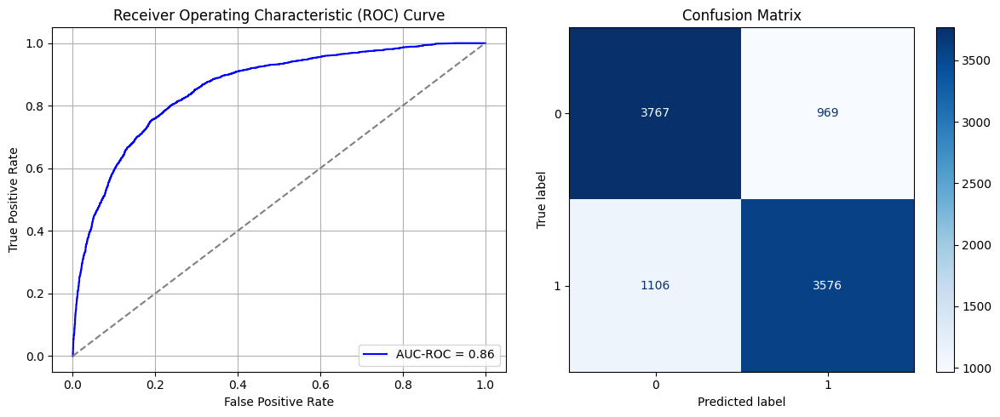

Best threshold based on F1-score: 0.34610140323638916
Time elapsed (performance): 45.338134863999585


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_610"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4270 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4271 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4273 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4274 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4275 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4276 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7200 - loss: 0.6473 - val_AUC: 0.0000e+00 - val_loss: 0.8266
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7621 - loss: 0.5540 - val_AUC: 0.0000e+00 - val_loss: 0.7901
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7730 - loss: 0.5430 - val_AUC: 0.0000e+00 - val_loss: 0.6314
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7782 - loss: 0.5407 - val_AUC: 0.0000e+00 - val_loss: 0.6978
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7872 - loss: 0.5290 - val_AUC: 0.0000e+00 - val_loss: 0.7962
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8003 - loss: 0.5180 - val_AUC: 0.0000e+00 - val_loss: 0.8147
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8100 - loss: 0.5069 - val_AUC: 0.0000e+00 - val_loss: 0.7350
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8143 - loss: 0.5032 - val_AUC: 0.0000e+00 - val_loss: 0.7482
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_611"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4277 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4278 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4280 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4281 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4282 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4283 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7230 - loss: 0.6329 - val_AUC: 0.0000e+00 - val_loss: 0.8003
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7558 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.7602
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7669 - loss: 0.5463 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7851 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.6960
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7883 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.7774
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8007 - loss: 0.5198 - val_AUC: 0.0000e+00 - val_loss: 0.7734
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8072 - loss: 0.5120 - val_AUC: 0.0000e+00 - val_loss: 0.6556
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8148 - loss: 0.5028 - val_AUC: 0.0000e+00 - val_loss: 0.6557
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_612"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4284 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4285 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4287 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4288 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4289 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4290 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7320 - loss: 0.6221 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7612 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7686 - loss: 0.5492 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7788 - loss: 0.5411 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7929 - loss: 0.5280 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7991 - loss: 0.5221 - val_AUC: 0.0000e+00 - val_loss: 0.7405
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8049 - loss: 0.5153 - val_AUC: 0.0000e+00 - val_loss: 0.7023
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8110 - loss: 0.5056 - val_AUC: 0.0000e+00 - val_loss: 0.7648
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_613"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4291 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4292 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4294 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4295 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4296 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4297 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7258 - loss: 0.6313 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7576 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7711 - loss: 0.5451 - val_AUC: 0.0000e+00 - val_loss: 0.7104
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7852 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.8359
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7923 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.6871
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7932 - loss: 0.5231 - val_AUC: 0.0000e+00 - val_loss: 0.7044
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8046 - loss: 0.5105 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8114 - loss: 0.5074 - val_AUC: 0.0000e+00 - val_loss: 0.6349
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_614"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4298 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4299 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4301 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4302 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4303 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4304 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7246 - loss: 0.6396 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7561 - loss: 0.5567 - val_AUC: 0.0000e+00 - val_loss: 0.7777
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7687 - loss: 0.5461 - val_AUC: 0.0000e+00 - val_loss: 0.7175
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7799 - loss: 0.5367 - val_AUC: 0.0000e+00 - val_loss: 0.7504
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7931 - loss: 0.5257 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7981 - loss: 0.5197 - val_AUC: 0.0000e+00 - val_loss: 0.7767
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8027 - loss: 0.5160 - val_AUC: 0.0000e+00 - val_loss: 0.6986
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8106 - loss: 0.5075 - val_AUC: 0.0000e+00 - val_loss: 0.6617
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_615"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4305 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4306 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4308 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4309 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4310 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4311 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7234 - loss: 0.6372 - val_AUC: 0.0000e+00 - val_loss: 0.7031
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7569 - loss: 0.5581 - val_AUC: 0.0000e+00 - val_loss: 0.7346
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7674 - loss: 0.5484 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7810 - loss: 0.5375 - val_AUC: 0.0000e+00 - val_loss: 0.7257
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7910 - loss: 0.5263 - val_AUC: 0.0000e+00 - val_loss: 0.7780
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7985 - loss: 0.5196 - val_AUC: 0.0000e+00 - val_loss: 0.7382
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8079 - loss: 0.5118 - val_AUC: 0.0000e+00 - val_loss: 0.6828
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8172 - loss: 0.5001 - val_AUC: 0.0000e+00 - val_loss: 0.7076
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_616"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4312 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4313 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4315 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4316 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4317 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4318 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7079 - loss: 0.6666 - val_AUC: 0.0000e+00 - val_loss: 0.8131
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7497 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.7258
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7668 - loss: 0.5477 - val_AUC: 0.0000e+00 - val_loss: 0.7411
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7780 - loss: 0.5409 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7957 - loss: 0.5202 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7948 - loss: 0.5233 - val_AUC: 0.0000e+00 - val_loss: 0.7162
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8075 - loss: 0.5130 - val_AUC: 0.0000e+00 - val_loss: 0.7109
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8120 - loss: 0.5085 - val_AUC: 0.0000e+00 - val_loss: 0.7857
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_617"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4319 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4320 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4322 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4323 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4324 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4325 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7151 - loss: 0.6685 - val_AUC: 0.0000e+00 - val_loss: 0.8050
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7617 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.8298
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7690 - loss: 0.5491 - val_AUC: 0.0000e+00 - val_loss: 0.7772
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7808 - loss: 0.5347 - val_AUC: 0.0000e+00 - val_loss: 0.7601
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7857 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.7331
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7993 - loss: 0.5219 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8072 - loss: 0.5100 - val_AUC: 0.0000e+00 - val_loss: 0.6194
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8132 - loss: 0.5035 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_618"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4326 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4327 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4329 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4330 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4331 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4332 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7240 - loss: 0.6393 - val_AUC: 0.0000e+00 - val_loss: 0.8212
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7541 - loss: 0.5590 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7726 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.7644
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7762 - loss: 0.5422 - val_AUC: 0.0000e+00 - val_loss: 0.7320
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7952 - loss: 0.5224 - val_AUC: 0.0000e+00 - val_loss: 0.7588
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7991 - loss: 0.5203 - val_AUC: 0.0000e+00 - val_loss: 0.7445
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8104 - loss: 0.5092 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8189 - loss: 0.5019 - val_AUC: 0.0000e+00 - val_loss: 0.7674
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_619"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4333 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4334 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4336 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4337 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4338 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4339 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7229 - loss: 0.6289 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7584 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.7611
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7695 - loss: 0.5481 - val_AUC: 0.0000e+00 - val_loss: 0.7564
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7848 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.7995
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7975 - loss: 0.5257 - val_AUC: 0.0000e+00 - val_loss: 0.7627
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8027 - loss: 0.5156 - val_AUC: 0.0000e+00 - val_loss: 0.7458
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8050 - loss: 0.5136 - val_AUC: 0.0000e+00 - val_loss: 0.7858
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8108 - loss: 0.5043 - val_AUC: 0.0000e+00 - val_loss: 0.6950
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_620"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4340 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4341 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4343 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4344 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4345 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4346 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7146 - loss: 0.6730 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7506 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.7264
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7636 - loss: 0.5501 - val_AUC: 0.0000e+00 - val_loss: 0.7684
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7745 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7912 - loss: 0.5296 - val_AUC: 0.0000e+00 - val_loss: 0.7025
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7965 - loss: 0.5253 - val_AUC: 0.0000e+00 - val_loss: 0.6540
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8059 - loss: 0.5135 - val_AUC: 0.0000e+00 - val_loss: 0.7503
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8201 - loss: 0.4982 - val_AUC: 0.0000e+00 - val_loss: 0.7229
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_621"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4347 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4348 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4350 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4351 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4352 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4353 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7291 - loss: 0.6285 - val_AUC: 0.0000e+00 - val_loss: 0.8194
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7602 - loss: 0.5542 - val_AUC: 0.0000e+00 - val_loss: 0.7801
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7736 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.7342
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7799 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.7882
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7951 - loss: 0.5264 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8038 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.6880
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8057 - loss: 0.5142 - val_AUC: 0.0000e+00 - val_loss: 0.6789
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8168 - loss: 0.4999 - val_AUC: 0.0000e+00 - val_loss: 0.7075
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_622"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4354 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4355 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4357 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4358 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4359 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4360 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7216 - loss: 0.6421 - val_AUC: 0.0000e+00 - val_loss: 0.7946
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7597 - loss: 0.5556 - val_AUC: 0.0000e+00 - val_loss: 0.7866
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7703 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.7472
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7770 - loss: 0.5414 - val_AUC: 0.0000e+00 - val_loss: 0.7310
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7907 - loss: 0.5282 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8015 - loss: 0.5170 - val_AUC: 0.0000e+00 - val_loss: 0.7846
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8185 - loss: 0.4985 - val_AUC: 0.0000e+00 - val_loss: 0.7742
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8157 - loss: 0.5031 - val_AUC: 0.0000e+00 - val_loss: 0.6665
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_623"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4361 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4362 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4364 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4365 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4366 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4367 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7243 - loss: 0.6334 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7559 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7733 - loss: 0.5439 - val_AUC: 0.0000e+00 - val_loss: 0.8006
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7848 - loss: 0.5332 - val_AUC: 0.0000e+00 - val_loss: 0.7720
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7919 - loss: 0.5262 - val_AUC: 0.0000e+00 - val_loss: 0.6541
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8059 - loss: 0.5127 - val_AUC: 0.0000e+00 - val_loss: 0.7064
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8095 - loss: 0.5089 - val_AUC: 0.0000e+00 - val_loss: 0.7206
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8116 - loss: 0.5057 - val_AUC: 0.0000e+00 - val_loss: 0.6262
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_624"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4368 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4369 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4371 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4372 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4373 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4374 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7264 - loss: 0.6392 - val_AUC: 0.0000e+00 - val_loss: 0.8494
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7595 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7652 - loss: 0.5493 - val_AUC: 0.0000e+00 - val_loss: 0.8110
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7824 - loss: 0.5359 - val_AUC: 0.0000e+00 - val_loss: 0.7856
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7905 - loss: 0.5278 - val_AUC: 0.0000e+00 - val_loss: 0.6868
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7956 - loss: 0.5252 - val_AUC: 0.0000e+00 - val_loss: 0.7055
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8088 - loss: 0.5109 - val_AUC: 0.0000e+00 - val_loss: 0.7728
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8197 - loss: 0.5022 - val_AUC: 0.0000e+00 - val_loss: 0.7355
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_625"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4375 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4376 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4378 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4379 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4380 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4381 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7242 - loss: 0.6476 - val_AUC: 0.0000e+00 - val_loss: 0.7658
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7579 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7683 - loss: 0.5496 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7805 - loss: 0.5340 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7872 - loss: 0.5305 - val_AUC: 0.0000e+00 - val_loss: 0.7377
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7975 - loss: 0.5209 - val_AUC: 0.0000e+00 - val_loss: 0.7439
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8072 - loss: 0.5117 - val_AUC: 0.0000e+00 - val_loss: 0.7050
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8137 - loss: 0.5024 - val_AUC: 0.0000e+00 - val_loss: 0.7033
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_626"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4382 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4383 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4385 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4386 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4387 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4388 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7247 - loss: 0.6482 - val_AUC: 0.0000e+00 - val_loss: 0.8189
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7554 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7704 - loss: 0.5462 - val_AUC: 0.0000e+00 - val_loss: 0.7891
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7839 - loss: 0.5338 - val_AUC: 0.0000e+00 - val_loss: 0.6897
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7977 - loss: 0.5222 - val_AUC: 0.0000e+00 - val_loss: 0.7278
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8054 - loss: 0.5106 - val_AUC: 0.0000e+00 - val_loss: 0.7186
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8062 - loss: 0.5101 - val_AUC: 0.0000e+00 - val_loss: 0.7378
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8101 - loss: 0.5069 - val_AUC: 0.0000e+00 - val_loss: 0.7150
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_627"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4389 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4390 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4392 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4393 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4394 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4395 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7143 - loss: 0.6585 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7507 - loss: 0.5619 - val_AUC: 0.0000e+00 - val_loss: 0.8202
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7742 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.7865
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7765 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.7589
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7869 - loss: 0.5305 - val_AUC: 0.0000e+00 - val_loss: 0.7350
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7984 - loss: 0.5192 - val_AUC: 0.0000e+00 - val_loss: 0.7007
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8065 - loss: 0.5115 - val_AUC: 0.0000e+00 - val_loss: 0.6192
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8091 - loss: 0.5066 - val_AUC: 0.0000e+00 - val_loss: 0.7536
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_628"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4396 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4397 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4399 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4400 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4401 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4402 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7185 - loss: 0.6487 - val_AUC: 0.0000e+00 - val_loss: 0.8340
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7582 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.7876
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7749 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.8139
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7811 - loss: 0.5341 - val_AUC: 0.0000e+00 - val_loss: 0.6273
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7919 - loss: 0.5268 - val_AUC: 0.0000e+00 - val_loss: 0.7689
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8053 - loss: 0.5131 - val_AUC: 0.0000e+00 - val_loss: 0.7027
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8119 - loss: 0.5053 - val_AUC: 0.0000e+00 - val_loss: 0.7297
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8134 - loss: 0.5067 - val_AUC: 0.0000e+00 - val_loss: 0.7605
Epoch 9/10
558/558 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_629"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4403 (Dense)              │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4404 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4406 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4407 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4408 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4409 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7182 - loss: 0.6420 - val_AUC: 0.0000e+00 - val_loss: 0.7143
Epoch 2/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7574 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.7236
Epoch 3/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7621 - loss: 0.5557 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 4/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7798 - loss: 0.5378 - val_AUC: 0.0000e+00 - val_loss: 0.7144
Epoch 5/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7958 - loss: 0.5234 - val_AUC: 0.0000e+00 - val_loss: 0.8121
Epoch 6/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7999 - loss: 0.5196 - val_AUC: 0.0000e+00 - val_loss: 0.7439
Epoch 7/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7985 - loss: 0.5196 - val_AUC: 0.0000e+00 - val_loss: 0.7902
Epoch 8/10
558/558 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8063 - loss: 0.5130 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 9/10
558/558 ━━━━━━━━━━━━━━━━

In [ ]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)

In [ ]:
print(ParamFit)
ParamFit.to_csv('SRS_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.084885  0.486957
1   0.088109  0.492754
2   0.162966  0.376812
3   0.118553  0.434783
4   0.101003  0.469565
..       ...       ...
95  0.167980  0.336232
96  0.157235  0.365217
97  0.129298  0.394203
98  0.103868  0.472464
99  0.159026  0.330435

[100 rows x 2 columns]


In [ ]:
ParamFit['FNR'].mean()

np.float64(0.3893913043478262)

## Systematic Resampling:

In this case, we examine the possibility of performing Random Oversampling on the minority class using systematic sampling. For this purpose, taking a sampling interval of $k$, we would compile a total of $k*\frac{N_0-N_1}{N_1}$ systematic samples from the minority class in order to balance the dataset. We sample the starting point from 1 to $k$ *with replacement*, since a highly imbalanced dataset will require sampling with replacement in order to achieve a balanced dataset.

In particular, we take $k=10$ for the source data sampling, and take $k=20$ for the target training data resampling.

In [ ]:
X_S_Sy, y_S_Sy = systematic_resampler(data_S_full, data_S_full.iloc[:, -1], 10)
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_resampler(T_train, T_train.iloc[:, -1], 20)
print(y_T_train_Sy)

8393
23544
Nsamples= 18.051948051948052
2        0
3        0
4        0
6        0
8        0
        ..
31780    1
31808    1
31832    1
31866    1
31897    1
Name: Y2, Length: 47039, dtype: int64
1391
11156
Nsamples= 140.40258806613946
14490    0
4908     0
11461    0
2455     0
13540    0
        ..
7282     1
2671     1
7034     1
12267    1
3918     1
Name: Y, Length: 22207, dtype: int64


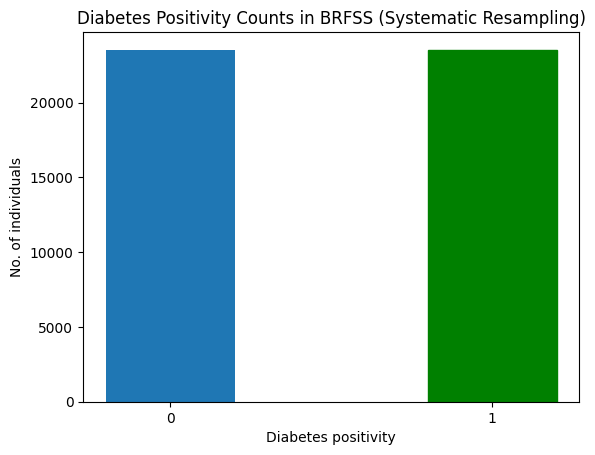

In [ ]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Resampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - AUC: 0.7229 - loss: 0.6123 - val_AUC: 0.7959 - val_loss: 0.5571
Epoch 2/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7938 - loss: 0.5515 - val_AUC: 0.8150 - val_loss: 0.5270
Epoch 3/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8077 - loss: 0.5339 - val_AUC: 0.8207 - val_loss: 0.5214
Epoch 4/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8173 - loss: 0.5203 - val_AUC: 0.8333 - val_loss: 0.5022
Epoch 5/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8329 - loss: 0.5008 - val_AUC: 0.8496 - val_loss: 0.4817
Epoch 6/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8516 - loss: 0.4780 - val_AUC: 0.8552 - val_loss: 0.4868
Epoch 7/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8581 - loss: 0.4676 - val_AUC: 0.8612 - val_loss: 0.4659
Epoch 8/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8590 - loss: 0.4660 - val_AUC: 0.8638 - val_loss: 0.4630
Epoch 9/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - 

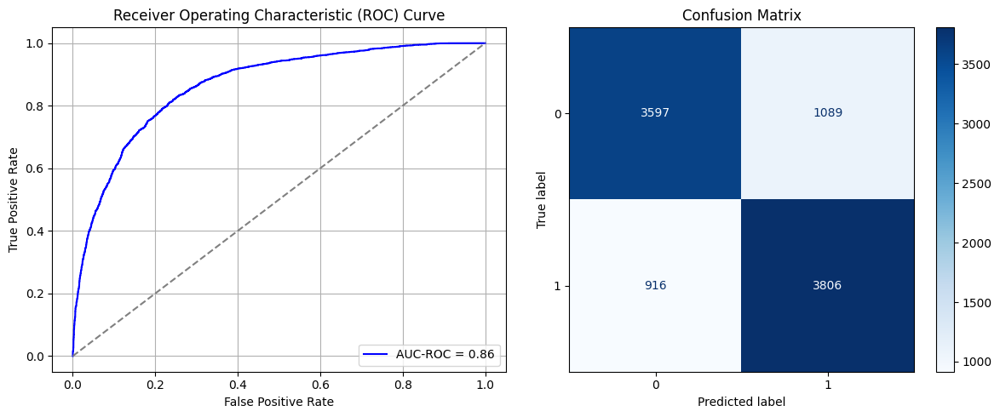

Best threshold based on F1-score: 0.39652225375175476
Time elapsed (performance): 50.48538068899998


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6748 - loss: 0.6286 - val_AUC: 0.0000e+00 - val_loss: 0.8171
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7557 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.8036
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7785 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.7982
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7987 - loss: 0.5185 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8134 - loss: 0.5065 - val_AUC: 0.0000e+00 - val_loss: 0.6476
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8195 - loss: 0.4966 - val_AUC: 0.0000e+00 - val_loss: 0.7569
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8392 - loss: 0.4766 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8478 - loss: 0.4673 - val_AUC: 0.0000e+00 - val_loss: 0.6870
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6663 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7537 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.7465
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7780 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.7508
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7971 - loss: 0.5200 - val_AUC: 0.0000e+00 - val_loss: 0.7475
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8131 - loss: 0.5035 - val_AUC: 0.0000e+00 - val_loss: 0.7650
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8260 - loss: 0.4915 - val_AUC: 0.0000e+00 - val_loss: 0.6727
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8377 - loss: 0.4756 - val_AUC: 0.0000e+00 - val_loss: 0.7313
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8479 - loss: 0.4664 - val_AUC: 0.0000e+00 - val_loss: 0.5182
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6911 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7518 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.7169
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7798 - loss: 0.5384 - val_AUC: 0.0000e+00 - val_loss: 0.7531
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7957 - loss: 0.5238 - val_AUC: 0.0000e+00 - val_loss: 0.7530
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8156 - loss: 0.5037 - val_AUC: 0.0000e+00 - val_loss: 0.7638
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8272 - loss: 0.4882 - val_AUC: 0.0000e+00 - val_loss: 0.6044
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8293 - loss: 0.4857 - val_AUC: 0.0000e+00 - val_loss: 0.6096
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8454 - loss: 0.4681 - val_AUC: 0.0000e+00 - val_loss: 0.7822
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6638 - loss: 0.6312 - val_AUC: 0.0000e+00 - val_loss: 0.9249
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7487 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.6668
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7812 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.7772
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7985 - loss: 0.5218 - val_AUC: 0.0000e+00 - val_loss: 0.8045
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8173 - loss: 0.4992 - val_AUC: 0.0000e+00 - val_loss: 0.6393
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8256 - loss: 0.4901 - val_AUC: 0.0000e+00 - val_loss: 0.6915
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8308 - loss: 0.4809 - val_AUC: 0.0000e+00 - val_loss: 0.5353
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8469 - loss: 0.4678 - val_AUC: 0.0000e+00 - val_loss: 0.6770
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_35 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6684 - loss: 0.6224 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7497 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7768 - loss: 0.5434 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7997 - loss: 0.5197 - val_AUC: 0.0000e+00 - val_loss: 0.7212
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8132 - loss: 0.5055 - val_AUC: 0.0000e+00 - val_loss: 0.7802
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8238 - loss: 0.4941 - val_AUC: 0.0000e+00 - val_loss: 0.7319
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8360 - loss: 0.4764 - val_AUC: 0.0000e+00 - val_loss: 0.6567
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8463 - loss: 0.4650 - val_AUC: 0.0000e+00 - val_loss: 0.6844
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_42 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6773 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.7581
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7515 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7745 - loss: 0.5449 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8023 - loss: 0.5185 - val_AUC: 0.0000e+00 - val_loss: 0.7935
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8167 - loss: 0.5008 - val_AUC: 0.0000e+00 - val_loss: 0.8105
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8258 - loss: 0.4905 - val_AUC: 0.0000e+00 - val_loss: 0.6873
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8346 - loss: 0.4784 - val_AUC: 0.0000e+00 - val_loss: 0.5824
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8483 - loss: 0.4635 - val_AUC: 0.0000e+00 - val_loss: 0.6397
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_49 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6662 - loss: 0.6243 - val_AUC: 0.0000e+00 - val_loss: 0.7953
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7515 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7774 - loss: 0.5404 - val_AUC: 0.0000e+00 - val_loss: 0.7160
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7953 - loss: 0.5244 - val_AUC: 0.0000e+00 - val_loss: 0.8055
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8107 - loss: 0.5091 - val_AUC: 0.0000e+00 - val_loss: 0.7338
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8280 - loss: 0.4910 - val_AUC: 0.0000e+00 - val_loss: 0.6599
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8297 - loss: 0.4870 - val_AUC: 0.0000e+00 - val_loss: 0.7410
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8418 - loss: 0.4734 - val_AUC: 0.0000e+00 - val_loss: 0.6476
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6778 - loss: 0.6229 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7549 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.8000
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7883 - loss: 0.5300 - val_AUC: 0.0000e+00 - val_loss: 0.8251
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7927 - loss: 0.5255 - val_AUC: 0.0000e+00 - val_loss: 0.7744
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8163 - loss: 0.5006 - val_AUC: 0.0000e+00 - val_loss: 0.7429
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8279 - loss: 0.4885 - val_AUC: 0.0000e+00 - val_loss: 0.5805
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8365 - loss: 0.4779 - val_AUC: 0.0000e+00 - val_loss: 0.6879
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8471 - loss: 0.4662 - val_AUC: 0.0000e+00 - val_loss: 0.5602
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.6800 - loss: 0.6190 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7514 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.7783
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7787 - loss: 0.5386 - val_AUC: 0.0000e+00 - val_loss: 0.7155
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7984 - loss: 0.5193 - val_AUC: 0.0000e+00 - val_loss: 0.8027
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8077 - loss: 0.5100 - val_AUC: 0.0000e+00 - val_loss: 0.7988
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8192 - loss: 0.4951 - val_AUC: 0.0000e+00 - val_loss: 0.7716
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8366 - loss: 0.4808 - val_AUC: 0.0000e+00 - val_loss: 0.6230
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8440 - loss: 0.4688 - val_AUC: 0.0000e+00 - val_loss: 0.6421
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6833 - loss: 0.6221 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7500 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.7857
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7808 - loss: 0.5393 - val_AUC: 0.0000e+00 - val_loss: 0.6844
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7987 - loss: 0.5210 - val_AUC: 0.0000e+00 - val_loss: 0.7740
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8214 - loss: 0.4973 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8262 - loss: 0.4932 - val_AUC: 0.0000e+00 - val_loss: 0.7190
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8308 - loss: 0.4817 - val_AUC: 0.0000e+00 - val_loss: 0.5913
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8456 - loss: 0.4669 - val_AUC: 0.0000e+00 - val_loss: 0.5975
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6570 - loss: 0.6352 - val_AUC: 0.0000e+00 - val_loss: 0.7179
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7568 - loss: 0.5545 - val_AUC: 0.0000e+00 - val_loss: 0.6665
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7869 - loss: 0.5323 - val_AUC: 0.0000e+00 - val_loss: 0.7116
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8025 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.5923
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8089 - loss: 0.5089 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8257 - loss: 0.4906 - val_AUC: 0.0000e+00 - val_loss: 0.7730
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8366 - loss: 0.4785 - val_AUC: 0.0000e+00 - val_loss: 0.7302
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8438 - loss: 0.4665 - val_AUC: 0.0000e+00 - val_loss: 0.6013
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6797 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7527 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.7725
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7740 - loss: 0.5408 - val_AUC: 0.0000e+00 - val_loss: 0.7625
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7986 - loss: 0.5203 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8149 - loss: 0.5036 - val_AUC: 0.0000e+00 - val_loss: 0.6975
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8283 - loss: 0.4900 - val_AUC: 0.0000e+00 - val_loss: 0.7123
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8388 - loss: 0.4760 - val_AUC: 0.0000e+00 - val_loss: 0.6131
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8471 - loss: 0.4617 - val_AUC: 0.0000e+00 - val_loss: 0.6756
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6813 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.8275
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7585 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7868 - loss: 0.5331 - val_AUC: 0.0000e+00 - val_loss: 0.7170
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8011 - loss: 0.5174 - val_AUC: 0.0000e+00 - val_loss: 0.7122
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8117 - loss: 0.5074 - val_AUC: 0.0000e+00 - val_loss: 0.6409
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8286 - loss: 0.4873 - val_AUC: 0.0000e+00 - val_loss: 0.5742
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8397 - loss: 0.4740 - val_AUC: 0.0000e+00 - val_loss: 0.6223
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8481 - loss: 0.4637 - val_AUC: 0.0000e+00 - val_loss: 0.6432
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6805 - loss: 0.6180 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7507 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8454
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7839 - loss: 0.5343 - val_AUC: 0.0000e+00 - val_loss: 0.6712
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8030 - loss: 0.5170 - val_AUC: 0.0000e+00 - val_loss: 0.7892
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8069 - loss: 0.5110 - val_AUC: 0.0000e+00 - val_loss: 0.7403
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8233 - loss: 0.4920 - val_AUC: 0.0000e+00 - val_loss: 0.7836
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8358 - loss: 0.4757 - val_AUC: 0.0000e+00 - val_loss: 0.7591
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8487 - loss: 0.4651 - val_AUC: 0.0000e+00 - val_loss: 0.6096
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6882 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7522 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.7811
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7781 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7948 - loss: 0.5258 - val_AUC: 0.0000e+00 - val_loss: 0.7226
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8158 - loss: 0.5025 - val_AUC: 0.0000e+00 - val_loss: 0.6699
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8241 - loss: 0.4890 - val_AUC: 0.0000e+00 - val_loss: 0.6286
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8384 - loss: 0.4756 - val_AUC: 0.0000e+00 - val_loss: 0.7473
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8484 - loss: 0.4621 - val_AUC: 0.0000e+00 - val_loss: 0.6544
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6739 - loss: 0.6232 - val_AUC: 0.0000e+00 - val_loss: 0.7982
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7389 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8104
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7800 - loss: 0.5415 - val_AUC: 0.0000e+00 - val_loss: 0.6733
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7999 - loss: 0.5197 - val_AUC: 0.0000e+00 - val_loss: 0.7047
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8097 - loss: 0.5050 - val_AUC: 0.0000e+00 - val_loss: 0.6365
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8245 - loss: 0.4933 - val_AUC: 0.0000e+00 - val_loss: 0.5901
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8328 - loss: 0.4820 - val_AUC: 0.0000e+00 - val_loss: 0.7156
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8461 - loss: 0.4687 - val_AUC: 0.0000e+00 - val_loss: 0.6569
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6885 - loss: 0.6114 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7564 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7773 - loss: 0.5380 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7999 - loss: 0.5188 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8171 - loss: 0.5025 - val_AUC: 0.0000e+00 - val_loss: 0.6728
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8238 - loss: 0.4946 - val_AUC: 0.0000e+00 - val_loss: 0.7581
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8375 - loss: 0.4752 - val_AUC: 0.0000e+00 - val_loss: 0.6562
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8464 - loss: 0.4638 - val_AUC: 0.0000e+00 - val_loss: 0.5853
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6626 - loss: 0.6276 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7524 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8176
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7779 - loss: 0.5369 - val_AUC: 0.0000e+00 - val_loss: 0.7782
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8031 - loss: 0.5179 - val_AUC: 0.0000e+00 - val_loss: 0.7006
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8130 - loss: 0.5050 - val_AUC: 0.0000e+00 - val_loss: 0.6593
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8240 - loss: 0.4917 - val_AUC: 0.0000e+00 - val_loss: 0.6620
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8360 - loss: 0.4779 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8478 - loss: 0.4656 - val_AUC: 0.0000e+00 - val_loss: 0.6917
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6705 - loss: 0.6228 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7516 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7852 - loss: 0.5349 - val_AUC: 0.0000e+00 - val_loss: 0.7751
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7998 - loss: 0.5195 - val_AUC: 0.0000e+00 - val_loss: 0.7053
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8133 - loss: 0.5040 - val_AUC: 0.0000e+00 - val_loss: 0.7873
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8303 - loss: 0.4842 - val_AUC: 0.0000e+00 - val_loss: 0.5637
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8394 - loss: 0.4744 - val_AUC: 0.0000e+00 - val_loss: 0.7934
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8480 - loss: 0.4636 - val_AUC: 0.0000e+00 - val_loss: 0.6567
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.6638 - loss: 0.6299 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7509 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.7170
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7748 - loss: 0.5432 - val_AUC: 0.0000e+00 - val_loss: 0.7296
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7999 - loss: 0.5177 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8160 - loss: 0.5028 - val_AUC: 0.0000e+00 - val_loss: 0.7435
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8298 - loss: 0.4892 - val_AUC: 0.0000e+00 - val_loss: 0.7033
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8375 - loss: 0.4786 - val_AUC: 0.0000e+00 - val_loss: 0.7477
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8467 - loss: 0.4686 - val_AUC: 0.0000e+00 - val_loss: 0.6452
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.7247 - loss: 0.6132 - val_AUC: 0.8039 - val_loss: 0.5545
Epoch 2/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.7939 - loss: 0.5526 - val_AUC: 0.8155 - val_loss: 0.5403
Epoch 3/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8135 - loss: 0.5271 - val_AUC: 0.8203 - val_loss: 0.5291
Epoch 4/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8210 - loss: 0.5175 - val_AUC: 0.8443 - val_loss: 0.4897
Epoch 5/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - AUC: 0.8435 - loss: 0.4882 - val_AUC: 0.8550 - val_loss: 0.4885
Epoch 6/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8569 - loss: 0.4695 - val_AUC: 0.8579 - val_loss: 0.4685
Epoch 7/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8580 - loss: 0.4671 - val_AUC: 0.8619 - val_loss: 0.4620
Epoch 8/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.8606 - loss: 0.4627 - val_AUC: 0.8576 - val_loss: 0.4707
Epoch 9/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - 

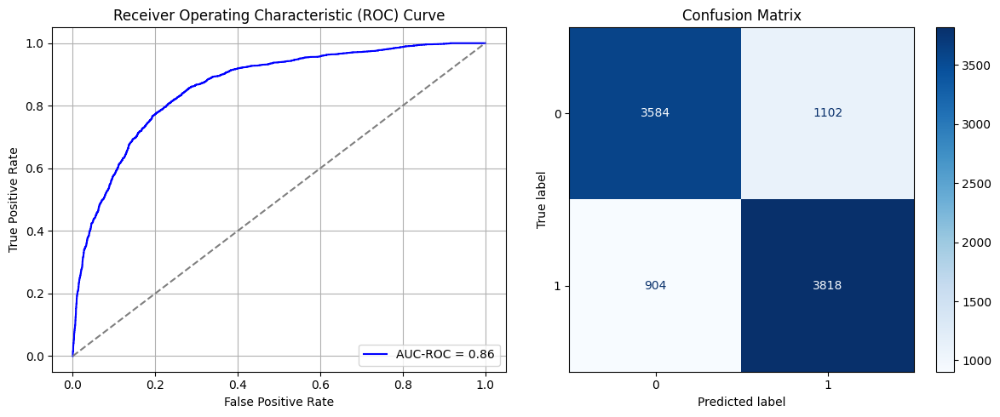

Best threshold based on F1-score: 0.42786791920661926
Time elapsed (performance): 48.51172602400004


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.5711 - loss: 0.6956 - val_AUC: 0.0000e+00 - val_loss: 0.8310
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7382 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.6880
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8052 - loss: 0.5211 - val_AUC: 0.0000e+00 - val_loss: 0.6544
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8223 - loss: 0.5028 - val_AUC: 0.0000e+00 - val_loss: 0.7151
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8265 - loss: 0.4962 - val_AUC: 0.0000e+00 - val_loss: 0.6759
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8346 - loss: 0.4904 - val_AUC: 0.0000e+00 - val_loss: 0.7322
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8386 - loss: 0.4788 - val_AUC: 0.0000e+00 - val_loss: 0.5681
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5699 - loss: 0.6987 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7441 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.6479
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7992 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.6728
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8242 - loss: 0.5005 - val_AUC: 0.0000e+00 - val_loss: 0.7413
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8348 - loss: 0.4856 - val_AUC: 0.0000e+00 - val_loss: 0.6549
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8386 - loss: 0.4810 - val_AUC: 0.0000e+00 - val_loss: 0.6458
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8347 - loss: 0.4850 - val_AUC: 0.0000e+00 - val_loss: 0.6964
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8461 - loss: 0.4708 - val_AUC: 0.0000e+00 - val_loss: 0.7349
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5741 - loss: 0.7015 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7433 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.6714
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7932 - loss: 0.5296 - val_AUC: 0.0000e+00 - val_loss: 0.5970
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8187 - loss: 0.5048 - val_AUC: 0.0000e+00 - val_loss: 0.6533
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8293 - loss: 0.4936 - val_AUC: 0.0000e+00 - val_loss: 0.6699
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8350 - loss: 0.4869 - val_AUC: 0.0000e+00 - val_loss: 0.6572
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8396 - loss: 0.4792 - val_AUC: 0.0000e+00 - val_loss: 0.6207
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8460 - loss: 0.4710 - val_AUC: 0.0000e+00 - val_loss: 0.7166
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.5693 - loss: 0.7046 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7414 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.7486
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7941 - loss: 0.5299 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8179 - loss: 0.5077 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8294 - loss: 0.4931 - val_AUC: 0.0000e+00 - val_loss: 0.7410
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8305 - loss: 0.4920 - val_AUC: 0.0000e+00 - val_loss: 0.6378
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8434 - loss: 0.4758 - val_AUC: 0.0000e+00 - val_loss: 0.7225
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8396 - loss: 0.4778 - val_AUC: 0.0000e+00 - val_loss: 0.6135
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5733 - loss: 0.6991 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7313 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.6637
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7994 - loss: 0.5239 - val_AUC: 0.0000e+00 - val_loss: 0.6410
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8200 - loss: 0.5039 - val_AUC: 0.0000e+00 - val_loss: 0.7813
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8269 - loss: 0.4979 - val_AUC: 0.0000e+00 - val_loss: 0.7064
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8325 - loss: 0.4913 - val_AUC: 0.0000e+00 - val_loss: 0.8053
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8387 - loss: 0.4807 - val_AUC: 0.0000e+00 - val_loss: 0.5855
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8415 - loss: 0.4779 - val_AUC: 0.0000e+00 - val_loss: 0.7695
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.5683 - loss: 0.6955 - val_AUC: 0.0000e+00 - val_loss: 0.8047
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7496 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8041 - loss: 0.5192 - val_AUC: 0.0000e+00 - val_loss: 0.6246
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8236 - loss: 0.5008 - val_AUC: 0.0000e+00 - val_loss: 0.8057
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8334 - loss: 0.4902 - val_AUC: 0.0000e+00 - val_loss: 0.6116
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8349 - loss: 0.4868 - val_AUC: 0.0000e+00 - val_loss: 0.7579
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8437 - loss: 0.4747 - val_AUC: 0.0000e+00 - val_loss: 0.6521
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.5663 - loss: 0.7025 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7394 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.7908
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7985 - loss: 0.5227 - val_AUC: 0.0000e+00 - val_loss: 0.6544
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.8169 - loss: 0.5072 - val_AUC: 0.0000e+00 - val_loss: 0.6734
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8298 - loss: 0.4935 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8343 - loss: 0.4883 - val_AUC: 0.0000e+00 - val_loss: 0.6207
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8365 - loss: 0.4803 - val_AUC: 0.0000e+00 - val_loss: 0.5938
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8433 - loss: 0.4766 - val_AUC: 0.0000e+00 - val_loss: 0.7725
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5740 - loss: 0.6937 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7431 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8462
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7945 - loss: 0.5271 - val_AUC: 0.0000e+00 - val_loss: 0.7828
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8222 - loss: 0.4983 - val_AUC: 0.0000e+00 - val_loss: 0.7687
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8342 - loss: 0.4899 - val_AUC: 0.0000e+00 - val_loss: 0.8097
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8373 - loss: 0.4841 - val_AUC: 0.0000e+00 - val_loss: 0.7117
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8408 - loss: 0.4772 - val_AUC: 0.0000e+00 - val_loss: 0.7012
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8427 - loss: 0.4783 - val_AUC: 0.0000e+00 - val_loss: 0.7428
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5765 - loss: 0.6899 - val_AUC: 0.0000e+00 - val_loss: 0.8323
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7429 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.7375
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8035 - loss: 0.5218 - val_AUC: 0.0000e+00 - val_loss: 0.7776
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8266 - loss: 0.4973 - val_AUC: 0.0000e+00 - val_loss: 0.6988
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8417 - loss: 0.4767 - val_AUC: 0.0000e+00 - val_loss: 0.4931
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8396 - loss: 0.4821 - val_AUC: 0.0000e+00 - val_loss: 0.6028
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8461 - loss: 0.4704 - val_AUC: 0.0000e+00 - val_loss: 0.7323
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8444 - loss: 0.4722 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5707 - loss: 0.6984 - val_AUC: 0.0000e+00 - val_loss: 0.7877
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7435 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.9247
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7926 - loss: 0.5306 - val_AUC: 0.0000e+00 - val_loss: 0.7733
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8213 - loss: 0.5061 - val_AUC: 0.0000e+00 - val_loss: 0.6528
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8279 - loss: 0.4949 - val_AUC: 0.0000e+00 - val_loss: 0.7080
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8318 - loss: 0.4896 - val_AUC: 0.0000e+00 - val_loss: 0.6546
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8353 - loss: 0.4837 - val_AUC: 0.0000e+00 - val_loss: 0.5881
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8448 - loss: 0.4734 - val_AUC: 0.0000e+00 - val_loss: 0.6620
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5662 - loss: 0.6994 - val_AUC: 0.0000e+00 - val_loss: 0.8282
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7428 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8175
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7973 - loss: 0.5262 - val_AUC: 0.0000e+00 - val_loss: 0.8020
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8209 - loss: 0.5043 - val_AUC: 0.0000e+00 - val_loss: 0.6497
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8345 - loss: 0.4873 - val_AUC: 0.0000e+00 - val_loss: 0.6374
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8346 - loss: 0.4883 - val_AUC: 0.0000e+00 - val_loss: 0.8074
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8399 - loss: 0.4809 - val_AUC: 0.0000e+00 - val_loss: 0.7094
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8387 - loss: 0.4826 - val_AUC: 0.0000e+00 - val_loss: 0.7179
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5760 - loss: 0.6929 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7475 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7990 - loss: 0.5243 - val_AUC: 0.0000e+00 - val_loss: 0.5854
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8199 - loss: 0.5044 - val_AUC: 0.0000e+00 - val_loss: 0.6273
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8356 - loss: 0.4866 - val_AUC: 0.0000e+00 - val_loss: 0.6646
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8408 - loss: 0.4803 - val_AUC: 0.0000e+00 - val_loss: 0.5046
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8379 - loss: 0.4794 - val_AUC: 0.0000e+00 - val_loss: 0.6490
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8420 - loss: 0.4743 - val_AUC: 0.0000e+00 - val_loss: 0.6094
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.5660 - loss: 0.7045 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7422 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8027 - loss: 0.5232 - val_AUC: 0.0000e+00 - val_loss: 0.6753
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8210 - loss: 0.5014 - val_AUC: 0.0000e+00 - val_loss: 0.7067
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8347 - loss: 0.4871 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8331 - loss: 0.4864 - val_AUC: 0.0000e+00 - val_loss: 0.6898
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8376 - loss: 0.4841 - val_AUC: 0.0000e+00 - val_loss: 0.6830
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.5783 - loss: 0.6934 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7521 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.7691
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8093 - loss: 0.5159 - val_AUC: 0.0000e+00 - val_loss: 0.6865
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8243 - loss: 0.5004 - val_AUC: 0.0000e+00 - val_loss: 0.7177
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8381 - loss: 0.4839 - val_AUC: 0.0000e+00 - val_loss: 0.7514
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8360 - loss: 0.4855 - val_AUC: 0.0000e+00 - val_loss: 0.6095
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8386 - loss: 0.4827 - val_AUC: 0.0000e+00 - val_loss: 0.7404
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8443 - loss: 0.4744 - val_AUC: 0.0000e+00 - val_loss: 0.5964
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.5831 - loss: 0.6912 - val_AUC: 0.0000e+00 - val_loss: 0.8184
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7472 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.7219
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7960 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.7611
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8217 - loss: 0.5006 - val_AUC: 0.0000e+00 - val_loss: 0.6416
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8347 - loss: 0.4865 - val_AUC: 0.0000e+00 - val_loss: 0.7492
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8383 - loss: 0.4817 - val_AUC: 0.0000e+00 - val_loss: 0.7408
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8391 - loss: 0.4811 - val_AUC: 0.0000e+00 - val_loss: 0.6834
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8431 - loss: 0.4741 - val_AUC: 0.0000e+00 - val_loss: 0.7538
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.5825 - loss: 0.6942 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7437 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.7906
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8008 - loss: 0.5216 - val_AUC: 0.0000e+00 - val_loss: 0.6499
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8184 - loss: 0.5054 - val_AUC: 0.0000e+00 - val_loss: 0.6391
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8349 - loss: 0.4856 - val_AUC: 0.0000e+00 - val_loss: 0.7023
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8318 - loss: 0.4918 - val_AUC: 0.0000e+00 - val_loss: 0.7505
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8399 - loss: 0.4793 - val_AUC: 0.0000e+00 - val_loss: 0.5936
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8433 - loss: 0.4739 - val_AUC: 0.0000e+00 - val_loss: 0.6061
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5651 - loss: 0.7004 - val_AUC: 0.0000e+00 - val_loss: 0.8039
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7453 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.7485
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8050 - loss: 0.5184 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8230 - loss: 0.5006 - val_AUC: 0.0000e+00 - val_loss: 0.7479
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8280 - loss: 0.4936 - val_AUC: 0.0000e+00 - val_loss: 0.7069
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8344 - loss: 0.4852 - val_AUC: 0.0000e+00 - val_loss: 0.7043
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8321 - loss: 0.4883 - val_AUC: 0.0000e+00 - val_loss: 0.7400
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.5656 - loss: 0.7016 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7412 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.7163
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7979 - loss: 0.5271 - val_AUC: 0.0000e+00 - val_loss: 0.8514
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8179 - loss: 0.5086 - val_AUC: 0.0000e+00 - val_loss: 0.7546
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8320 - loss: 0.4906 - val_AUC: 0.0000e+00 - val_loss: 0.6480
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8379 - loss: 0.4814 - val_AUC: 0.0000e+00 - val_loss: 0.6092
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8306 - loss: 0.4886 - val_AUC: 0.0000e+00 - val_loss: 0.6581
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8444 - loss: 0.4719 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.5755 - loss: 0.6971 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7424 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8039 - loss: 0.5221 - val_AUC: 0.0000e+00 - val_loss: 0.7970
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8243 - loss: 0.5001 - val_AUC: 0.0000e+00 - val_loss: 0.6818
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8313 - loss: 0.4931 - val_AUC: 0.0000e+00 - val_loss: 0.7187
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8396 - loss: 0.4822 - val_AUC: 0.0000e+00 - val_loss: 0.7313
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8327 - loss: 0.4893 - val_AUC: 0.0000e+00 - val_loss: 0.7565
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8504 - loss: 0.4647 - val_AUC: 0.0000e+00 - val_loss: 0.6358
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.5736 - loss: 0.6965 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7455 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.7229
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7965 - loss: 0.5293 - val_AUC: 0.0000e+00 - val_loss: 0.7419
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8292 - loss: 0.4946 - val_AUC: 0.0000e+00 - val_loss: 0.7437
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8304 - loss: 0.4883 - val_AUC: 0.0000e+00 - val_loss: 0.6843
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8405 - loss: 0.4804 - val_AUC: 0.0000e+00 - val_loss: 0.7181
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8414 - loss: 0.4756 - val_AUC: 0.0000e+00 - val_loss: 0.6305
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8402 - loss: 0.4773 - val_AUC: 0.0000e+00 - val_loss: 0.6309
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - AUC: 0.7372 - loss: 0.6052 - val_AUC: 0.8042 - val_loss: 0.5506
Epoch 2/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.7977 - loss: 0.5474 - val_AUC: 0.8029 - val_loss: 0.5370
Epoch 3/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.8138 - loss: 0.5268 - val_AUC: 0.8122 - val_loss: 0.5396
Epoch 4/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8111 - loss: 0.5271 - val_AUC: 0.8269 - val_loss: 0.5124
Epoch 5/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8240 - loss: 0.5108 - val_AUC: 0.8293 - val_loss: 0.5068
Epoch 6/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8338 - loss: 0.4990 - val_AUC: 0.8564 - val_loss: 0.4738
Epoch 7/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8564 - loss: 0.4710 - val_AUC: 0.8542 - val_loss: 0.4732
Epoch 8/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8606 - loss: 0.4629 - val_AUC: 0.8605 - val_loss: 0.4670
Epoch 9/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - 

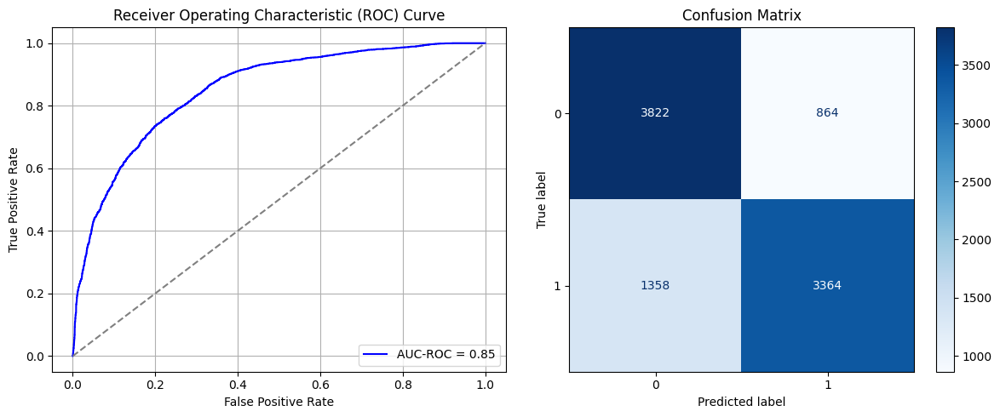

<ipython-input-28-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9977968335151672
Time elapsed (performance): 52.06837398199991


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7114 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7575 - loss: 0.5474 - val_AUC: 0.0000e+00 - val_loss: 0.7416
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7697 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.7706
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7776 - loss: 0.5334 - val_AUC: 0.0000e+00 - val_loss: 0.7654
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7931 - loss: 0.5212 - val_AUC: 0.0000e+00 - val_loss: 0.7326
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7989 - loss: 0.5179 - val_AUC: 0.0000e+00 - val_loss: 0.7027
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8123 - loss: 0.5017 - val_AUC: 0.0000e+00 - val_loss: 0.7490
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8241 - loss: 0.4923 - val_AUC: 0.0000e+00 - val_loss: 0.7111
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7186 - loss: 0.6231 - val_AUC: 0.0000e+00 - val_loss: 0.7356
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7621 - loss: 0.5452 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7620 - loss: 0.5458 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7835 - loss: 0.5297 - val_AUC: 0.0000e+00 - val_loss: 0.7843
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7900 - loss: 0.5243 - val_AUC: 0.0000e+00 - val_loss: 0.7724
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8053 - loss: 0.5054 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8110 - loss: 0.5065 - val_AUC: 0.0000e+00 - val_loss: 0.6739
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8154 - loss: 0.5009 - val_AUC: 0.0000e+00 - val_loss: 0.7486
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7217 - loss: 0.6318 - val_AUC: 0.0000e+00 - val_loss: 0.7986
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7565 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.8100
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7754 - loss: 0.5356 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7868 - loss: 0.5245 - val_AUC: 0.0000e+00 - val_loss: 0.7981
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7923 - loss: 0.5206 - val_AUC: 0.0000e+00 - val_loss: 0.7997
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8099 - loss: 0.5079 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8158 - loss: 0.4997 - val_AUC: 0.0000e+00 - val_loss: 0.6935
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8233 - loss: 0.4930 - val_AUC: 0.0000e+00 - val_loss: 0.7267
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7163 - loss: 0.6418 - val_AUC: 0.0000e+00 - val_loss: 0.8143
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7604 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7825
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7767 - loss: 0.5340 - val_AUC: 0.0000e+00 - val_loss: 0.8025
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7846 - loss: 0.5295 - val_AUC: 0.0000e+00 - val_loss: 0.8029
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7982 - loss: 0.5158 - val_AUC: 0.0000e+00 - val_loss: 0.7918
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8100 - loss: 0.5057 - val_AUC: 0.0000e+00 - val_loss: 0.7585
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8170 - loss: 0.4997 - val_AUC: 0.0000e+00 - val_loss: 0.6999
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8246 - loss: 0.4902 - val_AUC: 0.0000e+00 - val_loss: 0.6836
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7184 - loss: 0.6262 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7562 - loss: 0.5464 - val_AUC: 0.0000e+00 - val_loss: 0.8220
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7732 - loss: 0.5352 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7844 - loss: 0.5280 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7907 - loss: 0.5210 - val_AUC: 0.0000e+00 - val_loss: 0.7305
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8056 - loss: 0.5104 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8126 - loss: 0.5044 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8194 - loss: 0.4971 - val_AUC: 0.0000e+00 - val_loss: 0.7643
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7124 - loss: 0.6300 - val_AUC: 0.0000e+00 - val_loss: 0.7646
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7630 - loss: 0.5447 - val_AUC: 0.0000e+00 - val_loss: 0.7700
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7680 - loss: 0.5418 - val_AUC: 0.0000e+00 - val_loss: 0.7909
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7846 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.7868
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7946 - loss: 0.5184 - val_AUC: 0.0000e+00 - val_loss: 0.7597
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8073 - loss: 0.5102 - val_AUC: 0.0000e+00 - val_loss: 0.7870
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8193 - loss: 0.4983 - val_AUC: 0.0000e+00 - val_loss: 0.6861
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8308 - loss: 0.4842 - val_AUC: 0.0000e+00 - val_loss: 0.6191
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7168 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.8191
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7546 - loss: 0.5500 - val_AUC: 0.0000e+00 - val_loss: 0.7693
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7694 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.8177
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7831 - loss: 0.5295 - val_AUC: 0.0000e+00 - val_loss: 0.7708
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7999 - loss: 0.5154 - val_AUC: 0.0000e+00 - val_loss: 0.6887
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8106 - loss: 0.5077 - val_AUC: 0.0000e+00 - val_loss: 0.7850
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8113 - loss: 0.5049 - val_AUC: 0.0000e+00 - val_loss: 0.6964
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8277 - loss: 0.4899 - val_AUC: 0.0000e+00 - val_loss: 0.7715
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7213 - loss: 0.6351 - val_AUC: 0.0000e+00 - val_loss: 0.8411
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7601 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7706
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7680 - loss: 0.5402 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7829 - loss: 0.5299 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7957 - loss: 0.5221 - val_AUC: 0.0000e+00 - val_loss: 0.7356
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8073 - loss: 0.5088 - val_AUC: 0.0000e+00 - val_loss: 0.7452
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8165 - loss: 0.5006 - val_AUC: 0.0000e+00 - val_loss: 0.6312
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8263 - loss: 0.4918 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7206 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.8007
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7521 - loss: 0.5489 - val_AUC: 0.0000e+00 - val_loss: 0.8113
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7652 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7865 - loss: 0.5265 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7892 - loss: 0.5226 - val_AUC: 0.0000e+00 - val_loss: 0.7444
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8064 - loss: 0.5101 - val_AUC: 0.0000e+00 - val_loss: 0.6972
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8168 - loss: 0.4965 - val_AUC: 0.0000e+00 - val_loss: 0.6358
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8218 - loss: 0.4951 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7270 - loss: 0.6143 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7625 - loss: 0.5442 - val_AUC: 0.0000e+00 - val_loss: 0.7798
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7647 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7783 - loss: 0.5306 - val_AUC: 0.0000e+00 - val_loss: 0.8195
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7968 - loss: 0.5171 - val_AUC: 0.0000e+00 - val_loss: 0.8001
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8068 - loss: 0.5116 - val_AUC: 0.0000e+00 - val_loss: 0.7433
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8171 - loss: 0.5004 - val_AUC: 0.0000e+00 - val_loss: 0.6982
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8201 - loss: 0.4981 - val_AUC: 0.0000e+00 - val_loss: 0.6905
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7224 - loss: 0.6249 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7579 - loss: 0.5448 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7756 - loss: 0.5360 - val_AUC: 0.0000e+00 - val_loss: 0.8062
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7811 - loss: 0.5342 - val_AUC: 0.0000e+00 - val_loss: 0.7937
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7903 - loss: 0.5251 - val_AUC: 0.0000e+00 - val_loss: 0.7377
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8013 - loss: 0.5159 - val_AUC: 0.0000e+00 - val_loss: 0.7147
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8024 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.7248
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8158 - loss: 0.4976 - val_AUC: 0.0000e+00 - val_loss: 0.7127
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7163 - loss: 0.6269 - val_AUC: 0.0000e+00 - val_loss: 0.8218
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7603 - loss: 0.5489 - val_AUC: 0.0000e+00 - val_loss: 0.8034
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7717 - loss: 0.5394 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7821 - loss: 0.5336 - val_AUC: 0.0000e+00 - val_loss: 0.7623
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7912 - loss: 0.5223 - val_AUC: 0.0000e+00 - val_loss: 0.7822
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8069 - loss: 0.5113 - val_AUC: 0.0000e+00 - val_loss: 0.7651
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8110 - loss: 0.5061 - val_AUC: 0.0000e+00 - val_loss: 0.7713
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8234 - loss: 0.4918 - val_AUC: 0.0000e+00 - val_loss: 0.6086
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7150 - loss: 0.6419 - val_AUC: 0.0000e+00 - val_loss: 0.8100
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7642 - loss: 0.5454 - val_AUC: 0.0000e+00 - val_loss: 0.7963
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7716 - loss: 0.5363 - val_AUC: 0.0000e+00 - val_loss: 0.7692
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7822 - loss: 0.5298 - val_AUC: 0.0000e+00 - val_loss: 0.7003
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7970 - loss: 0.5187 - val_AUC: 0.0000e+00 - val_loss: 0.7034
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8008 - loss: 0.5149 - val_AUC: 0.0000e+00 - val_loss: 0.7543
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8155 - loss: 0.4976 - val_AUC: 0.0000e+00 - val_loss: 0.7657
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8271 - loss: 0.4885 - val_AUC: 0.0000e+00 - val_loss: 0.7472
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7272 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7567 - loss: 0.5478 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7785 - loss: 0.5313 - val_AUC: 0.0000e+00 - val_loss: 0.7694
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7819 - loss: 0.5305 - val_AUC: 0.0000e+00 - val_loss: 0.7485
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7979 - loss: 0.5165 - val_AUC: 0.0000e+00 - val_loss: 0.7951
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8101 - loss: 0.5059 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8205 - loss: 0.4956 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8246 - loss: 0.4933 - val_AUC: 0.0000e+00 - val_loss: 0.7025
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7211 - loss: 0.6240 - val_AUC: 0.0000e+00 - val_loss: 0.8185
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7581 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.7658
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7701 - loss: 0.5387 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7818 - loss: 0.5315 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7931 - loss: 0.5212 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7989 - loss: 0.5161 - val_AUC: 0.0000e+00 - val_loss: 0.7529
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8110 - loss: 0.5064 - val_AUC: 0.0000e+00 - val_loss: 0.7286
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8239 - loss: 0.4927 - val_AUC: 0.0000e+00 - val_loss: 0.6655
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7235 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.8254
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7576 - loss: 0.5480 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7724 - loss: 0.5373 - val_AUC: 0.0000e+00 - val_loss: 0.8243
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7783 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.7284
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7966 - loss: 0.5215 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8083 - loss: 0.5100 - val_AUC: 0.0000e+00 - val_loss: 0.6008
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8148 - loss: 0.5027 - val_AUC: 0.0000e+00 - val_loss: 0.8794
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8244 - loss: 0.4905 - val_AUC: 0.0000e+00 - val_loss: 0.8164
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7184 - loss: 0.6301 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7583 - loss: 0.5466 - val_AUC: 0.0000e+00 - val_loss: 0.7375
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7723 - loss: 0.5348 - val_AUC: 0.0000e+00 - val_loss: 0.8126
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7804 - loss: 0.5297 - val_AUC: 0.0000e+00 - val_loss: 0.7795
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7830 - loss: 0.5273 - val_AUC: 0.0000e+00 - val_loss: 0.7495
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8042 - loss: 0.5100 - val_AUC: 0.0000e+00 - val_loss: 0.6878
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8109 - loss: 0.5032 - val_AUC: 0.0000e+00 - val_loss: 0.7600
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8186 - loss: 0.4988 - val_AUC: 0.0000e+00 - val_loss: 0.7314
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7269 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7530 - loss: 0.5514 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7691 - loss: 0.5398 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7787 - loss: 0.5335 - val_AUC: 0.0000e+00 - val_loss: 0.8141
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7887 - loss: 0.5259 - val_AUC: 0.0000e+00 - val_loss: 0.6904
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7993 - loss: 0.5156 - val_AUC: 0.0000e+00 - val_loss: 0.6551
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8109 - loss: 0.5044 - val_AUC: 0.0000e+00 - val_loss: 0.6865
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8233 - loss: 0.4935 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7191 - loss: 0.6195 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7580 - loss: 0.5475 - val_AUC: 0.0000e+00 - val_loss: 0.8065
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7732 - loss: 0.5344 - val_AUC: 0.0000e+00 - val_loss: 0.7120
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7793 - loss: 0.5302 - val_AUC: 0.0000e+00 - val_loss: 0.7931
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7988 - loss: 0.5169 - val_AUC: 0.0000e+00 - val_loss: 0.6595
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8087 - loss: 0.5061 - val_AUC: 0.0000e+00 - val_loss: 0.6740
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8123 - loss: 0.5039 - val_AUC: 0.0000e+00 - val_loss: 0.7138
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8228 - loss: 0.4920 - val_AUC: 0.0000e+00 - val_loss: 0.6888
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7312 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.7890
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7613 - loss: 0.5436 - val_AUC: 0.0000e+00 - val_loss: 0.7994
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7695 - loss: 0.5360 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7801 - loss: 0.5320 - val_AUC: 0.0000e+00 - val_loss: 0.7858
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7978 - loss: 0.5164 - val_AUC: 0.0000e+00 - val_loss: 0.7434
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7994 - loss: 0.5169 - val_AUC: 0.0000e+00 - val_loss: 0.7499
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8123 - loss: 0.5040 - val_AUC: 0.0000e+00 - val_loss: 0.6967
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8187 - loss: 0.4990 - val_AUC: 0.0000e+00 - val_loss: 0.6965
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - AUC: 0.7347 - loss: 0.6054 - val_AUC: 0.8033 - val_loss: 0.5492
Epoch 2/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7941 - loss: 0.5515 - val_AUC: 0.8124 - val_loss: 0.5312
Epoch 3/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8080 - loss: 0.5335 - val_AUC: 0.8242 - val_loss: 0.5144
Epoch 4/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8241 - loss: 0.5124 - val_AUC: 0.8282 - val_loss: 0.5061
Epoch 5/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8259 - loss: 0.5088 - val_AUC: 0.8309 - val_loss: 0.5027
Epoch 6/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8401 - loss: 0.4901 - val_AUC: 0.8540 - val_loss: 0.4734
Epoch 7/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8522 - loss: 0.4768 - val_AUC: 0.8591 - val_loss: 0.4705
Epoch 8/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8582 - loss: 0.4670 - val_AUC: 0.8620 - val_loss: 0.4666
Epoch 9/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - 

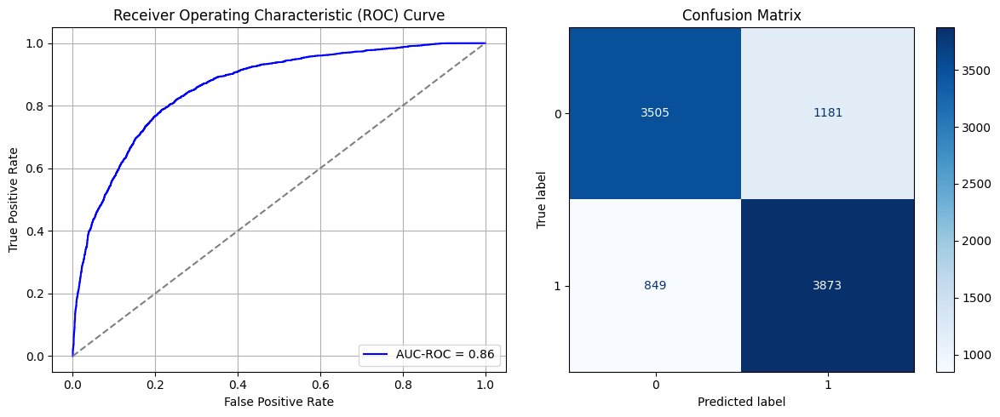

Best threshold based on F1-score: 0.3998119533061981
Time elapsed (performance): 49.797505022999985


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6398 - loss: 0.6478 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7159 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.7758
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7499 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8302
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7781 - loss: 0.5419 - val_AUC: 0.0000e+00 - val_loss: 0.7500
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7911 - loss: 0.5294 - val_AUC: 0.0000e+00 - val_loss: 0.5653
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7976 - loss: 0.5168 - val_AUC: 0.0000e+00 - val_loss: 0.7176
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8093 - loss: 0.5037 - val_AUC: 0.0000e+00 - val_loss: 0.7872
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8105 - loss: 0.5032 - val_AUC: 0.0000e+00 - val_loss: 0.6976
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6341 - loss: 0.6471 - val_AUC: 0.0000e+00 - val_loss: 0.8119
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7163 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7430 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8005
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7683 - loss: 0.5487 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7924 - loss: 0.5264 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8020 - loss: 0.5162 - val_AUC: 0.0000e+00 - val_loss: 0.7168
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8080 - loss: 0.5063 - val_AUC: 0.0000e+00 - val_loss: 0.6681
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8149 - loss: 0.5002 - val_AUC: 0.0000e+00 - val_loss: 0.7560
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6341 - loss: 0.6484 - val_AUC: 0.0000e+00 - val_loss: 0.8868
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7144 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9420
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7447 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8317
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7758 - loss: 0.5446 - val_AUC: 0.0000e+00 - val_loss: 0.7142
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7884 - loss: 0.5302 - val_AUC: 0.0000e+00 - val_loss: 0.7120
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7971 - loss: 0.5209 - val_AUC: 0.0000e+00 - val_loss: 0.7414
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8041 - loss: 0.5101 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8135 - loss: 0.5035 - val_AUC: 0.0000e+00 - val_loss: 0.7591
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6329 - loss: 0.6438 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7163 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7494 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.7909
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7739 - loss: 0.5437 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7942 - loss: 0.5263 - val_AUC: 0.0000e+00 - val_loss: 0.7436
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7996 - loss: 0.5170 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8021 - loss: 0.5122 - val_AUC: 0.0000e+00 - val_loss: 0.7540
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8128 - loss: 0.5045 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6348 - loss: 0.6511 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7186 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.7728
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7586 - loss: 0.5588 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7775 - loss: 0.5431 - val_AUC: 0.0000e+00 - val_loss: 0.8046
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7906 - loss: 0.5279 - val_AUC: 0.0000e+00 - val_loss: 0.7835
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8023 - loss: 0.5116 - val_AUC: 0.0000e+00 - val_loss: 0.6393
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8079 - loss: 0.5100 - val_AUC: 0.0000e+00 - val_loss: 0.7471
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8182 - loss: 0.4965 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - AUC: 0.6345 - loss: 0.6390 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7170 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7478 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.7859
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7647 - loss: 0.5504 - val_AUC: 0.0000e+00 - val_loss: 0.7831
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7895 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.6710
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8018 - loss: 0.5147 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8042 - loss: 0.5144 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8084 - loss: 0.5079 - val_AUC: 0.0000e+00 - val_loss: 0.6929
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6273 - loss: 0.6465 - val_AUC: 0.0000e+00 - val_loss: 0.8321
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7151 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7420 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.7696
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7686 - loss: 0.5483 - val_AUC: 0.0000e+00 - val_loss: 0.6207
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7870 - loss: 0.5326 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8002 - loss: 0.5175 - val_AUC: 0.0000e+00 - val_loss: 0.6755
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8002 - loss: 0.5155 - val_AUC: 0.0000e+00 - val_loss: 0.7324
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8127 - loss: 0.5033 - val_AUC: 0.0000e+00 - val_loss: 0.6721
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6322 - loss: 0.6447 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7123 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7515 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.9030
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7662 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.7250
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7922 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8014 - loss: 0.5143 - val_AUC: 0.0000e+00 - val_loss: 0.6967
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8093 - loss: 0.5054 - val_AUC: 0.0000e+00 - val_loss: 0.7607
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8187 - loss: 0.4983 - val_AUC: 0.0000e+00 - val_loss: 0.8620
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6346 - loss: 0.6458 - val_AUC: 0.0000e+00 - val_loss: 0.8302
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7126 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8146
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7501 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7804 - loss: 0.5361 - val_AUC: 0.0000e+00 - val_loss: 0.6926
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7929 - loss: 0.5274 - val_AUC: 0.0000e+00 - val_loss: 0.7548
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8007 - loss: 0.5139 - val_AUC: 0.0000e+00 - val_loss: 0.6537
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8091 - loss: 0.5075 - val_AUC: 0.0000e+00 - val_loss: 0.7715
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8149 - loss: 0.4975 - val_AUC: 0.0000e+00 - val_loss: 0.7243
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6323 - loss: 0.6476 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7171 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7495 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.6790
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7764 - loss: 0.5426 - val_AUC: 0.0000e+00 - val_loss: 0.6922
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7969 - loss: 0.5226 - val_AUC: 0.0000e+00 - val_loss: 0.7318
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8047 - loss: 0.5159 - val_AUC: 0.0000e+00 - val_loss: 0.8261
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8100 - loss: 0.5057 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8143 - loss: 0.5032 - val_AUC: 0.0000e+00 - val_loss: 0.6810
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6381 - loss: 0.6511 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7112 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.7584
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7494 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.7925
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7777 - loss: 0.5441 - val_AUC: 0.0000e+00 - val_loss: 0.7717
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7878 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7994 - loss: 0.5168 - val_AUC: 0.0000e+00 - val_loss: 0.8052
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8104 - loss: 0.5030 - val_AUC: 0.0000e+00 - val_loss: 0.6842
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8089 - loss: 0.5068 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6424 - loss: 0.6451 - val_AUC: 0.0000e+00 - val_loss: 0.9552
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7152 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.7472
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7471 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8013
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7727 - loss: 0.5460 - val_AUC: 0.0000e+00 - val_loss: 0.8197
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7897 - loss: 0.5307 - val_AUC: 0.0000e+00 - val_loss: 0.7375
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8046 - loss: 0.5103 - val_AUC: 0.0000e+00 - val_loss: 0.7347
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8031 - loss: 0.5120 - val_AUC: 0.0000e+00 - val_loss: 0.7369
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8129 - loss: 0.5042 - val_AUC: 0.0000e+00 - val_loss: 0.7135
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6397 - loss: 0.6432 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7143 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7468 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.7697
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7794 - loss: 0.5405 - val_AUC: 0.0000e+00 - val_loss: 0.7686
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7917 - loss: 0.5271 - val_AUC: 0.0000e+00 - val_loss: 0.6454
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8019 - loss: 0.5166 - val_AUC: 0.0000e+00 - val_loss: 0.7691
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8063 - loss: 0.5093 - val_AUC: 0.0000e+00 - val_loss: 0.6563
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8157 - loss: 0.5004 - val_AUC: 0.0000e+00 - val_loss: 0.6298
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6387 - loss: 0.6452 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7162 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.7608
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7484 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.7509
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7844 - loss: 0.5359 - val_AUC: 0.0000e+00 - val_loss: 0.7335
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7917 - loss: 0.5251 - val_AUC: 0.0000e+00 - val_loss: 0.7236
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8049 - loss: 0.5129 - val_AUC: 0.0000e+00 - val_loss: 0.6836
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8083 - loss: 0.5093 - val_AUC: 0.0000e+00 - val_loss: 0.7342
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8178 - loss: 0.4967 - val_AUC: 0.0000e+00 - val_loss: 0.7442
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.6344 - loss: 0.6506 - val_AUC: 0.0000e+00 - val_loss: 0.9821
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7114 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.7933
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7470 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.7641
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7726 - loss: 0.5449 - val_AUC: 0.0000e+00 - val_loss: 0.7368
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7888 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.7940
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8038 - loss: 0.5158 - val_AUC: 0.0000e+00 - val_loss: 0.7102
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8121 - loss: 0.5063 - val_AUC: 0.0000e+00 - val_loss: 0.8133
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8119 - loss: 0.5057 - val_AUC: 0.0000e+00 - val_loss: 0.7060
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6390 - loss: 0.6447 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7197 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.7967
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7569 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7801 - loss: 0.5399 - val_AUC: 0.0000e+00 - val_loss: 0.7071
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7923 - loss: 0.5218 - val_AUC: 0.0000e+00 - val_loss: 0.7574
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8017 - loss: 0.5174 - val_AUC: 0.0000e+00 - val_loss: 0.6525
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8072 - loss: 0.5079 - val_AUC: 0.0000e+00 - val_loss: 0.7099
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8125 - loss: 0.5027 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6300 - loss: 0.6461 - val_AUC: 0.0000e+00 - val_loss: 0.9715
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7158 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.7880
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7432 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7742 - loss: 0.5433 - val_AUC: 0.0000e+00 - val_loss: 0.7212
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7904 - loss: 0.5259 - val_AUC: 0.0000e+00 - val_loss: 0.7364
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7963 - loss: 0.5190 - val_AUC: 0.0000e+00 - val_loss: 0.7158
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8147 - loss: 0.5002 - val_AUC: 0.0000e+00 - val_loss: 0.7556
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8181 - loss: 0.5007 - val_AUC: 0.0000e+00 - val_loss: 0.5570
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6274 - loss: 0.6425 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7159 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7499 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8259
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7721 - loss: 0.5482 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7844 - loss: 0.5365 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8025 - loss: 0.5173 - val_AUC: 0.0000e+00 - val_loss: 0.7532
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8077 - loss: 0.5106 - val_AUC: 0.0000e+00 - val_loss: 0.7320
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8109 - loss: 0.5035 - val_AUC: 0.0000e+00 - val_loss: 0.6943
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6335 - loss: 0.6519 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7207 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.7448
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7597 - loss: 0.5582 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7840 - loss: 0.5377 - val_AUC: 0.0000e+00 - val_loss: 0.7756
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7954 - loss: 0.5249 - val_AUC: 0.0000e+00 - val_loss: 0.7171
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8011 - loss: 0.5183 - val_AUC: 0.0000e+00 - val_loss: 0.8220
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8162 - loss: 0.4972 - val_AUC: 0.0000e+00 - val_loss: 0.7912
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8101 - loss: 0.5043 - val_AUC: 0.0000e+00 - val_loss: 0.7802
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6343 - loss: 0.6426 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7162 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8300
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7510 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.7160
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7793 - loss: 0.5424 - val_AUC: 0.0000e+00 - val_loss: 0.6323
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7935 - loss: 0.5257 - val_AUC: 0.0000e+00 - val_loss: 0.7454
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8043 - loss: 0.5139 - val_AUC: 0.0000e+00 - val_loss: 0.7370
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8093 - loss: 0.5046 - val_AUC: 0.0000e+00 - val_loss: 0.7596
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8204 - loss: 0.4937 - val_AUC: 0.0000e+00 - val_loss: 0.6857
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - AUC: 0.7259 - loss: 0.6110 - val_AUC: 0.8033 - val_loss: 0.5492
Epoch 2/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7913 - loss: 0.5546 - val_AUC: 0.8117 - val_loss: 0.5362
Epoch 3/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - AUC: 0.8056 - loss: 0.5355 - val_AUC: 0.8165 - val_loss: 0.5276
Epoch 4/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - AUC: 0.8132 - loss: 0.5257 - val_AUC: 0.8240 - val_loss: 0.5176
Epoch 5/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.8222 - loss: 0.5135 - val_AUC: 0.8260 - val_loss: 0.5261
Epoch 6/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8236 - loss: 0.5119 - val_AUC: 0.8308 - val_loss: 0.5024
Epoch 7/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8333 - loss: 0.4973 - val_AUC: 0.8372 - val_loss: 0.4949
Epoch 8/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.8395 - loss: 0.4904 - val_AUC: 0.8479 - val_loss: 0.4825
Epoch 9/10
941/941 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - 

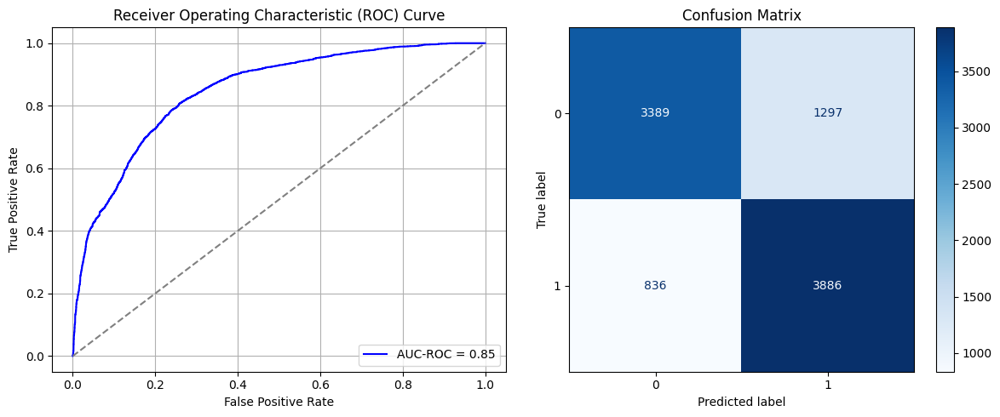

<ipython-input-28-93669339d7ff>:78: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


Best threshold based on F1-score: 0.9950153827667236
Time elapsed (performance): 67.05298989499988


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7036 - loss: 0.7034 - val_AUC: 0.0000e+00 - val_loss: 0.8089
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7553 - loss: 0.5524 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7790 - loss: 0.5342 - val_AUC: 0.0000e+00 - val_loss: 0.7429
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7902 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.6618
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7970 - loss: 0.5138 - val_AUC: 0.0000e+00 - val_loss: 0.6134
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8047 - loss: 0.5074 - val_AUC: 0.0000e+00 - val_loss: 0.7303
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8146 - loss: 0.5000 - val_AUC: 0.0000e+00 - val_loss: 0.7504
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8159 - loss: 0.4968 - val_AUC: 0.0000e+00 - val_loss: 0.6447
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.6978 - loss: 0.7446 - val_AUC: 0.0000e+00 - val_loss: 0.7789
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7541 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.6634
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7690 - loss: 0.5423 - val_AUC: 0.0000e+00 - val_loss: 0.8015
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7909 - loss: 0.5238 - val_AUC: 0.0000e+00 - val_loss: 0.8109
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7991 - loss: 0.5148 - val_AUC: 0.0000e+00 - val_loss: 0.5930
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8024 - loss: 0.5124 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8121 - loss: 0.5037 - val_AUC: 0.0000e+00 - val_loss: 0.6717
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8115 - loss: 0.5033 - val_AUC: 0.0000e+00 - val_loss: 0.5724
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.7057 - loss: 0.7322 - val_AUC: 0.0000e+00 - val_loss: 0.7606
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7481 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7752 - loss: 0.5353 - val_AUC: 0.0000e+00 - val_loss: 0.7921
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7957 - loss: 0.5225 - val_AUC: 0.0000e+00 - val_loss: 0.7266
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8032 - loss: 0.5121 - val_AUC: 0.0000e+00 - val_loss: 0.6725
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8081 - loss: 0.5071 - val_AUC: 0.0000e+00 - val_loss: 0.7072
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8095 - loss: 0.5029 - val_AUC: 0.0000e+00 - val_loss: 0.7152
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8172 - loss: 0.4977 - val_AUC: 0.0000e+00 - val_loss: 0.8086
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7046 - loss: 0.7146 - val_AUC: 0.0000e+00 - val_loss: 0.8953
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7466 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.7169
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7763 - loss: 0.5352 - val_AUC: 0.0000e+00 - val_loss: 0.8068
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7872 - loss: 0.5286 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7968 - loss: 0.5154 - val_AUC: 0.0000e+00 - val_loss: 0.7429
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8068 - loss: 0.5077 - val_AUC: 0.0000e+00 - val_loss: 0.7342
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8149 - loss: 0.4999 - val_AUC: 0.0000e+00 - val_loss: 0.6662
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8159 - loss: 0.4974 - val_AUC: 0.0000e+00 - val_loss: 0.5688
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.6958 - loss: 0.7602 - val_AUC: 0.0000e+00 - val_loss: 0.7854
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7498 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.7354
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7745 - loss: 0.5374 - val_AUC: 0.0000e+00 - val_loss: 0.7884
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7888 - loss: 0.5272 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7973 - loss: 0.5161 - val_AUC: 0.0000e+00 - val_loss: 0.6689
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8078 - loss: 0.5051 - val_AUC: 0.0000e+00 - val_loss: 0.7476
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8083 - loss: 0.5056 - val_AUC: 0.0000e+00 - val_loss: 0.6298
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8142 - loss: 0.4998 - val_AUC: 0.0000e+00 - val_loss: 0.7084
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6976 - loss: 0.7599 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7543 - loss: 0.5549 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7778 - loss: 0.5357 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7860 - loss: 0.5288 - val_AUC: 0.0000e+00 - val_loss: 0.6821
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7963 - loss: 0.5179 - val_AUC: 0.0000e+00 - val_loss: 0.6967
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8047 - loss: 0.5085 - val_AUC: 0.0000e+00 - val_loss: 0.6829
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8091 - loss: 0.5019 - val_AUC: 0.0000e+00 - val_loss: 0.7862
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8099 - loss: 0.5051 - val_AUC: 0.0000e+00 - val_loss: 0.7076
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7061 - loss: 0.7105 - val_AUC: 0.0000e+00 - val_loss: 0.9368
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7512 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.8096
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7733 - loss: 0.5371 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7912 - loss: 0.5223 - val_AUC: 0.0000e+00 - val_loss: 0.6668
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7923 - loss: 0.5221 - val_AUC: 0.0000e+00 - val_loss: 0.8037
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8059 - loss: 0.5087 - val_AUC: 0.0000e+00 - val_loss: 0.6934
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8097 - loss: 0.5044 - val_AUC: 0.0000e+00 - val_loss: 0.8232
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8156 - loss: 0.4996 - val_AUC: 0.0000e+00 - val_loss: 0.7246
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7046 - loss: 0.7285 - val_AUC: 0.0000e+00 - val_loss: 0.7932
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7500 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8093
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7749 - loss: 0.5393 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7887 - loss: 0.5235 - val_AUC: 0.0000e+00 - val_loss: 0.7975
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7985 - loss: 0.5178 - val_AUC: 0.0000e+00 - val_loss: 0.7350
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8084 - loss: 0.5081 - val_AUC: 0.0000e+00 - val_loss: 0.6278
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8069 - loss: 0.5098 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8105 - loss: 0.5028 - val_AUC: 0.0000e+00 - val_loss: 0.6018
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - AUC: 0.7038 - loss: 0.7177 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7548 - loss: 0.5562 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7709 - loss: 0.5389 - val_AUC: 0.0000e+00 - val_loss: 0.7733
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7869 - loss: 0.5291 - val_AUC: 0.0000e+00 - val_loss: 0.7818
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8030 - loss: 0.5132 - val_AUC: 0.0000e+00 - val_loss: 0.8075
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8110 - loss: 0.5041 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8093 - loss: 0.5050 - val_AUC: 0.0000e+00 - val_loss: 0.6216
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8166 - loss: 0.4991 - val_AUC: 0.0000e+00 - val_loss: 0.6490
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6969 - loss: 0.7688 - val_AUC: 0.0000e+00 - val_loss: 0.8065
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7564 - loss: 0.5530 - val_AUC: 0.0000e+00 - val_loss: 0.7798
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7759 - loss: 0.5381 - val_AUC: 0.0000e+00 - val_loss: 0.8130
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.7907 - loss: 0.5242 - val_AUC: 0.0000e+00 - val_loss: 0.6375
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7990 - loss: 0.5146 - val_AUC: 0.0000e+00 - val_loss: 0.7893
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8044 - loss: 0.5088 - val_AUC: 0.0000e+00 - val_loss: 0.7695
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8085 - loss: 0.5048 - val_AUC: 0.0000e+00 - val_loss: 0.9498
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8137 - loss: 0.4998 - val_AUC: 0.0000e+00 - val_loss: 0.6774
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7023 - loss: 0.7439 - val_AUC: 0.0000e+00 - val_loss: 0.7584
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7575 - loss: 0.5511 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7752 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.7158
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7846 - loss: 0.5301 - val_AUC: 0.0000e+00 - val_loss: 0.7682
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8003 - loss: 0.5140 - val_AUC: 0.0000e+00 - val_loss: 0.7373
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8018 - loss: 0.5122 - val_AUC: 0.0000e+00 - val_loss: 0.7534
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8069 - loss: 0.5056 - val_AUC: 0.0000e+00 - val_loss: 0.6827
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8137 - loss: 0.5004 - val_AUC: 0.0000e+00 - val_loss: 0.7340
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.7007 - loss: 0.7257 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7613 - loss: 0.5486 - val_AUC: 0.0000e+00 - val_loss: 0.7810
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7741 - loss: 0.5376 - val_AUC: 0.0000e+00 - val_loss: 0.7537
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7907 - loss: 0.5277 - val_AUC: 0.0000e+00 - val_loss: 0.6277
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7980 - loss: 0.5149 - val_AUC: 0.0000e+00 - val_loss: 0.6878
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8114 - loss: 0.5056 - val_AUC: 0.0000e+00 - val_loss: 0.6986
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.8097 - loss: 0.5051 - val_AUC: 0.0000e+00 - val_loss: 0.6836
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8210 - loss: 0.4928 - val_AUC: 0.0000e+00 - val_loss: 0.6748
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.6965 - loss: 0.7317 - val_AUC: 0.0000e+00 - val_loss: 0.7755
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7476 - loss: 0.5580 - val_AUC: 0.0000e+00 - val_loss: 0.7438
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7704 - loss: 0.5413 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7885 - loss: 0.5243 - val_AUC: 0.0000e+00 - val_loss: 0.7750
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7990 - loss: 0.5159 - val_AUC: 0.0000e+00 - val_loss: 0.8464
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8054 - loss: 0.5058 - val_AUC: 0.0000e+00 - val_loss: 0.7739
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8086 - loss: 0.5060 - val_AUC: 0.0000e+00 - val_loss: 0.7491
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8126 - loss: 0.4983 - val_AUC: 0.0000e+00 - val_loss: 0.6284
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7112 - loss: 0.7189 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7572 - loss: 0.5506 - val_AUC: 0.0000e+00 - val_loss: 0.7738
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7846 - loss: 0.5311 - val_AUC: 0.0000e+00 - val_loss: 0.7959
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7914 - loss: 0.5250 - val_AUC: 0.0000e+00 - val_loss: 0.7660
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8031 - loss: 0.5122 - val_AUC: 0.0000e+00 - val_loss: 0.7689
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8079 - loss: 0.5052 - val_AUC: 0.0000e+00 - val_loss: 0.5893
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8134 - loss: 0.4988 - val_AUC: 0.0000e+00 - val_loss: 0.7089
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8190 - loss: 0.4956 - val_AUC: 0.0000e+00 - val_loss: 0.7346
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6930 - loss: 0.7577 - val_AUC: 0.0000e+00 - val_loss: 0.8071
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7514 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.7885
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.7722 - loss: 0.5390 - val_AUC: 0.0000e+00 - val_loss: 0.7751
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7883 - loss: 0.5247 - val_AUC: 0.0000e+00 - val_loss: 0.7658
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7930 - loss: 0.5212 - val_AUC: 0.0000e+00 - val_loss: 0.6871
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8060 - loss: 0.5091 - val_AUC: 0.0000e+00 - val_loss: 0.7463
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8095 - loss: 0.5040 - val_AUC: 0.0000e+00 - val_loss: 0.7571
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.8163 - loss: 0.4969 - val_AUC: 0.0000e+00 - val_loss: 0.7840
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6989 - loss: 0.7425 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.7555 - loss: 0.5529 - val_AUC: 0.0000e+00 - val_loss: 0.8010
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7796 - loss: 0.5328 - val_AUC: 0.0000e+00 - val_loss: 0.7679
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7972 - loss: 0.5187 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8004 - loss: 0.5126 - val_AUC: 0.0000e+00 - val_loss: 0.7048
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8094 - loss: 0.5019 - val_AUC: 0.0000e+00 - val_loss: 0.7090
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8135 - loss: 0.4996 - val_AUC: 0.0000e+00 - val_loss: 0.7746
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8154 - loss: 0.4974 - val_AUC: 0.0000e+00 - val_loss: 0.7950
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7006 - loss: 0.7388 - val_AUC: 0.0000e+00 - val_loss: 0.7814
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7488 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.7832
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7723 - loss: 0.5382 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7889 - loss: 0.5260 - val_AUC: 0.0000e+00 - val_loss: 0.7656
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.7958 - loss: 0.5161 - val_AUC: 0.0000e+00 - val_loss: 0.7462
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.8019 - loss: 0.5104 - val_AUC: 0.0000e+00 - val_loss: 0.7664
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8072 - loss: 0.5053 - val_AUC: 0.0000e+00 - val_loss: 0.6484
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8158 - loss: 0.4974 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6853 - loss: 0.7841 - val_AUC: 0.0000e+00 - val_loss: 0.8589
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.7467 - loss: 0.5609 - val_AUC: 0.0000e+00 - val_loss: 0.8784
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7726 - loss: 0.5379 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7866 - loss: 0.5256 - val_AUC: 0.0000e+00 - val_loss: 0.6989
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7990 - loss: 0.5141 - val_AUC: 0.0000e+00 - val_loss: 0.7819
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8083 - loss: 0.5074 - val_AUC: 0.0000e+00 - val_loss: 0.7647
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8090 - loss: 0.5044 - val_AUC: 0.0000e+00 - val_loss: 0.5764
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8130 - loss: 0.5023 - val_AUC: 0.0000e+00 - val_loss: 0.6880
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.6912 - loss: 0.7433 - val_AUC: 0.0000e+00 - val_loss: 0.7716
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7530 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.7749
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7775 - loss: 0.5350 - val_AUC: 0.0000e+00 - val_loss: 0.7224
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7895 - loss: 0.5237 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7961 - loss: 0.5161 - val_AUC: 0.0000e+00 - val_loss: 0.7440
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.8105 - loss: 0.5071 - val_AUC: 0.0000e+00 - val_loss: 0.6899
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.8199 - loss: 0.4933 - val_AUC: 0.0000e+00 - val_loss: 0.7069
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8156 - loss: 0.4987 - val_AUC: 0.0000e+00 - val_loss: 0.7270
Epoch 9/10
556/556 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │           832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169 (28.00 KB)

 Trainable params: 7,169 (28.00 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


556/556 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.6923 - loss: 0.7610 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 2/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7498 - loss: 0.5558 - val_AUC: 0.0000e+00 - val_loss: 0.7304
Epoch 3/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7788 - loss: 0.5351 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 4/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7844 - loss: 0.5279 - val_AUC: 0.0000e+00 - val_loss: 0.7240
Epoch 5/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.8041 - loss: 0.5128 - val_AUC: 0.0000e+00 - val_loss: 0.8328
Epoch 6/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8022 - loss: 0.5116 - val_AUC: 0.0000e+00 - val_loss: 0.7111
Epoch 7/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8125 - loss: 0.5021 - val_AUC: 0.0000e+00 - val_loss: 0.6919
Epoch 8/10
556/556 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8159 - loss: 0.4987 - val_AUC: 0.0000e+00 - val_loss: 0.7693
Epoch 9/10
556/556 ━━━━━━━━━━━━━━━━

In [ ]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [ ]:
print(ParamFit)
ParamFit.to_csv('Sy_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.111390  0.350725
1   0.094198  0.385507
2   0.123209  0.330435
3   0.122851  0.342029
4   0.145057  0.301449
..       ...       ...
95  0.198782  0.324638
96  0.110315  0.510145
97  0.117479  0.478261
98  0.169413  0.376812
99  0.143266  0.426087

[100 rows x 2 columns]


In [ ]:
ParamFit['FNR'].mean()

np.float64(0.39437681159420296)